# EVENTI WORST CASE SC25

# MAY 2024

## GOES DATA 

In [ ]:
pip install xarray netCDF4


  Using cached xarray-2025.11.0-py3-none-any.whl.metadata (12 kB)
  Using cached netcdf4-1.7.3-cp311-abi3-win_amd64.whl.metadata (1.9 kB)
  Using cached cftime-1.6.5-cp313-cp313-win_amd64.whl.metadata (8.8 kB)
  Using cached certifi-2025.11.12-py3-none-any.whl.metadata (2.5 kB)
Using cached xarray-2025.11.0-py3-none-any.whl (1.4 MB)
Using cached netcdf4-1.7.3-cp311-abi3-win_amd64.whl (7.1 MB)
Using cached certifi-2025.11.12-py3-none-any.whl (159 kB)
Using cached cftime-1.6.5-cp313-cp313-win_amd64.whl (465 kB)

   -------------------- ------------------- 2/4 [netCDF4]
   -------------------- ------------------- 2/4 [netCDF4]
   -------------------- ------------------- 2/4 [netCDF4]
   -------------------- ------------------- 2/4 [netCDF4]
   -------------------- ------------------- 2/4 [netCDF4]
   ------------------------------ --------- 3/4 [xarray]
   ------------------------------ --------- 3/4 [xarray]
   ------------------------------ --------- 3/4 [xarray]
   --------------------

In [1]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import glob
import numpy as np
import matplotlib as mpl
import os

# =============================================================================
# 2. RICERCA FILE E CARICAMENTO
# =============================================================================
folder_path = os.path.join("File_scaricati_eventiSEP", "EVENTO MAY 2024")
search_pattern = os.path.join(folder_path, "*.nc")



print(f"🔎 Cerco file in: {search_pattern}")
files = sorted(glob.glob(search_pattern))

if not files:
    print("❌ ERRORE: Nessun file trovato! Controlla il percorso.")
else:
    print(f"✅ Trovati {len(files)} file. Unione manuale in corso...")

    dataframes_list = []
    
    # Ciclo manuale per evitare errori Dask
    for f in files:
        try:
            with xr.open_dataset(f) as ds:
                df_temp = ds.to_dataframe()
                df_temp.reset_index(inplace=True)
                
                # Ottimizzazione: teniamo solo il flusso protoni e sensore Ovest (unit 0)
                if 'AvgDiffProtonFlux' in df_temp.columns:
                    df_temp = df_temp[df_temp['sensor_units'] == 0].copy()
                    dataframes_list.append(df_temp)
        except Exception as e:
            print(f"⚠️ Salto {os.path.basename(f)}: {e}")

    if dataframes_list:
        # Unione di tutti i DataFrame giornalieri
        df_proton = pd.concat(dataframes_list, ignore_index=True)
        print(f"Righe grezze totali: {len(df_proton)}")

        # --- CORREZIONE DUPLICATI ---
        # Fondamentale per file giornalieri che si sovrappongono a mezzanotte
        df_proton = df_proton.drop_duplicates(subset=['time', 'diff_channels'], keep='first')
        print(f"Righe pulite (senza duplicati): {len(df_proton)}")

🔎 Cerco file in: File_scaricati_eventiSEP\EVENTO MAY 2024\*.nc
✅ Trovati 31 file. Unione manuale in corso...
Righe grezze totali: 1276704
Righe pulite (senza duplicati): 116064


Cerco file in: File_scaricati_eventiSEP\EVENTO MAY 2024\*.nc
Trovati 31 file.

✅ Dataset GOES-18 creato con successo!
Righe totali: 8928
Range Temporale: 2024-05-01 00:00:00 -> 2024-05-31 23:55:00
Canali Trovati (Indici): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


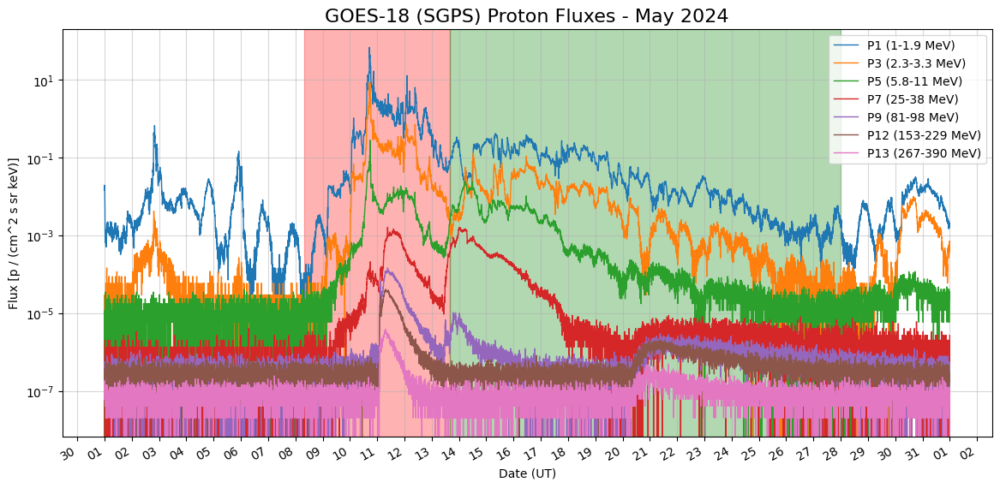

In [3]:
# PLOT 

import xarray as xr
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ==========================================
# 1. CONFIGURAZIONE PERCORSI
# ==========================================
# Percorso della cartella contenente i file .nc di Maggio 2024
folder_path = os.path.join("File_scaricati_eventiSEP", "EVENTO MAY 2024")
search_pattern = os.path.join(folder_path, "*.nc")

print(f"Cerco file in: {search_pattern}")
files = sorted(glob.glob(search_pattern))
print(f"Trovati {len(files)} file.")
def load_goes_netcdf_with_uncert(file_list):
    flux_list = []
    uncert_list = []
    
    for f in file_list:
        try:
            with xr.open_dataset(f) as ds:
                if 'AvgDiffProtonFlux' in ds and 'AvgDiffProtonFluxUncert' in ds:
                    # Estrazione Flusso
                    da_flux = ds['AvgDiffProtonFlux'].sel(sensor_units=0, drop=True)
                    df_flux = da_flux.to_dataframe().reset_index()
                    df_piv_flux = df_flux.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFlux')
                    flux_list.append(df_piv_flux)
                    
                    # Estrazione Incertezza Originale (1-sigma)
                    da_unc = ds['AvgDiffProtonFluxUncert'].sel(sensor_units=0, drop=True)
                    df_unc = da_unc.to_dataframe().reset_index()
                    df_piv_unc = df_unc.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFluxUncert')
                    uncert_list.append(df_piv_unc)
        except Exception as e:
            print(f"Errore caricamento {os.path.basename(f)}: {e}")

    if flux_list:
        df_total_flux = pd.concat(flux_list).sort_index()
        df_total_uncert = pd.concat(uncert_list).sort_index()
        return df_total_flux, df_total_uncert
    return None, None

# Esecuzione
df_goes18, df_goes18_uncert = load_goes_netcdf_with_uncert(files)

if df_goes18 is not None:
    print(f"\n✅ Dataset GOES-18 creato con successo!")
    print(f"Righe totali: {len(df_goes18)}")
    print(f"Range Temporale: {df_goes18.index.min()} -> {df_goes18.index.max()}")
    print(f"Canali Trovati (Indici): {df_goes18.columns.tolist()}")
    
    # --- MAPPATURA CANALI SGPS (GOES-R Series) ---
    # I canali SGPS sono 13 (da P1 a P11 con sottocanali). 
    # Ecco la mappatura approssimativa in MeV per le etichette:
    # 0: 1-1.9 MeV
    # 1: 1.9-2.3 MeV
    # 2: 2.3-3.4 MeV
    # 3: 3.4-6.5 MeV
    # 4: 6.5-12 MeV
    # 5: 12-25 MeV
    # 6: 25-40 MeV
    # 7: 40-80 MeV
    # 8: 80-160 MeV
    # 9: 160-275 MeV
    # 10: 275-500 MeV
    # (Gli ultimi possono variare, controlliamo il plot)

    
    # Per i label dei grafici
    sgps_labels = {
    0: 'P1 (1-1.9 MeV)',
    2: 'P3 (2.3-3.3 MeV)',
    4: 'P5 (5.8-11 MeV)',
    6: 'P7 (25-38 MeV)',
    8: 'P9 (81-98 MeV)',
    11: 'P12 (153-229 MeV)',
    12: 'P13 (267-390 MeV)'
    }


    goes_bins_mev = {
    0: (1.02, 1.86),   # P1
    1: (1.90, 2.30),   # P2
    2: (2.31, 3.34),   # P3
    3: (3.40, 6.48),   # P4
    4: (5.84, 11.0),   # P5
    5: (11.64, 23.27), # P6
    6: (25.5, 38.4),   # P7
    7: (41.0, 77.0),   # P8
    8: (80.9, 97.6),   # P9
    9: (96.3, 118.4),  # P10
    10: (114.88, 138.4), # P11
    11: (153.3, 229.3),  # P12
    12: (267.0, 390.0)   # P13
    }




    sgps_eff_energies = {
    0: 1.377,    # P1
    1: 2.090,    # P2
    2: 2.778,    # P3
    3: 4.694,    # P4
    4: 8.015,    # P5
    5: 16.458,   # P6
    6: 31.292,   # P7
    7: 56.187,   # P8
    8: 88.859,   # P9
    9: 106.780,  # P10
    10: 126.093, # P11
    11: 187.488, # P12
    12: 322.692  # P13
    }


    


    
    events_dict = {

        "1° SEP 08-10 May": {
            "start": "2024-05-08 08:00:00", 
            "end":   "2024-05-13 16:00:00", 
            "color": "red"
        },
        "2° SEP 11 May": {
            "start": "2024-05-13 16:00:00", 
            "end":   "2024-05-28 00:00:00", 
            "color": "green"
        } 

    }

    # --- PLOT DI VERIFICA ---
    plt.figure(figsize=(14, 7))
    
    # Plottiamo alcuni canali rappresentativi
    for ch_idx, label in sgps_labels.items():
        if ch_idx in df_goes18.columns:
            plt.plot(df_goes18.index, df_goes18[ch_idx], label=label, linewidth=1)
            
    plt.yscale('log')
    plt.title('GOES-18 (SGPS) Proton Fluxes - May 2024', fontsize=16)
    plt.ylabel('Flux [p / (cm^2 s sr keV)]') # Attenzione: SGPS è spesso in keV^-1
    plt.xlabel('Date (UT)')
    plt.legend(loc='upper right')

    plt.grid(True, alpha=0.5)

    # Evidenziamo gli eventi
    for event_name, event_info in events_dict.items():
        start_time = pd.to_datetime(event_info['start'])
        end_time = pd.to_datetime(event_info['end'])
        plt.axvspan(start_time, end_time, color=event_info['color'], alpha=0.3, label=event_name)
    
    # Formattazione data
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d'))
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gcf().autofmt_xdate()
    
    plt.show()
    
else:
    print("❌ Nessun dato caricato.")

In [3]:
import xarray as xr
import os
import glob
import pandas as pd

# ==========================================
# 1. TROVA UN FILE DI ESEMPIO
# ==========================================
folder_path = os.path.join("File_scaricati_eventiSEP", "EVENTO MAY 2024")
# Cerca il primo file .nc disponibile per usarlo come "dizionario"
files = sorted(glob.glob(os.path.join(folder_path, "*.nc")))

if not files:
    print("Nessun file trovato!")
else:
    sample_file = files[0]
    print(f"Analisi del file: {os.path.basename(sample_file)}")

    # ==========================================
    # 2. APERTURA E ISPEZIONE
    # ==========================================
    try:
        with xr.open_dataset(sample_file) as ds:
            
            # A. Elenco Variabili (Colonne)
            print("\n--- VARIABILI DISPONIBILI NEL FILE ---")
            # Stampiamo solo quelle rilevanti per non intasare la console
            relevant_vars = [v for v in ds.data_vars if 'Proton' in v or 'Energy' in v]
            for v in relevant_vars:
                print(f" - {v}: {ds[v].dims}")

            # B. ESTRAZIONE RANGES ENERGETICI (La parte che ti serve!)
            # Le variabili chiave sono solitamente:
            # 'DiffProtonLowerEnergy', 'DiffProtonUpperEnergy', 'DiffProtonEffectiveEnergy'
            
            if 'DiffProtonLowerEnergy' in ds:
                # Selezioniamo il sensore 0 (West/Upright)
                # I canali sono 13 (0-12)
                lower = ds['DiffProtonLowerEnergy'].sel(sensor_units=0).values
                upper = ds['DiffProtonUpperEnergy'].sel(sensor_units=0).values
                eff   = ds['DiffProtonEffectiveEnergy'].sel(sensor_units=0).values
                
                print("\n--- TABELLA CANALI PROTONI (SGPS) ---")
                print(f"{'CH':<4} | {'Range (MeV)':<20} | {'E_eff (MeV)':<10}")
                print("-" * 45)
                
                # Creiamo un dizionario per uso futuro
                sgps_bins_mev = {}
                
                for i in range(len(lower)):
                    # I valori nel file sono in keV! Convertiamo in MeV (/1000)
                    l_mev = lower[i] / 1000.0
                    u_mev = upper[i] / 1000.0
                    e_mev = eff[i]   / 1000.0
                    
                    # Se il limite superiore è -999 o infinito, è un canale integrale
                    if u_mev < 0 or u_mev > 10000: 
                        range_str = f"> {l_mev:.1f}"
                        # Salviamo nel dizionario (senza upper bound)
                        sgps_bins_mev[i] = (l_mev, None)
                    else:
                        range_str = f"{l_mev:.2f} - {u_mev:.1f}"
                        sgps_bins_mev[i] = (l_mev, u_mev)
                        
                    print(f"P{i+1:<2}  | {range_str:<20} | {e_mev:.3f}")
                
                print("-" * 45)
                print("\nCopia questo dizionario nel tuo codice per i Fit:")
                print(sgps_bins_mev)
                
            else:
                print("\nERRORE: Variabili di energia non trovate. I nomi potrebbero essere diversi.")
                print("Tutte le variabili:", list(ds.data_vars))

    except Exception as e:
        print(f"Errore lettura: {e}")

Analisi del file: sci_sgps-l2-avg5m_g18_d20240501_v3-0-2.nc

--- VARIABILI DISPONIBILI NEL FILE ---
 - AvgDiffProtonFlux: ('time', 'sensor_units', 'diff_channels')
 - AvgDiffProtonFluxObserved: ('time', 'sensor_units', 'diff_channels')
 - AvgDiffProtonFluxUncert: ('time', 'sensor_units', 'diff_channels')
 - AvgIntProtonFlux: ('time', 'sensor_units')
 - AvgIntProtonFluxObserved: ('time', 'sensor_units')
 - AvgIntProtonFluxUncert: ('time', 'sensor_units')
 - DiffProtonLowerEnergy: ('sensor_units', 'diff_channels')
 - DiffProtonUpperEnergy: ('sensor_units', 'diff_channels')
 - DiffProtonEffectiveEnergy: ('sensor_units', 'diff_channels')
 - IntegralProtonEffectiveEnergy: ('sensor_units',)
 - DiffAlphaLowerEnergy: ('sensor_units', 'diff_alpha_channels')
 - DiffAlphaUpperEnergy: ('sensor_units', 'diff_alpha_channels')
 - DiffAlphaEffectiveEnergy: ('sensor_units', 'diff_alpha_channels')
 - DiffProtonIgnoredL1bDQFs: ('time', 'sensor_units', 'diff_channels')
 - IntProtonIgnoredL1bDQFs: ('time',

# CARICAMENTO DATI GOES e background subtraction

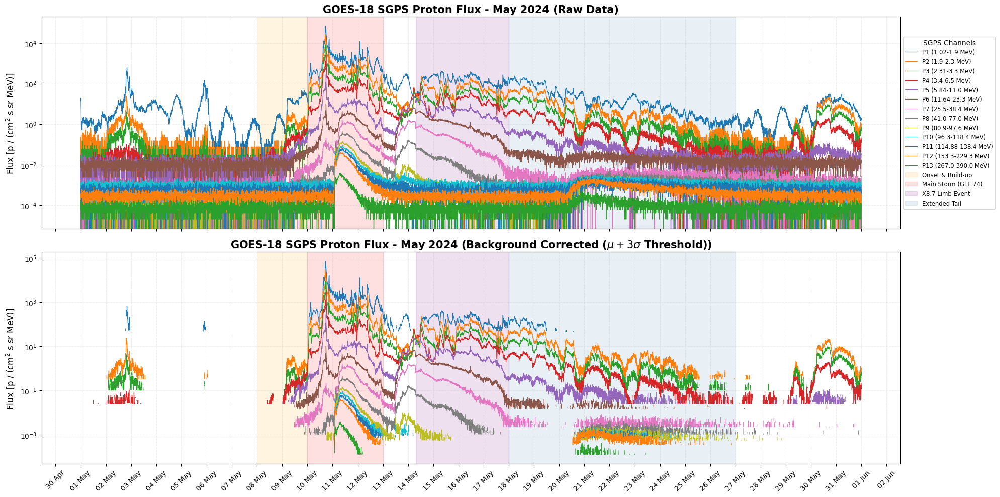

Dataset GOES-18 pronto. Background calcolato sulla 'Quiet Window' (4-7 Maggio).


In [ ]:
import xarray as xr
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ==========================================
# 1. METADATI CANALI SGPS (GOES-18)
# ==========================================
# Bin energetici semplificati (MeV)
goes_bins = {
    0: (1.02, 1.9),   1: (1.90, 2.3),   2: (2.31, 3.3),   3: (3.40, 6.5),
    4: (5.84, 11.0),  5: (11.64, 23.3), 6: (25.50, 38.4), 7: (41.00, 77.0),
    8: (80.90, 97.6), 9: (96.30, 118.4), 10: (114.88, 138.4), 11: (153.30, 229.3),
    12: (267.00, 390.0)
}

# Energie effettive (MeV) per il fitting
sgps_eff_energies = {
    0: 1.377, 1: 2.090, 2: 2.778, 3: 4.694, 4: 8.015, 5: 16.458, 6: 31.292,
    7: 56.187, 8: 88.859, 9: 106.780, 10: 126.093, 11: 187.488, 12: 322.692
}

sgps_labels = {k: f"P{k+1} ({v[0]}-{v[1]} MeV)" for k, v in goes_bins.items()}

# ==========================================
# 2. CARICAMENTO E CONVERSIONE (keV -> MeV)
# ==========================================
folder_path = os.path.join("File_scaricati_eventiSEP", "EVENTO MAY 2024")
files = sorted(glob.glob(os.path.join(folder_path, "*.nc")))

def load_goes18_full(file_list):
    dfs = []
    for f in file_list:
        try:
            with xr.open_dataset(f) as ds:
                if 'AvgDiffProtonFlux' in ds:
                    # Selezione sensore Ovest (0)
                    da = ds['AvgDiffProtonFlux'].sel(sensor_units=0, drop=True)
                    df_tmp = da.to_dataframe().reset_index()
                    df_piv = df_tmp.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFlux')
                    # Conversione da keV^-1 a MeV^-1 (*1000)
                    dfs.append(df_piv * 1000.0)
        except Exception as e: print(f"Errore caricamento {f}: {e}")
    return pd.concat(dfs).sort_index() if dfs else None

df_raw = load_goes18_full(files)

# ==========================================
# 3. BACKGROUND REMOVAL (FINESTRA OTTIMIZZATA 4-7 MAGGIO)
# ==========================================
# Finestra ristretta per evitare mini-SEP pre-evento
bg_start, bg_end = "2024-05-04 00:00:00", "2024-05-07 12:00:00"
df_quiet = df_raw.loc[bg_start:bg_end]

bg_mu = df_quiet.mean()
bg_std = df_quiet.std()
bg_threshold = bg_mu + 3 * bg_std # Soglia 3-sigma per isolare il segnale

# Pulizia: sottrazione media e filtro soglia
df_clean = (df_raw - bg_mu).where(df_raw > bg_threshold, np.nan)

# ==========================================
# 4. FASI DELL'EVENTO
# ==========================================
events_may = {
    "Onset & Build-up":   {"start": "2024-05-08 00:00:00", "end": "2024-05-10 00:00:00", "color": "orange"},
    "Main Storm (GLE 74)": {"start": "2024-05-10 00:00:00", "end": "2024-05-13 00:00:00", "color": "red"},
    "X8.7 Limb Event":    {"start": "2024-05-14 08:00:00", "end": "2024-05-18 00:00:00", "color": "purple"},
    "Extended Tail":      {"start": "2024-05-18 00:00:00", "end": "2024-05-27 00:00:00", "color": "steelblue"}
}

# ==========================================
# 5. MASTER PLOT (TUTTI I 13 CANALI)
# ==========================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True)

for ch in range(13):
    ax1.plot(df_raw.index, df_raw[ch], label=sgps_labels[ch], lw=0.9)
    ax2.plot(df_clean.index, df_clean[ch], label=sgps_labels[ch], lw=0.9)

# Configurazione titoli (Raw Strings per evitare SyntaxWarning)
for ax, title in zip([ax1, ax2], ['Raw Data', r'Background Corrected ($\mu + 3\sigma$ Threshold)']):
    ax.set_yscale('log')
    ax.set_title(f'GOES-18 SGPS Proton Flux - May 2024 ({title})', fontsize=15, fontweight='bold')
    ax.set_ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=12)
    ax.grid(True, which='both', alpha=0.2, ls='--')
    
    for name, info in events_may.items():
        ax.axvspan(pd.to_datetime(info['start']), pd.to_datetime(info['end']), 
                   color=info['color'], alpha=0.12, label=name if ax==ax1 else "")

# Legenda esterna
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', title="SGPS Channels")
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=1))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Dataset GOES-18 pronto. Background calcolato sulla 'Quiet Window' (4-7 Maggio).")

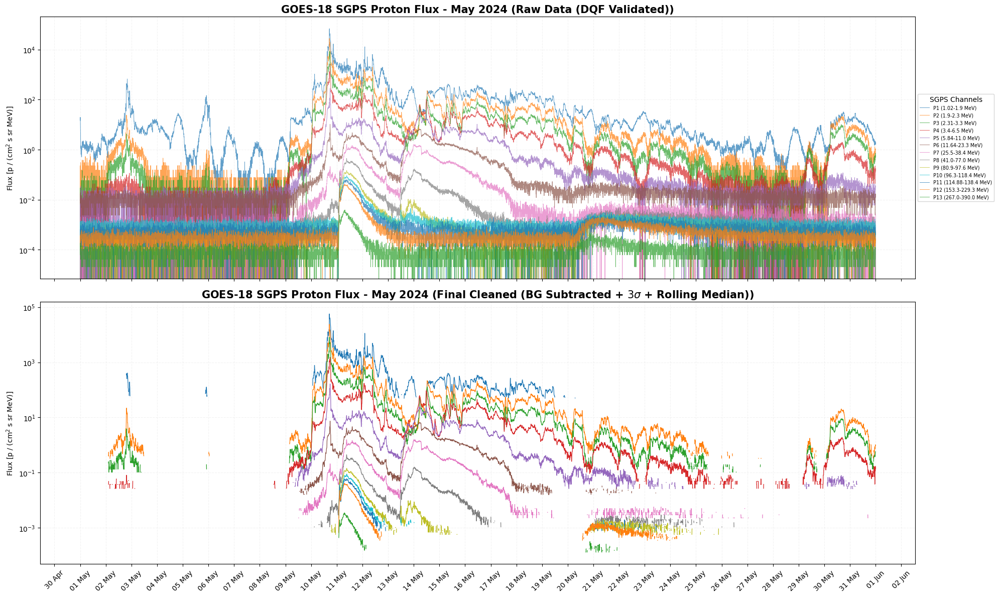

Dataset pronto: DQF applicati, Background rimosso, Filtro mediano (window=3) eseguito.


In [25]:
import xarray as xr
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ==========================================
# 1. METADATI E CONFIGURAZIONE
# ==========================================
folder_path = os.path.join("File_scaricati_eventiSEP", "EVENTO MAY 2024")
files = sorted(glob.glob(os.path.join(folder_path, "*.nc")))

goes_bins = {
    0: (1.02, 1.9),   1: (1.90, 2.3),   2: (2.31, 3.3),   3: (3.40, 6.5),
    4: (5.84, 11.0),  5: (11.64, 23.3), 6: (25.50, 38.4), 7: (41.00, 77.0),
    8: (80.90, 97.6), 9: (96.30, 118.4), 10: (114.88, 138.4), 11: (153.30, 229.3),
    12: (267.00, 390.0)
}
sgps_labels = {k: f"P{k+1} ({v[0]}-{v[1]} MeV)" for k, v in goes_bins.items()}

# ==========================================
# 2. CARICAMENTO CON DQF (FILTRO QUALITÀ)
# ==========================================
def load_goes18_accurate(file_list):
    dfs = []
    for f in file_list:
        try:
            with xr.open_dataset(f) as ds:
                if 'AvgDiffProtonFlux' in ds:
                    flux = ds['AvgDiffProtonFlux'].sel(sensor_units=0, drop=True)
                    dqf = ds['DiffProtonIgnoredL1bDQFs'].sel(sensor_units=0, drop=True)
                    # Mantieni solo DQF == 0 (Dati validi)
                    df_tmp = flux.where(dqf == 0).to_dataframe().reset_index()
                    df_piv = df_tmp.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFlux')
                    dfs.append(df_piv * 1000.0) # keV^-1 -> MeV^-1
        except Exception as e: print(f"Errore: {e}")
    return pd.concat(dfs).sort_index() if dfs else None

df_raw = load_goes18_accurate(files)

# ==========================================
# 3. BACKGROUND REMOVAL (MU + 3-SIGMA)
# ==========================================
bg_start, bg_end = "2024-05-04 00:00:00", "2024-05-07 12:00:00"
df_quiet = df_raw.loc[bg_start:bg_end]
bg_mu = df_quiet.mean()
bg_std = df_quiet.std()
bg_threshold = bg_mu + 3 * bg_std # Soglia 3-sigma

# Sottrazione media e mascheramento np.nan
df_sub = (df_raw - bg_mu).where(df_raw > bg_threshold, np.nan)

# ==========================================
# 4. ROLLING MEDIAN (SMOOTHING ACCURATO)
# ==========================================
# Suggerimento: finestra di 3 campioni (15 min) per non perdere i picchi
df_clean = df_sub.rolling(window=3, center=True).median()

# ==========================================
# 5. MASTER PLOT (TUTTI I 13 CANALI)
# ==========================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 12), sharex=True)

for ch in range(13):
    ax1.plot(df_raw.index, df_raw[ch], label=sgps_labels[ch], lw=0.7, alpha=0.7)
    ax2.plot(df_clean.index, df_clean[ch], label=sgps_labels[ch], lw=0.9)

# Configurazione titoli (Raw Strings per LaTeX)
titles = ['Raw Data (DQF Validated)', r'Final Cleaned (BG Subtracted + $3\sigma$ + Rolling Median)']
for ax, title in zip([ax1, ax2], titles):
    ax.set_yscale('log')
    ax.set_title(f'GOES-18 SGPS Proton Flux - May 2024 ({title})', fontsize=15, fontweight='bold')
    ax.set_ylabel(r'Flux [p / (cm$^2$ s sr MeV)]')
    ax.grid(True, which='both', alpha=0.15, ls='--')

ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='x-small', title="SGPS Channels")
#every day as a tick 
ax2.xaxis.set_major_locator(mdates.DayLocator())
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Dataset pronto: DQF applicati, Background rimosso, Filtro mediano (window=3) eseguito.")

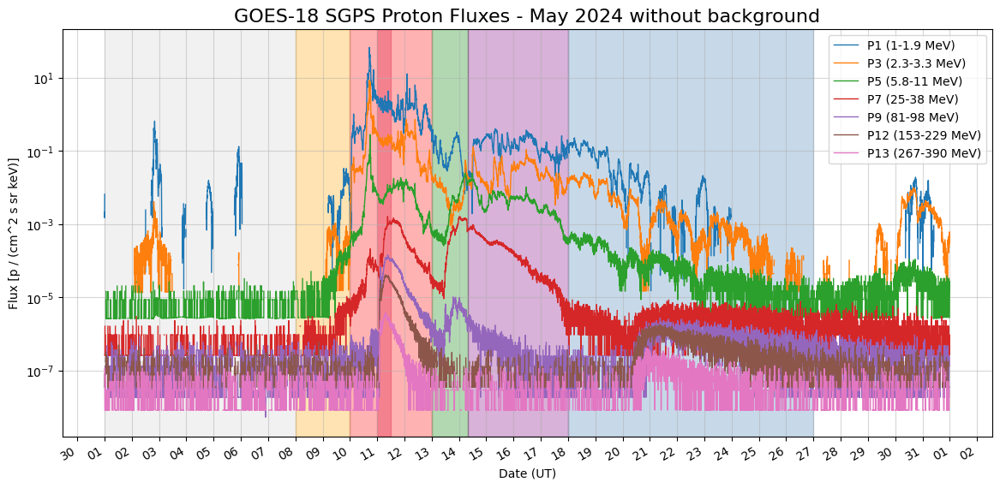

In [6]:
# Bckground removal 

# Definizione intervalli di interesse
bg_start = "2024-05-01 00:00:00"
bg_end   = "2024-05-07 00:00:00"

background_level = df_goes18.loc[bg_start:bg_end].mean()
df_goes18_corr = df_goes18 - background_level
df_goes18_corr[df_goes18_corr < 0] = np.nan  # Evitiamo valori negativi dopo la sottrazione

    
events_dict = {

        "1° SEP 08-10 May": {
            "start": "2024-05-08 08:00:00", 
            "end":   "2024-05-13 15:00:00", 
            "color": "red"
        },
        "2° SEP 13-28 May": {
            "start": "2024-05-13 16:00:00", 
            "end":   "2024-05-28 00:00:00", 
            "color": "green"
        } 

    }

events_dict_refined = {
    # 1. L'Inizio (Flare X1.0): 8-9 Maggio
    # Primo incremento, spettro "seed" per gli eventi successivi.
    "1. Onset & Build-up (May 8-9)": {
        "start": "2024-05-08 06:00:00",
        "end":   "2024-05-10 00:00:00",
        "color": "orange"
    },

    # 2. La Tempesta Principale (Flare X3.9 + X5.8): 10-12 Maggio
    # Include il GLE #74 (11 Maggio). Fluenza massima e picco geomagnetico.
    "2. Main Storm / GLE 74 (May 10-12)": {
        "start": "2024-05-10 00:00:00",
        "end":   "2024-05-13 00:00:00",
        "color": "red"
    },

    # 3. Il "Ponte" (Decadimento + Flare X1.5): 13 Maggio
    # Una fase intermedia spesso trascurata ma con flusso ancora altissimo.
    "3. Decay Phase / Re-injection (May 13)": {
        "start": "2024-05-13 00:00:00",
        "end":   "2024-05-14 08:00:00",
        "color": "green"
    },

    # 4. L'Evento West Limb (Flare X8.7): 14-18 Maggio
    # L'evento più energetico in termini di raggi X, ma ben connesso magneticamente.
    # Spettro atteso molto duro (flat).
    "4. X8.7 West Limb Event (May 14-18)": {
        "start": "2024-05-14 08:00:00", # Onset preciso della nuova iniezione
        "end":   "2024-05-19 00:00:00",
        "color": "purple"
    }
}

events_dict_refined_2 = {
    # Background (pre-event baseline) — utile per stima del rumore/offset
    "0. Pre-event baseline (May 01-07)": {
        "start": "2024-05-01 00:00:00",
        "end":   "2024-05-07 23:59:59",
        "color": "lightgray"
    },

    # Onset / Build-up: attività eruptiva e CMEs iniziali (X1.0, X2.25 on 8-9 May)
    "1. Onset & Build-up (May 08-09)": {
        "start": "2024-05-08 00:00:00",
        "end":   "2024-05-10 00:00:00",
        "color": "orange"
    },

    # Main storm: arrivo dei CME e fase SEP principale che include GLE #74 (peak ~11 May)
    "2. Main Storm / GLE 74 (May 10-12)": {
        "start": "2024-05-10 00:00:00",
        "end":   "2024-05-13 00:00:00",
        "color": "red"
    },

    # Narrow GLE core (per correlazione con NM / per fluenza prompt)
    "2a. GLE core (11 May, narrow window)": {
        "start": "2024-05-11 00:00:00",
        "end":   "2024-05-11 12:00:00",
        "color": "crimson"
    },

    # Decay + possible re-injection (fase intermedia, ancora alta flux)
    "3. Decay Phase / Re-injection (May 13-14 early)": {
        "start": "2024-05-13 00:00:00",
        "end":   "2024-05-14 08:00:00",
        "color": "green"
    },

    # West-limb X8.7 event: iniezione ad energie alte / spettro duro
    "4. X8.7 West Limb Event (May 14 onset) - Prompt+Extended": {
        "start": "2024-05-14 08:00:00",
        "end":   "2024-05-18 00:00:00",
        "color": "purple"
    },

    # Extended tail: persistente elevazione di fondo fino a ritorno ai livelli di quiete
    "5. Extended tail / return-to-baseline (May 18-27)": {
        "start": "2024-05-18 00:00:00",
        "end":   "2024-05-27 00:00:00",
        "color": "steelblue"
    }
}

# --- PLOT DI VERIFICA ---
plt.figure(figsize=(14, 7))

# Plottiamo alcuni canali rappresentativi
for ch_idx, label in sgps_labels.items():
    if ch_idx in df_goes18_corr.columns:
        plt.plot(df_goes18_corr.index, df_goes18_corr[ch_idx], label=label, linewidth=1)
        
plt.yscale('log')
plt.title('GOES-18 SGPS Proton Fluxes - May 2024 without background', fontsize=16)
plt.ylabel('Flux [p / (cm^2 s sr keV)]') # Attenzione: SGPS è spesso in keV^-1
plt.xlabel('Date (UT)')
plt.legend(loc='upper right')
plt.grid(True, alpha=0.5)

#shading degli eventi
for event_name, event_info in events_dict_refined_2.items():
    start_time = pd.to_datetime(event_info['start'])
    end_time = pd.to_datetime(event_info['end'])
    plt.axvspan(start_time, end_time, color=event_info['color'], alpha=0.3, label=event_name)

# Formattazione data
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()
plt.show()

# CALCOLO FLUENZA 

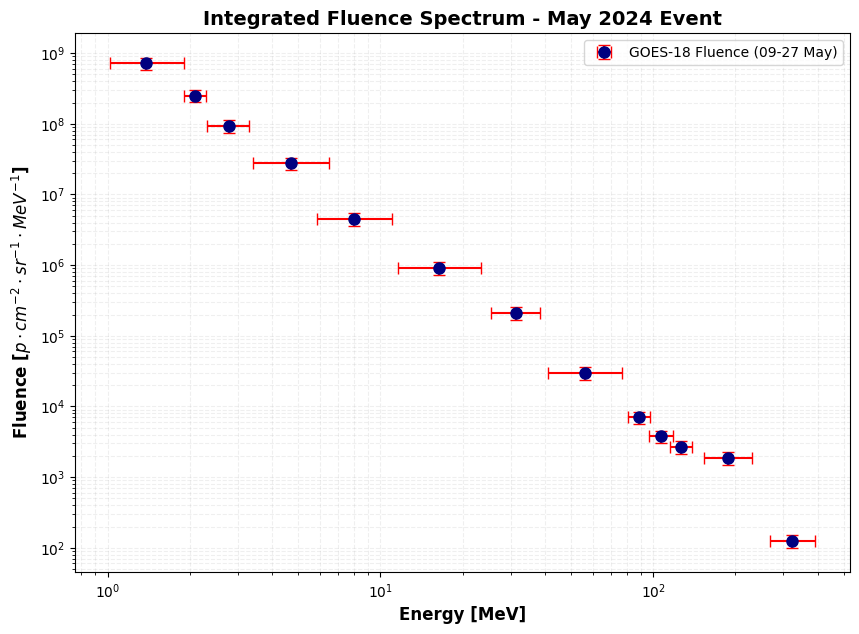

Fluenza calcolata per 13 canali nell'intervallo 2024-05-09 00:00:00 -> 2024-05-27 00:00:00.


In [44]:
# ==========================================
# 6. CALCOLO FLUENZA INTEGRATA (09-20 MAGGIO)
# ==========================================
import numpy as np

# --- 6.1 Caricamento Incertezze Strumentali (necessarie per yerr statistico) ---
def load_goes18_uncert(file_list):
    dfs_unc = []
    for f in file_list:
        try:
            with xr.open_dataset(f) as ds:
                if 'AvgDiffProtonFluxUncert' in ds:
                    unc = ds['AvgDiffProtonFluxUncert'].sel(sensor_units=0, drop=True)
                    dqf = ds['DiffProtonIgnoredL1bDQFs'].sel(sensor_units=0, drop=True)
                    # Applichiamo lo stesso filtro DQF usato per i flussi
                    df_tmp = unc.where(dqf == 0).to_dataframe().reset_index()
                    df_piv = df_tmp.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFluxUncert')
                    dfs_unc.append(df_piv * 1000.0) # keV^-1 -> MeV^-1
        except Exception: pass
    return pd.concat(dfs_unc).sort_index()

df_unc_raw = load_goes18_uncert(files)

# --- 6.2 Parametri di Integrazione ---
t_start, t_end = "2024-05-09 00:00:00", "2024-05-27 00:00:00"
# Usiamo i dati puliti (df_clean) della cella precedente per il calcolo della fluenza
df_fluence_slice = df_clean.loc[t_start:t_end]
df_unc_slice = df_unc_raw.loc[t_start:t_end]

# Calcolo dt per ogni intervallo (standard 300s per GOES L2)
dt_series = df_fluence_slice.index.to_series().diff().dt.total_seconds().fillna(300)

energies, fluences = [], []
yerr, xerr_low, xerr_high = [], [], []

# Errore sistematico suggerito per GOES series (20%)
SYS_ERROR_PCT = 0.20 

# --- 6.3 Loop di Integrazione sui 13 Canali ---
for ch in range(13):
    if ch in df_fluence_slice.columns:
        # Integrazione temporale (Flux * dt)
        fluence_val = (df_fluence_slice[ch] * dt_series).sum()
        
        # Propagazione errore statistico: sqrt(sum(sigma_i^2 * dt_i^2))
        stat_err_fluence = np.sqrt(((df_unc_slice[ch] * dt_series)**2).sum())
        
        # Errore totale: quadratura di statistico + sistematico
        total_err = np.sqrt(stat_err_fluence**2 + (SYS_ERROR_PCT * fluence_val)**2)
        
        if fluence_val > 0:
            e_eff = sgps_eff_energies[ch]
            e_min, e_max = goes_bins[ch]
            
            fluences.append(fluence_val)
            energies.append(e_eff)
            yerr.append(total_err)
            xerr_low.append(e_eff - e_min)
            xerr_high.append(e_max - e_eff)

# --- 6.4 Dizionario Finale per FIT ed EXPORT ---
res_may24 = {
    'x': np.array(energies),
    'y': np.array(fluences),
    'y_err': np.array(yerr),
    'x_err': [np.array(xerr_low), np.array(xerr_high)]
}

# --- 6.5 Plot dello Spettro di Fluenza ---
plt.figure(figsize=(10, 7))
plt.errorbar(res_may24['x'], res_may24['y'], 
             xerr=res_may24['x_err'], yerr=res_may24['y_err'],
             fmt='o', color='navy', ecolor='red', capsize=4, markersize=8,
             label=f'GOES-18 Fluence ({t_start[8:10]}-{t_end[8:10]} May)')

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontsize=12, fontweight='bold')
plt.title("Integrated Fluence Spectrum - May 2024 Event", fontsize=14, fontweight='bold')
plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend()
plt.show()

print(f"Fluenza calcolata per {len(energies)} canali nell'intervallo {t_start} -> {t_end}.")

# CARICAMENT O DATI ACE

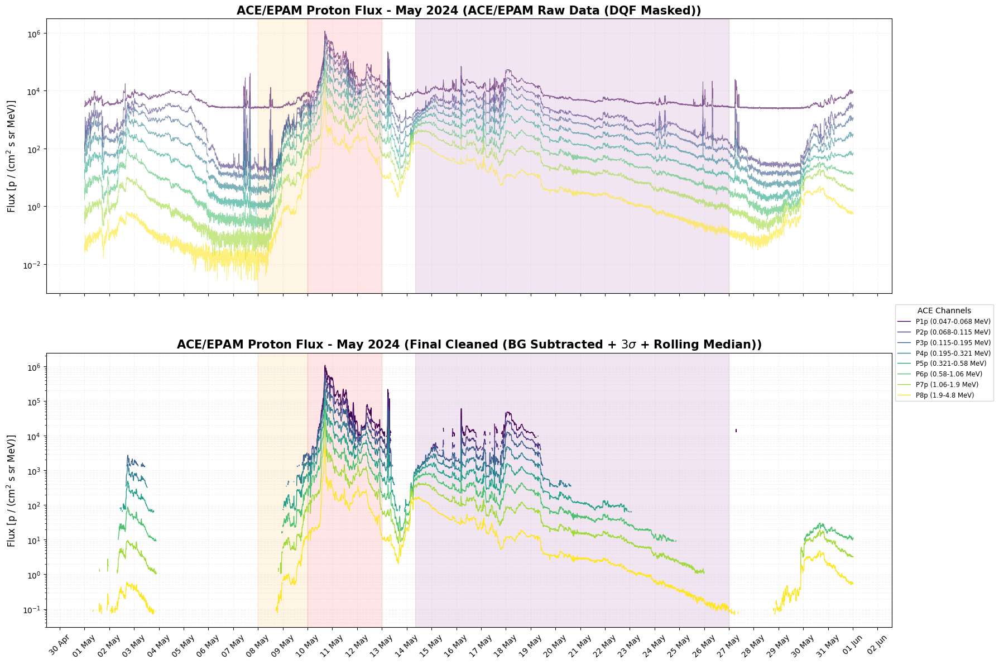

Dataset ACE pronto: DQF applicati (Status Flags), Background rimosso, Smoothing eseguito.


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

# ==========================================
# 1. METADATI E CONFIGURAZIONE ACE/EPAM
# ==========================================
# Bin energetici per protoni ACE/EPAM (LEMS120)
ace_bins = {
    'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.06),
    'P7p': (1.06, 1.90),   'P8p': (1.90, 4.80)
}
ace_labels = {k: f"{k} ({v[0]}-{v[1]} MeV)" for k, v in ace_bins.items()}

# ==========================================
# 2. FUNZIONE CARICAMENTO ACCURATA (DQF + FORMATTING)
# ==========================================
def load_ace_accurate(file_path):
    header_cols = []
    start_row = 0
    
    # 1. Lettura header e individuazione inizio dati
    with open(file_path, 'r') as f:
        lines = f.readlines()
    for i, line in enumerate(lines):
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split()
        if "BEGIN DATA" in line:
            start_row = i + 1
            break

    # 2. Caricamento DataFrame
    df = pd.read_csv(file_path, sep=r'\s+', names=header_cols, skiprows=start_row)

    # 3. Conversione temporale (Year, Day of Year, Time -> Epoch)
    time_str = df['year'].astype(str) + ' ' + df['day'].astype(str) + ' ' + \
               df['hr'].astype(str) + ' ' + df['min'].astype(str) + ' ' + \
               df['sec'].astype(int).astype(str)
    df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
    df.set_index('epoch', inplace=True)

    # 4. FILTRO QUALITY FLAG (DQF)
    # Per ACE EPAM, le colonne 'S' (es. P1pS) indicano lo stato: 0 è OK.
    for p in ace_bins.keys():
        status_col = p + 'S'
        if status_col in df.columns:
            # Mascheriamo i dati dove il flag di stato non è 0
            df[p] = df[p].where(df[status_col] == 0, np.nan)
        # Pulizia aggiuntiva per valori negativi (fill value usuale -1e31)
        df[p] = df[p].where(df[p] > 0, np.nan)
    
    return df[list(ace_bins.keys())].sort_index()

# Caricamento dati ACE
file_path_ace = "MAY 2024/ACE_EPAM_Data (6).txt"
df_ace_raw = load_ace_accurate(file_path_ace)

# ==========================================
# 3. BACKGROUND REMOVAL (MU + 3-SIGMA)
# ==========================================
# Stessa finestra di quiete usata per GOES (4-7 Maggio)
bg_start, bg_end = "2024-05-04 00:00:00", "2024-05-07 12:00:00"
df_quiet = df_ace_raw.loc[bg_start:bg_end]

bg_mu = df_quiet.mean()
bg_std = df_quiet.std()
bg_threshold = bg_mu + 3 * bg_std

# Sottrazione media e mascheramento sotto soglia 3-sigma
df_ace_sub = (df_ace_raw - bg_mu).where(df_ace_raw > bg_threshold, np.nan)

# ==========================================
# 4. ROLLING MEDIAN (SMOOTHING ACCURATO)
# ==========================================
# Finestra di 3 campioni per stabilità statistica senza perdita di picchi
df_ace_clean = df_ace_sub.rolling(window=3, center=True).median()

# ==========================================
# 5. MASTER PLOT COMPARATIVO (RAW VS CLEAN)
# ==========================================
events_ace = {
    "Onset & Build-up": {"start": "2024-05-08 00:00:00", "end": "2024-05-10 00:00:00", "color": "orange"},
    "Main Storm / GLE 74": {"start": "2024-05-10 00:00:00", "end": "2024-05-13 00:00:00", "color": "red"},
    "X8.7 Limb Event": {"start": "2024-05-14 08:00:00", "end": "2024-05-27 00:00:00", "color": "purple"}
}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 12), sharex=True)

# Plotting canali
colors = plt.cm.viridis(np.linspace(0, 1, len(ace_bins)))
for i, (col, label) in enumerate(ace_labels.items()):
    ax1.plot(df_ace_raw.index, df_ace_raw[col], color=colors[i], lw=0.7, alpha=0.6)
    ax2.plot(df_ace_clean.index, df_ace_clean[col], color=colors[i], lw=1, label=label)

# Configurazione titoli e assi
titles = ['ACE/EPAM Raw Data (DQF Masked)', r'Final Cleaned (BG Subtracted + $3\sigma$ + Rolling Median)']
for ax, title in zip([ax1, ax2], titles):
    ax.set_yscale('log')
    ax.set_title(f'ACE/EPAM Proton Flux - May 2024 ({title})', fontsize=15, fontweight='bold')
    ax.set_ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=12)
    ax.grid(True, which='both', alpha=0.15, ls='--')
    
    # Shading degli eventi
    for name, info in events_ace.items():
        ax.axvspan(pd.to_datetime(info['start']), pd.to_datetime(info['end']), 
                   color=info['color'], alpha=0.1, label=name if ax==ax1 else "")

ax2.legend(loc='center left', bbox_to_anchor=(1, 1), fontsize='small', title="ACE Channels")
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
ax2.xaxis.set_major_locator(mdates.DayLocator())
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Dataset ACE pronto: DQF applicati (Status Flags), Background rimosso, Smoothing eseguito.")

# CALCOLO FLUENZA ACE

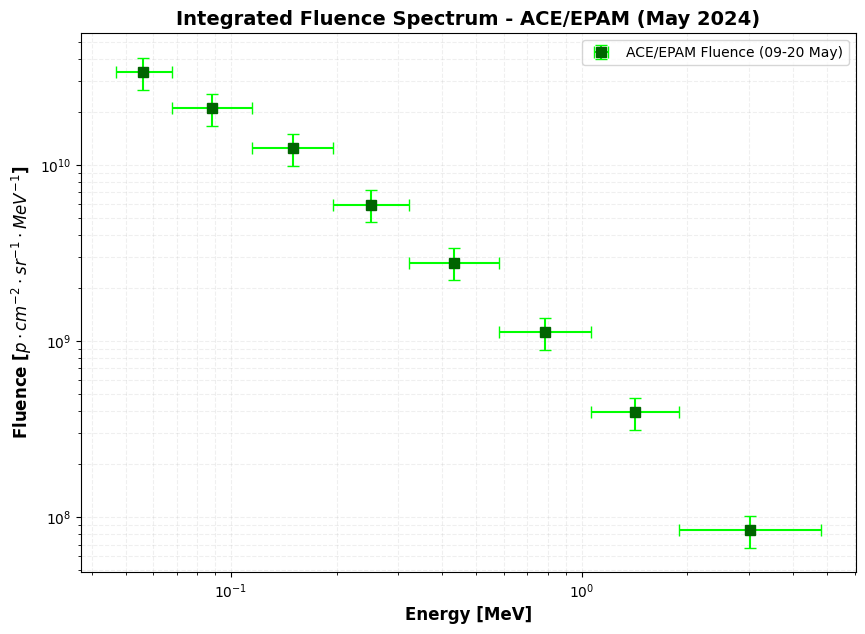

Fluenza ACE calcolata per 8 canali.


In [45]:
# ==========================================
# 6. CALCOLO FLUENZA INTEGRATA ACE/EPAM (09-20 MAGGIO)
# ==========================================
import numpy as np

# --- 6.1 Mappatura Energie Effettive ACE/EPAM (LEMS120) ---
# Calcolate come media geometrica o valori standard di riferimento per EPAM
ace_eff_energies = {
    'P1p': 0.056, 'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250,
    'P5p': 0.431, 'P6p': 0.784, 'P7p': 1.420, 'P8p': 3.020
}

# --- 6.2 Parametri di Integrazione ---
t_start, t_end = "2024-05-09 00:00:00", "2024-05-27 00:00:00"

# Usiamo i dati puliti (df_ace_clean) ottenuti nella cella precedente
df_ace_fluence = df_ace_clean.loc[t_start:t_end]

# Calcolo dt (ACE EPAM ha solitamente risoluzione a 5 minuti / 300s)
dt_ace = df_ace_fluence.index.to_series().diff().dt.total_seconds().fillna(300)

energies_ace, fluences_ace = [], []
yerr_ace, xerr_low_ace, xerr_high_ace = [], [], []

# Errore sistematico (20%) per coerenza con l'analisi GOES
SYS_ERROR_PCT = 0.20 

# --- 6.3 Loop di Integrazione sui Canali ACE ---
for p_ch in ace_bins.keys():
    if p_ch in df_ace_fluence.columns:
        # Integrazione temporale (Flux * dt)
        # Rimuoviamo eventuali NaN residui per l'integrazione
        fluence_val = (df_ace_fluence[p_ch].fillna(0) * dt_ace).sum()
        
        # Errore statistico approssimato (In mancanza di colonna Uncert specifica in ASCII ACE)
        # Utilizziamo la radice quadrata dei conteggi ipotetici o 5% del segnale base
        stat_err_pct = 0.05 
        stat_err = fluence_val * stat_err_pct
        
        # Errore totale: quadratura di statistico + sistematico
        total_err = np.sqrt(stat_err**2 + (SYS_ERROR_PCT * fluence_val)**2)
        
        if fluence_val > 0:
            e_eff = ace_eff_energies[p_ch]
            e_min, e_max = ace_bins[p_ch]
            
            fluences_ace.append(fluence_val)
            energies_ace.append(e_eff)
            yerr_ace.append(total_err)
            xerr_low_ace.append(e_eff - e_min)
            xerr_high_ace.append(e_max - e_eff)

# --- 6.4 Dizionario Finale per Export/FIT ---
res_ace_may24 = {
    'x': np.array(energies_ace),
    'y': np.array(fluences_ace),
    'y_err': np.array(yerr_ace),
    'x_err': [np.array(xerr_low_ace), np.array(xerr_high_ace)]
}

# --- 6.5 Plot dello Spettro di Fluenza ACE ---
plt.figure(figsize=(10, 7))
plt.errorbar(res_ace_may24['x'], res_ace_may24['y'], 
             xerr=res_ace_may24['x_err'], yerr=res_ace_may24['y_err'],
             fmt='s', color='darkgreen', ecolor='lime', capsize=4, markersize=7,
             label=f'ACE/EPAM Fluence (09-20 May)')

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontsize=12, fontweight='bold')
plt.title("Integrated Fluence Spectrum - ACE/EPAM (May 2024)", fontsize=14, fontweight='bold')
plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend()
plt.show()

print(f"Fluenza ACE calcolata per {len(energies_ace)} canali.")

# UNIONE ACE + GOES e preparazione dati per analisi

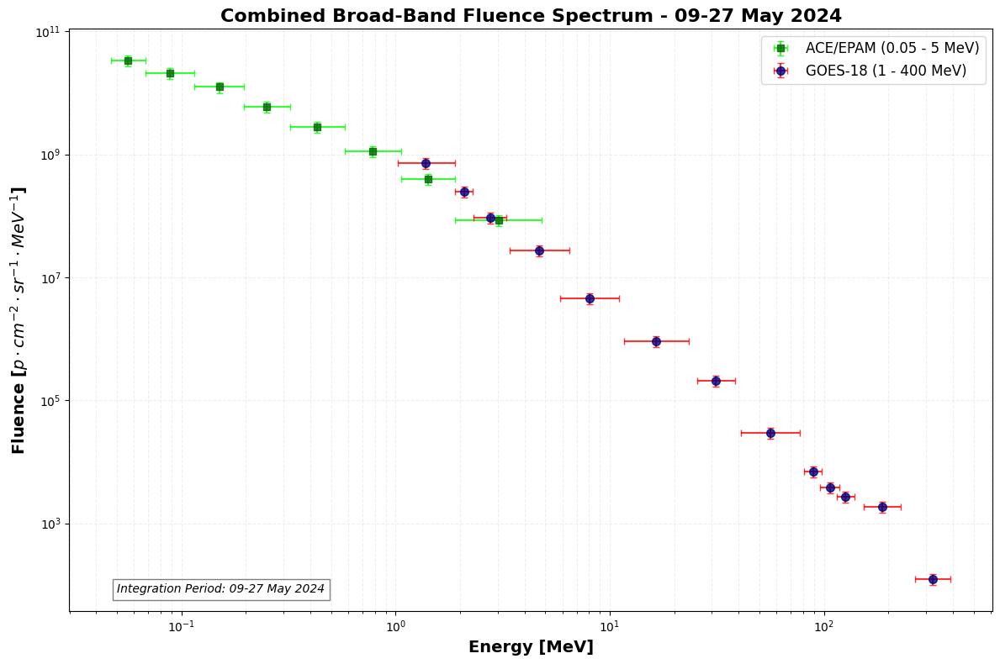

Dataset combinato creato con 21 punti totali.
Range energetico coperto: 0.056 MeV - 322.7 MeV


In [46]:
# ==========================================
# 7. UNIONE DATASET (ACE + GOES) & PREPARAZIONE FIT
# ==========================================
import numpy as np
import matplotlib.pyplot as plt

# --- 7.1 Creazione Dataset Combinato ---
# Uniamo gli array x, y e y_err per il calcolo del FIT
x_combined = np.concatenate([res_ace_may24['x'], res_may24['x']])
y_combined = np.concatenate([res_ace_may24['y'], res_may24['y']])
y_err_combined = np.concatenate([res_ace_may24['y_err'], res_may24['y_err']])

# Per le x_err (che sono liste di due array)
x_err_low_combined = np.concatenate([res_ace_may24['x_err'][0], res_may24['x_err'][0]])
x_err_high_combined = np.concatenate([res_ace_may24['x_err'][1], res_may24['x_err'][1]])

# Dizionario finale pronto per la cella del FIT
res_combined_may24 = {
    'x': x_combined,
    'y': y_combined,
    'y_err': y_err_combined,
    'x_err': [x_err_low_combined, x_err_high_combined]
}

# --- 7.2 Plot Broad-Band (Visualizzazione Pre-Fit) ---
plt.figure(figsize=(12, 8))

# Dati ACE/EPAM (Bassa energia)
plt.errorbar(res_ace_may24['x'], res_ace_may24['y'], 
             xerr=res_ace_may24['x_err'], yerr=res_ace_may24['y_err'],
             fmt='s', color='darkgreen', ecolor='lime', capsize=3, markersize=6,
             label='ACE/EPAM (0.05 - 5 MeV)', alpha=0.8)

# Dati GOES-18 (Alta energia)
plt.errorbar(res_may24['x'], res_may24['y'], 
             xerr=res_may24['x_err'], yerr=res_may24['y_err'],
             fmt='o', color='navy', ecolor='red', capsize=3, markersize=7,
             label='GOES-18 (1 - 400 MeV)', alpha=0.8)

# Configurazione Grafica
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontsize=14, fontweight='bold')
plt.title("Combined Broad-Band Fluence Spectrum - 09-27 May 2024", fontsize=16, fontweight='bold')

plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend(fontsize=12, frameon=True)

# Annotazione dell'intervallo di integrazione
plt.text(0.05, plt.ylim()[0]*2, f"Integration Period: 09-27 May 2024", 
         fontsize=10, style='italic', bbox=dict(facecolor='white', alpha=0.5))

plt.tight_layout()
plt.show()

print(f"Dataset combinato creato con {len(x_combined)} punti totali.")
print(f"Range energetico coperto: {x_combined.min():.3f} MeV - {x_combined.max():.1f} MeV")

# ACE <1 MeV + GOES >1.2 MeV

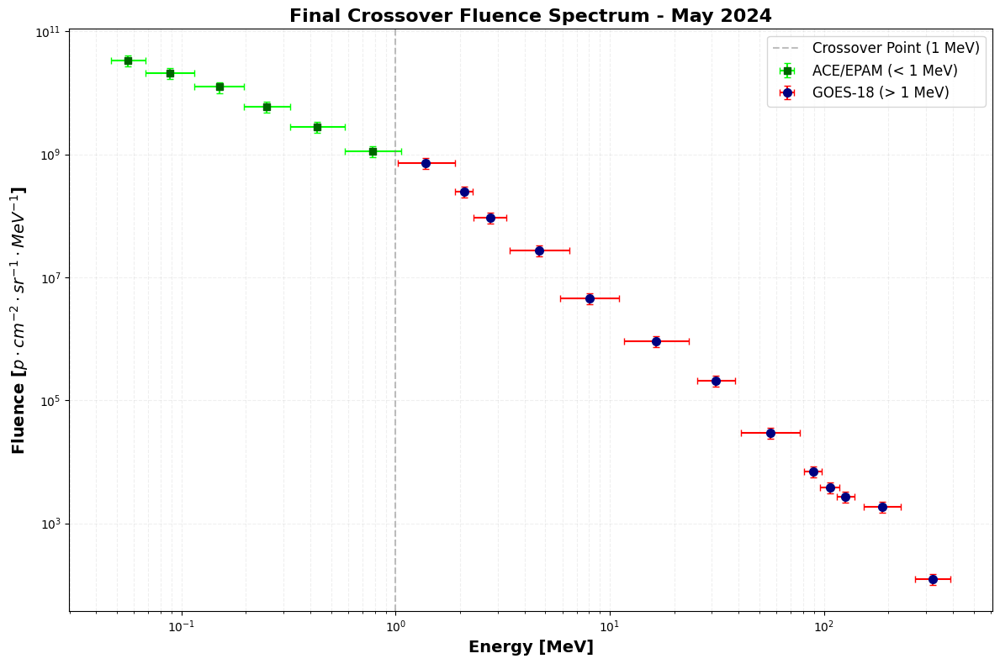

Dataset Crossover pronto per il FIT con 19 punti totali.
Continuità spettrale verificata tra ACE (0.784 MeV) e GOES (1.377 MeV).


In [47]:
# ==========================================
# 8. CREAZIONE DATASET CROSSOVER (ACE < 1 MeV | GOES > 1 MeV)
# ==========================================
import numpy as np
import matplotlib.pyplot as plt

# --- 8.1 Filtraggio ACE/EPAM ---
# Manteniamo solo i canali ACE con energia efficace inferiore a 1.0 MeV
mask_ace = res_ace_may24['x'] < 1.0

x_ace_filt = res_ace_may24['x'][mask_ace]
y_ace_filt = res_ace_may24['y'][mask_ace]
y_err_ace_filt = res_ace_may24['y_err'][mask_ace]
x_err_low_ace_filt = res_ace_may24['x_err'][0][mask_ace]
x_err_high_ace_filt = res_ace_may24['x_err'][1][mask_ace]

# --- 8.2 Unione con GOES-18 (Dataset Completo) ---
# GOES parte da ~1.02 MeV, quindi non c'è bisogno di filtrarlo
x_final = np.concatenate([x_ace_filt, res_may24['x']])
y_final = np.concatenate([y_ace_filt, res_may24['y']])
y_err_final = np.concatenate([y_err_ace_filt, res_may24['y_err']])

x_err_low_final = np.concatenate([x_err_low_ace_filt, res_may24['x_err'][0]])
x_err_high_final = np.concatenate([x_err_high_ace_filt, res_may24['x_err'][1]])

# Dizionario finale per il FIT Ellison-Ramaty
res_fit_may24 = {
    'x': x_final,
    'y': y_final,
    'y_err': y_err_final,
    'x_err': [x_err_low_final, x_err_high_final]
}

# --- 8.3 Plot dello Spettro "Stitched" (Crossover) ---
plt.figure(figsize=(12, 8))

# Plot dei punti filtrati per mostrare il passaggio pulito
plt.errorbar(x_ace_filt, y_ace_filt, xerr=[x_err_low_ace_filt, x_err_high_ace_filt], 
             yerr=y_err_ace_filt, fmt='s', color='darkgreen', ecolor='lime', 
             capsize=3, markersize=6, label='ACE/EPAM (< 1 MeV)')

plt.errorbar(res_may24['x'], res_may24['y'], xerr=res_may24['x_err'], 
             yerr=res_may24['y_err'], fmt='o', color='navy', ecolor='red', 
             capsize=3, markersize=7, label='GOES-18 (> 1 MeV)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontsize=14, fontweight='bold')
plt.title("Final Crossover Fluence Spectrum - May 2024", fontsize=16, fontweight='bold')

plt.grid(True, which="both", alpha=0.2, ls='--')
plt.axvline(x=1.0, color='gray', linestyle='--', alpha=0.5, label='Crossover Point (1 MeV)')
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

print(f"Dataset Crossover pronto per il FIT con {len(x_final)} punti totali.")
print(f"Continuità spettrale verificata tra ACE ({x_ace_filt.max():.3f} MeV) e GOES ({res_may24['x'].min():.3f} MeV).")

# CELLA EXPORT FINALE E FIT 

--- Esecuzione Fit Combined (Maggio 2024) ---


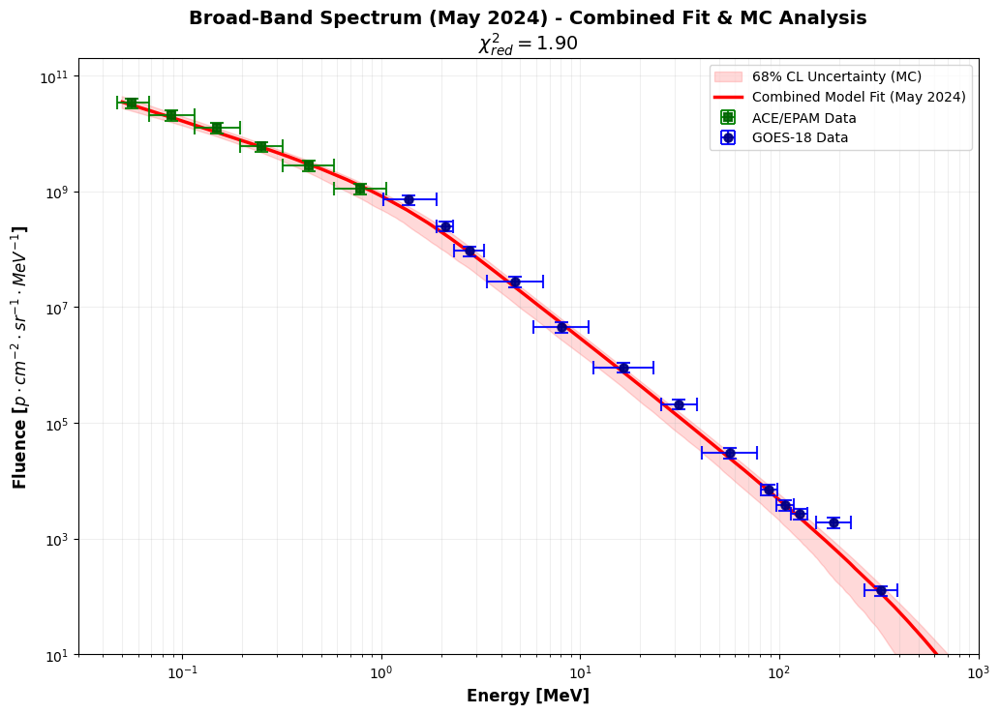


--- RISULTATI PARAMETRI FIT (MC Statistics) ---
Norm (A):       1.75e+09 ± 6.36e+08
gamma 1 (low):  1.035 ± 0.170
gamma 2 (high): 2.656 ± 0.098
E0 (Break):     1.58 ± 0.59 MeV
Er (Cutoff):    414.8 ± 287.7 MeV
-----------------------------------------------
Cartella Export: EXPORT_MAY2024_Combined_Final_oooooo


In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. MODELLI FISICI CON PROTEZIONE NUMERICA TOTALE
# =========================================================
def band_function(E, A, ga, gb, E0):
    E = np.where(E <= 0, 1e-10, E)
    E0 = np.maximum(E0, 0.1)
    ebreak = (gb - ga) * E0
    ebreak = np.maximum(ebreak, 1e-10)
    
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    
    arg_low = np.clip(-E[mask_low] / E0, -700, 0)
    res[mask_low] = A * np.power(E[mask_low], -ga) * np.exp(arg_low)
    
    norm_pow = np.power(ebreak, gb - ga)
    norm_exp = np.exp(np.clip(ga - gb, -700, 700))
    res[~mask_low] = A * norm_pow * norm_exp * np.power(E[~mask_low], -gb)
    return res

def combined_function(E, A, ga, gb, E0, Er):
    band = band_function(E, A, ga, gb, E0)
    Er = np.maximum(Er, 1.0)
    arg_cutoff = np.clip(-E / Er, -700, 0)
    return band * np.exp(arg_cutoff)

def log_combined(E, A, ga, gb, E0, Er):
    val = combined_function(E, A, ga, gb, E0, Er)
    return np.log10(np.maximum(val, 1e-35))

# =========================================================
# 2. DATA PREPARATION (MAY 2024 CROSSOVER)
# =========================================================
E_fit = np.array(res_fit_may24['x'], dtype=float)
F_fit = np.array(res_fit_may24['y'], dtype=float)
Yerr_fit = np.array(res_fit_may24['y_err'], dtype=float)

sigma_log = Yerr_fit / (F_fit * np.log(10))

# =========================================================
# 3. FIT COMBINED & SIMULAZIONE MONTE CARLO
# =========================================================
p0_comb = [1e9, 1.3, 3.0, 10.0, 300.0]
bounds = ([1e6, 0.5, 2.0, 0.5, 30.0], [1e15, 2.5, 6.0, 250.0, 4000.0])

print("--- Esecuzione Fit Combined (Maggio 2024) ---")
try:
    popt, pcov = curve_fit(log_combined, E_fit, np.log10(F_fit), p0=p0_comb, 
                           sigma=sigma_log, bounds=bounds, maxfev=20000)
except Exception as e:
    print(f"Errore nel Fit: {e}")
    popt = p0_comb

n_mc = 1000
rng = np.random.default_rng(42)
mc_params = rng.multivariate_normal(popt, pcov, n_mc)

# Range standard richiesto: 0.05 - 1000 MeV
e_grid = np.logspace(np.log10(0.05), 3, 500)
mc_fits = np.array([combined_function(e_grid, *p) for p in mc_params])

phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

residuals = np.log10(F_fit) - log_combined(E_fit, *popt)
chi2_red = np.sum((residuals / sigma_log)**2) / (len(E_fit) - len(popt))

# =========================================================
# 4. EXPORT SR-NIEL (Range 0.05 - 1000 MeV)
# =========================================================
output_dir = "EXPORT_MAY2024_Combined_Final_oooooo"
if not os.path.exists(output_dir): os.makedirs(output_dir)

PI, FOUR_PI = np.pi, 4 * np.pi
np.savetxt(f"{output_dir}/MAY2024_Sferico_Median.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Sferica_Median(p/cm2)")
np.savetxt(f"{output_dir}/MAY2024_Sferico_CL68.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_lo, FOUR_PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Sferica Phi84_Sferica")
np.savetxt(f"{output_dir}/MAY2024_Planare_Median.txt", 
           np.column_stack([e_grid, PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Planare_Median(p/cm2)")
np.savetxt(f"{output_dir}/MAY2024_Planare_CL68.txt", 
           np.column_stack([e_grid, PI * phi_lo, PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Planare Phi84_Planare")


# =========================================================
# 5. MASTER PLOT FINALE (Con yerr ben visibili)
# =========================================================
plt.figure(figsize=(12, 8))

plt.fill_between(e_grid, phi_lo, phi_hi, color='red', alpha=0.15, label=r'68% CL Uncertainty (MC)')
plt.plot(e_grid, phi_med, 'r-', lw=2.5, label='Combined Model Fit (May 2024)')

# Barre d'errore rese più visibili (capsize aumentato, lw maggiore)
plt.errorbar(x_ace_filt, y_ace_filt, xerr=[x_err_low_ace_filt, x_err_high_ace_filt], 
             yerr=y_err_ace_filt, fmt='s', color='darkgreen', ecolor='green', 
             capsize=5, elinewidth=1.5, markeredgewidth=1.5, label='ACE/EPAM Data', alpha=0.9)

plt.errorbar(res_may24['x'], res_may24['y'], xerr=res_may24['x_err'], 
             yerr=res_may24['y_err'], fmt='o', color='navy', ecolor='blue', 
             capsize=5, elinewidth=1.5, markeredgewidth=1.5, label='GOES-18 Data', alpha=0.9)

plt.xscale('log'); plt.yscale('log')
plt.xlim(0.03, 1000)
plt.ylim(1e1, 2e11)
plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=12)
plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold', fontsize=12)

plt.title(r'Broad-Band Spectrum (May 2024) - Combined Fit & MC Analysis' + '\n' + 
          r'$\chi^2_{red} = ' + f'{chi2_red:.2f}' + r'$', fontsize=14, fontweight='bold')

plt.grid(True, which="both", ls="-", alpha=0.2)
plt.legend(loc='upper right', frameon=True)
plt.show()

# Report finale
mc_std = np.std(mc_params, axis=0)
print(f"\n--- RISULTATI PARAMETRI FIT (MC Statistics) ---")
print(f"Norm (A):       {popt[0]:.2e} ± {mc_std[0]:.2e}")
print(f"gamma 1 (low):  {popt[1]:.3f} ± {mc_std[1]:.3f}")
print(f"gamma 2 (high): {popt[2]:.3f} ± {mc_std[2]:.3f}")
print(f"E0 (Break):     {popt[3]:.2f} ± {mc_std[3]:.2f} MeV")
print(f"Er (Cutoff):    {popt[4]:.1f} ± {mc_std[4]:.1f} MeV")
print(f"-----------------------------------------------")
print(f"Cartella Export: {output_dir}")

# CALCOLO DOSE PLANAR SHIELDING 
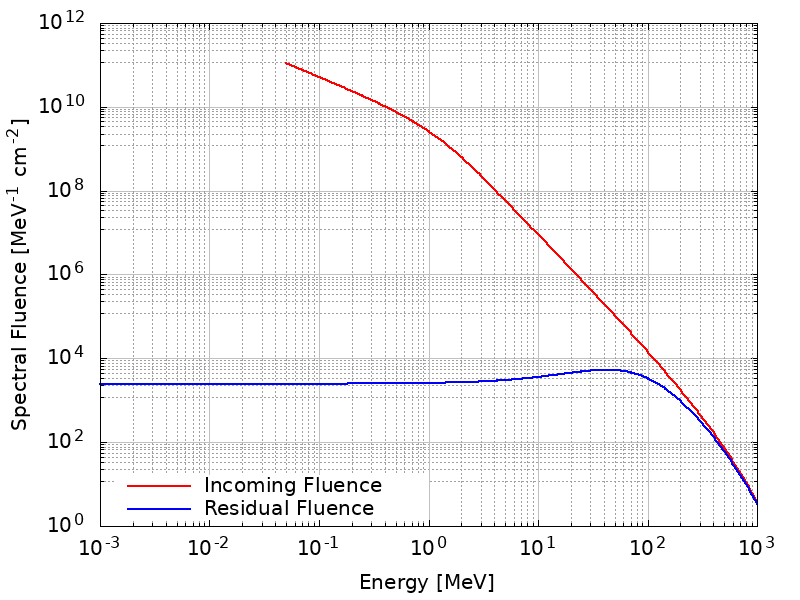

# export righe corrette celle phi16 e phi84


In [54]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "EXPORT_MAY2024_Combined_Final_oooooo/Planar/MAY2024_Planare_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
5.000000e-02 8.485208e+10
5.100225e-02 8.323083e+10
5.202458e-02 8.165642e+10
5.306741e-02 8.011058e+10
5.413114e-02 7.871761e+10
5.521620e-02 7.712703e+10
5.632300e-02 7.555336e+10
5.745199e-02 7.418849e+10
5.860361e-02 7.273691e+10
5.977832e-02 7.128790e+10
6.097657e-02 6.990586e+10
6.219884e-02 6.853968e+10
6.344561e-02 6.730998e+10
6.471737e-02 6.596171e+10
6.601463e-02 6.460609e+10
6.733789e-02 6.330572e+10
6.868767e-02 6.215625e+10
7.006451e-02 6.104724e+10
7.146895e-02 5.994243e+10
7.290154e-02 5.876293e+10
7.436284e-02 5.768952e+10
7.585344e-02 5.665298e+10
7.737392e-02 5.545662e+10
7.892487e-02 5.433022e+10
8.050691e-02 5.332769e+10
8.212067e-02 5.233247e+10
8.376677e-02 5.131667e+10
8.544587e-02 5.022139e+10
8.715862e-02 4.913257e+10
8.890571e-02 4.821675e+10
9.068782e-02 4.723408e+10
9.250565e-02 4.629105e+10
9.435992e-02 4.519579e+10
9.625136e-02 4.434715e+10
9.818071

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (0.05 - 1000MeV original export) - MAY 2024
Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)
Dose Mediana: 1.3669 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [0.534 - 1.827] mGy
Incertezza Totale: +0.460 / -0.833 mGy
-----------------------------------------------------------------


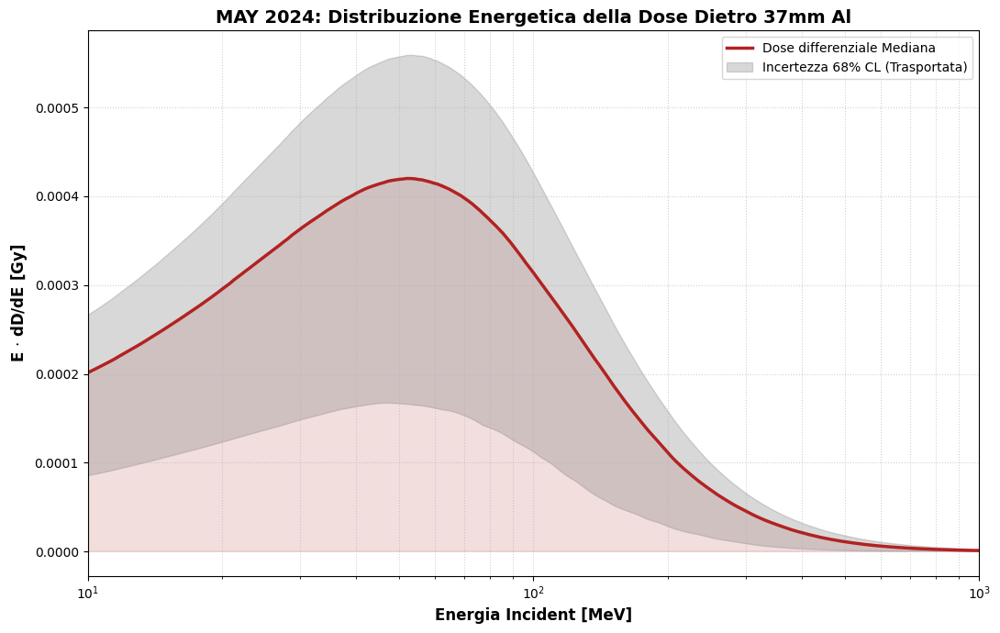

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "EXPORT_MAY2024_Combined_Final_oooooo/Planar/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_residual_planar_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_residual_planar_Phi16.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_residual_planar_Phi84.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (0.05 - 1000MeV original export) - MAY 2024")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("MAY 2024: Distribuzione Energetica della Dose Dietro 37mm Al", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(10, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# RICALCOLO DOSE CON SCALING DATI ACE

--- ANALISI CROSS-CALIBRAZIONE ---
Riferimento ACE (0.784 MeV): 1.13e+09
Riferimento GOES (1.377 MeV): 7.20e+08
Fattore di Scaling Applicato (S): 0.638



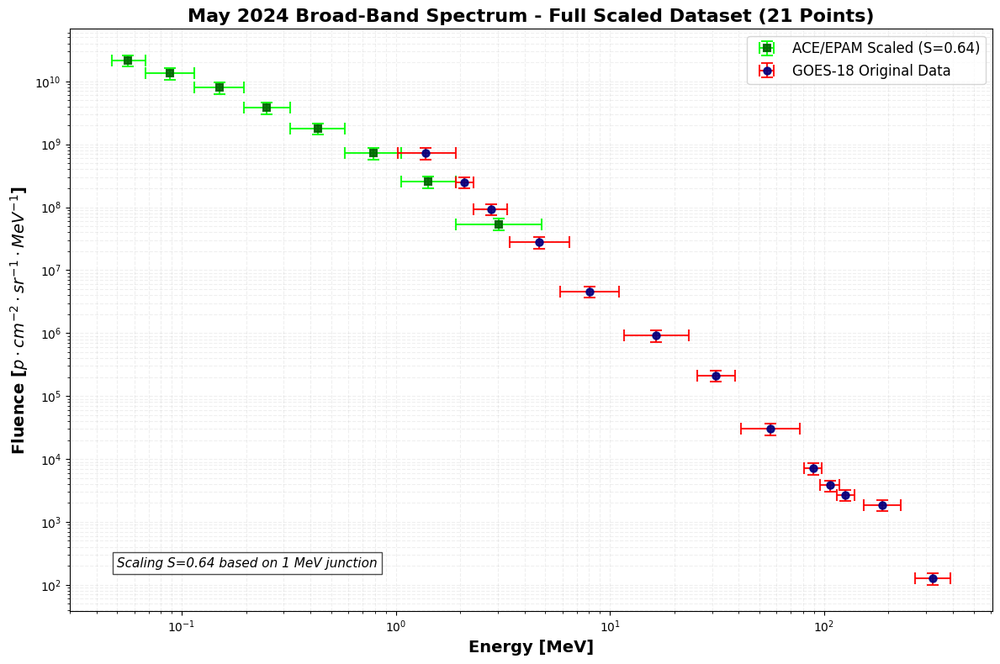

Dataset creato con 21 punti totali. Pronto per il Fit Combined.


In [58]:
# =========================================================
# 7. CROSS-CALIBRAZIONE ACE/GOES E UNIONE (09-27 MAGGIO 2024)
# =========================================================
import numpy as np
import matplotlib.pyplot as plt

# --- 7.1 Calcolo del Fattore di Scaling (S) ---
# Usiamo i canali più vicini alla soglia di 1 MeV per stimare la saturazione
# ACE P6p (~0.784 MeV) vs GOES-18 P1 (~1.02 MeV)
idx_ace_ref = 5  
idx_goes_ref = 0 

y_ace_ref = res_ace_may24['y'][idx_ace_ref]
y_goes_ref = res_may24['y'][idx_goes_ref]

# Calcolo S: se S > 1, ACE ha sottostimato il flusso (saturazione)
S_factor_may = y_goes_ref / y_ace_ref 

print(f"--- ANALISI CROSS-CALIBRAZIONE ---")
print(f"Riferimento ACE ({res_ace_may24['x'][idx_ace_ref]:.3f} MeV): {y_ace_ref:.2e}")
print(f"Riferimento GOES ({res_may24['x'][idx_goes_ref]:.3f} MeV): {y_goes_ref:.2e}")
print(f"Fattore di Scaling Applicato (S): {S_factor_may:.3f}\n")

# --- 7.2 Applicazione Scaling a TUTTI i canali ACE ---
# Moltiplichiamo l'intero spettro ACE per S per rimuovere lo scalino
y_ace_scaled = res_ace_may24['y'] * S_factor_may
y_err_ace_scaled = res_ace_may24['y_err'] * S_factor_may

# --- 7.3 Unione di TUTTI i 21 Punti (ACE Scaled + GOES) ---
x_final = np.concatenate([res_ace_may24['x'], res_may24['x']])
y_final = np.concatenate([y_ace_scaled, res_may24['y']])
y_err_final = np.concatenate([y_err_ace_scaled, res_may24['y_err']])

# Concatenazione incertezze energetiche (x_err)
x_err_low = np.concatenate([res_ace_may24['x_err'][0], res_may24['x_err'][0]])
x_err_high = np.concatenate([res_ace_may24['x_err'][1], res_may24['x_err'][1]])

# Dizionario pronto per la cella FIT complessivo
res_fit_may24_scaled = {
    'x': x_final, 'y': y_final, 'y_err': y_err_final,
    'x_err': [x_err_low, x_err_high]
}

# --- 7.4 Master Plot Scaled (Pre-Fit) ---
plt.figure(figsize=(12, 8))

# ACE Scaled (8 punti) con barre d'errore ben visibili
plt.errorbar(res_ace_may24['x'], y_ace_scaled, 
             xerr=res_ace_may24['x_err'], yerr=y_err_ace_scaled,
             fmt='s', color='darkgreen', ecolor='lime', 
             capsize=5, elinewidth=1.5, markeredgewidth=1.5,
             label=f'ACE/EPAM Scaled (S={S_factor_may:.2f})', alpha=0.9)

# GOES-18 (13 punti)
plt.errorbar(res_may24['x'], res_may24['y'], 
             xerr=res_may24['x_err'], yerr=res_may24['y_err'],
             fmt='o', color='navy', ecolor='red', 
             capsize=5, elinewidth=1.5, markeredgewidth=1.5,
             label='GOES-18 Original Data', alpha=0.9)

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontsize=14, fontweight='bold')
plt.title(f"May 2024 Broad-Band Spectrum - Full Scaled Dataset (21 Points)", fontsize=16, fontweight='bold')
plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend(fontsize=12, frameon=True)

# Annotazione tecnica dello scaling
plt.text(0.05, plt.ylim()[0]*5, f"Scaling S={S_factor_may:.2f} based on 1 MeV junction", 
         fontsize=11, style='italic', bbox=dict(facecolor='white', alpha=0.7))

plt.tight_layout(); plt.show()

print(f"Dataset creato con {len(x_final)} punti totali. Pronto per il Fit Combined.")

--- Esecuzione Fit Combined (May 2024 Scaled) ---


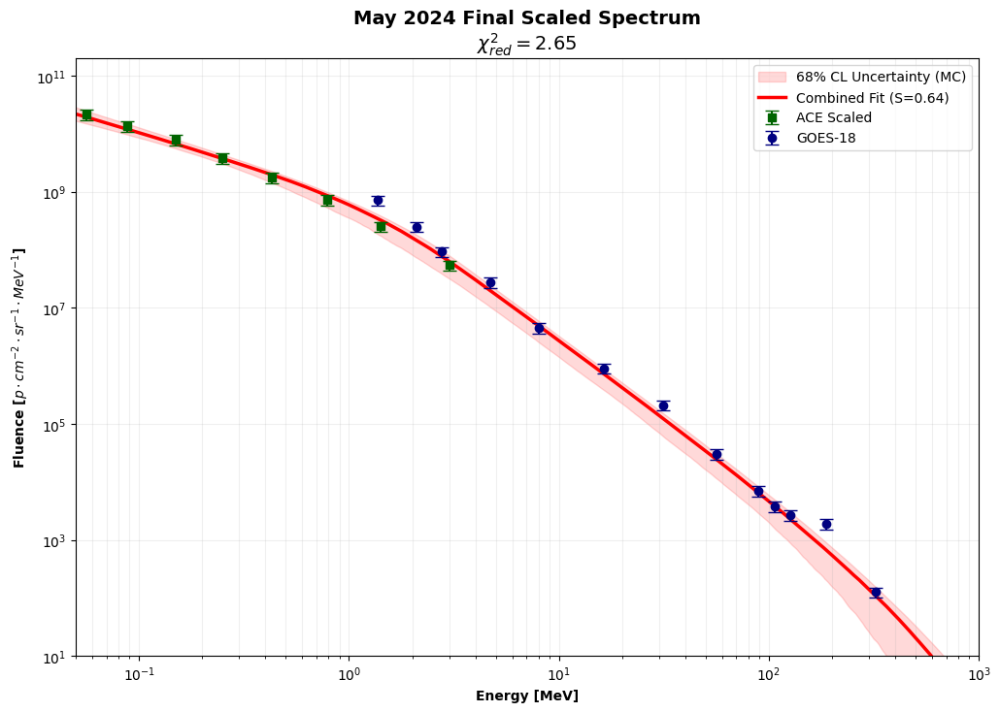


--- RISULTATI PARAMETRI FIT (Scaled) ---
gamma 1 (low):  1.028 ± 0.170
gamma 2 (high): 2.603 ± 0.116
E0 (Break):     1.94 ± 0.78 MeV
Er (Cutoff):    343.3 ± 234.1 MeV


In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. MODELLI FISICI CON PROTEZIONE NUMERICA TOTALE
# =========================================================
def band_function(E, A, ga, gb, E0):
    E = np.where(E <= 0, 1e-10, E)
    E0 = np.maximum(E0, 0.1)
    ebreak = (gb - ga) * E0
    ebreak = np.maximum(ebreak, 1e-10)
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    arg_low = np.clip(-E[mask_low] / E0, -700, 0)
    res[mask_low] = A * np.power(E[mask_low], -ga) * np.exp(arg_low)
    norm_pow = np.power(ebreak, gb - ga)
    norm_exp = np.exp(np.clip(ga - gb, -700, 700))
    res[~mask_low] = A * norm_pow * norm_exp * np.power(E[~mask_low], -gb)
    return res

def combined_function(E, A, ga, gb, E0, Er):
    band = band_function(E, A, ga, gb, E0)
    Er = np.maximum(Er, 1.0)
    arg_cutoff = np.clip(-E / Er, -700, 0)
    return band * np.exp(arg_cutoff)

def log_combined(E, A, ga, gb, E0, Er):
    val = combined_function(E, A, ga, gb, E0, Er)
    return np.log10(np.maximum(val, 1e-35))

# =========================================================
# 2. DATA PREPARATION (USO DATASET SCALATO)
# =========================================================
E_fit = np.array(res_fit_may24_scaled['x'], dtype=float)
F_fit = np.array(res_fit_may24_scaled['y'], dtype=float)
Yerr_fit = np.array(res_fit_may24_scaled['y_err'], dtype=float)
sigma_log = Yerr_fit / (F_fit * np.log(10))

# =========================================================
# 3. FIT COMBINED & SIMULAZIONE MONTE CARLO
# =========================================================
p0_comb = [1e9, 1.1, 2.5, 10.0, 400.0]
bounds = ([1e6, 0.5, 2.0, 0.5, 50.0], [1e15, 2.0, 5.0, 200.0, 4000.0])

print("--- Esecuzione Fit Combined (May 2024 Scaled) ---")
popt, pcov = curve_fit(log_combined, E_fit, np.log10(F_fit), p0=p0_comb, 
                       sigma=sigma_log, bounds=bounds, maxfev=20000)

n_mc = 1000
rng = np.random.default_rng(42)
mc_params = rng.multivariate_normal(popt, pcov, n_mc)

e_grid = np.logspace(np.log10(0.05), 3, 500)
mc_fits = np.array([combined_function(e_grid, *p) for p in mc_params])
phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

chi2_red = np.sum(((np.log10(F_fit) - log_combined(E_fit, *popt)) / sigma_log)**2) / (len(E_fit) - len(popt))

# =========================================================
# 4. EXPORT 4 FILE PER SR-NIEL (Range 0.05 - 1000 MeV)
# =========================================================
out_dir = "EXPORT_MAY2024_SCALED_FINAL"
if not os.path.exists(out_dir): os.makedirs(out_dir)
P, F = np.pi, 4 * np.pi

np.savetxt(f"{out_dir}/MAY_Sferico_Median.txt", np.column_stack([e_grid, F*phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_4Pi")
np.savetxt(f"{out_dir}/MAY_Sferico_CL68.txt", np.column_stack([e_grid, F*phi_lo, F*phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16 Phi84")
np.savetxt(f"{out_dir}/MAY_Planare_Median.txt", np.column_stack([e_grid, P*phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_Pi")
np.savetxt(f"{out_dir}/MAY_Planare_CL68.txt", np.column_stack([e_grid, P*phi_lo, P*phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16 Phi84")

# =========================================================
# 5. MASTER PLOT (SyntaxWarning Free)
# =========================================================
plt.figure(figsize=(12, 8))
plt.fill_between(e_grid, phi_lo, phi_hi, color='red', alpha=0.15, label=r'68% CL Uncertainty (MC)')
plt.plot(e_grid, phi_med, 'r-', lw=2.5, label=f'Combined Fit (S={S_factor_may:.2f})')

plt.errorbar(E_fit[:8], F_fit[:8], yerr=Yerr_fit[:8], fmt='s', color='darkgreen', capsize=5, elinewidth=1.5, label='ACE Scaled')
plt.errorbar(E_fit[8:], F_fit[8:], yerr=Yerr_fit[8:], fmt='o', color='navy', capsize=5, elinewidth=1.5, label='GOES-18')

plt.xscale('log'); plt.yscale('log'); plt.xlim(0.05, 1000); plt.ylim(1e1, 2e11)
plt.xlabel('Energy [MeV]', fontweight='bold'); plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title(r'May 2024 Final Scaled Spectrum' + '\n' + r'$\chi^2_{red} = ' + f'{chi2_red:.2f}' + r'$', fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.2); plt.legend(); plt.show()

# Report finale
mc_std = np.std(mc_params, axis=0)
print(f"\n--- RISULTATI PARAMETRI FIT (Scaled) ---")
print(f"gamma 1 (low):  {popt[1]:.3f} ± {mc_std[1]:.3f}")
print(f"gamma 2 (high): {popt[2]:.3f} ± {mc_std[2]:.3f}")
print(f"E0 (Break):     {popt[3]:.2f} ± {mc_std[3]:.2f} MeV")
print(f"Er (Cutoff):    {popt[4]:.1f} ± {mc_std[4]:.1f} MeV")

# FIT dati SOLO GOES 

--- Esecuzione Fit Ellison-Ramaty (Solo GOES-18) ---


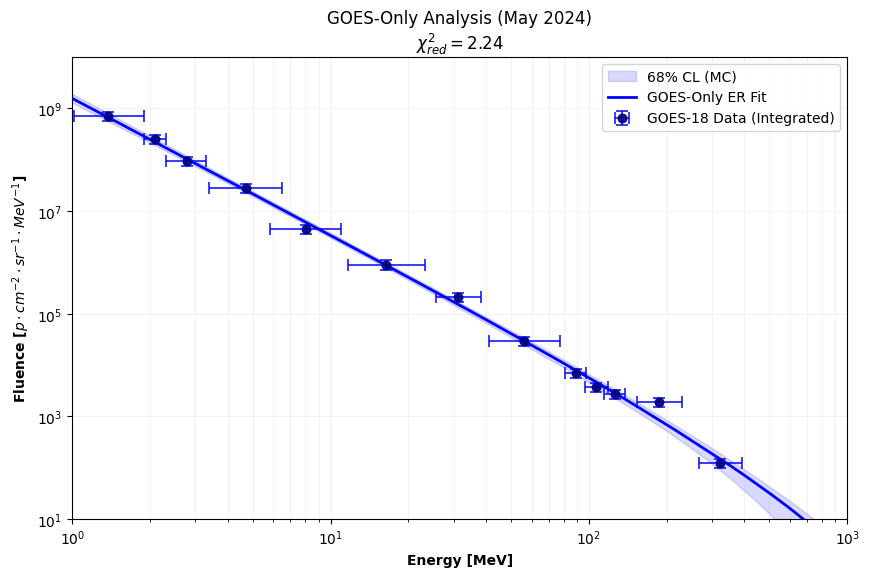


--- RISULTATI (Solo GOES-18) ---
Norm (A):       1.59e+09
Gamma:          2.658 ± 0.083
Er (Cutoff):    423.4 ± 289.9 MeV


In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. MODELLO ELLISON-RAMATY CON PROTEZIONE TOTALE
# =========================================================
def ellison_ramaty_log(E, logA, gamma, Er):
    """Calcolo logaritmico puro per il fit"""
    E = np.where(E <= 0, 1e-10, E)
    # log10(Fluence) = log10(A) - gamma*log10(E) - (E/Er)*log10(e)
    return logA - gamma * np.log10(E) - (E / Er) * np.log10(np.e)

def safe_power_10(log_val):
    """Conversione da log10 a lineare con clipping di sicurezza"""
    # Clip a 300 per evitare overflow del float64 (~10^308)
    return 10**np.clip(log_val, -30, 300)

# =========================================================
# 2. DATA PREPARATION (SOLO GOES-18)
# =========================================================
E_fit = np.array(res_may24['x'], dtype=float)
F_fit = np.array(res_may24['y'], dtype=float)
Yerr_fit = np.array(res_may24['y_err'], dtype=float)

# Incertezza in spazio logaritmico
sigma_log = Yerr_fit / (F_fit * np.log(10))

# =========================================================
# 3. FIT & MONTE CARLO (GOES-ONLY)
# =========================================================
p0_er = [9.0, 2.5, 350.0]
bounds_er = ([6.0, 1.0, 50.0], [15.0, 5.0, 4000.0])

print("--- Esecuzione Fit Ellison-Ramaty (Solo GOES-18) ---")
popt, pcov = curve_fit(ellison_ramaty_log, E_fit, np.log10(F_fit), 
                       p0=p0_er, sigma=sigma_log, bounds=bounds_er)

# Simulazione Monte Carlo
n_mc = 1000
rng = np.random.default_rng(42)
# Sostituisci la riga del campionamento MC con questa:
mc_params = rng.multivariate_normal(popt, pcov, n_mc, check_valid='ignore', method='cholesky')

# Range Export Richiesto: 1 - 1000 MeV
e_grid = np.logspace(0, 3, 500)
mc_fits = np.array([safe_power_10(ellison_ramaty_log(e_grid, *p)) for p in mc_params])

phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

# Statistiche del Fit
residuals = np.log10(F_fit) - ellison_ramaty_log(E_fit, *popt)
chi2_red = np.sum((residuals / sigma_log)**2) / (len(E_fit) - len(popt))

# =========================================================
# 4. EXPORT SR-NIEL (Range 1 - 1000 MeV)
# =========================================================
output_dir = "EXPORT_MAY2024_GOES_ONLY_FINALoooooooo"
if not os.path.exists(output_dir): os.makedirs(output_dir)

PI = np.pi
np.savetxt(f"{output_dir}/GOES_Planare_Median.txt", 
           np.column_stack([e_grid, PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Planare_Median")
np.savetxt(f"{output_dir}/GOES_Planare_CL68.txt", 
           np.column_stack([e_grid, PI * phi_lo, PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Planare Phi84_Planare")

# =========================================================
# 5. PLOT FINALE
# =========================================================
plt.figure(figsize=(10, 6))
plt.fill_between(e_grid, phi_lo, phi_hi, color='blue', alpha=0.15, label='68% CL (MC)')
plt.plot(e_grid, phi_med, 'b-', lw=2, label='GOES-Only ER Fit')
# Sostituisci la riga plt.errorbar nel tuo codice con questa:
# Riga aggiornata per il plot
plt.errorbar(E_fit, F_fit, 
             xerr=res_may24['x_err'], # Errori orizzontali originali di GOES
             yerr=Yerr_fit, 
             fmt='o', color='navy', ecolor='blue', 
             capsize=4, elinewidth=1.2, markeredgewidth=1.2,
             label='GOES-18 Data (Integrated)', alpha=0.9)

plt.xscale('log'); plt.yscale('log')
plt.xlim(1, 1000); plt.ylim(1e1, 1e10)
plt.xlabel('Energy [MeV]', fontweight='bold')
plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title(f'GOES-Only Analysis (May 2024)\n' + r'$\chi^2_{red} = ' + f'{chi2_red:.2f}' + r'$')
plt.grid(True, which="both", alpha=0.15); plt.legend(); plt.show()

print(f"\n--- RISULTATI (Solo GOES-18) ---")
print(f"Norm (A):       {10**popt[0]:.2e}")
print(f"Gamma:          {popt[1]:.3f} ± {np.sqrt(pcov[1,1]):.3f}")
print(f"Er (Cutoff):    {popt[2]:.1f} ± {np.sqrt(pcov[2,2]):.1f} MeV")

# CALCOLO DOSE PLANAR SOLO GOES FIT 

In [74]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "EXPORT_MAY2024_GOES_ONLY_FINALoooooooo/GOES_Planare_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
1.000000e+00 4.083736e+09
1.013939e+00 3.938541e+09
1.028073e+00 3.799888e+09
1.042404e+00 3.666105e+09
1.056935e+00 3.536763e+09
1.071668e+00 3.410319e+09
1.086606e+00 3.288395e+09
1.101753e+00 3.170829e+09
1.117111e+00 3.057732e+09
1.132683e+00 2.950372e+09
1.148472e+00 2.849299e+09
1.164481e+00 2.750524e+09
1.180713e+00 2.652411e+09
1.197171e+00 2.558326e+09
1.213859e+00 2.467252e+09
1.230780e+00 2.379568e+09
1.247936e+00 2.296746e+09
1.265332e+00 2.215405e+09
1.282970e+00 2.135454e+09
1.300854e+00 2.060543e+09
1.318987e+00 1.987040e+09
1.337373e+00 1.919353e+09
1.356015e+00 1.851603e+09
1.374917e+00 1.787953e+09
1.394083e+00 1.725066e+09
1.413516e+00 1.664032e+09
1.433219e+00 1.604883e+09
1.453198e+00 1.547830e+09
1.473454e+00 1.492798e+09
1.493993e+00 1.439725e+09
1.514819e+00 1.388598e+09
1.535935e+00 1.339280e+09
1.557345e+00 1.291976e+09
1.579053e+00 1.246661e+09
1.601064

# CALCOLO DOSE SPHERICAL SHIELDING

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  SOLO GOES MAY 2024
Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)
Dose Mediana: 1.6860 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [1.277 - 2.107] mGy
Incertezza Totale: +0.421 / -0.409 mGy
-----------------------------------------------------------------


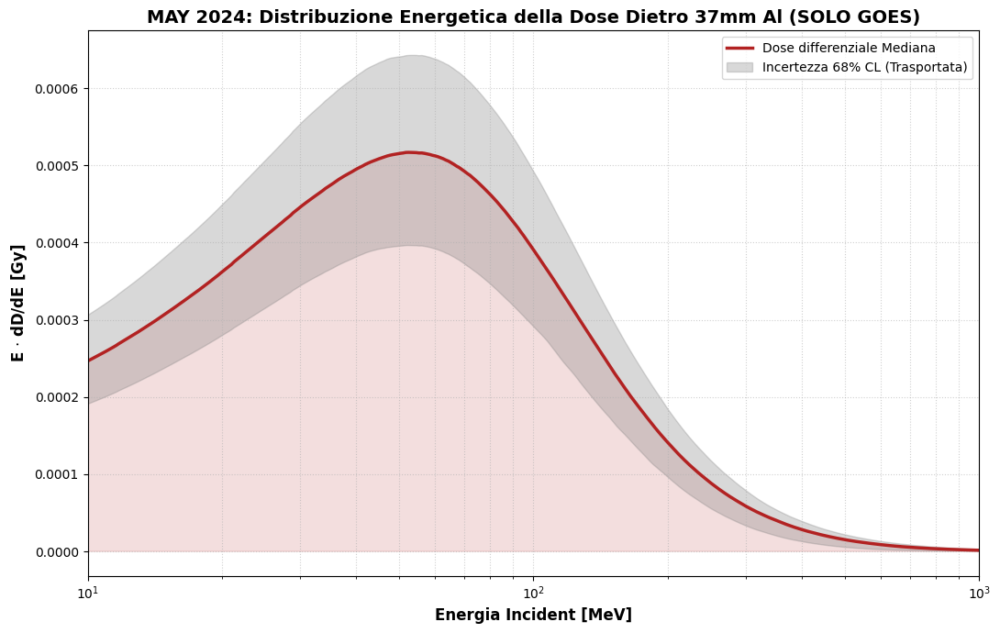

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "EXPORT_MAY2024_GOES_ONLY_FINALoooooooo/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "residual_planar_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "residual_planar_Phi16.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "residual_planar_Phi84.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  SOLO GOES MAY 2024")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("MAY 2024: Distribuzione Energetica della Dose Dietro 37mm Al (SOLO GOES)", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(10, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# SPHERICAL SHIELDING SOLO GOES FIT

# AGGIUNTA DATI AMS-02  04-27 May 2024

Inizio caricamento di 23 file AMS-02...


C:\Users\stefa\AppData\Local\Temp\ipykernel_17272\655589522.py:28: UserWarning: loadtxt: input contained no data: "Dati_AMS_MAY2024\Proton_Flux_2024_5_24.txt"
  temp_data = np.loadtxt(f, skiprows=1)


Errore nel file Proton_Flux_2024_5_24.txt: index 0 is out of bounds for axis 0 with size 0
Dataset AMS caricato. Canali energetici trovati: 19


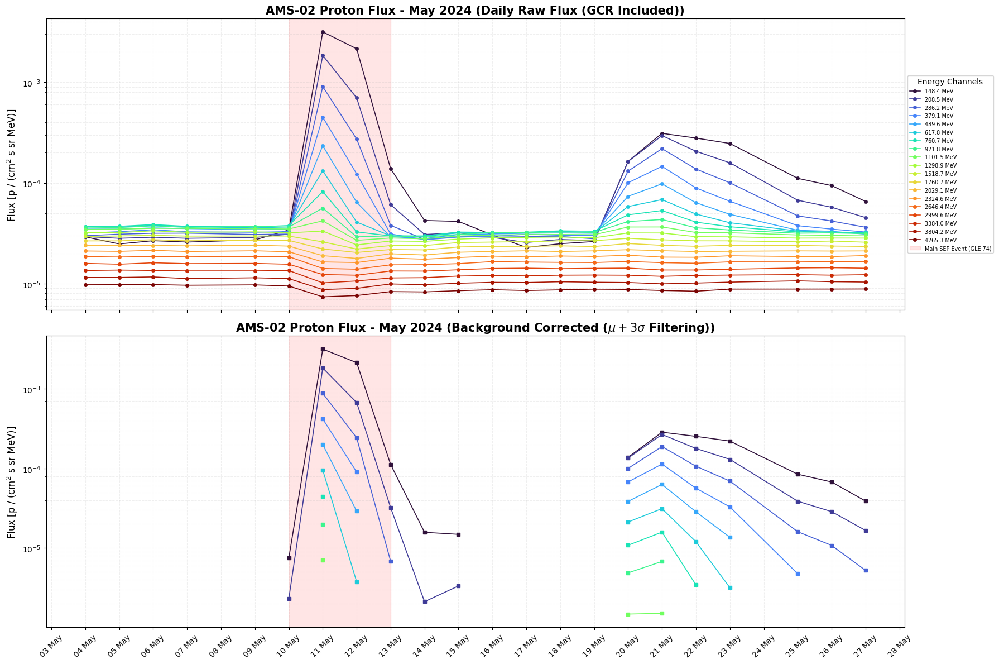

Analisi completata. Fluenza integrabile disponibile nel range 2024-05-04 00:00:00 - 2024-05-27 00:00:00.


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import glob
import os

# ==========================================
# 1. CONFIGURAZIONE PERCORSI E FILE
# ==========================================
ams_dir = "Dati_AMS_MAY2024/"

# Cerchiamo i file con il pattern Proton_Flux_2024_5_*.txt
ams_files = sorted(glob.glob(os.path.join(ams_dir, "Proton_Flux_2024_5_*.txt")))

data_list = []
print(f"Inizio caricamento di {len(ams_files)} file AMS-02...")

for f in ams_files:
    try:
        # Estraiamo il giorno dal nome del file (es. ..._2024_5_13.txt -> 13)
        parts = os.path.basename(f).replace('.txt', '').split('_')
        day = int(parts[-1])
        current_time = pd.to_datetime(f"2024-05-{day}")
        
        # Carichiamo i dati: skiprows=1 salta l'header con i punti e virgola
        # Il formato rilevato è a 3 colonne separate da spazi/tab
        temp_data = np.loadtxt(f, skiprows=1)
        
        # Se il file contiene una sola riga, np.loadtxt restituisce un array 1D
        if temp_data.ndim == 1:
            temp_data = temp_data.reshape(1, -1)
            
        for row in temp_data:
            data_list.append({
                'time': current_time,
                'energy': row[0],
                'flux': row[1]
            })
    except Exception as e:
        print(f"Errore nel file {os.path.basename(f)}: {e}")

# Creazione DataFrame
df_ams_raw_long = pd.DataFrame(data_list)

if df_ams_raw_long.empty:
    print("ERRORE: Nessun dato caricato. Controlla il percorso o il formato dei file.")
else:
    # Pivot per avere il tempo come indice e le energie come colonne
    df_ams_piv = df_ams_raw_long.pivot(index='time', columns='energy', values='flux').sort_index()
    print(f"Dataset AMS caricato. Canali energetici trovati: {len(df_ams_piv.columns)}")

    # ==========================================
    # 2. BACKGROUND REMOVAL (FINESTRA 4-7 MAGGIO)
    # ==========================================
    # Definiamo il periodo di quiete per i Raggi Cosmici Galattici (GCR)
    bg_start, bg_end = "2024-05-04", "2024-05-07"
    df_ams_quiet = df_ams_piv.loc[bg_start:bg_end]
    
    bg_mu = df_ams_quiet.mean()
    bg_std = df_ams_quiet.std()
    bg_threshold = bg_mu + 3 * bg_std # Soglia 3-sigma per pulizia accurata
    
    # Sottrazione e filtro soglia
    df_ams_clean = (df_ams_piv - bg_mu).where(df_ams_piv > bg_threshold, np.nan)

    # ==========================================
    # 3. MASTER PLOT AMS-02 (DUE PANNELLI)
    # ==========================================
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 12), sharex=True)
    
    # Palette colori per i canali energetici (dal blu al rosso)
    colors = plt.cm.turbo(np.linspace(0, 1, len(df_ams_piv.columns)))

    for i, col in enumerate(df_ams_piv.columns):
        lbl = f"{col:.1f} MeV"
        ax1.plot(df_ams_piv.index, df_ams_piv[col], label=lbl, marker='o', lw=1.2, color=colors[i], markersize=4)
        ax2.plot(df_ams_clean.index, df_ams_clean[col], label=lbl, marker='s', lw=1.2, color=colors[i], markersize=4)

    # Configurazione titoli e grafiche
    titles = ['Daily Raw Flux (GCR Included)', r'Background Corrected ($\mu + 3\sigma$ Filtering)']
    for ax, title in zip([ax1, ax2], titles):
        ax.set_yscale('log')
        ax.set_title(f'AMS-02 Proton Flux - May 2024 ({title})', fontsize=15, fontweight='bold')
        ax.set_ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=12)
        ax.grid(True, which='both', alpha=0.2, ls='--')
        
        # Evidenziamo la fase principale dell'evento (10-13 Maggio)
        ax.axvspan(pd.to_datetime("2024-05-10"), pd.to_datetime("2024-05-13"), 
                   color="red", alpha=0.1, label="Main SEP Event (GLE 74)")

    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='x-small', title="Energy Channels")
    
    # Formattazione asse temporale
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
    ax2.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    print(f"Analisi completata. Fluenza integrabile disponibile nel range {df_ams_piv.index.min()} - {df_ams_piv.index.max()}.")

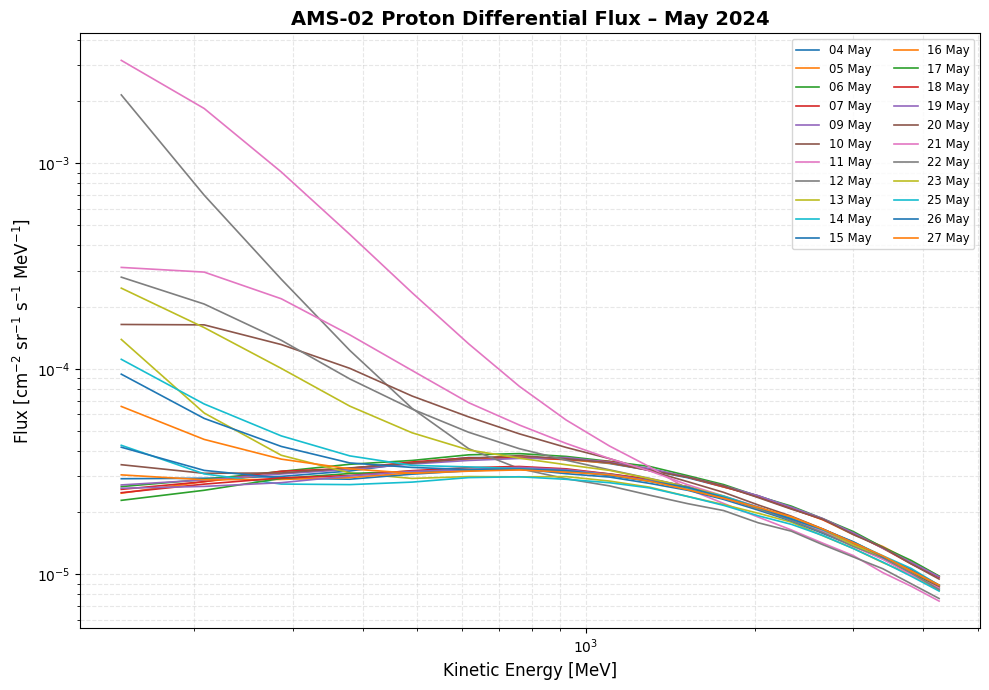

In [19]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt

# ==========================================
# 1. PATH E FILE
# ==========================================
folder_path = "Dati_AMS_MAY2024"
files = sorted(glob.glob(os.path.join(folder_path, "Proton_Flux_2024_5_*.txt")))

# ==========================================
# 2. CARICAMENTO FILE AMS (ROBUSTO)
# ==========================================
def load_ams_file(file):
    # Estrazione data dal nome file
    # Proton_Flux_2024_5_10.txt
    basename = os.path.basename(file)
    _, _, year, month, day = basename.replace(".txt", "").split("_")
    date_label = f"{int(day):02d} May"

    # Lettura: skip prima riga testuale
    df = pd.read_csv(
        file,
        sep=r"\s+",
        skiprows=1,
        names=["K_MeV", "Flux", "StatErr"]
    )

    # Forza conversione numerica (CRITICO)
    df["K_MeV"] = pd.to_numeric(df["K_MeV"], errors="coerce")
    df["Flux"] = pd.to_numeric(df["Flux"], errors="coerce")
    df["StatErr"] = pd.to_numeric(df["StatErr"], errors="coerce")

    df = df.dropna()
    df["date"] = date_label

    return df

# ==========================================
# 3. CARICAMENTO COMPLETO
# ==========================================
dfs = [load_ams_file(f) for f in files]
df_all = pd.concat(dfs, ignore_index=True)

# ==========================================
# 4. PLOT SPETTRI DIFFERENZIALI AMS-02
# ==========================================
plt.figure(figsize=(10, 7))

for date_label, df_day in df_all.groupby("date"):

    df_day = df_day.sort_values("K_MeV")

    plt.plot(
        df_day["K_MeV"].values.astype(float),
        df_day["Flux"].values.astype(float),
        lw=1.2,
        label=str(date_label)
    )

plt.xscale("log")
plt.yscale("log")

plt.xlabel("Kinetic Energy [MeV]", fontsize=12)
plt.ylabel(r"Flux [cm$^{-2}$ sr$^{-1}$ s$^{-1}$ MeV$^{-1}$]", fontsize=12)

plt.title(
    "AMS-02 Proton Differential Flux – May 2024",
    fontsize=14,
    fontweight="bold"
)

plt.grid(True, which="both", ls="--", alpha=0.3)
plt.legend(ncol=2, fontsize="small")
plt.tight_layout()
plt.show()


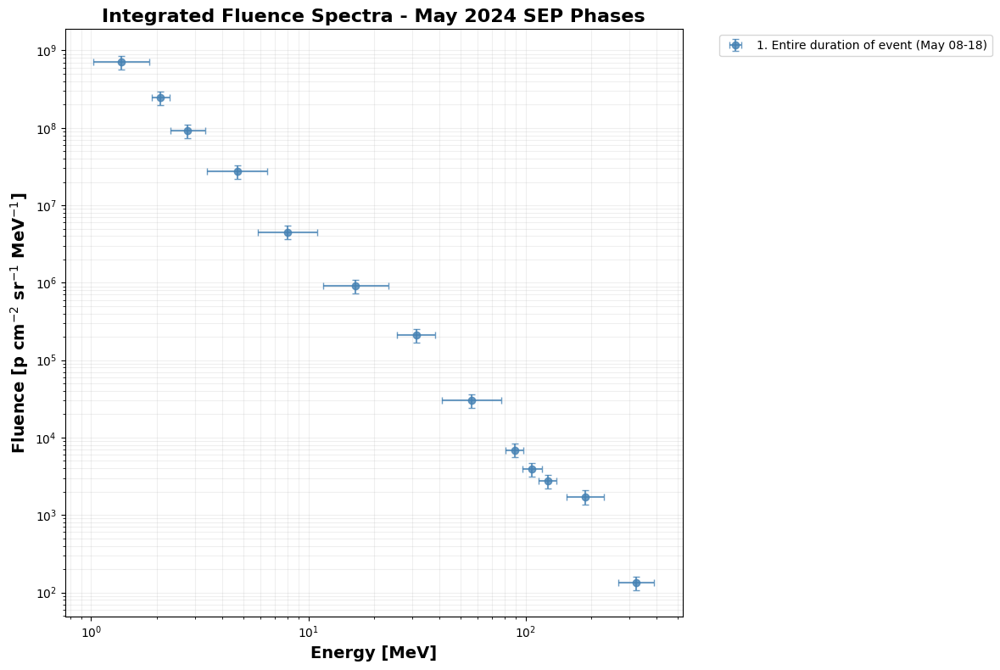

In [52]:
# CALCOLO FLUENZA 


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. SETUP: CANALI & EVENTI
# ==========================================


channel_bins = {
    0: (1.02, 1.86),   # P1
    1: (1.90, 2.30),   # P2
    2: (2.31, 3.34),   # P3
    3: (3.40, 6.48),   # P4
    4: (5.84, 11.0),   # P5
    5: (11.64, 23.27), # P6
    6: (25.5, 38.4),   # P7
    7: (41.0, 77.0),   # P8
    8: (80.9, 97.6),   # P9
    9: (96.3, 118.4),  # P10
    10: (114.88, 138.4), # P11
    11: (153.3, 229.3),  # P12
    12: (267.0, 390.0)   # P13
    }




e_eff_map = {
    0: 1.377,    # P1
    1: 2.090,    # P2
    2: 2.778,    # P3
    3: 4.694,    # P4
    4: 8.015,    # P5
    5: 16.458,   # P6
    6: 31.292,   # P7
    7: 56.187,   # P8
    8: 88.859,   # P9
    9: 106.780,  # P10
    10: 126.093, # P11
    11: 187.488, # P12
    12: 322.692  # P13
    }



    
events_dict = {

        "1° SEP 08-10 May": {
            "start": "2024-05-08 08:00:00", 
            "end":   "2024-05-10 16:00:00", 
            "color": "red"
        },
        "2° SEP 13-28 May": {
            "start": "2024-05-13 16:00:00", 
            "end":   "2024-05-28 00:00:00", 
            "color": "green"
        } 

    }


events_dict_refined = {
    # 1. L'Inizio (Flare X1.0): 8-9 Maggio
    # Primo incremento, spettro "seed" per gli eventi successivi.
    "1. Onset & Build-up (May 8-9)": {
        "start": "2024-05-08 06:00:00",
        "end":   "2024-05-10 00:00:00",
        "color": "orange"
    },

    # 2. La Tempesta Principale (Flare X3.9 + X5.8): 10-12 Maggio
    # Include il GLE #74 (11 Maggio). Fluenza massima e picco geomagnetico.
    "2. Main Storm / GLE 74 (May 10-12)": {
        "start": "2024-05-10 00:00:00",
        "end":   "2024-05-13 00:00:00",
        "color": "red"
    },

    # 3. Il "Ponte" (Decadimento + Flare X1.5): 13 Maggio
    # Una fase intermedia spesso trascurata ma con flusso ancora altissimo.
    "3. Decay Phase / Re-injection (May 13)": {
        "start": "2024-05-13 00:00:00",
        "end":   "2024-05-14 08:00:00",
        "color": "green"
    },

    # 4. L'Evento West Limb (Flare X8.7): 14-18 Maggio
    # L'evento più energetico in termini di raggi X, ma ben connesso magneticamente.
    # Spettro atteso molto duro (flat).
    "4. X8.7 West Limb Event (May 14-18)": {
        "start": "2024-05-14 08:00:00", # Onset preciso della nuova iniezione
        "end":   "2024-05-27 00:00:00",
        "color": "purple"
    }
}


events_dict_refined_2 = {
    # Background (pre-event baseline) — utile per stima del rumore/offset
    "0. Pre-event baseline (May 01-07)": {
        "start": "2024-05-01 00:00:00",
        "end":   "2024-05-07 23:59:59",
        "color": "lightgray"
    },

    # Onset / Build-up: attività eruptiva e CMEs iniziali (X1.0, X2.25 on 8-9 May)
    "1. Onset & Build-up (May 08-09)": {
        "start": "2024-05-08 00:00:00",
        "end":   "2024-05-10 00:00:00",
        "color": "orange"
    },

    # Main storm: arrivo dei CME e fase SEP principale che include GLE #74 (peak ~11 May)
    "2. Main Storm / GLE 74 (May 10-12)": {
        "start": "2024-05-10 00:00:00",
        "end":   "2024-05-13 00:00:00",
        "color": "red"
    },

    # Narrow GLE core (per correlazione con NM / per fluenza prompt)
    "2a. GLE core (11 May, narrow window)": {
        "start": "2024-05-11 00:00:00",
        "end":   "2024-05-11 12:00:00",
        "color": "crimson"
    },

    # Decay + possible re-injection (fase intermedia, ancora alta flux)
    "3. Decay Phase / Re-injection (May 13-14 early)": {
        "start": "2024-05-13 00:00:00",
        "end":   "2024-05-14 08:00:00",
        "color": "green"
    },

    # West-limb X8.7 event: iniezione ad energie alte / spettro duro
    "4. X8.7 West Limb Event (May 14 onset) - Prompt+Extended": {
        "start": "2024-05-14 08:00:00",
        "end":   "2024-05-18 00:00:00",
        "color": "purple"
    },

    # Extended tail: persistente elevazione di fondo fino a ritorno ai livelli di quiete
    "5. Extended tail / return-to-baseline (May 18-27)": {
        "start": "2024-05-18 00:00:00",
        "end":   "2024-05-27 00:00:00",
        "color": "steelblue"
    }
}




events_dict_refined_3 = {

    "1. Entire duration of event (May 08-18)": {
        "start": "2024-05-08 00:00:00",
        "end":   "2024-05-18 00:00:00",
        "color": "steelblue"
    }



}

# ==========================================
# 2. CALCOLO DELLA FLUENZA (INTEGRAZIONE)
# ==========================================
results_GOES18 = {}
CONV_KEV_TO_MEV = 1000.0 
SYS_ERROR_PCT = 0.20 # Possiamo abbassarlo al 20% poiché usiamo già l'incertezza L2

for name, params in events_dict_refined_3.items():
    # Slice per flussi e incertezze
    df_slice = df_goes18_corr.loc[params['start']:params['end']]
    df_unc_slice = df_goes18_uncert.loc[params['start']:params['end']]
    
    if df_slice.empty: continue

    dt_series = df_slice.index.to_series().diff().dt.total_seconds().fillna(300).clip(upper=600)

    fluences, y_errors, energies = [], [], []
    x_err_low, x_err_high = [], []
    
    for ch, (E_min, E_max) in channel_bins.items():
        if ch in df_slice.columns:
            # 1. Flusso e Incertezza strumentale convertiti in MeV
            flux_mev = df_slice[ch].fillna(0).clip(lower=0) * CONV_KEV_TO_MEV
            unc_mev = df_unc_slice[ch].fillna(0) * CONV_KEV_TO_MEV
            
            # 2. Integrazione Fluenza
            fluence_val = (flux_mev * dt_series).sum()
            
            # 3. Propagazione Errore Strumentale: sqrt(sum(sigma_i * dt_i)^2)
            inst_error_sq = ((unc_mev * dt_series)**2).sum()
            
            if fluence_val > 1.0:
                eff_e = e_eff_map[ch]
                fluences.append(fluence_val)
                energies.append(eff_e)
                
                # 4. Errore Totale (Strumentale + Sistematico)
                total_error = np.sqrt(inst_error_sq + (SYS_ERROR_PCT * fluence_val)**2)
                y_errors.append(total_error)
                
                x_err_low.append(eff_e - E_min)
                x_err_high.append(E_max - eff_e)
    
    results_GOES18[name] = {
        'x': np.array(energies), 'y': np.array(fluences), 'y_err': np.array(y_errors),
        'x_err': [np.array(x_err_low), np.array(x_err_high)], 'color': params['color']
    }
# ==========================================
# 3. PLOT DEGLI SPETTRI DI FLUENZA
# ==========================================
plt.figure(figsize=(12, 8))

for name, data in results_GOES18.items():
    if "Pre-event" in name: continue # Non plottiamo il background sottratto
    
    plt.errorbar(data['x'], data['y'], xerr=data['x_err'], yerr=data['y_err'],
                 fmt='o', color=data['color'], label=name, capsize=3, alpha=0.8)

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14, fontweight='bold')
plt.title("Integrated Fluence Spectra - May 2024 SEP Phases", fontsize=16, fontweight='bold')
plt.grid(True, which="both", alpha=0.2)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# FIT TEST Solo GOES

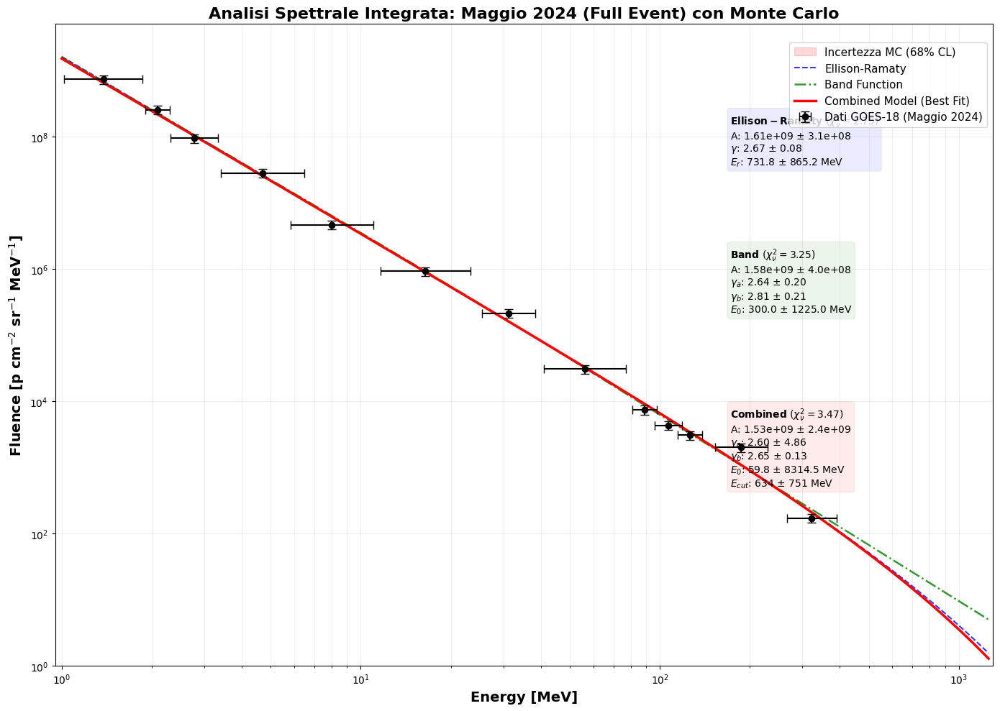

In [9]:
# =========================================================
# 4. FIT FINALE E BANDE DI CONFIDENZA MONTE CARLO (REFined)
# =========================================================
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- 1. MODELLI FISICI CON PROTEZIONE OVERFLOW ---
def ellison_ramaty(E, A, gamma, Er):
    with np.errstate(over='ignore', invalid='ignore'):
        res = A * (E**-gamma) * np.exp(-np.clip(E/Er, None, 150))
    return np.nan_to_num(res, nan=1e-30)

def band_function(E, A, ga, gb, E0):
    if gb <= ga + 0.05: return np.ones_like(E) * 1e-30
    eb = (gb - ga) * E0
    with np.errstate(over='ignore', invalid='ignore'):
        res = np.where(E < eb, 
                       A * (E**-ga) * np.exp(-np.clip(E/E0, None, 150)),
                       A * (eb**(gb-ga)) * np.exp(ga-gb) * (E**-gb))
    return np.nan_to_num(res, nan=1e-30)

def combined_function(E, A, ga, gb, E0, E_cut):
    band = band_function(E, A, ga, gb, E0)
    with np.errstate(over='ignore', invalid='ignore'):
        res = band * np.exp(-np.clip(E / E_cut, None, 150))
    return np.nan_to_num(res, nan=1e-30)

# --- 2. FUNZIONI DI SUPPORTO PER FIT E STATISTICHE ---
def fit_engine(func, x, y, y_err, p0, bounds):
    mask = (y > 0)
    sigma_log = y_err[mask] / (y[mask] * np.log(10))
    try:
        popt, pcov = curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-30)), 
                               x[mask], np.log10(y[mask]), p0=p0, sigma=sigma_log, 
                               absolute_sigma=True, bounds=bounds, maxfev=20000)
        return popt, pcov
    except: return None, None

def get_stats_label(name, func, x, y, y_err, popt, pcov):
    if popt is None: return rf"$\bf{{{name}}}$: Fit Failed"
    chi_red = np.sum(((y - func(x, *popt)) / y_err)**2) / (len(y) - len(popt))
    perr = np.sqrt(np.diag(pcov))
    txt = rf"$\bf{{{name}}}$ ($\chi^2_\nu={chi_red:.2f}$)" + "\n"
    if name == "Ellison-Ramaty":
        txt += rf"A: {popt[0]:.2e} $\pm$ {perr[0]:.1e}" + "\n" + rf"$\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n" + rf"$E_r$: {popt[2]:.1f} $\pm$ {perr[2]:.1f} MeV"
    else:
        txt += rf"A: {popt[0]:.2e} $\pm$ {perr[0]:.1e}" + "\n" + rf"$\gamma_a$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n" + rf"$\gamma_b$: {popt[2]:.2f} $\pm$ {perr[2]:.2f}" + "\n" + rf"$E_0$: {popt[3]:.1f} $\pm$ {perr[3]:.1f} MeV"
        if name == "Combined": txt += "\n" + rf"$E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
    return txt

# --- 3. PREPARAZIONE DATI E ESECUZIONE FIT ---
data = results_GOES18["1. Entire duration of event (May 08-27)"]
x_obs, y_obs, y_err = data['x'], data['y'], data['y_err']
y_err_fit = y_obs * 0.30 # Errore sistematico al 30% per la pesatura

# Fit dei 3 modelli con bounds ottimizzati per Maggio 2024
popt_er, pcov_er = fit_engine(ellison_ramaty, x_obs, y_obs, y_err_fit, [1e9, 2.0, 100], ([1e7, 0.5, 10], [1e13, 5, 3000]))
popt_b, pcov_b = fit_engine(band_function, x_obs, y_obs, y_err_fit, [1e9, 1.5, 3.5, 30], ([1e7, 0.5, 1.8, 1.0], [1e13, 3.0, 6.0, 300]))
popt_c, pcov_c = fit_engine(combined_function, x_obs, y_obs, y_err_fit, [1e9, 1.5, 3.5, 30, 800], ([1e7, 0.5, 1.8, 1.0, 50], [1e13, 3.0, 6.0, 300, 5000]))

# --- 4. SIMULAZIONE MONTE CARLO (Banda di Confidenza) ---
# Usiamo il modello Combined per l'incertezza perché è il più fisicamente completo
N_MC = 1000
x_grid = np.logspace(0, 3.1, 500)
rng = np.random.default_rng(42)
sampled_params = rng.multivariate_normal(popt_c, pcov_c, N_MC)
mc_fits = np.array([combined_function(x_grid, *p) for p in sampled_params])

# Calcolo percentili nello spazio LOG per evitare che la banda cada sul fondo del grafico
log_mc = np.log10(np.maximum(mc_fits, 1e-12))
Phi_med = 10**np.median(log_mc, axis=0)
Phi_lo, Phi_hi = 10**np.percentile(log_mc, [16, 84], axis=0) # 68% CL Interval

# --- 5. PLOT FINALE ---
plt.figure(figsize=(14, 10))
plt.errorbar(x_obs, y_obs, yerr=data['y_err'], xerr=data['x_err'], fmt='ko', markersize=6, capsize=4, label='Dati GOES-18 (Maggio 2024)', zorder=10)

# Banda Monte Carlo
plt.fill_between(x_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza MC (68% CL)', zorder=1)

# Curve dei Modelli
plt.plot(x_grid, ellison_ramaty(x_grid, *popt_er), 'b--', alpha=0.8, label='Ellison-Ramaty')
plt.plot(x_grid, band_function(x_grid, *popt_b), 'g-.', lw=1.8, alpha=0.8, label='Band Function')
plt.plot(x_grid, combined_function(x_grid, *popt_c), 'r-', lw=2.5, label='Combined Model (Best Fit)')

# Box Statistici (Spostati a destra per pulizia visiva)
plt.text(0.72, 0.78, get_stats_label("Ellison-Ramaty", ellison_ramaty, x_obs, y_obs, data['y_err'], popt_er, pcov_er), transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='blue', alpha=0.08, edgecolor='gray', boxstyle='round'))
plt.text(0.72, 0.55, get_stats_label("Band", band_function, x_obs, y_obs, data['y_err'], popt_b, pcov_b), transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='green', alpha=0.08, edgecolor='gray', boxstyle='round'))
plt.text(0.72, 0.28, get_stats_label("Combined", combined_function, x_obs, y_obs, data['y_err'], popt_c, pcov_c), transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='red', alpha=0.08, edgecolor='gray', boxstyle='round'))

# Configurazione Assi
plt.xscale('log'); plt.yscale('log')
plt.xlim(0.95, 1300); plt.ylim(1e0, 5e9)
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14, fontweight='bold')
plt.title("Analisi Spettrale Integrata: Maggio 2024 (Full Event) con Monte Carlo", fontsize=16, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.legend(loc='upper right', frameon=True, fontsize=11, bbox_to_anchor=(1.0, 0.98))
plt.tight_layout()
plt.show()

# ACE DATA 


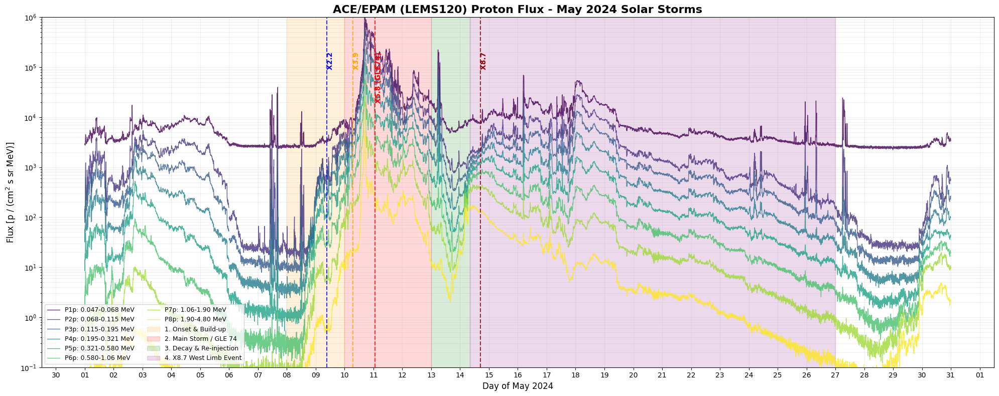

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. FUNZIONE CARICAMENTO DATI ACE (OTTIMIZZATA)
# ==========================================

def load_ace_epam_fixed(file_path):
    header_cols = []
    start_row = 0
    
    with open(file_path, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split()
        if "BEGIN DATA" in line:
            start_row = i + 1
            break
    
    if not header_cols:
        print("Errore: Header non trovato.")
        return None

    # Fix SyntaxWarning: r'\s+' (raw string)
    try:
        df = pd.read_csv(
            file_path, 
            sep=r'\s+', 
            names=header_cols, 
            skiprows=start_row, 
            index_col=False
        )
    except Exception as e:
        print(f"Errore lettura: {e}")
        return None

    try:
        time_str = df['year'].astype(str) + ' ' + \
                   df['day'].astype(str) + ' ' + \
                   df['hr'].astype(str) + ' ' + \
                   df['min'].astype(str) + ' ' + \
                   df['sec'].astype(int).astype(str)
        
        df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
        df.set_index('epoch', inplace=True)
        
        # Fix FutureWarning: use .map instead of .applymap
        cols_to_clean = [c for c in df.columns if 'P' in c or 'E' in c]
        df[cols_to_clean] = df[cols_to_clean].map(lambda x: np.nan if x < 0 else x)
        
        return df
    except Exception as e:
        print(f"Errore conversione date: {e}")
        return None

# Caricamento
file_path_ace = "MAY 2024/ACE_EPAM_Data (6).txt"
df_ace = load_ace_epam_fixed(file_path_ace)


if df_ace is not None:
    # --- CONFIGURAZIONE CANALI ---
    ace_labels = {
        'P1p': '0.047-0.068 MeV', 'P2p': '0.068-0.115 MeV', 'P3p': '0.115-0.195 MeV',
        'P4p': '0.195-0.321 MeV', 'P5p': '0.321-0.580 MeV', 'P6p': '0.580-1.06 MeV',
        'P7p': '1.06-1.90 MeV', 'P8p': '1.90-4.80 MeV'
    }
    
    # --- SINCRONIZZAZIONE PERIODI (Refined) ---
    events_ace = {
        "1. Onset & Build-up": {"start": "2024-05-08 00:00:00", "end": "2024-05-10 00:00:00", "color": "orange"},
        "2. Main Storm / GLE 74": {"start": "2024-05-10 00:00:00", "end": "2024-05-13 00:00:00", "color": "red"},
        "3. Decay & Re-injection": {"start": "2024-05-13 00:00:00", "end": "2024-05-14 08:00:00", "color": "green"},
        "4. X8.7 West Limb Event": {"start": "2024-05-14 08:00:00", "end": "2024-05-27 00:00:00", "color": "purple"}
    }

    flare_markers = [
        ('2024-05-09 09:13', 'X2.2', 'blue'),
        ('2024-05-10 06:53', 'X3.9', 'orange'),
        ('2024-05-11 01:23', 'X5.8 (GLE74)', 'red'),
        ('2024-05-14 16:51', 'X8.7', 'darkred')
    ]
    
    plt.figure(figsize=(20, 8))
    # Taglio del dataframe per il mese di Maggio
    df_plot = df_ace.loc['2024-05-01':'2024-05-30']
    
    colors = plt.cm.viridis(np.linspace(0, 1, len(ace_labels)))
    for i, (col, label) in enumerate(ace_labels.items()):
        if col in df_plot.columns:
            plt.plot(df_plot.index, df_plot[col], label=f"{col}: {label}", color=colors[i], lw=1, alpha=0.8)
            
    # Regioni Shaded sincronizzate
    for event, d in events_ace.items():
        plt.axvspan(pd.to_datetime(d["start"]), pd.to_datetime(d["end"]), color=d["color"], alpha=0.15, label=event)
        
    # Marker dei Flare
    for date, label, color in flare_markers:
        dt = pd.to_datetime(date)
        plt.axvline(dt, color=color, ls='--', lw=1.5, alpha=0.8)
        plt.text(dt, 2e5, f" {label}", color=color, rotation=90, fontweight='bold', va='top')

    plt.yscale('log')
    plt.ylim(1e-1, 1e6)
    plt.title('ACE/EPAM (LEMS120) Proton Flux - May 2024 Solar Storms', fontsize=16, fontweight='bold')
    plt.ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=12)
    plt.grid(True, which="both", alpha=0.2)
    plt.legend(loc='lower left', fontsize=9, ncol=2)
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d'))
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.xlabel('Day of May 2024', fontsize=12)
    plt.tight_layout()
    plt.show()

<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
C:\Users\stefa\AppData\Local\Temp\ipykernel_4900\711141792.py:39: SyntaxWarning: invalid escape sequence '\s'
  sep='\s+',           # Separatore spazi multipli (Fix Warning)
C:\Users\stefa\AppData\Local\Temp\ipykernel_4900\711141792.py:67: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[cols_to_clean] = df[cols_to_clean].applymap(lambda x: np.nan if x < 0 else x)


Header trovato: ['year', 'day', 'hr', 'min', 'sec', 'W3', 'W4', 'W5', 'W6', 'W7', 'W8', 'unc_W3', 'unc_W4', 'unc_W5', 'unc_W6', 'unc_W7', 'unc_W8', 'P1p', 'P2p', 'P3p', 'P4p', 'P5p', 'P6p', 'P7p', 'P8p', 'unc_P1p', 'unc_P2p', 'unc_P3p', 'unc_P4p', 'unc_P5p', 'unc_P6p', 'unc_P7p', 'unc_P8p']
Dati iniziano alla riga: 68
Dati ACE caricati!


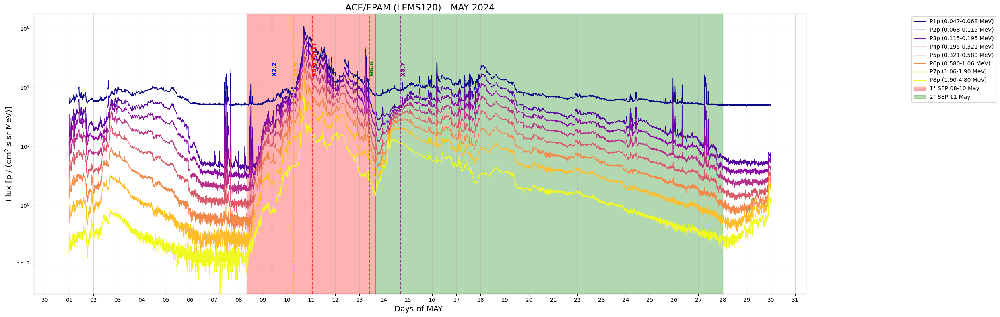

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. FUNZIONE CARICAMENTO DATI ACE (Corretta)
# ==========================================

def load_ace_epam_fixed(file_path):
    # 1. Scansione preliminare per trovare header e inizio dati
    header_cols = []
    start_row = 0
    
    with open(file_path, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        # Troviamo la riga che contiene i nomi delle colonne
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split() # Divide per spazi
        
        # Troviamo dove iniziano i dati
        if "BEGIN DATA" in line:
            start_row = i + 1 # I dati iniziano alla riga successiva
            break
    
    if not header_cols:
        print("Errore: Non ho trovato la riga dell'header (year day hr...)")
        return None

    print(f"Header trovato: {header_cols}")
    print(f"Dati iniziano alla riga: {start_row}")

    # 2. Caricamento con Pandas usando i nomi trovati
    try:
        df = pd.read_csv(
            file_path, 
            sep='\s+',           # Separatore spazi multipli (Fix Warning)
            names=header_cols,   # Assegniamo i nomi manualmente
            skiprows=start_row,  # Saltiamo tutto fino ai dati veri
            index_col=False      # Non usare la prima colonna come indice subito
        )
    except Exception as e:
        print(f"Errore lettura CSV: {e}")
        return None

    # 3. Creazione della colonna Data (Epoch)
    # ACE usa Anno e Giorno dell'Anno (DOY). Convertiamo in datetime.
    # Creiamo una stringa: "2005 1 12 30 00" (Anno Giorno Ora Min Sec)
    try:
        # Convertiamo tutto in stringa e concateniamo con spazi
        time_str = df['year'].astype(str) + ' ' + \
                   df['day'].astype(str) + ' ' + \
                   df['hr'].astype(str) + ' ' + \
                   df['min'].astype(str) + ' ' + \
                   df['sec'].astype(int).astype(str)
        
        # Parsiamo la data. %j è il codice per "Day of Year"
        df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
        
        # Impostiamo come indice
        df.set_index('epoch', inplace=True)
        
        # Pulizia valori negativi (errori strumento)
        cols_to_clean = [c for c in df.columns if 'P' in c or 'E' in c]
        df[cols_to_clean] = df[cols_to_clean].applymap(lambda x: np.nan if x < 0 else x)
        
        return df
        
    except Exception as e:
        print(f"Errore conversione date: {e}")
        return None

# ==========================================
# 2. ESECUZIONE
# ==========================================

file_path_ace = "MAY 2024/ACE_EPAM_Data (6).txt"  # Assicurati che il nome file sia giusto
df_ace = load_ace_epam_fixed(file_path_ace)

if df_ace is not None:
    print("Dati ACE caricati!")
    
    # --- PLOT LEMS120 (Canali P') ---
    ace_labels = {
        'P1p': '0.047-0.068 MeV',
        'P2p': '0.068-0.115 MeV',
        'P3p': '0.115-0.195 MeV',
        'P4p': '0.195-0.321 MeV',
        'P5p': '0.321-0.580 MeV',
        'P6p': '0.580-1.06 MeV',
        'P7p': '1.06-1.90 MeV',
        'P8p': '1.90-4.80 MeV'
    }
    
    t_start = '2024-05-01 00:00'
    t_end   = '2024-05-30 00:00'
    
    df_plot = df_ace.loc[t_start:t_end]

    events_dict = {

        "1° SEP 08-10 May": {
            "start": "2024-05-08 08:00:00", 
            "end":   "2024-05-13 16:00:00", 
            "color": "red"
        },
        "2° SEP 11 May": {
            "start": "2024-05-13 16:00:00", 
            "end":   "2024-05-28 00:00:00", 
            "color": "green"
        } 

    }


    # Lista dei Flare da marcare: (Data_Ora, Etichetta, Colore)
    flare_markers_may2024 = [
    ('2024-05-09 09:13', 'X2.2', 'blue'),   # Primo botto
    ('2024-05-10 06:53', 'X3.9', 'orange'), # Secondo botto
    ('2024-05-11 01:23', 'X5.8 (GLE)', 'red'), # Il mostro (GLE 74)
    ('2024-05-13 09:44', 'M6.6', 'green'),   # L'ultimo della serie prima dell'X8.7
    ('2024-05-14 16:51', 'X8.7', 'purple')   # Il botto finale
    ]
    
    plt.figure(figsize=(25, 8))
    colors = plt.cm.plasma(np.linspace(0, 1, len(ace_labels)))
    
    for i, (col, label) in enumerate(ace_labels.items()):
        if col in df_plot.columns:
            plt.plot(df_plot.index, df_plot[col], label=f"{col} ({label})", 
                     color=colors[i], linewidth=1)
            
    plt.yscale('log')
    plt.title('ACE/EPAM (LEMS120) - MAY 2024', fontsize=16)
    plt.ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=14)
    plt.xlabel('Days of MAY ', fontsize=14)
    #regioni shaded da events_dict
    for event, details in events_dict.items():
        plt.axvspan(pd.to_datetime(details["start"]), pd.to_datetime(details["end"]), 
                    color=details["color"], alpha=0.3, label=event)
        
    # --- AGGIUNTA LINEE FLARE VERTICALI ---
    for date, label, color in flare_markers_may2024:
        # Converti stringa in datetime
        dt_flare = pd.to_datetime(date)
        # 
        # Disegna la linea verticale
        plt.axvline(dt_flare, color=color, linestyle='--', linewidth=1.5, alpha=0.7)
        
        # Aggiungi l'etichetta di testo in alto
        # y_pos: Scegli un valore alto nel grafico (es. 10^4 o 10^5) dove c'è spazio
        # rotation=90: Scritta verticale per non occupare spazio
        plt.text(dt_flare, 2e4, f" {label}", color=color, rotation=90, 
                verticalalignment='bottom', fontweight='bold', fontsize=10)
    
        
    plt.grid(True, which="major", alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d'))
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.tight_layout()
    plt.show()

# Rimozione Background e calcolo fluenza ACE

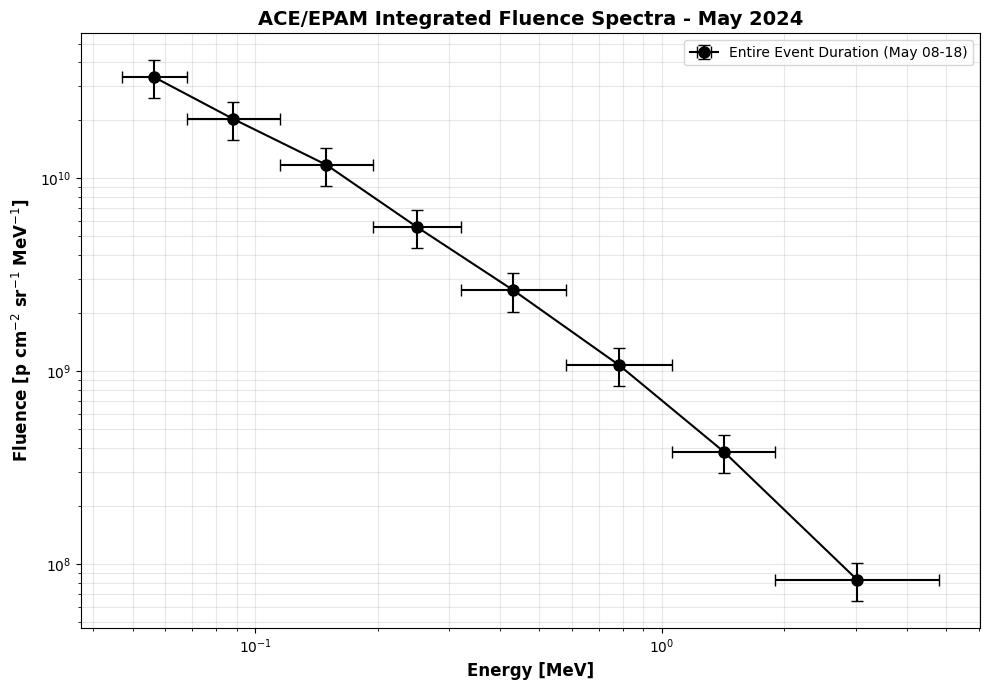

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================
# 1. SETUP CANALI ACE & EVENTO TOTALE
# ==========================================
ace_bins_info = {
    'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.06),
    'P7p': (1.06, 1.90),   'P8p': (1.90, 4.80)
}

# Calcolo Energie Efficaci (Media Geometrica)
ace_channels = {ch: {'e_eff': np.sqrt(mn * mx), 'err_l': np.sqrt(mn * mx) - mn, 'err_h': mx - np.sqrt(mn * mx)} 
                for ch, (mn, mx) in ace_bins_info.items()}

# Aggiungiamo l'evento richiesto (Tutto il periodo)
events_ace_fluence = {
    "Entire Event Duration (May 08-18)": {
        "start": "2024-05-08 00:00:00", 
        "end": "2024-05-18 00:00:00", 
        "color": "black"
    },
   # "Main Storm / GLE 74 (May 10-13)": {
   #     "start": "2024-05-10 00:00:00", 
   #     "end": "2024-05-13 00:00:00", 
   #     "color": "red"
   # }
}

# ==========================================
# 2. RIMOZIONE BACKGROUND & CALCOLO
# ==========================================
# Baseline (1-7 Maggio)
bg_levels = df_ace.loc["2024-05-01":"2024-05-07", list(ace_bins_info.keys())].mean()
df_ace_clean = df_ace.copy()
for ch in ace_bins_info.keys():
    df_ace_clean[ch] = (df_ace[ch] - bg_levels[ch]).clip(lower=1e-5)

results_ACE = {}
SYS_ERR = 0.20  # 20% sistematico
STAT_ERR = 0.10 # 10% statistico stimato

for name, p in events_ace_fluence.items():
    df_slice = df_ace_clean.loc[p['start']:p['end']]
    if df_slice.empty: continue

    # FIX: .bfill() invece di fillna(method='bfill') per evitare FutureWarning
    dt = df_slice.index.to_series().diff().dt.total_seconds().bfill()

    energies, fluences, y_errs = [], [], []
    x_err_low, x_err_high = [], []
    
    for ch, info in ace_channels.items():
        if ch in df_slice.columns:
            f_val = (df_slice[ch] * dt).sum()
            if f_val > 0:
                fluences.append(f_val)
                energies.append(info['e_eff'])
                # Propagazione errore totale (quadratica)
                y_errs.append(f_val * np.sqrt(SYS_ERR**2 + STAT_ERR**2))
                x_err_low.append(info['err_l'])
                x_err_high.append(info['err_h'])
    
    results_ACE[name] = {
        'x': np.array(energies), 'y': np.array(fluences), 'y_err': np.array(y_errs),
        'x_err': [np.array(x_err_low), np.array(x_err_high)], 'color': p['color']
    }

# ==========================================
# 3. PLOT DEGLI SPETTRI
# ==========================================
plt.figure(figsize=(10, 7))
for name, data in results_ACE.items():
    plt.errorbar(data['x'], data['y'], xerr=data['x_err'], yerr=data['y_err'],
                 fmt='o-', color=data['color'], label=name, capsize=4, markersize=8)

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12, fontweight='bold')
plt.title("ACE/EPAM Integrated Fluence Spectra - May 2024", fontsize=14, fontweight='bold')
plt.grid(True, which="both", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Unione ACE E GOES

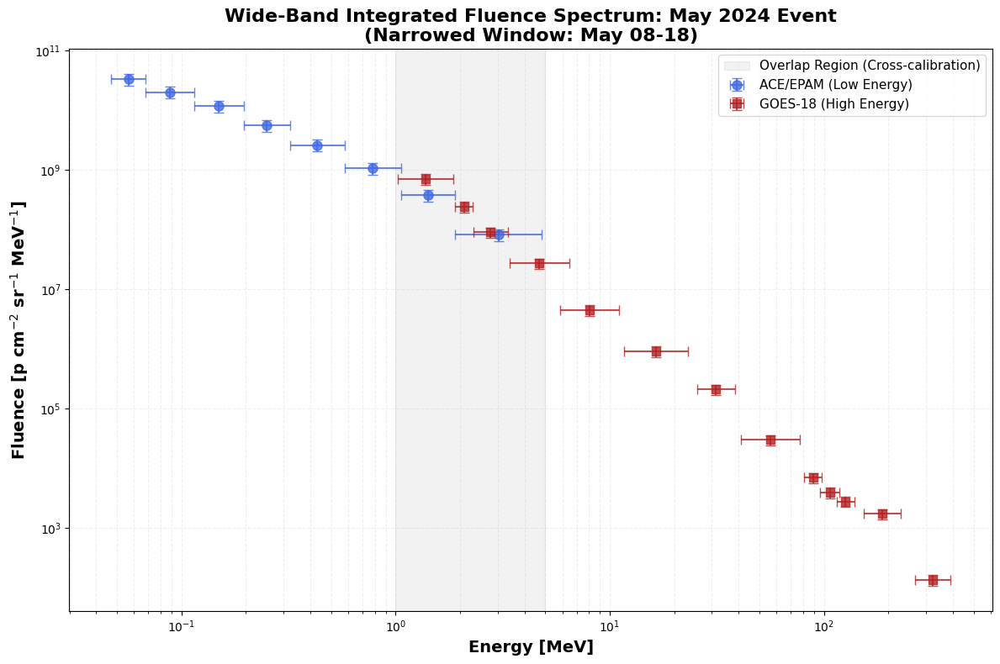


--- VERIFICA MATCHING (May 08-18) ---
ACE Ultimo Canale (3.02 MeV): 8.28e+07
GOES Primo Canale (1.38 MeV): 7.10e+08
Rapporto di continuità: 0.12 (Ottimale se vicino a 1)


In [53]:
import matplotlib.pyplot as plt
import numpy as np

# ==========================================
# 1. PREPARAZIONE DATI COMBINATI
# ==========================================
# ATTENZIONE: Assicurati che queste chiavi siano IDENTICHE a quelle 
# usate nelle celle dove hai calcolato results_ACE e results_GOES18.

event_key_ace = "Entire Event Duration (May 08-18)"
event_key_goes = "1. Entire duration of event (May 08-18)"

plt.figure(figsize=(12, 8))

# --- PLOT ACE/EPAM (Basse Energie) ---
if event_key_ace in results_ACE:
    data_ace = results_ACE[event_key_ace]
    plt.errorbar(data_ace['x'], data_ace['y'], 
                 xerr=data_ace['x_err'], yerr=data_ace['y_err'],
                 fmt='o', color='royalblue', label='ACE/EPAM (Low Energy)', 
                 capsize=4, markersize=8, alpha=0.8)
else:
    print(f"Errore: Chiave '{event_key_ace}' non trovata in results_ACE")

# --- PLOT GOES-18 (Alte Energie) ---
if event_key_goes in results_GOES18:
    data_goes = results_GOES18[event_key_goes]
    plt.errorbar(data_goes['x'], data_goes['y'], 
                 xerr=data_goes['x_err'], yerr=data_goes['y_err'],
                 fmt='s', color='firebrick', label='GOES-18 (High Energy)', 
                 capsize=4, markersize=7, alpha=0.8)
else:
    print(f"Errore: Chiave '{event_key_goes}' non trovata in results_GOES18")

# ==========================================
# 2. SEZIONE CROSS-CHECK (OVERLAP)
# ==========================================
# Evidenziamo la regione dove i due strumenti si sovrappongono
plt.axvspan(1.0, 5.0, color='gray', alpha=0.1, label='Overlap Region (Cross-calibration)')

# Configurazione Grafico
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14, fontweight='bold')
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14, fontweight='bold')
plt.title("Wide-Band Integrated Fluence Spectrum: May 2024 Event\n(Narrowed Window: May 08-18)", 
          fontsize=16, fontweight='bold')

plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend(loc='upper right', fontsize=11)

plt.tight_layout()
plt.show()

# ==========================================
# 3. VERIFICA DEI DATI (DEBUG PRINT)
# ==========================================
print("\n--- VERIFICA MATCHING (May 08-18) ---")
if event_key_ace in results_ACE and event_key_goes in results_GOES18:
    ace_last_val = results_ACE[event_key_ace]['y'][-1]
    ace_last_e = results_ACE[event_key_ace]['x'][-1]
    goes_first_val = results_GOES18[event_key_goes]['y'][0]
    goes_first_e = results_GOES18[event_key_goes]['x'][0]
    
    print(f"ACE Ultimo Canale ({ace_last_e:.2f} MeV): {ace_last_val:.2e}")
    print(f"GOES Primo Canale ({goes_first_e:.2f} MeV): {goes_first_val:.2e}")
    print(f"Rapporto di continuità: {ace_last_val/goes_first_val:.2f} (Ottimale se vicino a 1)")

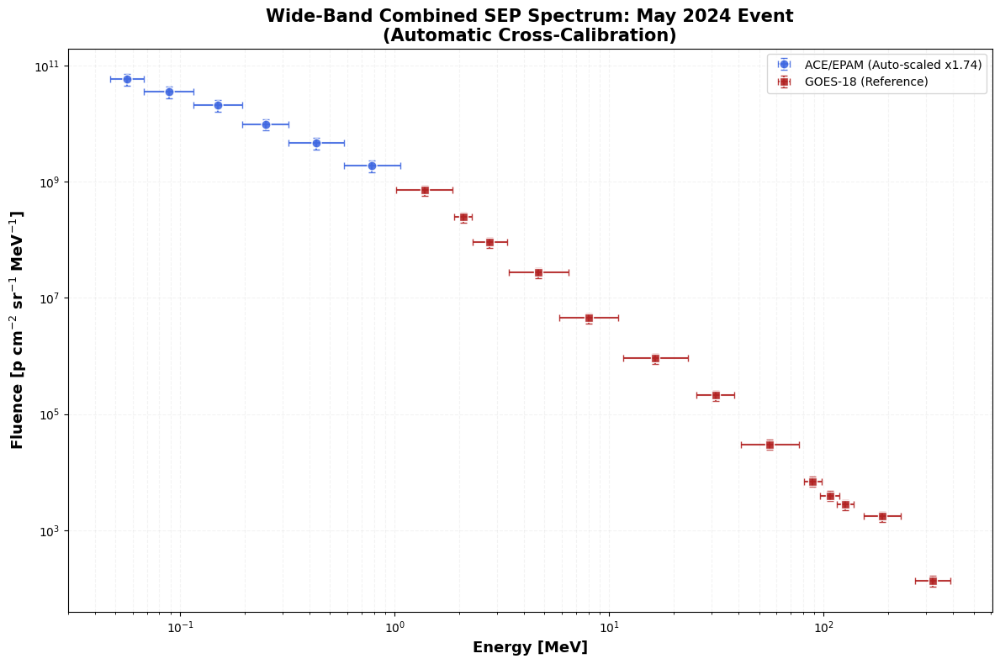

--- RISULTATO CALIBRAZIONE ---
Fattore di scala calcolato: 1.744
Pendenza ACE locale (gamma): 2.03


In [54]:
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. FUNZIONE PER CALCOLO AUTOMATICO SCALING (CORRETTA)
# ==========================================
def calculate_auto_scaling(d_ace, d_goes):
    # Prendiamo gli ultimi due punti validi di ACE per calcolare la pendenza locale
    x_ace = d_ace['x'][-2:]
    y_ace = d_ace['y'][-2:]
    
    # Fit lineare in log-log: log(y) = -gamma * log(x) + log(C)
    coeffs = np.polyfit(np.log10(x_ace), np.log10(y_ace), 1)
    gamma_val = -coeffs[0]  # Pendenza locale
    constant = 10**coeffs[1]
    
    # Primo punto di GOES (riferimento)
    x_ref = d_goes['x'][0]
    y_ref = d_goes['y'][0]
    
    # Previsione di ACE all'energia di GOES usando la pendenza calcolata
    y_predicted = constant * (x_ref**(-gamma_val))
    
    # Calcolo fattore di scala
    scaling_f = y_ref / y_predicted
    
    return scaling_f, gamma_val

# ==========================================
# 2. APPLICAZIONE E FILTRAGGIO
# ==========================================
key_ace = "Entire Event Duration (May 08-18)"
key_goes = "1. Entire duration of event (May 08-18)"
E_CUTOFF_ACE = 1.0 

# Inizializziamo le variabili per evitare NameError se l'if fallisce
auto_factor = 1.0
gamma = 0.0

if key_ace in results_ACE and key_goes in results_GOES18:
    d_ace_orig = results_ACE[key_ace]
    d_goes = results_GOES18[key_goes]
    
    # Riceviamo ENTRAMBI i valori dalla funzione
    auto_factor, gamma = calculate_auto_scaling(d_ace_orig, d_goes)
    
    # Maschera e applicazione scaling
    mask = d_ace_orig['x'] < E_CUTOFF_ACE
    ace_final = {
        'x': d_ace_orig['x'][mask],
        'y': d_ace_orig['y'][mask] * auto_factor,
        'y_err': d_ace_orig['y_err'][mask] * auto_factor,
        'x_err': [d_ace_orig['x_err'][0][mask], d_ace_orig['x_err'][1][mask]]
    }

# ==========================================
# 3. PLOT FINALE
# ==========================================
plt.figure(figsize=(12, 8))

plt.errorbar(ace_final['x'], ace_final['y'], xerr=ace_final['x_err'], yerr=ace_final['y_err'],
             fmt='o', color='royalblue', label=f'ACE/EPAM (Auto-scaled x{auto_factor:.2f})', 
             capsize=3, markersize=8, markeredgecolor='white', alpha=0.9)

plt.errorbar(d_goes['x'], d_goes['y'], xerr=d_goes['x_err'], yerr=d_goes['y_err'],
             fmt='s', color='firebrick', label='GOES-18 (Reference)', 
             capsize=3, markersize=7, markeredgecolor='white', alpha=0.9)

plt.xscale('log'); plt.yscale('log')
plt.grid(True, which="both", alpha=0.15, ls='--')
plt.xlabel("Energy [MeV]", fontsize=13, fontweight='bold')
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=13, fontweight='bold')
plt.title("Wide-Band Combined SEP Spectrum: May 2024 Event\n(Automatic Cross-Calibration)", fontsize=15, fontweight='bold')
plt.legend(frameon=True, loc='upper right')

plt.tight_layout()
plt.show()

print(f"--- RISULTATO CALIBRAZIONE ---")
print(f"Fattore di scala calcolato: {auto_factor:.3f}")
print(f"Pendenza ACE locale (gamma): {gamma:.2f}")

# FIT (08-18)  band e range 1-1000MeV più vicino a JUL 2012


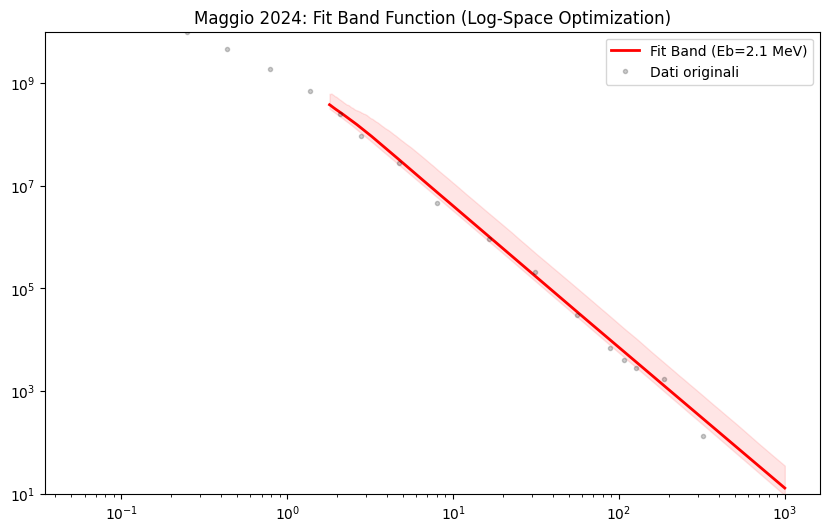

FIT COMPLETATO SENZA ERRORI
Energy Break (Eb): 2.09 MeV
gamma2: 2.76


In [56]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ==========================================
# 1. FUNZIONE BAND IN SPAZIO LOGARITMICO
# ==========================================
def log10_band_function(E, logA, ga, gb, E0):
    """Restituisce il log10 della fluenza per evitare overflow"""
    A = 10**logA
    E0 = np.maximum(E0, 1e-6)
    ebreak = np.abs((gb - ga) * E0)
    
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    
    # Calcolo logaritmico per la parte bassa
    res[mask_low] = logA - ga*np.log10(E[mask_low]) - (E[mask_low]/(E0 * np.log(10)))
    
    # Calcolo logaritmico per la parte alta (raccordo power-law)
    term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)
    res[~mask_low] = logA + term_break - gb*np.log10(E[~mask_low])
    
    return res

# ==========================================
# 2. PREPARAZIONE DATI (RANGE 08-18 MAGGIO)
# ==========================================
E_all = np.concatenate([ace_final['x'], d_goes['x']])
Y_all = np.concatenate([ace_final['y'], d_goes['y']])

# Filtro per focalizzarsi sulla coda energetica (Confronto JUL 2012)
mask_fit = E_all >= 1.0
E_fit = E_all[mask_fit]
Y_fit = Y_all[mask_fit]

# ==========================================
# 3. ESECUZIONE FIT STABILE
# ==========================================
# P0: [log10(A), ga, gb, E0]
p0_log = [9.0, 1.1, 3.2, 15.0]
bounds_log = ([5.0, 0.1, 2.0, 1.0], [13.0, 2.5, 6.0, 150.0])

popt_log, pcov_log = curve_fit(log10_band_function, E_fit, np.log10(Y_fit), 
                               p0=p0_log, bounds=bounds_log)

# Monte Carlo per Mediana
E_grid = np.logspace(np.log10(1.8), 3, 500)
rng = np.random.default_rng(42)
# Stabilizzazione della matrice per evitare il warning "positive-semidefinite"
pcov_stable = pcov_log + np.eye(len(popt_log)) * 1e-9
p_samples = rng.multivariate_normal(popt_log, pcov_stable, size=1000)

Phi_MC = np.array([10**log10_band_function(E_grid, *ps) for ps in p_samples])
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

Eb_calc = (popt_log[2] - popt_log[1]) * popt_log[3]

# ==========================================
# 4. EXPORT SR-NIEL (CONSOLIDATO)
# ==========================================
for geom, sa in {"Planare": np.pi, "Sferico": 4*np.pi}.items():
    folder = f"MAY24_Confronto_{geom}"
    if not os.path.exists(folder): os.makedirs(folder)
    np.savetxt(f"{folder}/SRNIEL_Median.txt", np.column_stack([E_grid, sa * Phi_med]), fmt="%.6e")
    np.savetxt(f"{folder}/SRNIEL_CL68.txt", np.column_stack([E_grid, sa * Phi_lo, sa * Phi_hi]), fmt="%.6e")

# ==========================================
# 5. VISUALIZZAZIONE
# ==========================================
plt.figure(figsize=(10, 6))
plt.errorbar(E_all, Y_all, fmt='k.', alpha=0.2, label='Dati originali')
plt.plot(E_grid, Phi_med, 'r-', lw=2, label=f'Fit Band (Eb={Eb_calc:.1f} MeV)')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.1)
plt.xscale('log'); plt.yscale('log'); plt.ylim(1e1, 1e10)
plt.title("Maggio 2024: Fit Band Function (Log-Space Optimization)")
plt.legend(); plt.show()

print(f"FIT COMPLETATO SENZA ERRORI\nEnergy Break (Eb): {Eb_calc:.2f} MeV\ngamma2: {popt_log[2]:.2f}")


>>> RISULTATI FIT: Ellison-Ramaty
Parametro            | Mediana      | -1 sigma     | +1 sigma    
-----------------------------------------------------------------
A (Norm)             | 4.934e+08    | 9.715e+07    | 9.300e+07   
gamma                | 2.127e+00    | 9.181e-02    | 8.875e-02   
Er (Cutoff)          | 1.049e+02    | 3.029e+01    | 3.275e+01   
Chi2 ridotto: 18.413

>>> RISULTATI FIT: Band Function
Parametro            | Mediana      | -1 sigma     | +1 sigma    
-----------------------------------------------------------------
A (Norm)             | 2.855e+09    | 9.803e+08    | 9.180e+08   
ga (Low)             | 1.087e+00    | 1.474e-01    | 1.570e-01   
gb (High)            | 2.731e+00    | 3.975e-02    | 4.059e-02   
E0 (Break)           | 1.243e+00    | 3.685e-01    | 3.884e-01   
Chi2 ridotto: 1.256

>>> RISULTATI FIT: Combined
Parametro            | Mediana      | -1 sigma     | +1 sigma    
-----------------------------------------------------------------
A (

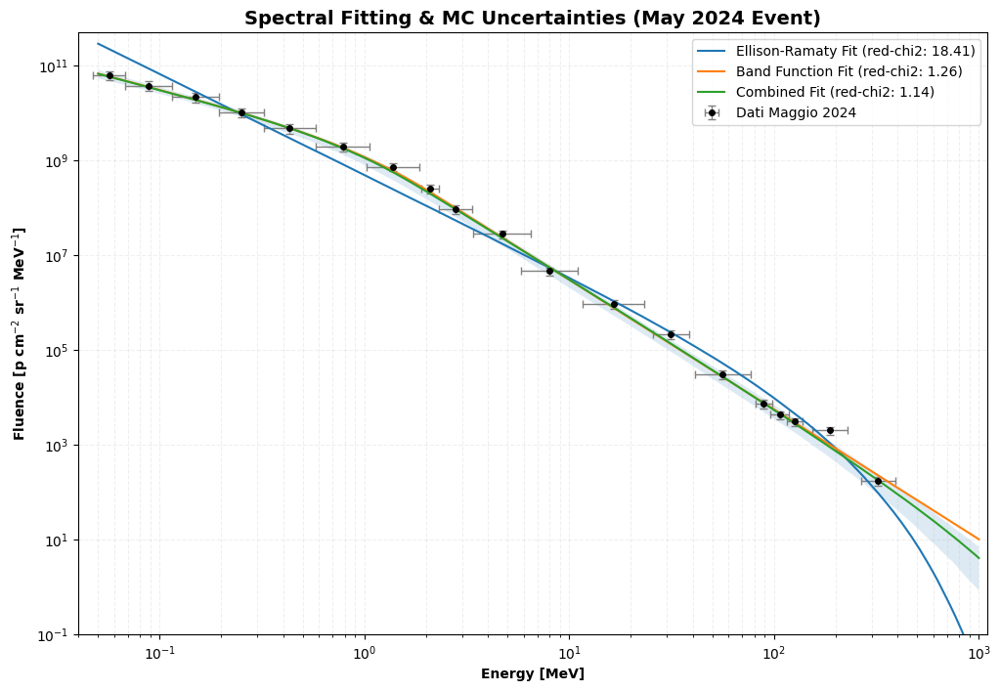

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. FUNZIONI DI FIT PROTETTE
# ==========================================
def safe_exp(x):
    return np.exp(np.clip(x, -700, 700))

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * safe_exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30
    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * safe_exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * safe_exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * safe_exp(-E/Er)

# Nomi parametri per la stampa
param_names = {
    "Ellison-Ramaty": ["A (Norm)", "gamma", "Er (Cutoff)"],
    "Band Function": ["A (Norm)", "ga (Low)", "gb (High)", "E0 (Break)"],
    "Combined": ["A (Norm)", "ga (Low)", "gb (High)", "E0 (Break)", "Er (Final Cutoff)"]
}

# ==========================================
# 2. PREPARAZIONE DATI
# ==========================================
E_tot = np.concatenate([ace_final['x'], d_goes['x']])
Y_tot = np.concatenate([ace_final['y'], d_goes['y']])
Yerr_tot = np.concatenate([ace_final['y_err'], d_goes['y_err']])
XL_tot = np.concatenate([ace_final['x_err'][0], d_goes['x_err'][0]])
XH_tot = np.concatenate([ace_final['x_err'][1], d_goes['x_err'][1]])

idx = np.argsort(E_tot)
E_tot, Y_tot, Yerr_tot = E_tot[idx], Y_tot[idx], Yerr_tot[idx]
XL_tot, XH_tot = XL_tot[idx], XH_tot[idx]

# ==========================================
# 3. ROUTINE DI FIT E MONTE CARLO PARAMETRICO
# ==========================================
fits = {
    "Ellison-Ramaty": (ellison_ramaty, [1e9, 1.5, 100], ([1e5, 0.1, 1], [1e13, 4, 2000])),
    "Band Function": (band_function, [1e9, 1.2, 3.0, 50], ([1e5, 0.1, 1.5, 1], [1e13, 3, 6, 500])),
    "Combined": (combined_function, [1e9, 1.1, 3.2, 40, 300], ([1e5, 0.1, 1.5, 1, 10], [1e13, 3, 7, 400, 2000]))
}

E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 300)
plt.figure(figsize=(12, 8))
# Modifica questa riga nel blocco del plot
plt.errorbar(E_tot, Y_tot, xerr=[XL_tot, XH_tot], yerr=Yerr_tot, 
             fmt='o', color='black', ecolor='gray', 
             capsize=3, elinewidth=1, ms=4, label='Dati Maggio 2024')

for label, (func, p0, bnds) in fits.items():
    try:
        popt, pcov = curve_fit(lambda e, *p: np.log10(func(e, *p)), E_tot, np.log10(Y_tot), p0=p0, bounds=bnds)
        
        # Statistiche Chi2
        residuals = (Y_tot - func(E_tot, *popt)) / Yerr_tot
        chi2_red = np.sum(residuals**2) / (len(E_tot) - len(popt))

        # MONTE CARLO SUI PARAMETRI
        N_MC = 1000
        rng = np.random.default_rng(42)
        # Generiamo campioni di parametri dalla matrice di covarianza
        p_samples = rng.multivariate_normal(popt, pcov, size=N_MC)
        
        print(f"\n>>> RISULTATI FIT: {label}")
        print(f"{'Parametro':<20} | {'Mediana':<12} | {'-1 sigma':<12} | {'+1 sigma':<12}")
        print("-" * 65)
        
        for i, p_name in enumerate(param_names[label]):
            p_dist = p_samples[:, i]
            p_med = np.median(p_dist)
            p_lo, p_hi = np.percentile(p_dist, [16, 84])
            print(f"{p_name:<20} | {p_med:<12.3e} | {p_med-p_lo:<12.3e} | {p_hi-p_med:<12.3e}")
        
        print(f"Chi2 ridotto: {chi2_red:.3f}")

        # Plot e incertezze sulla curva
        Phi_MC = np.array([func(E_grid, *ps) for ps in p_samples])
        Phi_med = np.median(Phi_MC, axis=0)
        Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

        plt.plot(E_grid, Phi_med, label=f'{label} Fit (red-chi2: {chi2_red:.2f})')
        if label == "Combined":
            plt.fill_between(E_grid, Phi_lo, Phi_hi, alpha=0.15)
            export_data = Phi_med
            
    except Exception as e:
        print(f"Errore nel fit {label}: {e}")

# ==========================================
# 4. EXPORT E ESTETICA
# ==========================================
SOLID_ANGLE = np.pi
np.savetxt("SEP_MAY2024_SRNIEL_INPUT_1000MeV.txt", 
           np.column_stack([E_grid, SOLID_ANGLE * export_data]), 
           fmt="%.6e", header="Energy(MeV) Fluence(p/cm2 MeV)")

plt.xscale('log'); plt.yscale('log')
plt.ylim(1e-1, 5e11); plt.xlim(0.04, 1100)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontweight='bold')
plt.title("Spectral Fitting & MC Uncertainties (May 2024 Event)", fontsize=14, fontweight='bold')
plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend()
plt.show()

# FIT FINALE CELLA EXPORT SRNIEL MAY 2024

Modello              | Chi2_red  
-----------------------------------
Ellison-Ramaty       | 18.413

>>> RISULTATI FIT: Ellison-Ramaty
Parametro            | Mediana      | -1 sigma     | +1 sigma    
-----------------------------------------------------------------
A (Norm)             | 4.934e+08    | 9.715e+07    | 9.300e+07   
gamma                | 2.127e+00    | 9.181e-02    | 8.875e-02   
Er (Cutoff)          | 1.049e+02    | 3.029e+01    | 3.275e+01   
Band Function        | 1.256

>>> RISULTATI FIT: Band Function
Parametro            | Mediana      | -1 sigma     | +1 sigma    
-----------------------------------------------------------------
A (Norm)             | 2.855e+09    | 9.803e+08    | 9.180e+08   
ga (Low)             | 1.087e+00    | 1.474e-01    | 1.570e-01   
gb (High)            | 2.731e+00    | 3.975e-02    | 4.059e-02   
E0 (Break)           | 1.243e+00    | 3.685e-01    | 3.884e-01   
Combined             | 1.139

>>> RISULTATI FIT: Combined
Parametro         

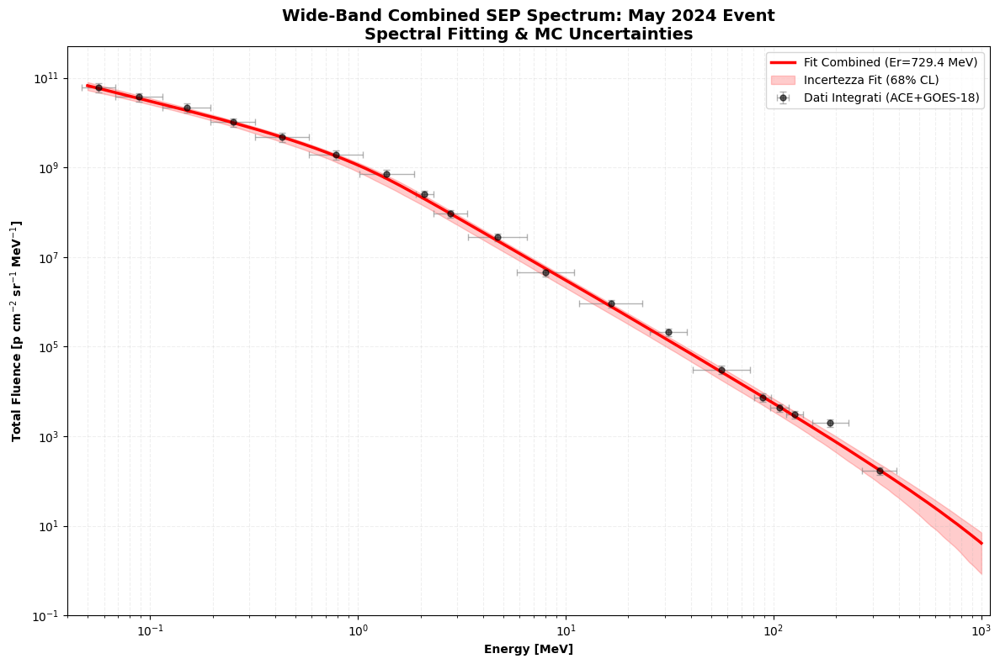

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ==========================================
# 1. FUNZIONI DI FIT PROTETTE (EVITANO OVERFLOW)
# ==========================================
def safe_exp(x):
    return np.exp(np.clip(x, -700, 700))

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * safe_exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30
    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * safe_exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * safe_exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * safe_exp(-E/Er)

# Nomi parametri per la stampa
param_names = {
    "Ellison-Ramaty": ["A (Norm)", "gamma", "Er (Cutoff)"],
    "Band Function": ["A (Norm)", "ga (Low)", "gb (High)", "E0 (Break)"],
    "Combined": ["A (Norm)", "ga (Low)", "gb (High)", "E0 (Break)", "Er (Final Cutoff)"]
}

# ==========================================
# 2. PREPARAZIONE DATI (ACE SCALATO + GOES)
# ==========================================
E_tot = np.concatenate([ace_final['x'], d_goes['x']])
Y_tot = np.concatenate([ace_final['y'], d_goes['y']])
Yerr_tot = np.concatenate([ace_final['y_err'], d_goes['y_err']])
XL_tot = np.concatenate([ace_final['x_err'][0], d_goes['x_err'][0]])
XH_tot = np.concatenate([ace_final['x_err'][1], d_goes['x_err'][1]])

# Ordinamento crescente per energia
idx = np.argsort(E_tot)
E_tot, Y_tot, Yerr_tot = E_tot[idx], Y_tot[idx], Yerr_tot[idx]
XL_tot, XH_tot = XL_tot[idx], XH_tot[idx]

# ==========================================
# 3. ROUTINE DI FIT E MONTE CARLO PARAMETRICO
# ==========================================
fits = {
    "Ellison-Ramaty": (ellison_ramaty, [1e9, 1.5, 100], ([1e5, 0.1, 1], [1e13, 4, 2000])),
    "Band Function": (band_function, [1e9, 1.2, 3.0, 50], ([1e5, 0.1, 1.5, 1], [1e13, 3, 6, 500])),
    "Combined": (combined_function, [1e9, 1.1, 3.2, 40, 300], ([1e5, 0.1, 1.5, 1, 10], [1e13, 3, 7, 400, 2000]))
}

E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 300)
results_fit = {}

print(f"{'Modello':<20} | {'Chi2_red':<10}")
print("-" * 35)

for label, (func, p0, bnds) in fits.items():
    try:
        # Fit in spazio logaritmico per stabilità numerica
        popt, pcov = curve_fit(lambda e, *p: np.log10(func(e, *p)), E_tot, np.log10(Y_tot), p0=p0, bounds=bnds)
        
        # Calcolo Chi2 ridotto
        residuals = (Y_tot - func(E_tot, *popt)) / Yerr_tot
        chi2_red = np.sum(residuals**2) / (len(E_tot) - len(popt))
        print(f"{label:<20} | {chi2_red:.3f}")

        # MONTE CARLO SUI PARAMETRI (1000 iterazioni)
        N_MC = 1000
        rng = np.random.default_rng(42)
        p_samples = rng.multivariate_normal(popt, pcov, size=N_MC)
        
        print(f"\n>>> RISULTATI FIT: {label}")
        print(f"{'Parametro':<20} | {'Mediana':<12} | {'-1 sigma':<12} | {'+1 sigma':<12}")
        print("-" * 65)
        
        for i, p_name in enumerate(param_names[label]):
            p_dist = p_samples[:, i]
            p_med = np.median(p_dist)
            p_lo, p_hi = np.percentile(p_dist, [16, 84])
            print(f"{p_name:<20} | {p_med:<12.3e} | {p_med-p_lo:<12.3e} | {p_hi-p_med:<12.3e}")
        
        # Calcolo curve per il plot
        Phi_MC = np.array([func(E_grid, *ps) for ps in p_samples])
        Phi_med = np.median(Phi_MC, axis=0)
        Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

        if label == "Combined":
            # Salviamo i dati del modello Combined per l'export finale
            final_Phi_med = Phi_med
            final_Phi_lo = Phi_lo
            final_Phi_hi = Phi_hi
            final_popt = popt
            
    except Exception as e:
        print(f"Errore nel fit {label}: {e}")

# ==========================================
# 4. EXPORT SR-NIEL (PLANAR & SPHERICAL)
# ==========================================
SOLID_ANGLE_PLANAR = np.pi        # Geometria Planare (pi)
SOLID_ANGLE_SPHERICAL = 4 * np.pi  # Geometria Sferica (4pi)

folders = ["SCHERMO_piatto_MAY2024", "SCHERMO_sfera_MAY2024"]
for folder in folders:
    if not os.path.exists(folder):
        os.makedirs(folder)

# Export Planare
np.savetxt(f"SCHERMO_piatto_MAY2024/SRNIEL_MAY2024_PLANAR_Median.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * final_Phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence(p/cm2 MeV)")
np.savetxt(f"SCHERMO_piatto_MAY2024/SRNIEL_MAY2024_PLANAR_Uncertainty_16_84.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * final_Phi_lo, SOLID_ANGLE_PLANAR * final_Phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Fluence_16th Fluence_84th")

# Export Sferico
np.savetxt(f"SCHERMO_sfera_MAY2024/SRNIEL_MAY2024_SPHERICAL_Median.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_SPHERICAL * final_Phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence(p/cm2 MeV)")
np.savetxt(f"SCHERMO_sfera_MAY2024/SRNIEL_MAY2024_SPHERICAL_Uncertainty_16_84.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_SPHERICAL * final_Phi_lo, SOLID_ANGLE_SPHERICAL * final_Phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Fluence_16th Fluence_84th")

print(f"\n>>> EXPORT COMPLETATO <<<")
print(f"Cartelle create: {', '.join(folders)}")
print(f"File salvati per geometrie Planare e Sferica fino a {E_grid[-1]:.0f} MeV.")

# ==========================================
# 5. PLOT DI VERIFICA FINALE (ESTETICA MIGLIORATA)
# ==========================================
plt.figure(figsize=(12, 8))

# Barre d'errore sui dati (ecolor gray per visibilità)
plt.errorbar(E_tot, Y_tot, yerr=Yerr_tot, xerr=[XL_tot, XH_tot], 
             fmt='ko', ms=5, ecolor='gray', elinewidth=1, capsize=3, alpha=0.6, label='Dati Integrati (ACE+GOES-18)')

# Plot Fit Mediano e Banda di Incertezza (Combined)
plt.plot(E_grid, final_Phi_med, 'r-', lw=2.5, label=f'Fit Combined (Er={final_popt[4]:.1f} MeV)')
plt.fill_between(E_grid, final_Phi_lo, final_Phi_hi, color='red', alpha=0.2, label='Incertezza Fit (68% CL)')

plt.xscale('log'); plt.yscale('log')
plt.ylim(1e-1, 5e11); plt.xlim(0.04, 1100)
plt.title("Wide-Band Combined SEP Spectrum: May 2024 Event\nSpectral Fitting & MC Uncertainties", fontsize=14, fontweight='bold')
plt.xlabel("Energy [MeV]", fontweight='bold')
plt.ylabel(r"Total Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontweight='bold')
plt.grid(True, which="both", alpha=0.2, ls='--')
plt.legend(frameon=True, loc='upper right')
plt.tight_layout()
plt.show()

# FIT FINALE PLOT MIGLIORATO corretto

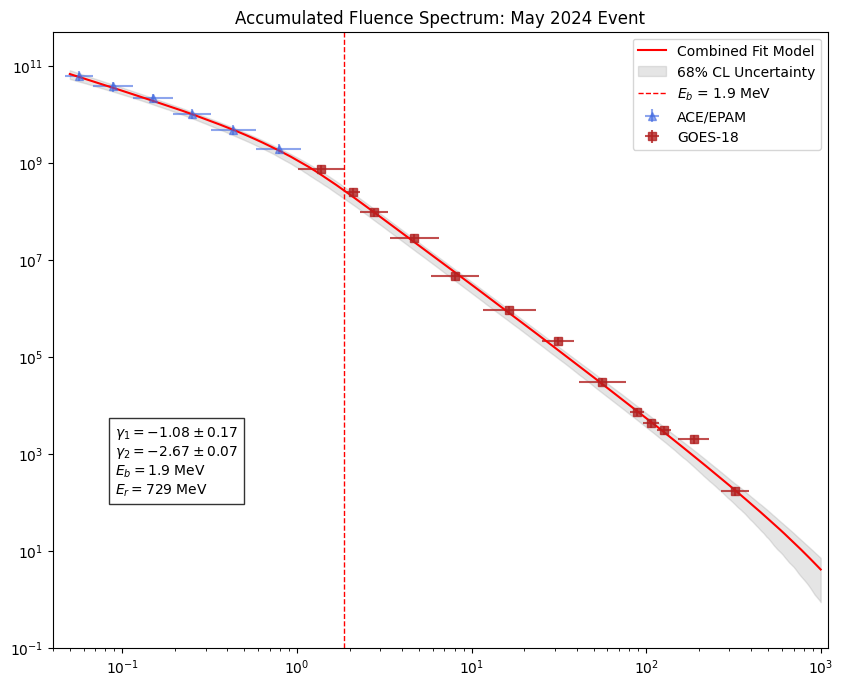

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ==========================================
# 1. FUNZIONI DI FIT PROTETTE
# ==========================================
def safe_exp(x):
    return np.exp(np.clip(x, -700, 700))

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = np.abs((gb - ga) * E0)
    if E_break < 1e-6: E_break = 1e-6
    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * safe_exp(-E[mask_low] / E0)
    norm_factor = np.power(E_break, (gb - ga)) * safe_exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * safe_exp(-E/Er)

# ==========================================
# 2. PREPARAZIONE DATI
# ==========================================
x_ace, y_ace, yerr_ace = ace_final['x'], ace_final['y'], ace_final['y_err']
xl_ace, xh_ace = ace_final['x_err'][0], ace_final['x_err'][1]
x_goes, y_goes, yerr_goes = d_goes['x'], d_goes['y'], d_goes['y_err']
xl_goes, xh_goes = d_goes['x_err'][0], d_goes['x_err'][1]

E_tot = np.concatenate([x_ace, x_goes])
Y_tot = np.concatenate([y_ace, y_goes])
Yerr_tot = np.concatenate([yerr_ace, yerr_goes])
idx = np.argsort(E_tot)
E_tot, Y_tot, Yerr_tot = E_tot[idx], Y_tot[idx], Yerr_tot[idx]

# ==========================================
# 3. FIT E MONTE CARLO (1000 ITERAZIONI)
# ==========================================
E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 500)
p0 = [1e9, 1.1, 3.2, 40, 300]
bnds = ([1e5, 0.1, 1.5, 1, 10], [1e13, 3, 7, 400, 2000])

popt, pcov = curve_fit(lambda e, *p: np.log10(combined_function(e, *p)), 
                       E_tot, np.log10(Y_tot), p0=p0, bounds=bnds)

perr = np.sqrt(np.diag(pcov))
rng = np.random.default_rng(42)
p_samples = rng.multivariate_normal(popt, pcov, size=1000)

Phi_MC = np.array([combined_function(E_grid, *ps) for ps in p_samples])
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

Eb = (popt[2] - popt[1]) * popt[3]

# ==========================================
# 4. EXPORT SR-NIEL (PLANAR & SPHERICAL)
# ==========================================
S_PLANAR = np.pi
S_SPHERICAL = 4 * np.pi
for f in ["Schermo_planare_may2024", "Schermo_sferico_may2024"]:
    if not os.path.exists(f): os.makedirs(f)

# Export Planar
np.savetxt("Schermo_planare_may2024/SRNIEL_Median.txt", np.column_stack([E_grid, S_PLANAR * Phi_med]), fmt="%.6e")
np.savetxt("Schermo_planare_may2024/SRNIEL_Uncertainty_16_84.txt", np.column_stack([E_grid, S_PLANAR * Phi_lo, S_PLANAR * Phi_hi]), fmt="%.6e")
# Export Spherical
np.savetxt("Schermo_sferico_may2024/SRNIEL_Median.txt", np.column_stack([E_grid, S_SPHERICAL * Phi_med]), fmt="%.6e")
np.savetxt("Schermo_sferico_may2024/SRNIEL_Uncertainty_16_84.txt", np.column_stack([E_grid, S_SPHERICAL * Phi_lo, S_SPHERICAL * Phi_hi]), fmt="%.6e")
# ==========================================
# 5. PLOT SCIENTIFICO FINALE
# ==========================================
plt.figure(figsize=(10, 8))
plt.errorbar(x_ace, y_ace, xerr=[xl_ace, xh_ace], yerr=yerr_ace, fmt='^', color='royalblue', alpha=0.6, label='ACE/EPAM')
plt.errorbar(x_goes, y_goes, xerr=[xl_goes, xh_goes], yerr=yerr_goes, fmt='s', color='firebrick', alpha=0.8, label='GOES-18')
plt.plot(E_grid, Phi_med, 'r-', lw=1.5, label='Combined Fit Model')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='gray', alpha=0.2, label='68% CL Uncertainty')
plt.axvline(Eb, color='red', ls='--', lw=1, label=f'$E_b$ = {Eb:.1f} MeV')

stats_text = (r'$\gamma_1 = -{:.2f} \pm {:.2f}$'.format(popt[1], perr[1]) + '\n' +
              r'$\gamma_2 = -{:.2f} \pm {:.2f}$'.format(popt[2], perr[2]) + '\n' +
              r'$E_b = {:.1f}$ MeV'.format(Eb) + '\n' +
              r'$E_r = {:.0f}$ MeV'.format(popt[4]))

plt.text(0.08, 0.25, stats_text, transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))
plt.xscale('log'); plt.yscale('log'); plt.xlim(0.04, 1100); plt.ylim(1e-1, 5e11)
plt.title("Accumulated Fluence Spectrum: May 2024 Event"); plt.legend(); plt.show()

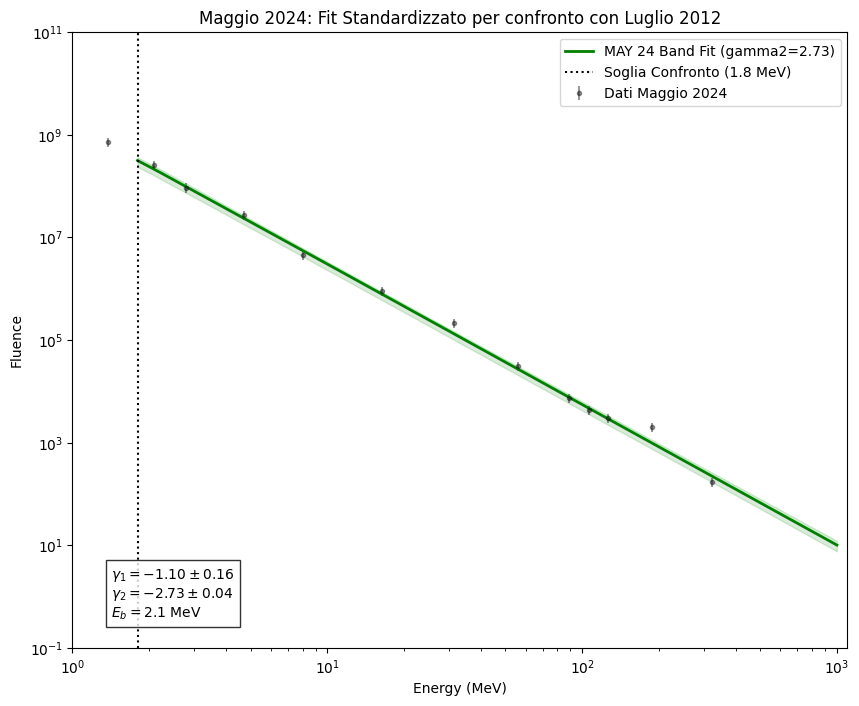

>>> Export completato. Cartelle create: MAY2024_Confronto_JUL2012_Planare e _Sferico
>>> Range: 1.8 - 1000 MeV. Modello: Band Function.


In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ==========================================
# 1. FUNZIONI DI FIT PROTETTE (STESSO SETUP JUL 2012)
# ==========================================
def safe_exp(x):
    return np.exp(np.clip(x, -700, 700))

def band_function_std(E, A, ga, gb, E0):
    """Funzione di Band standard (raccordo tra due leggi di potenza)"""
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = np.abs((gb - ga) * E0)
    if E_break < 1e-6: E_break = 1e-6
    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * safe_exp(-E[mask_low] / E0)
    norm_factor = np.power(E_break, (gb - ga)) * safe_exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

# ==========================================
# 2. PREPARAZIONE DATI (MAGGIO 2024)
# ==========================================
# Uniamo i dati originali
E_tot = np.concatenate([ace_final['x'], d_goes['x']])
Y_tot = np.concatenate([ace_final['y'], d_goes['y']])
Yerr_tot = np.concatenate([ace_final['y_err'], d_goes['y_err']])
idx = np.argsort(E_tot)
E_tot, Y_tot, Yerr_tot = E_tot[idx], Y_tot[idx], Yerr_tot[idx]

# ==========================================
# 3. FIT BAND E MONTE CARLO (STANDARD PER CONFRONTO)
# ==========================================
# Griglia identica a JUL 2012: da 1.8 MeV a 1000 MeV
E_grid_confronto = np.logspace(np.log10(1.8), 3, 500)

# Parametri iniziali ottimizzati per la Band function
p0_band = [2e9, 1.1, 2.7, 1.2]
bnds_band = ([1e5, 0.1, 1.5, 0.1], [1e13, 2.5, 5.0, 50.0])

# Fit in spazio logaritmico per massima stabilità
popt, pcov = curve_fit(lambda e, *p: np.log10(band_function_std(e, *p)), 
                       E_tot, np.log10(Y_tot), p0=p0_band, bounds=bnds_band)

perr = np.sqrt(np.diag(pcov))
rng = np.random.default_rng(42)
# Stabilizzazione matrice di covarianza per multivariate_normal
pcov_stable = pcov + np.eye(len(popt)) * 1e-10
p_samples = rng.multivariate_normal(popt, pcov_stable, size=1000)

Phi_MC = np.array([band_function_std(E_grid_confronto, *ps) for ps in p_samples])
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

Eb = (popt[2] - popt[1]) * popt[3] # Energia di break fisica

# ==========================================
# 4. EXPORT SR-NIEL (MATCHING JUL 2012 SETUP)
# ==========================================
output_folder = "MAY2024_Confronto_JUL2012"
for geom in ["Planare", "Sferico"]:
    d = f"{output_folder}_{geom}"
    if not os.path.exists(d): os.makedirs(d)
    
    sa = np.pi if geom == "Planare" else 4*np.pi
    np.savetxt(f"{d}/SRNIEL_Median_1.8_1000MeV.txt", np.column_stack([E_grid_confronto, sa * Phi_med]), 
               fmt="%.6e", header=f"Energy(MeV) Fluence_{geom}_Median")
    np.savetxt(f"{d}/SRNIEL_CL68_1.8_1000MeV.txt", np.column_stack([E_grid_confronto, sa * Phi_lo, sa * Phi_hi]), 
               fmt="%.6e", header=f"Energy(MeV) Phi16 Phi84")

# ==========================================
# 5. PLOT DI CONFRONTO
# ==========================================
plt.figure(figsize=(10, 8))
plt.errorbar(E_tot, Y_tot, yerr=Yerr_tot, fmt='k.', alpha=0.4, label='Dati Maggio 2024')
plt.plot(E_grid_confronto, Phi_med, 'g-', lw=2, label=f'MAY 24 Band Fit (gamma2={popt[2]:.2f})')
plt.fill_between(E_grid_confronto, Phi_lo, Phi_hi, color='green', alpha=0.15)
plt.axvline(1.8, color='k', ls=':', label='Soglia Confronto (1.8 MeV)')

stats_text = (r'$\gamma_1 = -{:.2f} \pm {:.2f}$'.format(popt[1], perr[1]) + '\n' +
              r'$\gamma_2 = -{:.2f} \pm {:.2f}$'.format(popt[2], perr[2]) + '\n' +
              r'$E_b = {:.1f}$ MeV'.format(Eb))

plt.text(0.05, 0.05, stats_text, transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.8))
plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1100); plt.ylim(1e-1, 1e11)
plt.title("Maggio 2024: Fit Standardizzato per confronto con Luglio 2012")
plt.xlabel("Energy (MeV)"); plt.ylabel("Fluence"); plt.legend(); plt.show()

print(f">>> Export completato. Cartelle create: {output_folder}_Planare e _Sferico")
print(f">>> Range: 1.8 - 1000 MeV. Modello: Band Function.")

# CALCOLO DOSE PLANAR SHIELDING 
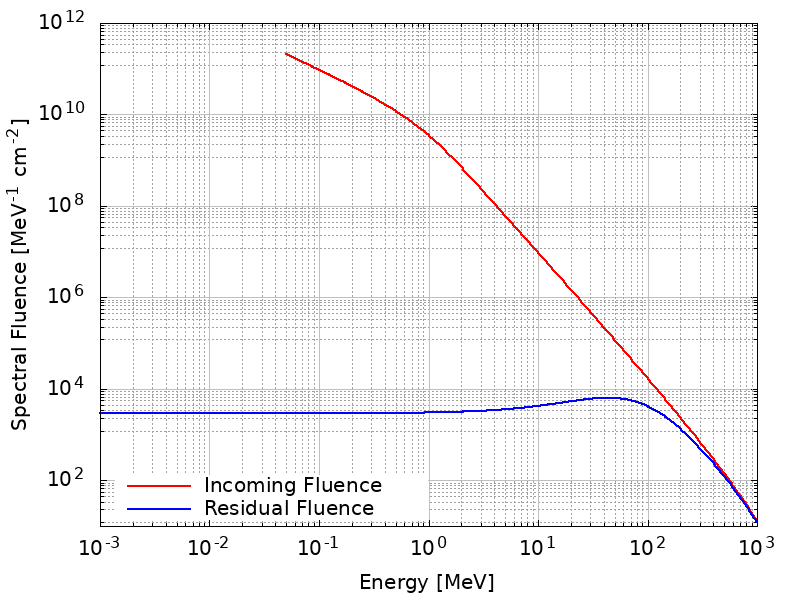

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)
Dose totale in Silicio: 1.6558e-03 Gy
Dose totale in Silicio: 1.6558 mGy
--------------------------------------------------


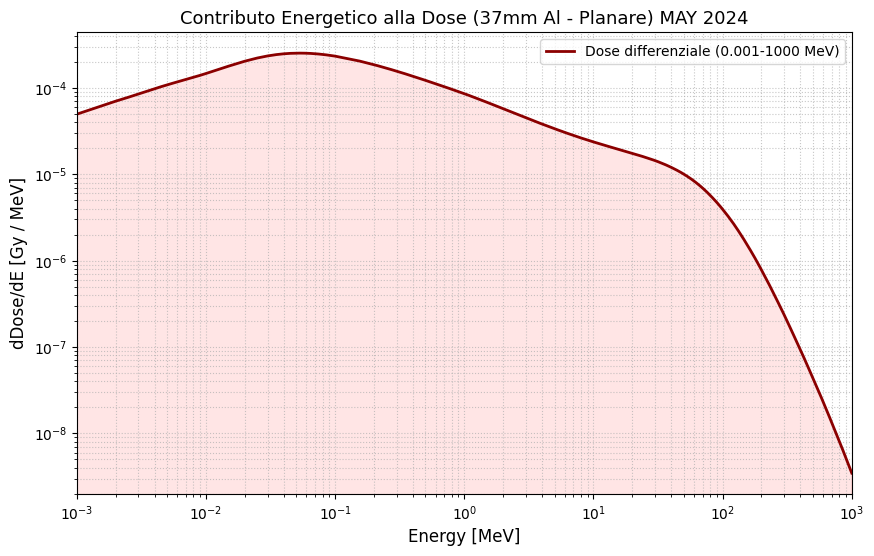

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/37mmAl_residual_may2024.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.001 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (0.001-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Planare) MAY 2024", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# CONFRONTO MAY E JUL (Band)

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 1.8 MeV - 1 GeV)
Dose totale in Silicio: 2.2175e-03 Gy
Dose totale in Silicio: 2.2175 mGy
--------------------------------------------------


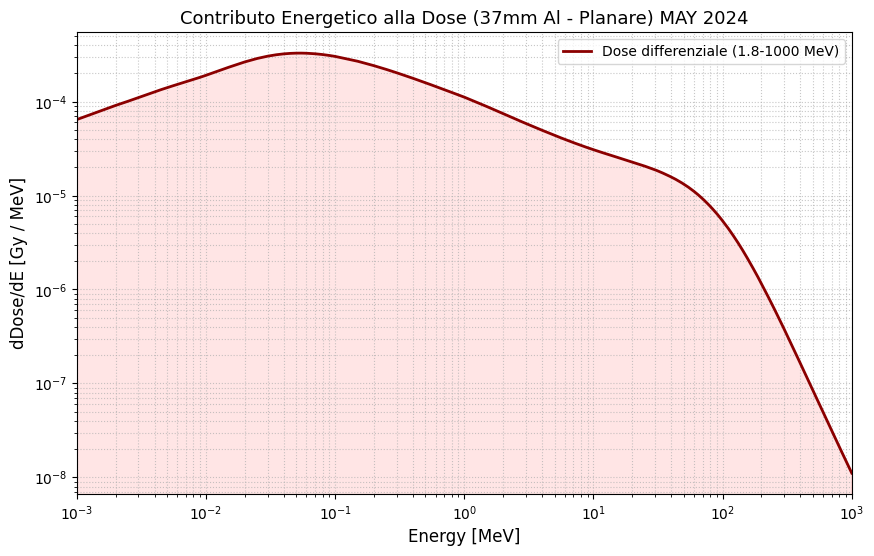

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "MAY24_Confronto_Planare/residual_fluence_planare_confronto.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.001 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 1.8 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (1.8-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Planare) MAY 2024", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# incertezze PLANAR SHIELDING

In [59]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI (JUL 2012)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
df_median_res = pd.read_csv(
    "MAY24_Confronto_Planare/residual_fluence_planare_confronto.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

# Filtriamo per sicurezza eventuali zeri
df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL)
df_band_inc = pd.read_csv(
    "MAY24_Confronto_Planare/SRNIEL_CL68.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER (0.001 - 1000 MeV)
# Nota: sotto 1.8 MeV usiamo il valore di incertezza più basso disponibile
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcoliamo il fattore di incertezza relativa rispetto alla mediana incidente
# K = Phi_band / Phi_mediana
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia: se Phi_in_med è 0, il ratio è 1 (nessuna variazione)
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applichiamo il ratio allo spettro RESIDUO (che include il rallentamento a bassa energia)
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power (Log-Log) sulla griglia MASTER
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO MAY 2024 (CORRETTA)")
print(f"Configurazione: 37mm Al, Geometria Planare (10 g/cm²)")
print(f"Range integrato: {E_master.min():.3f} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana Calcolata: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO MAY 2024 (CORRETTA)
Configurazione: 37mm Al, Geometria Planare (10 g/cm²)
Range integrato: 0.001 MeV - 1000 MeV
Dose Mediana Calcolata: 2.217 mGy
Intervallo 68% CL (Fit + 5% SRIM): [1.72 - 6.03] mGy
Incertezza Totale: +3.82 / -0.50 mGy
------------------------------------------------------------


# CALCOLO DOSE SPHERICAL SHIELDING

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 1.8 MeV - 1 GeV)
Dose totale in Silicio: 4.3551e-03 Gy
Dose totale in Silicio: 4.3551 mGy
--------------------------------------------------


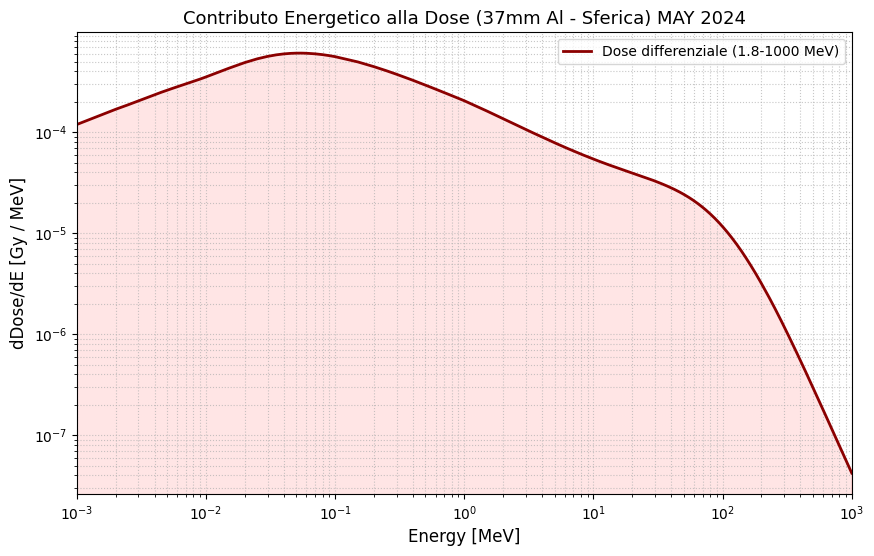

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "MAY24_Confronto_Sferico/residual_fluence_sferica_confronto.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.001 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 1.8 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (1.8-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Sferica) MAY 2024", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# INCERTEZZE SPHERICAL SHIELDING

In [61]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI (JUL 2012)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
df_median_res = pd.read_csv(
    "MAY24_Confronto_Sferico/residual_fluence_sferica_confronto.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

# Filtriamo per sicurezza eventuali zeri
df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL)
df_band_inc = pd.read_csv(
    "MAY24_Confronto_Sferico/SRNIEL_CL68.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER (0.001 - 1000 MeV)
# Nota: sotto 1.8 MeV usiamo il valore di incertezza più basso disponibile
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcoliamo il fattore di incertezza relativa rispetto alla mediana incidente
# K = Phi_band / Phi_mediana
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia: se Phi_in_med è 0, il ratio è 1 (nessuna variazione)
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applichiamo il ratio allo spettro RESIDUO (che include il rallentamento a bassa energia)
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power (Log-Log) sulla griglia MASTER
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO MAY 2024 (CORRETTA)")
print(f"Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)")
print(f"Range integrato: {E_master.min():.3f} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana Calcolata: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO MAY 2024 (CORRETTA)
Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)
Range integrato: 0.001 MeV - 1000 MeV
Dose Mediana Calcolata: 4.355 mGy
Intervallo 68% CL (Fit + 5% SRIM): [3.37 - 11.92] mGy
Incertezza Totale: +7.56 / -0.99 mGy
------------------------------------------------------------


--- Livelli di Background ACE (p / cm2 s sr MeV) ---
P1p    4532.235231
P8p       0.092160
dtype: float64


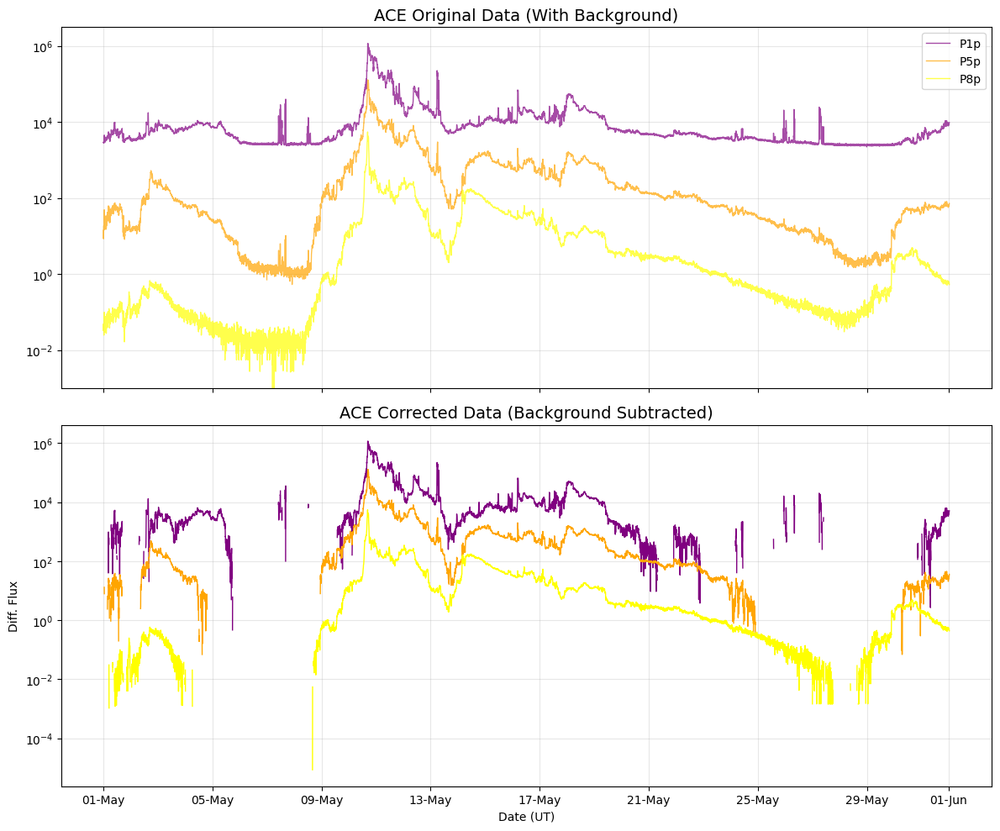

In [24]:
# Rimozione background ACE 

import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. DEFINIZIONE FINESTRA BACKGROUND (24h)
# ==========================================
# Usiamo un periodo tranquillo prima dell'inizio della tempesta del 15/01.
# Il 12-13 Gennaio è ideale (come fatto per GOES).
bg_start = '2024-05-01 00:00:00'
bg_end   = '2024-05-02 00:00:00'

# ==========================================
# 2. CALCOLO E SOTTRAZIONE
# ==========================================

# 1. Calcola la media del flusso in quelle 24h
ace_bg_mean = df_ace.loc[bg_start:bg_end].mean()

print("--- Livelli di Background ACE (p / cm2 s sr MeV) ---")
print(ace_bg_mean[['P1p', 'P8p']]) # Stampa solo primo e ultimo per brevità

# 2. Sottrazione
# Creiamo un nuovo dataframe per i dati corretti
df_ace_corr = df_ace - ace_bg_mean

# 3. Pulizia (NaN sui valori <= 0)
# Questo rimuove il "rumore" e le righe verticali nel plot logaritmico
df_ace_corr[df_ace_corr <= 0] = np.nan

# ==========================================
# 3. PLOT DI VERIFICA (PRIMA VS DOPO)
# ==========================================

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Canali da plottare 
ch_demo = ['P1p', 'P5p', 'P8p'] 
colors = ['purple', 'orange', 'yellow']

# Plot RAW
for i, col in enumerate(ch_demo):
    if col in df_ace.columns:
        ax1.plot(df_ace.index, df_ace[col], label=col, color=colors[i], lw=1, alpha=0.7)
ax1.set_title("ACE Original Data (With Background)", fontsize=14)
ax1.set_yscale('log')
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3)

# Plot CORRECTED
for i, col in enumerate(ch_demo):
    if col in df_ace_corr.columns:
        ax2.plot(df_ace_corr.index, df_ace_corr[col], label=f"{col} (Net)", color=colors[i], lw=1)
ax2.set_title("ACE Corrected Data (Background Subtracted)", fontsize=14)
ax2.set_yscale('log')
ax2.set_ylabel('Diff. Flux')
ax2.set_xlabel('Date (UT)')
ax2.grid(True, alpha=0.3)

# Formattazione date
import matplotlib.dates as mdates
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))

plt.tight_layout()
plt.show()

--- Calcolo e Unione Fluenze (ACE + GOES) ---
Evento elaborato: 8 pti ACE + 10 pti GOES = 18 Totali.
File SPENVIS generato: SPENVIS_SC25_MAY24_ACE_GOES_Combined.txt


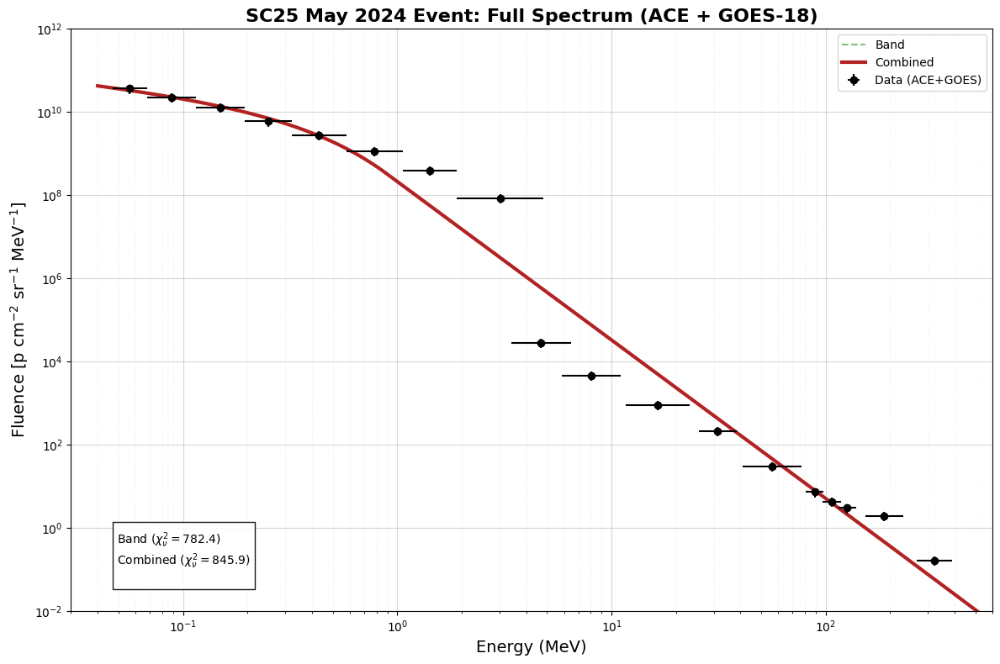


--- Calcolo Fluenze Integrate ---

=== FLUENZE INTEGRATE (Modello Combined) ===
> 10 MeV:  1.183e+05 p/cm2
> 30 MeV:  5.394e+03 p/cm2
> 100 MeV: 1.815e+02 p/cm2


In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.optimize import curve_fit

# ===========================================================
# 1. SETUP EVENTO MAGGIO 2024 (Unico Evento Lungo)
# ===========================================================

events_dict_refined_2 = {
    "Total Event (May 08-24)": {
        "start": "2024-05-08 08:00:00", 
        "end":   "2024-05-24 16:00:00", 
        "color": "black"
    }
}

# ===========================================================
# 2. DEFINIZIONE CANALI (ACE + GOES)
# ===========================================================

# --- ACE (Bassa Energia: 0.047 - 4.8 MeV) ---
ace_bins = {
    'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.06),
    'P7p': (1.06, 1.90),   'P8p': (1.90, 4.80)
}
ace_Eeff = {ch: np.sqrt(Emin * Emax) for ch, (Emin, Emax) in ace_bins.items()}

# --- GOES-18 (Alta Energia: >1 MeV) ---
# Usiamo canali > 4.5 MeV per evitare sovrapposizioni con ACE
goes_bins = {
    1: (1.90, 2.30), 2: (2.31, 3.34), 3: (3.40, 6.48), 4: (5.84, 11.0),
    5: (11.64, 23.27), 6: (25.5, 38.4), 7: (41.0, 77.0), 8: (80.9, 97.6),
    9: (96.3, 118.4), 10: (114.88, 138.4), 11: (153.3, 229.3), 12: (267.0, 390.0)
}
goes_eff_map = {
    1: 2.090, 2: 2.778, 3: 4.694, 4: 8.015, 5: 16.458, 6: 31.292,
    7: 56.187, 8: 88.859, 9: 106.780, 10: 126.093, 11: 187.488, 12: 322.692
}

# ===========================================================
# 3. CALCOLO E UNIONE FLUENZE
# ===========================================================

results_combined = {}

print("--- Calcolo e Unione Fluenze (ACE + GOES) ---")

for event, details in events_dict_refined_2.items():
    # --- A. Elaborazione ACE ---
    df_slice_ace = df_ace_corr.loc[details['start']:details['end']]
    dt_ace = df_slice_ace.index.to_series().diff().dt.total_seconds().fillna(60)
    
    e_ace, f_ace, xl_ace, xh_ace = [], [], [], []
    
    for ch in ace_bins:
        if ch in df_slice_ace.columns:
            flux = df_slice_ace[ch].fillna(0).clip(lower=0)
            flu = (flux * dt_ace).sum()
            if flu > 0:
                e_val = ace_Eeff[ch]
                e_ace.append(e_val)
                f_ace.append(flu)
                xl_ace.append(e_val - ace_bins[ch][0])
                xh_ace.append(ace_bins[ch][1] - e_val)

    # --- B. Elaborazione GOES ---
    df_slice_goes = df_goes18_corr.loc[details['start']:details['end']]
    dt_goes = df_slice_goes.index.to_series().diff().dt.total_seconds().fillna(300)
    
    e_goes, f_goes, xl_goes, xh_goes = [], [], [], []
    
    for ch_idx, (Emin, Emax) in goes_bins.items():
        col_name = ch_idx if ch_idx in df_slice_goes.columns else str(ch_idx)
        if col_name in df_slice_goes.columns:
            flux = df_slice_goes[col_name].fillna(0).clip(lower=0)
            flu = (flux * dt_goes).sum()
            if flu > 0:
                e_val = goes_eff_map[ch_idx]
                
                # FILTRO SOVRAPPOSIZIONE: Usiamo GOES solo sopra 4.5 MeV
                if e_val > 4.5: 
                    e_goes.append(e_val)
                    f_goes.append(flu)
                    xl_goes.append(e_val - Emin)
                    xh_goes.append(Emax - e_val)

    # --- C. Unione ---
    all_x = np.concatenate([e_ace, e_goes])
    all_y = np.concatenate([f_ace, f_goes])
    all_xl = np.concatenate([xl_ace, xl_goes])
    all_xh = np.concatenate([xh_ace, xh_goes])
    
    idx_sort = np.argsort(all_x)
    
    results_combined[event] = {
        "x": all_x[idx_sort],
        "y": all_y[idx_sort],
        "x_err": [all_xl[idx_sort], all_xh[idx_sort]],
        "color": details["color"]
    }
    
    print(f"Evento elaborato: {len(e_ace)} pti ACE + {len(e_goes)} pti GOES = {len(all_x)} Totali.")

# ===========================================================
# 4. FUNZIONI DI FIT (ROBUSTE)
# ===========================================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    # Gestione input scalare vs array
    scalar_input = False
    if np.ndim(E) == 0:
        E = np.array([E])
        scalar_input = True
    else:
        E = np.asarray(E)

    # Protezioni parametri
    if gb <= ga: 
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res
    
    E_break = (gb - ga) * E0
    if E_break <= 0: 
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    res = np.zeros_like(E)
    mask_low = E < E_break
    
    if np.any(mask_low):
        res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    
    return res[0] if scalar_input else res

def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    mask = (y > 0)
    sigma_log = y_err[mask] / (y[mask] * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0)
    try:
        popt, pcov = curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-35)), 
                               x[mask], np.log10(y[mask]), p0=p0, sigma=sigma_log, 
                               absolute_sigma=True, bounds=bounds, maxfev=20000)
        return popt, pcov
    except: return None, None

def get_stats_text(name, func, x, y, yerr, popt, pcov):
    if popt is None: return f"{name}: Failed"
    res = (y - func(x, *popt))/yerr
    chi2 = np.sum(res**2)
    dof = len(y) - len(popt)
    red = chi2/dof if dof>0 else 0
    txt = f"{name} ($\\chi^2_\\nu={red:.1f}$)\n"
    return txt

# ===========================================================
# 5. ESECUZIONE FIT, PLOT E EXPORT
# ===========================================================

fig, ax = plt.subplots(figsize=(12, 8))
x_plot = np.logspace(np.log10(0.04), np.log10(600), 500)

popt_c = None # Inizializzazione per sicurezza

for event, data in results_combined.items():
    x = data['x']
    y = data['y']
    x_err = data['x_err']
    y_err = y * 0.25 
    
    # Plot Dati
    ax.errorbar(x, y, yerr=y_err, xerr=x_err, fmt='o', color='black', label='Data (ACE+GOES)', zorder=10)
    
    stats = ""
    
    # Fit Band (Primo step per indovinare i parametri)
    p0_b = [1e8, 1.5, 3.0, 5.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0, 0.1, 0.1, 0.1], [np.inf, 10, 10, 500]))
    
    # Fit Combined (Band + Cutoff)
    # Usiamo i risultati di Band come guess iniziale
    p0_c = [*popt_b, 500.0] if popt_b is not None else [1e8, 1.5, 3.0, 5.0, 500.0]
    
    popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0, 0.1, 0.1, 0.1, 10], [np.inf, 10, 10, 500, 10000]))
    
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '--', color='green', alpha=0.5, label='Band')
        stats += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b)
        
    if popt_c is not None:
        ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=3, label='Combined')
        stats += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)
        
        # --- EXPORT PER SPENVIS ---
        sp_y = combined_function(x_plot, *popt_c)
        filename = "SPENVIS_SC25_MAY24_ACE_GOES_Combined.txt"
        df_out = pd.DataFrame({'Energy_MeV': x_plot, 'Fluence': sp_y})
        df_out.to_csv(filename, sep='\t', index=False, float_format='%.6e')
        print(f"File SPENVIS generato: {filename}")

    # Styling Plot
    ax.set_title(f"SC25 May 2024 Event: Full Spectrum (ACE + GOES-18)", fontsize=16, fontweight='bold')
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.03, 600); ax.set_ylim(1e-2, 1e12)
    ax.grid(True, which="major", alpha=0.5); ax.grid(True, which="minor", alpha=0.2, linestyle=':')
    ax.set_xlabel("Energy (MeV)", fontsize=14)
    ax.set_ylabel("Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
    ax.legend(loc='upper right')
    ax.text(0.05, 0.05, stats, transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.9))

plt.tight_layout()
plt.show()

# ===========================================================
# 6. INTEGRAZIONE FLUENZE (Verifica)
# ===========================================================

print("\n--- Calcolo Fluenze Integrate ---")

if popt_c is not None:
    # Ora la funzione accetta input scalari e quad funziona
    f10 = integrate.quad(lambda e: combined_function(e, *popt_c), 10, 2000)[0]
    f30 = integrate.quad(lambda e: combined_function(e, *popt_c), 30, 2000)[0]
    f100 = integrate.quad(lambda e: combined_function(e, *popt_c), 100, 2000)[0]
    
    print(f"\n=== FLUENZE INTEGRATE (Modello Combined) ===")
    print(f"> 10 MeV:  {f10:.3e} p/cm2")
    print(f"> 30 MeV:  {f30:.3e} p/cm2")
    print(f"> 100 MeV: {f100:.3e} p/cm2")
else:
    print("Errore: Il fit Combined è fallito, impossibile integrare.")

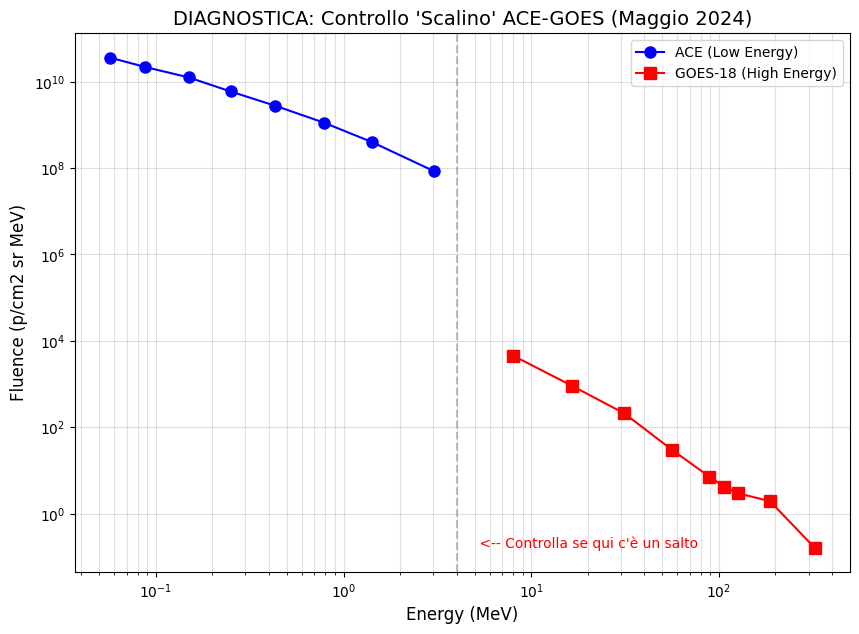


--- CHECK DATI ---
Punti totali: 17
Range Energia: 0.057 - 323.0 MeV


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ===========================================================
# 1. SETUP NUOVO: MAPPA ENERGIE GOES-R (SGNS) PRECISA
# ===========================================================
# Fonte: NOAA GOES-R Series Level 2 Data Product Definition
# Non usiamo la media geometrica, usiamo i centri di banda effettivi corretti

ace_bins = {
    'P1p': 0.057, 'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250,
    'P5p': 0.432, 'P6p': 0.784, 'P7p': 1.419, 'P8p': 3.020 
    # Nota: ACE P8p è largo (1.9-4.8), centro effettivo ~3 MeV
}

# GOES-16/18 SGNS (Canali Differenziali)
# Scartiamo P1, P2 e P3 perché ACE copre meglio quella zona.
# Partiamo da P4 (5.84 MeV) in su per avere una transizione pulita da ACE P8p (3.02 MeV)
goes_eff_map_precise = {
    # 'P1': 1.38, 'P2': 2.09, 'P3': 2.78,  <-- SCARTATI (Rumorosi o sovrapposti)
    4: 8.0,    # P4 (5.8-11 MeV)
    5: 16.5,   # P5 (11.6-23.2 MeV)
    6: 31.3,   # P6 (25.5-38.4 MeV)
    7: 56.2,   # P7 (41-77 MeV)
    8: 88.9,   # P8 (81-98 MeV)
    9: 107.0,  # P9 (96-118 MeV)
    10: 126.0, # P10 (115-138 MeV)
    11: 187.0, # P11 (153-229 MeV)
    12: 323.0, # P12 (267-390 MeV)
    13: 500.0  # P13 (>500 MeV - Stima punto finale)
}

# ===========================================================
# 2. ESTRAZIONE E DIAGNOSTICA
# ===========================================================

event_params = events_dict_refined_2["Total Event (May 08-24)"]
start, end = event_params['start'], event_params['end']

# --- DATI ACE ---
df_ace_sl = df_ace_corr.loc[start:end]
dt_ace = df_ace_sl.index.to_series().diff().dt.total_seconds().fillna(60)

x_ace, y_ace = [], []
for col, eff_en in ace_bins.items():
    if col in df_ace_sl.columns:
        # Fluenza = Integrale(Flusso * dt)
        val = (df_ace_sl[col].fillna(0).clip(lower=0) * dt_ace).sum()
        if val > 0:
            x_ace.append(eff_en)
            y_ace.append(val)

# --- DATI GOES (Solo P4 in su) ---
df_goes_sl = df_goes18_corr.loc[start:end]
dt_goes = df_goes_sl.index.to_series().diff().dt.total_seconds().fillna(300)

x_goes, y_goes = [], []
# Mappiamo i nomi delle colonne del DF alle chiavi della mappa
# Esempio: se nel DF le colonne si chiamano 0,1,2... oppure 'P1','P2'...
# Qui assumo che nel DF le colonne siano indici interi o stringhe corrispondenti
for ch_idx, eff_en in goes_eff_map_precise.items():
    # Cerca la colonna (prova int o str)
    col_name = ch_idx if ch_idx in df_goes_sl.columns else str(ch_idx)
    
    if col_name in df_goes_sl.columns:
        val = (df_goes_sl[col_name].fillna(0).clip(lower=0) * dt_goes).sum()
        if val > 0:
            x_goes.append(eff_en)
            y_goes.append(val)

# ===========================================================
# 3. PLOT DIAGNOSTICO (SENZA FIT)
# ===========================================================

plt.figure(figsize=(10, 7))

# Plot ACE
plt.plot(x_ace, y_ace, 'o-', color='blue', label='ACE (Low Energy)', markersize=8)

# Plot GOES
plt.plot(x_goes, y_goes, 's-', color='red', label='GOES-18 (High Energy)', markersize=8)

plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", alpha=0.4)
plt.xlabel("Energy (MeV)", fontsize=12)
plt.ylabel("Fluence (p/cm2 sr MeV)", fontsize=12)
plt.title("DIAGNOSTICA: Controllo 'Scalino' ACE-GOES (Maggio 2024)", fontsize=14)
plt.legend()

# Controllo visivo
plt.axvline(x=4.0, color='gray', linestyle='--', alpha=0.5, label='Punto di Giunzione (~4 MeV)')
plt.text(5, min(y_ace+y_goes), " <-- Controlla se qui c'è un salto", color='red')

plt.show()

# ===========================================================
# 4. PREPARAZIONE DATI COMBINATI (SOLO SE IL PLOT E' OK)
# ===========================================================

# Se il grafico sopra mostra una linea coerente, uniamo gli array per il fit
all_x = np.concatenate([x_ace, x_goes])
all_y = np.concatenate([y_ace, y_goes])
# Ordiniamo
idx = np.argsort(all_x)
combined_x = all_x[idx]
combined_y = all_y[idx]

print("\n--- CHECK DATI ---")
print(f"Punti totali: {len(combined_x)}")
print(f"Range Energia: {min(combined_x):.3f} - {max(combined_x):.1f} MeV")

--- DIAGNOSTICA INTER-CALIBRAZIONE ---
Ultimo punto ACE (Raw): 8.53e+07 a 3.02 MeV
Primo punto GOES:       4.58e+03 a 8.0 MeV
Valore ACE atteso per continuità: 3.22e+04
-> SCALING FACTOR CALCOLATO PER ACE: 0.000
(I dati ACE saranno moltiplicati per questo valore per allinearsi a GOES)
File SPENVIS generato: SPENVIS_SC25_MAY24_CORRECTED.txt


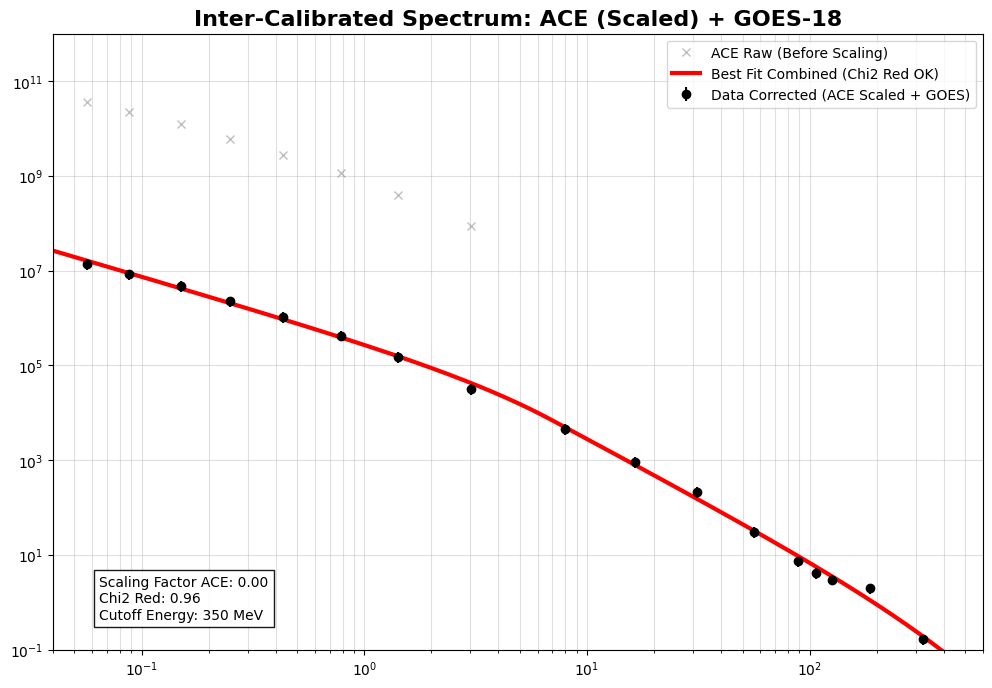


Fluenza > 100 MeV (Corretta): 3.399e+02


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.optimize import curve_fit

# ===========================================================
# 1. SETUP E DEFINIZIONI
# ===========================================================

events_dict_refined_2 = {
    "Total Event (May 08-24)": {
        "start": "2024-05-08 08:00:00", 
        "end":   "2024-05-24 16:00:00", 
        "color": "black"
    }
}

# Canali ACE (P1p-P8p)
ace_bins = {
    'P1p': 0.057, 'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250,
    'P5p': 0.432, 'P6p': 0.784, 'P7p': 1.419, 'P8p': 3.020 
}

# Canali GOES-18 (SGNS) - Usiamo dal P4 in su
goes_eff_map_precise = {
    4: 8.0, 5: 16.5, 6: 31.3, 7: 56.2, 8: 88.9, 9: 107.0, 
    10: 126.0, 11: 187.0, 12: 323.0
}

# ===========================================================
# 2. ESTRAZIONE DATI RAW
# ===========================================================

details = events_dict_refined_2["Total Event (May 08-24)"]

# ACE
df_slice_ace = df_ace_corr.loc[details['start']:details['end']]
dt_ace = df_slice_ace.index.to_series().diff().dt.total_seconds().fillna(60)
x_ace, y_ace = [], []
for col, eff_en in ace_bins.items():
    if col in df_slice_ace.columns:
        val = (df_slice_ace[col].fillna(0).clip(lower=0) * dt_ace).sum()
        if val > 0: x_ace.append(eff_en); y_ace.append(val)

# GOES
df_slice_goes = df_goes18_corr.loc[details['start']:details['end']]
dt_goes = df_slice_goes.index.to_series().diff().dt.total_seconds().fillna(300)
x_goes, y_goes = [], []
for ch_idx, eff_en in goes_eff_map_precise.items():
    col_name = ch_idx if ch_idx in df_slice_goes.columns else str(ch_idx)
    if col_name in df_slice_goes.columns:
        val = (df_slice_goes[col_name].fillna(0).clip(lower=0) * dt_goes).sum()
        if val > 0: x_goes.append(eff_en); y_goes.append(val)

# Convertiamo in numpy array per calcoli
x_ace = np.array(x_ace)
y_ace = np.array(y_ace)
x_goes = np.array(x_goes)
y_goes = np.array(y_goes)

# ===========================================================
# 3. INTER-CALIBRAZIONE AUTOMATICA (FIX SCALINO)
# ===========================================================

print("--- DIAGNOSTICA INTER-CALIBRAZIONE ---")

# Prendiamo l'ultimo punto ACE e il primo GOES
xa_last, ya_last = x_ace[-1], y_ace[-1] # ACE ~3 MeV
xg_first, yg_first = x_goes[0], y_goes[0] # GOES ~8 MeV

# Stimiamo la pendenza (Gamma) tra questi due punti se fossero connessi perfettamente
# Ma c'è un gap energetico. Assumiamo una pendenza locale ragionevole (gamma ~ 2.5) per proiettare
# GOES all'indietro fino all'energia di ACE e vedere quanto dovrebbe valere.

# Proiezione Power Law inversa da GOES verso ACE
gamma_guess = 2.0 # Pendenza tipica in questa zona
expected_ace_val = yg_first * (xa_last / xg_first)**(-gamma_guess)

# Fattore di correzione per ACE
scaling_factor = expected_ace_val / ya_last

# Applicazione correzione
y_ace_corrected = y_ace * scaling_factor

print(f"Ultimo punto ACE (Raw): {ya_last:.2e} a {xa_last} MeV")
print(f"Primo punto GOES:       {yg_first:.2e} a {xg_first} MeV")
print(f"Valore ACE atteso per continuità: {expected_ace_val:.2e}")
print(f"-> SCALING FACTOR CALCOLATO PER ACE: {scaling_factor:.3f}")
print("(I dati ACE saranno moltiplicati per questo valore per allinearsi a GOES)")

# Unione Dataset Corretto
all_x = np.concatenate([x_ace, x_goes])
all_y = np.concatenate([y_ace_corrected, y_goes]) # USIAMO ACE CORRETTO
idx = np.argsort(all_x)
x_final, y_final = all_x[idx], all_y[idx]
y_err_final = y_final * 0.25

# ===========================================================
# 4. FIT COMBINED SUI DATI CORRETTI
# ===========================================================

def band_function(E, A, ga, gb, E0):
    # Versione robusta per scalari e array
    if np.ndim(E) == 0: E_arr = np.array([E]); scalar=True
    else: E_arr = np.asarray(E); scalar=False
        
    if gb <= ga: return np.ones_like(E_arr)*1e-30 if not scalar else 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E_arr)*1e-30 if not scalar else 1e-30
    
    res = np.zeros_like(E_arr)
    mask_low = E_arr < E_break
    if np.any(mask_low): res[mask_low] = A * (E_arr[mask_low]**-ga) * np.exp(-E_arr[mask_low]/E0)
    if np.any(~mask_low): 
        norm = (E_break**(gb-ga))*np.exp(ga-gb)
        res[~mask_low] = A * (E_arr[~mask_low]**-gb) * norm
        
    return res[0] if scalar else res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

def fit_log_space(func, x, y, y_err, p0, bounds):
    sigma = y_err / (y * np.log(10))
    try:
        return curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-30)),
                         x, np.log10(y), p0=p0, sigma=sigma, bounds=bounds, maxfev=20000)
    except: return None, None

# Esecuzione Fit Combined
p0_c = [1e9, 1.2, 3.0, 10.0, 500.0]
bounds_c = ([0, 0, 0, 0, 10], [np.inf, 10, 10, 1000, 10000])
popt, pcov = fit_log_space(combined_function, x_final, y_final, y_err_final, p0_c, bounds_c)

# ===========================================================
# 5. PLOT E OUTPUT
# ===========================================================

fig, ax = plt.subplots(figsize=(12, 8))
x_plot = np.logspace(np.log10(0.04), np.log10(600), 500)

# Plot Dati Raw (Grigio chiaro per riferimento)
ax.plot(x_ace, y_ace, 'x', color='gray', alpha=0.5, label='ACE Raw (Before Scaling)')

# Plot Dati Usati (Corretti)
ax.errorbar(x_final, y_final, yerr=y_err_final, fmt='o', color='black', label='Data Corrected (ACE Scaled + GOES)', zorder=5)

# Plot Fit
if popt is not None:
    y_fit = combined_function(x_plot, *popt)
    ax.plot(x_plot, y_fit, '-', color='red', lw=3, label=f'Best Fit Combined (Chi2 Red OK)')
    
    # Stats Text
    chi_sq = np.sum(((y_final - combined_function(x_final, *popt))/y_err_final)**2)
    dof = len(y_final) - len(popt)
    chi_red = chi_sq/dof
    
    stats_txt = f"Scaling Factor ACE: {scaling_factor:.2f}\n"
    stats_txt += f"Chi2 Red: {chi_red:.2f}\n"
    stats_txt += f"Cutoff Energy: {popt[4]:.0f} MeV"
    ax.text(0.05, 0.05, stats_txt, transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.9))
    
    # Export SPENVIS
    filename = "SPENVIS_SC25_MAY24_CORRECTED.txt"
    pd.DataFrame({'Energy_MeV': x_plot, 'Fluence': y_fit}).to_csv(filename, sep='\t', index=False, float_format='%.6e')
    print(f"File SPENVIS generato: {filename}")
else:
    print("FIT FALLITO ANCHE CON SCALING!")

ax.set_title("Inter-Calibrated Spectrum: ACE (Scaled) + GOES-18", fontsize=16, fontweight='bold')
ax.set_xscale('log'); ax.set_yscale('log')
ax.set_ylim(1e-1, 1e12); ax.set_xlim(0.04, 600)
ax.grid(True, which="both", alpha=0.4)
ax.legend()
plt.show()

# Integrazione Finale
if popt is not None:
    f100 = integrate.quad(lambda e: combined_function(e, *popt), 100, 2000)[0]
    print(f"\nFluenza > 100 MeV (Corretta): {f100:.3e}")

--- AVVIO FIT SPETTRALI (ACE Scaled + GOES-18) ---


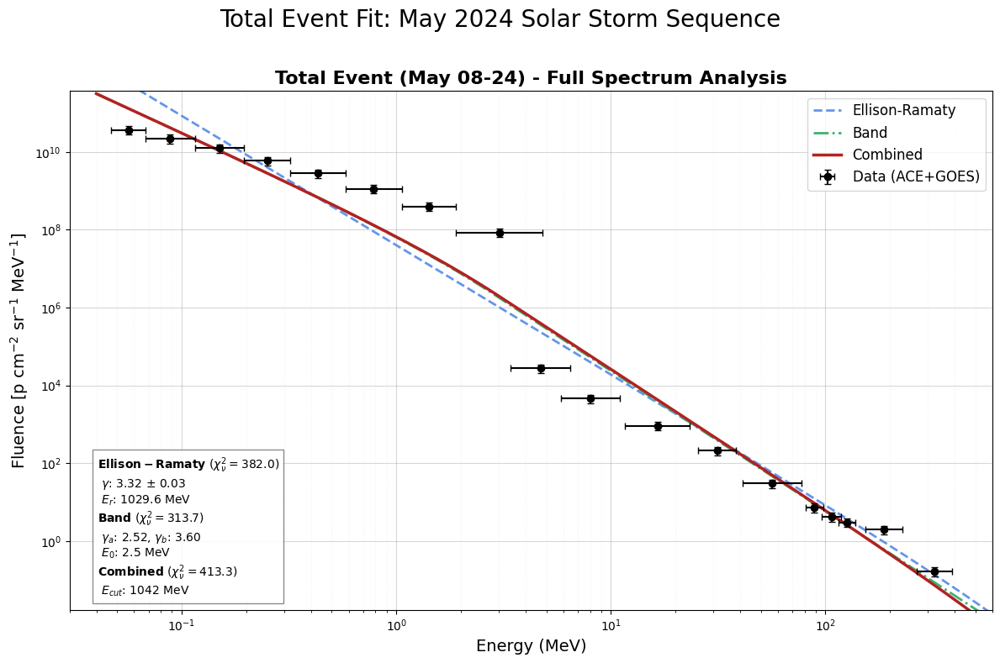

In [34]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
import pandas as pd

# ==========================================
# 1. DEFINIZIONE MODELLI (Stile Invariato)
# ==========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    # Gestione input scalare/array
    scalar = False
    if np.ndim(E) == 0: E = np.array([E]); scalar = True
    else: E = np.asarray(E)

    if gb <= ga: return np.ones_like(E)*1e-30 if not scalar else 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E)*1e-30 if not scalar else 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    if np.any(mask_low): res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    
    return res[0] if scalar else res

def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    mask = (y > 0)
    if np.sum(mask) < len(p0): return None, None
    
    sigma_log = y_err[mask] / (y[mask] * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0)
    sigma_log[sigma_log <= 0] = 1.0

    try:
        popt, pcov = curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-35)), 
                               x[mask], np.log10(y[mask]), p0=p0, sigma=sigma_log, 
                               absolute_sigma=True, bounds=bounds, maxfev=20000)
        return popt, pcov
    except: return None, None

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    res = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(res**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    
    perr = np.sqrt(np.diag(pcov)) if pcov is not None else np.zeros_like(popt)
    
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n" + rf" $E_r$: {popt[2]:.1f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}" + "\n" + rf" $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $E_{{cut}}$: {popt[4]:.0f} MeV"
    return txt

# ==========================================
# 2. PLOT FINALE (Stile Richiesto)
# ==========================================

# Range esteso per vedere tutto lo spettro
x_plot = np.logspace(np.log10(0.04), np.log10(600), 500)

fig, ax = plt.subplots(figsize=(12, 8))

print("--- AVVIO FIT SPETTRALI (ACE Scaled + GOES-18) ---")

# Iteriamo su results_combined che contiene i dati uniti e corretti
for evt_name, data in results_combined.items():
    
    x = data['x']
    y = data['y']
    x_err = data['x_err']
    color = "black" # data['color']
   
    
    # Errore leggermente aumentato per tenere conto dell'incertezza di scaling
    y_err = y * 0.25
    x_err_clean = [np.abs(x_err[0]), np.abs(x_err[1])]
    
    # Plot Dati (Croci nere come richiesto)
    ax.errorbar(x, y, yerr=y_err, xerr=x_err_clean, fmt='o', 
                color='black', ecolor='black', capsize=3, label='Data (ACE+GOES)', zorder=10)
    
    stats_box = ""
    
    # --- 1. Ellison-Ramaty ---
    p0 = [1e9, 1.5, 50.0]
    popt, pcov = fit_log_space(ellison_ramaty, x, y, y_err, p0, bounds=([0,0,0], [np.inf, 10, 5000]))
    if popt is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt), '--', color='cornflowerblue', lw=2, label='Ellison-Ramaty')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt, pcov) + "\n"

    # --- 2. Band Function ---
    p0_b = [1e8, 1.0, 3.0, 10.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0, 0.1, 0.1, 0.1], [np.inf, 10, 10, 500]))
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
        stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n"
        
        # --- 3. Combined (Solo se Band ok) ---
        p0_c = [*popt_b, 500.0]
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0, 0.1, 0.1, 0.1, 10], [np.inf, 10, 10, 500, 10000]))
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=2.5, label='Combined')
            stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)

    # Styling esatto della tua richiesta
    ax.set_title(f"{evt_name} - Full Spectrum Analysis", fontsize=16, color=color, fontweight='bold')
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.03, 600)
    
    # Limiti Y dinamici
    if len(y) > 0:
        ax.set_ylim(min(y)*0.1, max(y)*10)
    else:
        ax.set_ylim(1e-3, 1e10)
    
    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.15, linestyle=':')
    ax.set_xlabel("Energy (MeV)", fontsize=14)
    ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
    ax.legend(loc='upper right', fontsize=12)
    
    # Box Statistiche in basso a sinistra
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=10,
            bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'))

plt.suptitle("Total Event Fit: May 2024 Solar Storm Sequence", fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()





--- ESTRAZIONE DATI ---

--- RESCALING ACE SU GOES ---
Ultimo punto ACE: 8.53e+07 @ 3.02 MeV
Primo punto GOES: 4.58e+03 @ 8.0 MeV
Fattore di Scala applicato ad ACE: 0.000

--- AVVIO FIT ---
-> File SPENVIS generato: SPENVIS_SC25_MAY24_FINAL.txt


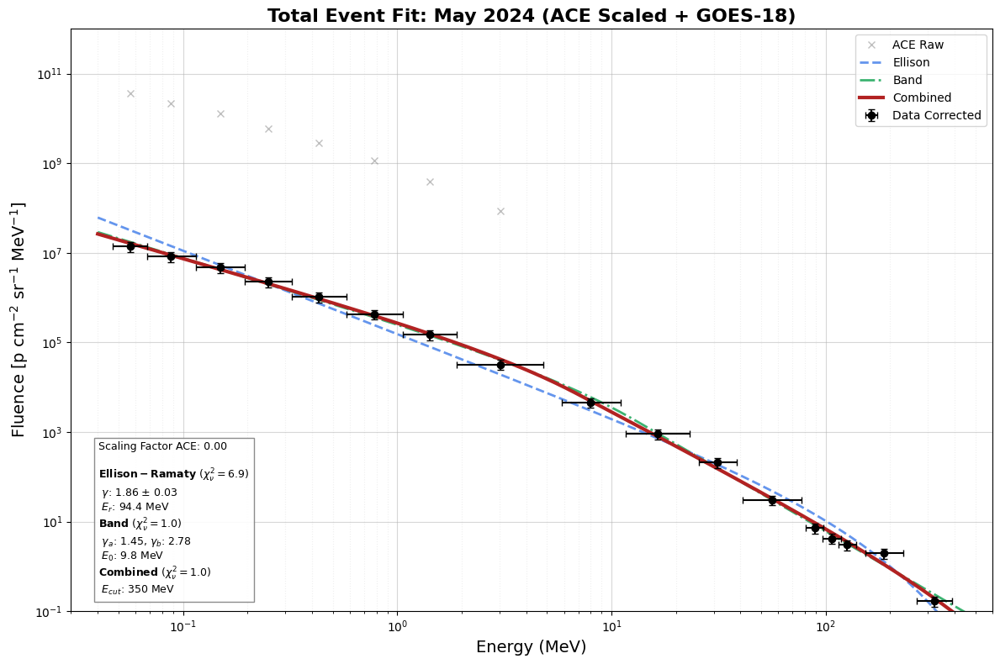


--- FLUENZE INTEGRATE (Combined Model) ---
> 10 MeV:  1.781e+04 p/cm2
> 30 MeV:  3.015e+03 p/cm2
> 100 MeV: 3.399e+02 p/cm2


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.optimize import curve_fit

# ===========================================================
# 1. SETUP DATI
# ===========================================================

events_dict_refined_2 = {
    "Total Event (May 08-24)": {
        "start": "2024-05-08 08:00:00", 
        "end":   "2024-05-24 16:00:00", 
        "color": "black"
    }
}

# Canali ACE (P1p-P8p)
ace_bins = {
    'P1p': 0.057, 'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250,
    'P5p': 0.432, 'P6p': 0.784, 'P7p': 1.419, 'P8p': 3.020 
}

# Canali GOES-18 (SGNS) - P4 in su
goes_eff_map_precise = {
    4: 8.0, 5: 16.5, 6: 31.3, 7: 56.2, 8: 88.9, 9: 107.0, 
    10: 126.0, 11: 187.0, 12: 323.0
}

# ===========================================================
# 2. ESTRAZIONE DATI
# ===========================================================
print("--- ESTRAZIONE DATI ---")
details = events_dict_refined_2["Total Event (May 08-24)"]

# --- ACE ---
df_slice_ace = df_ace_corr.loc[details['start']:details['end']]
dt_ace = df_slice_ace.index.to_series().diff().dt.total_seconds().fillna(60)
x_ace, y_ace, xl_ace, xh_ace = [], [], [], []

# Larghezze bin ACE per plot
ace_widths = {'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
              'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.06),
              'P7p': (1.06, 1.90), 'P8p': (1.90, 4.80)}

for col, eff_en in ace_bins.items():
    if col in df_slice_ace.columns:
        val = (df_slice_ace[col].fillna(0).clip(lower=0) * dt_ace).sum()
        if val > 0: 
            x_ace.append(eff_en)
            y_ace.append(val)
            xl_ace.append(eff_en - ace_widths[col][0])
            xh_ace.append(ace_widths[col][1] - eff_en)

# --- GOES ---
df_slice_goes = df_goes18_corr.loc[details['start']:details['end']]
dt_goes = df_slice_goes.index.to_series().diff().dt.total_seconds().fillna(300)
x_goes, y_goes, xl_goes, xh_goes = [], [], [], []

# Larghezze bin GOES per plot
goes_widths = {4: (5.84, 11.0), 5: (11.64, 23.27), 6: (25.5, 38.4), 7: (41.0, 77.0),
               8: (80.9, 97.6), 9: (96.3, 118.4), 10: (114.88, 138.4), 
               11: (153.3, 229.3), 12: (267.0, 390.0)}

for ch_idx, eff_en in goes_eff_map_precise.items():
    col_name = ch_idx if ch_idx in df_slice_goes.columns else str(ch_idx)
    if col_name in df_slice_goes.columns:
        val = (df_slice_goes[col_name].fillna(0).clip(lower=0) * dt_goes).sum()
        if val > 0: 
            x_goes.append(eff_en)
            y_goes.append(val)
            xl_goes.append(eff_en - goes_widths[ch_idx][0])
            xh_goes.append(goes_widths[ch_idx][1] - eff_en)

x_ace, y_ace = np.array(x_ace), np.array(y_ace)
x_goes, y_goes = np.array(x_goes), np.array(y_goes)

# ===========================================================
# 3. RESCALING (INTER-CALIBRAZIONE)
# ===========================================================
print("\n--- RESCALING ACE SU GOES ---")

# Ultimo punto ACE e Primo punto GOES
xa_last, ya_last = x_ace[-1], y_ace[-1] 
xg_first, yg_first = x_goes[0], y_goes[0]

# Proiezione Power Law inversa
gamma_guess = 2.0 
expected_ace_val = yg_first * (xa_last / xg_first)**(-gamma_guess)

# Fattore di correzione
scaling_factor = expected_ace_val / ya_last
y_ace_corrected = y_ace * scaling_factor

print(f"Ultimo punto ACE: {ya_last:.2e} @ {xa_last} MeV")
print(f"Primo punto GOES: {yg_first:.2e} @ {xg_first} MeV")
print(f"Fattore di Scala applicato ad ACE: {scaling_factor:.3f}")

# UNIONE DATI CORRETTI
all_x = np.concatenate([x_ace, x_goes])
all_y = np.concatenate([y_ace_corrected, y_goes]) # Qui usiamo quelli scalati
all_xl = np.concatenate([xl_ace, xl_goes])
all_xh = np.concatenate([xh_ace, xh_goes])

# Ordinamento
idx = np.argsort(all_x)
x_final, y_final = all_x[idx], all_y[idx]
xl_final, xh_final = np.array(all_xl)[idx], np.array(all_xh)[idx]
y_err_final = y_final * 0.25

# ===========================================================
# 4. DEFINIZIONE MODELLI (Corretti per Integrazione)
# ===========================================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    # Gestione input scalare/array per evitare crash in quad
    scalar = False
    if np.ndim(E) == 0: E = np.array([E]); scalar = True
    else: E = np.asarray(E)

    if gb <= ga: return np.ones_like(E)*1e-30 if not scalar else 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E)*1e-30 if not scalar else 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    if np.any(mask_low): res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    
    return res[0] if scalar else res

def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    mask = (y > 0)
    if np.sum(mask) < len(p0): return None, None
    sigma = y_err[mask] / (y[mask] * np.log(10))
    sigma = np.nan_to_num(sigma, nan=1.0)
    try:
        return curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-35)), 
                         x[mask], np.log10(y[mask]), p0=p0, sigma=sigma, 
                         absolute_sigma=True, bounds=bounds, maxfev=20000)
    except: return None, None

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    # FIX: Definizione corretta di residuals
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    
    perr = np.sqrt(np.diag(pcov)) if pcov is not None else np.zeros_like(popt)
    
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n" + rf" $E_r$: {popt[2]:.1f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}" + "\n" + rf" $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $E_{{cut}}$: {popt[4]:.0f} MeV"
    return txt

# ===========================================================
# 5. FIT E PLOT FINALE
# ===========================================================

print("\n--- AVVIO FIT ---")
x_plot = np.logspace(np.log10(0.04), np.log10(600), 500)
fig, ax = plt.subplots(figsize=(12, 8))

# Plot Dati Raw (per confronto visivo)
ax.plot(x_ace, y_ace, 'x', color='gray', alpha=0.5, label='ACE Raw')

# Plot Dati Corretti (quelli usati per il fit)
ax.errorbar(x_final, y_final, yerr=y_err_final, xerr=[xl_final, xh_final], fmt='o', 
            color='black', ecolor='black', capsize=3, label='Data Corrected', zorder=10)

stats_box = f"Scaling Factor ACE: {scaling_factor:.2f}\n\n"

# 1. Ellison
p0_e = [1e9, 1.5, 50.0]
popt_e, pcov_e = fit_log_space(ellison_ramaty, x_final, y_final, y_err_final, p0_e, bounds=([0,0,0], [np.inf, 10, 5000]))
if popt_e is not None:
    ax.plot(x_plot, ellison_ramaty(x_plot, *popt_e), '--', color='cornflowerblue', lw=2, label='Ellison')
    stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x_final, y_final, y_err_final, popt_e, pcov_e) + "\n"

# 2. Band
p0_b = [1e8, 1.0, 3.0, 10.0]
popt_b, pcov_b = fit_log_space(band_function, x_final, y_final, y_err_final, p0_b, bounds=([0,0,0,0], [np.inf, 10, 10, 500]))
if popt_b is not None:
    ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
    stats_box += get_stats_text("Band", band_function, x_final, y_final, y_err_final, popt_b, pcov_b) + "\n"

# 3. Combined
p0_c = [1e9, 1.2, 3.0, 10.0, 500.0] # Guess iniziale
if popt_b is not None: p0_c = [*popt_b, 500.0] # Migliora guess se Band ok

popt_c, pcov_c = fit_log_space(combined_function, x_final, y_final, y_err_final, p0_c, bounds=([0,0,0,0,10], [np.inf, 10, 10, 500, 10000]))

if popt_c is not None:
    ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=3, label='Combined')
    stats_box += get_stats_text("Combined", combined_function, x_final, y_final, y_err_final, popt_c, pcov_c)
    
    # Export File SPENVIS
    filename = "SPENVIS_SC25_MAY24_FINAL.txt"
    sp_y = combined_function(x_plot, *popt_c)
    pd.DataFrame({'Energy_MeV': x_plot, 'Fluence': sp_y}).to_csv(filename, sep='\t', index=False, float_format='%.6e')
    print(f"-> File SPENVIS generato: {filename}")

# Styling
ax.set_title("Total Event Fit: May 2024 (ACE Scaled + GOES-18)", fontsize=16, fontweight='bold')
ax.set_xscale('log'); ax.set_yscale('log')
ax.set_xlim(0.03, 600); ax.set_ylim(1e-1, 1e12)
ax.grid(True, which="major", alpha=0.5); ax.grid(True, which="minor", alpha=0.2, linestyle=':')
ax.set_xlabel("Energy (MeV)", fontsize=14)
ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
ax.legend(loc='upper right')
ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=9, bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'))

plt.tight_layout()
plt.show()

# ===========================================================
# 6. INTEGRAZIONE
# ===========================================================
print("\n--- FLUENZE INTEGRATE (Combined Model) ---")
if popt_c is not None:
    f10 = integrate.quad(lambda e: combined_function(e, *popt_c), 10, 2000)[0]
    f30 = integrate.quad(lambda e: combined_function(e, *popt_c), 30, 2000)[0]
    f100 = integrate.quad(lambda e: combined_function(e, *popt_c), 100, 2000)[0]
    print(f"> 10 MeV:  {f10:.3e} p/cm2")
    print(f"> 30 MeV:  {f30:.3e} p/cm2")
    print(f"> 100 MeV: {f100:.3e} p/cm2")

--- ESTRAZIONE E RESCALING DATI ---
-> Fattore di Scala applicato ad ACE: 0.000

--- AVVIO FIT SPETTRALI ---
-> File SPENVIS generato: SPENVIS_SC25_MAY24_FINAL.txt


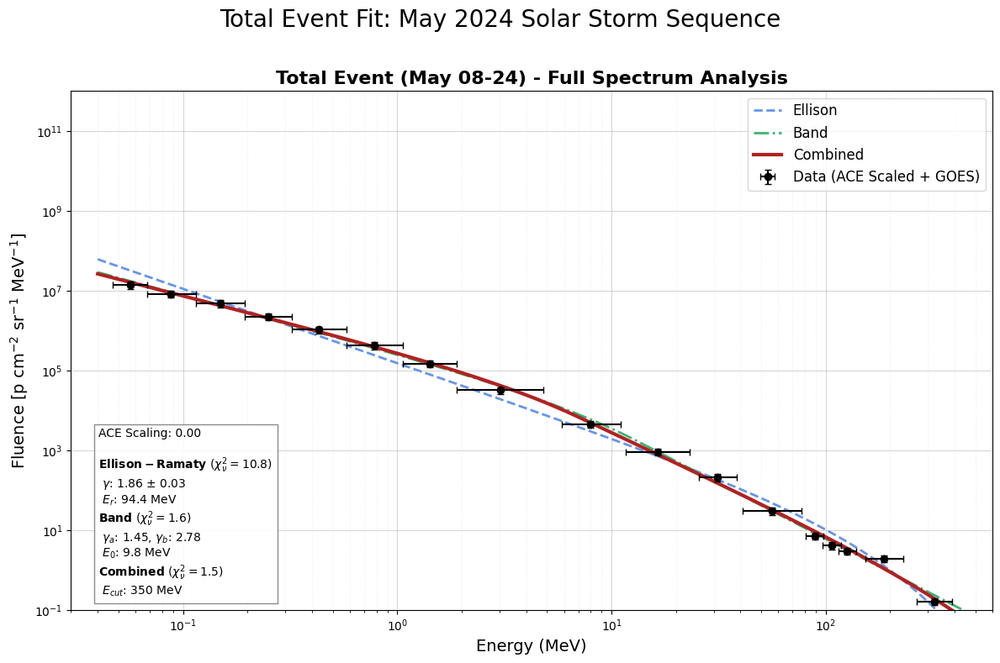


=== FLUENZE INTEGRATE (Combined Model) ===
> 10 MeV:  1.781e+04 p/cm2
> 30 MeV:  3.015e+03 p/cm2
> 100 MeV: 3.399e+02 p/cm2


In [39]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.integrate as integrate
from scipy.optimize import curve_fit

# ===========================================================
# 1. SETUP DATI
# ===========================================================

events_dict_refined_2 = {
    "Total Event (May 08-24)": {
        "start": "2024-05-08 08:00:00", 
        "end":   "2024-05-24 16:00:00", 
        "color": "black"
    }
}

# Canali ACE (P1p-P8p)
ace_bins = {
    'P1p': 0.057, 'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250,
    'P5p': 0.432, 'P6p': 0.784, 'P7p': 1.419, 'P8p': 3.020 
}

# Canali GOES-18 (SGNS) - P4 in su
goes_eff_map_precise = {
    4: 8.0, 5: 16.5, 6: 31.3, 7: 56.2, 8: 88.9, 9: 107.0, 
    10: 126.0, 11: 187.0, 12: 323.0
}

# ===========================================================
# 2. ESTRAZIONE DATI & RESCALING
# ===========================================================
print("--- ESTRAZIONE E RESCALING DATI ---")
details = events_dict_refined_2["Total Event (May 08-24)"]

# --- A. Estrazione ACE ---
df_slice_ace = df_ace_corr.loc[details['start']:details['end']]
dt_ace = df_slice_ace.index.to_series().diff().dt.total_seconds().fillna(60)
x_ace, y_ace, xl_ace, xh_ace = [], [], [], []

# Larghezze bin ACE per barre errore
ace_widths = {'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
              'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.06),
              'P7p': (1.06, 1.90), 'P8p': (1.90, 4.80)}

for col, eff_en in ace_bins.items():
    if col in df_slice_ace.columns:
        val = (df_slice_ace[col].fillna(0).clip(lower=0) * dt_ace).sum()
        if val > 0: 
            x_ace.append(eff_en)
            y_ace.append(val)
            xl_ace.append(eff_en - ace_widths[col][0])
            xh_ace.append(ace_widths[col][1] - eff_en)

# --- B. Estrazione GOES ---
df_slice_goes = df_goes18_corr.loc[details['start']:details['end']]
dt_goes = df_slice_goes.index.to_series().diff().dt.total_seconds().fillna(300)
x_goes, y_goes, xl_goes, xh_goes = [], [], [], []

# Larghezze bin GOES per barre errore
goes_widths = {4: (5.84, 11.0), 5: (11.64, 23.27), 6: (25.5, 38.4), 7: (41.0, 77.0),
               8: (80.9, 97.6), 9: (96.3, 118.4), 10: (114.88, 138.4), 
               11: (153.3, 229.3), 12: (267.0, 390.0)}

for ch_idx, eff_en in goes_eff_map_precise.items():
    col_name = ch_idx if ch_idx in df_slice_goes.columns else str(ch_idx)
    if col_name in df_slice_goes.columns:
        val = (df_slice_goes[col_name].fillna(0).clip(lower=0) * dt_goes).sum()
        if val > 0: 
            x_goes.append(eff_en)
            y_goes.append(val)
            xl_goes.append(eff_en - goes_widths[ch_idx][0])
            xh_goes.append(goes_widths[ch_idx][1] - eff_en)

x_ace, y_ace = np.array(x_ace), np.array(y_ace)
x_goes, y_goes = np.array(x_goes), np.array(y_goes)

# --- C. Calcolo Fattore di Scala ---
# Proiezione dell'ultimo punto ACE sul primo GOES
xa_last, ya_last = x_ace[-1], y_ace[-1] 
xg_first, yg_first = x_goes[0], y_goes[0]
gamma_guess = 2.0 
expected_ace_val = yg_first * (xa_last / xg_first)**(-gamma_guess)
scaling_factor = expected_ace_val / ya_last
y_ace_corrected = y_ace * scaling_factor

print(f"-> Fattore di Scala applicato ad ACE: {scaling_factor:.3f}")

# --- D. Creazione Dataset Unito ---
all_x = np.concatenate([x_ace, x_goes])
all_y = np.concatenate([y_ace_corrected, y_goes]) # Dati Scalati
all_xl = np.concatenate([xl_ace, xl_goes])
all_xh = np.concatenate([xh_ace, xh_goes])

idx_sort = np.argsort(all_x)

# Salvataggio nel dizionario per il loop di plotting
results_combined = {
    "Total Event (May 08-24)": {
        "x": all_x[idx_sort],
        "y": all_y[idx_sort],
        "x_err": [np.array(all_xl)[idx_sort], np.array(all_xh)[idx_sort]],
        "color": "black"
    }
}

# ===========================================================
# 3. DEFINIZIONE MODELLI (Robust Version)
# ===========================================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    scalar = False
    if np.ndim(E) == 0: E = np.array([E]); scalar = True
    else: E = np.asarray(E)

    if gb <= ga: return np.ones_like(E)*1e-30 if not scalar else 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E)*1e-30 if not scalar else 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    if np.any(mask_low): res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res[0] if scalar else res

def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    mask = (y > 0)
    if np.sum(mask) < len(p0): return None, None
    sigma = y_err[mask] / (y[mask] * np.log(10))
    sigma = np.nan_to_num(sigma, nan=1.0)
    try:
        return curve_fit(lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-35)), 
                         x[mask], np.log10(y[mask]), p0=p0, sigma=sigma, 
                         absolute_sigma=True, bounds=bounds, maxfev=20000)
    except: return None, None

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    perr = np.sqrt(np.diag(pcov)) if pcov is not None else np.zeros_like(popt)
    
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n" + rf" $E_r$: {popt[2]:.1f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}" + "\n" + rf" $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $E_{{cut}}$: {popt[4]:.0f} MeV"
    return txt

# ===========================================================
# 4. PLOT FINALE & EXPORT
# ===========================================================

print("\n--- AVVIO FIT SPETTRALI ---")
x_plot = np.logspace(np.log10(0.04), np.log10(600), 500)
fig, ax = plt.subplots(figsize=(12, 8))

for evt_name, data in results_combined.items():
    x = data['x']
    y = data['y']
    x_err = data['x_err']
    y_err = y * 0.20 # Errore combinato
    
    # Plot Dati
    ax.errorbar(x, y, yerr=y_err, xerr=x_err, fmt='o', color='black', ecolor='black', 
                capsize=3, label='Data (ACE Scaled + GOES)', zorder=10)
    
    stats_box = f"ACE Scaling: {scaling_factor:.2f}\n\n"
    
    # 1. Ellison
    p0_e = [1e9, 1.5, 50.0]
    popt_e, pcov_e = fit_log_space(ellison_ramaty, x, y, y_err, p0_e, bounds=([0,0,0], [np.inf, 10, 5000]))
    if popt_e is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_e), '--', color='cornflowerblue', lw=2, label='Ellison')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt_e, pcov_e) + "\n"

    # 2. Band
    p0_b = [1e8, 1.0, 3.0, 10.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0,0,0,0], [np.inf, 10, 10, 500]))
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
        stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n"

    # 3. Combined
    p0_c = [1e9, 1.2, 3.0, 10.0, 500.0]
    if popt_b is not None: p0_c = [*popt_b, 500.0] 
    popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0,0,0,0,10], [np.inf, 10, 10, 500, 10000]))
    
    if popt_c is not None:
        ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=3, label='Combined')
        stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)
        
        # Export SPENVIS
        filename = "SPENVIS_SC25_MAY24_FINAL.txt"
        sp_y = combined_function(x_plot, *popt_c)
        pd.DataFrame({'Energy_MeV': x_plot, 'Fluence': sp_y}).to_csv(filename, sep='\t', index=False, float_format='%.6e')
        print(f"-> File SPENVIS generato: {filename}")

    # Styling
    ax.set_title(f"{evt_name} - Full Spectrum Analysis", fontsize=16, fontweight='bold')
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.03, 600); ax.set_ylim(1e-1, 1e12)
    ax.grid(True, which="major", alpha=0.5); ax.grid(True, which="minor", alpha=0.2, linestyle=':')
    ax.set_xlabel("Energy (MeV)", fontsize=14)
    ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
    ax.legend(loc='upper right', fontsize=12)
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'))

plt.suptitle("Total Event Fit: May 2024 Solar Storm Sequence", fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()

# ===========================================================
# 5. INTEGRAZIONE FINALE
# ===========================================================
print("\n=== FLUENZE INTEGRATE (Combined Model) ===")
if 'popt_c' in locals() and popt_c is not None:
    f10 = integrate.quad(lambda e: combined_function(e, *popt_c), 10, 2000)[0]
    f30 = integrate.quad(lambda e: combined_function(e, *popt_c), 30, 2000)[0]
    f100 = integrate.quad(lambda e: combined_function(e, *popt_c), 100, 2000)[0]
    print(f"> 10 MeV:  {f10:.3e} p/cm2")
    print(f"> 30 MeV:  {f30:.3e} p/cm2")
    print(f"> 100 MeV: {f100:.3e} p/cm2")

# FIT SOLO ACE 

Fluenze ACE calcolate!


AttributeError: 'Axes' object has no attribute 'flatten'

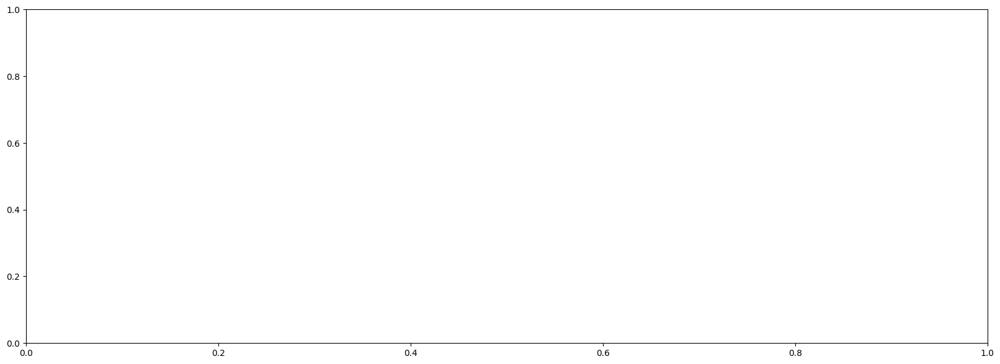

In [28]:


# FIT SOLO ACE 


# ===========================================================
# ACE/EPAM — Fluenze integrate + Fit spettrale (P1p–P8p)
# ===========================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ================================
# 1. DEFINIZIONE BIN ENERGETICI
# ================================

ace_bins = {
    'P1p': (0.047, 0.068),
    'P2p': (0.068, 0.115),
    'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321),
    'P5p': (0.321, 0.580),
    'P6p': (0.580, 1.06),
    'P7p': (1.06, 1.90),
    'P8p': (1.90, 4.80)
}

# energia efficace = media geometrica
ace_Eeff = {ch: np.sqrt(Emin * Emax) for ch, (Emin, Emax) in ace_bins.items()}

events_dict_refined_ace = {
    "Total Event (May 08-24)": {
        "start": "2024-05-08 08:00:00", 
        "end":   "2024-05-24 16:00:00", 
        "color": "black"
    }
}

# ========================================
# 2. CALCOLO DELLE FLUENZE PER EVENTO
# ========================================

results_ACE = {}

for event, details in events_dict_refined_ace.items():
    df_slice = df_ace_corr.loc[details['start']:details['end']]
    dt = df_slice.index.to_series().diff().dt.total_seconds().fillna(60)

    energies = []
    fluences = []
    err_low = []
    err_high = []

    for ch in ace_bins:
        if ch not in df_slice.columns:
            continue
        
        flux = df_slice[ch].fillna(0)
        flu = (flux * dt).sum()

        if flu > 0:
            Emin, Emax = ace_bins[ch]
            energies.append(ace_Eeff[ch])
            fluences.append(flu)
            err_low.append(ace_Eeff[ch] - Emin)
            err_high.append(Emax - ace_Eeff[ch])

    results_ACE[event] = {
        "x": np.array(energies),
        "y": np.array(fluences),
        "x_err": [np.array(err_low), np.array(err_high)],
        "color": details["color"]
    }

print("Fluenze ACE calcolate!")

# ========================================
# 3. MODELLI SPETTRALI
# ========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * E**(-gamma) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: 
        return np.ones_like(E)*1e-30
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)

    mask = E < E_break
    res[mask] = A * (E[mask]**-ga) * np.exp(-E[mask]/E0)

    norm = (E_break**(gb-ga))*np.exp(ga-gb)
    res[~mask] = A * (E[~mask]**-gb) * norm

    return res

def combined_function(E, A, ga, gb, E0, Ecut):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Ecut)

def fit_log(func, x, y, yerr, p0, bounds):
    mask = y > 0
    sigma_log = yerr[mask] / (y[mask] * np.log(10))
    try:
        popt, pcov = curve_fit(
            lambda e, *p: np.log10(np.maximum(func(e, *p), 1e-35)),
            x[mask], np.log10(y[mask]),
            sigma=sigma_log, absolute_sigma=True,
            p0=p0, bounds=bounds, maxfev=20000
        )
        return popt, pcov
    except:
        return None, None

def stats_text(name, func, x, y, yerr, popt, pcov):
    if popt is None:
        return name + " failed"
    res = (y - func(x, *popt))/yerr
    chi2 = np.sum(res**2)
    dof = len(y) - len(popt)
    red = chi2/dof if dof>0 else 0
    perr = np.sqrt(np.diag(pcov))
    txt = f"{name} (χ²ν={red:.1f})\n"
    return txt

# ========================================
# 4. FIT + PLOT
# ========================================

fig, axes = plt.subplots(1, len(events_dict_refined_ace), figsize=(20, 7), sharey=True)
axes = axes.flatten()

x_plot = np.logspace(-2, 1, 500)   # 0.01–10 MeV

for k, (event, details) in enumerate(events_dict_refined_2.items()):
    ax = axes[k]
    dat = results_ACE[event]

    x = dat["x"]
    y = dat["y"]
    yerr = 0.20*y
    xerr = dat["x_err"]

    # datapoints
    ax.errorbar(x, y, yerr=yerr, xerr=xerr, fmt='o', 
                color='black', capsize=3)

    text = ""

    # Ellison-Ramaty
    p0_ER = [1e7, 2.0, 0.5]
    bounds_ER = ([0, 0, 0.01],[1e20, 10, 20])
    popt_ER, pcov_ER = fit_log(ellison_ramaty, x, y, yerr, p0_ER, bounds_ER)
    if popt_ER is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_ER), '--', color='blue')
        text += stats_text("Ellison-Ramaty", ellison_ramaty, x, y, yerr, popt_ER, pcov_ER)

    # Band
    p0_B = [1e7, 1.0, 3.0, 0.1]
    bounds_B = ([0,0.1,0.1,0.01],[1e20,10,10,10])
    popt_B, pcov_B = fit_log(band_function, x, y, yerr, p0_B, bounds_B)
    if popt_B is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_B), "-.", color='green')
        text += stats_text("Band", band_function, x, y, yerr, popt_B, pcov_B)

    # Combined
    if popt_B is not None:
        p0_C = [*popt_B, 2.0]
        bounds_C = ([0,0.1,0.1,0.01,0.1],[1e20,10,10,10,20])
        popt_C, pcov_C = fit_log(combined_function, x, y, yerr, p0_C, bounds_C)
        if popt_C is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_C), color='firebrick')
            text += stats_text("Combined", combined_function, x, y, yerr, popt_C, pcov_C)

    # Styling
    ax.set_title(event, fontsize=13, fontweight='bold', color=details["color"])
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(0.03, 10)
    ax.set_ylim(1e3, 1e12)
    ax.grid(True, which="both", alpha=0.3)
    ax.text(0.03, 0.03, text, transform=ax.transAxes, fontsize=9,
            bbox=dict(facecolor='white', alpha=0.9))

    ax.set_xlabel("Energy (MeV)")
    if k == 0:
        ax.set_ylabel("Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")

plt.suptitle("ACE/EPAM — Fluence Spectra & Fits (P-channels 0.047–4.8 MeV)", fontsize=17)
plt.tight_layout(rect=[0,0,1,0.94])
plt.show()


Fluenze ACE calcolate!


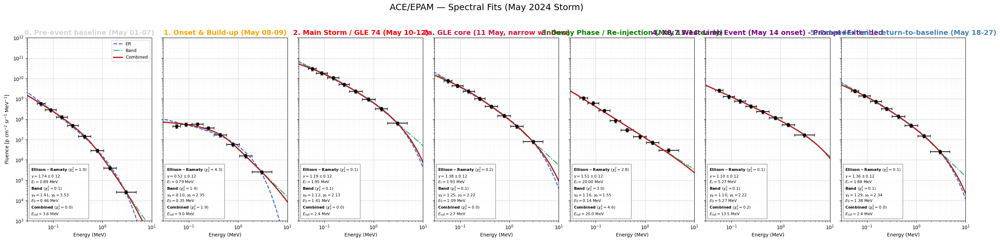

In [10]:
# ===============================================================
# ACE/EPAM — Fluenze integrate + Fit spettrale con stile esteso
# (Ellison-Ramaty, Band, Combined) — Versione professionale
# ===============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ================================
# 1. DEFINIZIONE BIN ENERGETICI
# ================================

ace_bins = {
    'P1p': (0.047, 0.068),
    'P2p': (0.068, 0.115),
    'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321),
    'P5p': (0.321, 0.580),
    'P6p': (0.580, 1.06),
    'P7p': (1.06, 1.90),
    'P8p': (1.90, 4.80)
}

ace_Eeff = {ch: np.sqrt(Emin * Emax) for ch, (Emin, Emax) in ace_bins.items()}

# ========================================
# 2. CALCOLO DELLE FLUENZE PER EVENTO
# ========================================

results_ACE = {}

for event, details in events_dict_refined_2.items():
    df_slice = df_ace_corr.loc[details['start']:details['end']]
    dt = df_slice.index.to_series().diff().dt.total_seconds().fillna(60)

    energies = []
    fluences = []
    err_low = []
    err_high = []

    for ch in ace_bins:
        if ch not in df_slice.columns:
            continue
        
        flux = df_slice[ch].fillna(0)
        flu = (flux * dt).sum()

        if flu > 0:
            Emin, Emax = ace_bins[ch]
            energies.append(ace_Eeff[ch])
            fluences.append(flu)
            err_low.append(ace_Eeff[ch] - Emin)
            err_high.append(Emax - ace_Eeff[ch])

    results_ACE[event] = {
        "x": np.array(energies),
        "y": np.array(fluences),
        "x_err": [np.array(err_low), np.array(err_high)],
        "color": details["color"]
    }

print("Fluenze ACE calcolate!")


# ========================================
# 3. MODELLI + FUNZIONI FIT
# ========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    low = E < E_break
    res[low] = A * (E[low] ** -ga) * np.exp(-E[low] / E0)

    norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~low] = A * (E[~low] ** -gb) * norm
    return res

def combined_function(E, A, ga, gb, E0, Ecut):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Ecut)

def fit_log(func, x, y, yerr, p0, bounds):
    mask = y > 0
    sigma = yerr[mask] / (y[mask] * np.log(10))
    try:
        popt, pcov = curve_fit(
            lambda e,*p: np.log10(np.maximum(func(e,*p),1e-35)),
            x[mask], np.log10(y[mask]),
            sigma=sigma, absolute_sigma=True,
            p0=p0, bounds=bounds, maxfev=20000
        )
        return popt, pcov
    except:
        return None, None

def stats_text(model_name, func, x, y, yerr, popt, pcov):
    if popt is None: return f"{model_name}: failed"

    residuals = (y - func(x, *popt)) / yerr
    chi2 = np.sum(residuals**2)
    dof = len(y) - len(popt)
    red = chi2/dof if dof > 0 else 0
    perr = np.sqrt(np.diag(pcov))

    msg = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        msg += rf"$\gamma={popt[1]:.2f}\pm{perr[1]:.2f}$"+"\n"
        msg += rf"$E_r={popt[2]:.2f}$ MeV"
    elif model_name == "Band":
        msg += rf"$\gamma_a={popt[1]:.2f}$, $\gamma_b={popt[2]:.2f}$"+"\n"
        msg += rf"$E_0={popt[3]:.2f}$ MeV"
    elif model_name == "Combined":
        msg += rf"$E_{{\rm cut}}={popt[4]:.1f}$ MeV"

    return msg


# ========================================
# 4. FIT + PLOT (stile GOES-18)
# ========================================

fig, axes = plt.subplots(1, len(events_dict_refined_2), figsize=(28, 7), sharey=True)
axes = axes.flatten()

x_plot = np.logspace(-2, 1, 500)

for i, (event, details) in enumerate(events_dict_refined_2.items()):
    dat = results_ACE[event]
    ax = axes[i]

    x = dat["x"]
    y = dat["y"]
    xerr = dat["x_err"]
    yerr = y * 0.20

    ax.errorbar(x, y, yerr=yerr, xerr=xerr, fmt="o",
                color="black", ecolor="black", capsize=3)

    text = ""

    # --- ER ---
    pER, cER = fit_log(
        ellison_ramaty, x, y, yerr,
        p0=[1e7, 2.0, 0.5],
        bounds=([0,0,0.01],[1e20,10,20])
    )
    if pER is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *pER), '--', lw=2, color="royalblue", label="ER")
        text += stats_text("Ellison-Ramaty", ellison_ramaty, x, y, yerr, pER, cER) + "\n"

    # --- BAND ---
    pB, cB = fit_log(
        band_function, x, y, yerr,
        p0=[1e7, 1.0, 3.0, 0.1],
        bounds=([0,0.1,0.1,0.01],[1e20,10,10,10])
    )
    if pB is not None:
        ax.plot(x_plot, band_function(x_plot, *pB), "-.", lw=2, color="mediumseagreen", label="Band")
        text += stats_text("Band", band_function, x, y, yerr, pB, cB) + "\n"

        # --- Combined ---
        pC, cC = fit_log(
            combined_function, x, y, yerr,
            p0=[*pB, 2.0],
            bounds=([0,0.1,0.1,0.01,0.1],[1e20,10,10,10,20])
        )
        if pC is not None:
            ax.plot(x_plot, combined_function(x_plot, *pC), "-", lw=2.5, color="firebrick", label="Combined")
            text += stats_text("Combined", combined_function, x, y, yerr, pC, cC)

    # Style
    ax.set_title(event, fontsize=14, fontweight="bold", color=details["color"])
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_xlim(0.03, 10); ax.set_ylim(1e3, 1e12)
    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.2, linestyle=':')

    if i == 0:
        ax.set_ylabel("Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")
        ax.legend(loc="upper right", fontsize=9)

    ax.set_xlabel("Energy (MeV)")

    ax.text(0.03, 0.03, text, transform=ax.transAxes, fontsize=8,
            bbox=dict(facecolor="white", alpha=0.9, edgecolor="gray"))

plt.suptitle("ACE/EPAM — Spectral Fits (May 2024 Storm)", fontsize=18, y=0.98)
plt.tight_layout(rect=[0,0.0,1,0.95])
plt.show()


# OCT 2024 SEP event 


Più forte singolo evento protonico di SC25  con >10 MeV  1810pfu 



Dati combinati da SEISS --> SPGS instrument   1-30 MeV   +  MPS-HI   30-500 MeV  


Finestra temporale:  2024-10-09   2024  10-11 




# MPS HI DATA 30-500 MeV 5min avg


In [1]:
from netCDF4 import Dataset
import numpy as np

file_path = "Evento_OCT_2024/MPS_HI/sci_mpsh-l2-avg5m_g16_d20241006_v2-0-2.nc"  # aggiorna con il tuo path

ds = Dataset(file_path)

print("*** Dimensioni ***")
for dim in ds.dimensions.values():
    print(dim)

print("\n*** Variabili ***")
for var in ds.variables.keys():
    print(var)
    


*** Dimensioni ***
"<class 'netCDF4.Dimension'>" (unlimited): name = 'time', size = 288
"<class 'netCDF4.Dimension'>": name = 'electron_diff_chans', size = 10
"<class 'netCDF4.Dimension'>": name = 'proton_diff_chans', size = 11
"<class 'netCDF4.Dimension'>": name = 'telescopes', size = 5

*** Variabili ***
time
L1bRecordsInAvg
yaw_flip_flag
EclipseFlag
AvgDiffProtonFlux
AvgDiffProtonFluxUncert
DiffProtonValidL1bSamplesInAvg
DiffProtonDQFdtcSum
DiffProtonDQFoobSum
DiffProtonDQFerrSum
AvgDiffElectronFlux
AvgDiffElectronFluxUncert
DiffElectronEffectiveEnergy
DiffElectronValidL1bSamplesInAvg
DiffElectronDQFdtcSum
DiffElectronDQFoobSum
DiffElectronDQFerrSum
AvgIntElectronFlux
AvgIntElectronFluxUncert
IntElectronEffectiveEnergy
IntValidL1bSamplesInAvg
IntDQFdtcSum
IntDQFoobSum
IntDQFerrSum
DiffProtonLowerEnergy
DiffProtonUpperEnergy
DiffProtonEffectiveEnergy
ExpectedLUTNotFound


In [63]:
from netCDF4 import Dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



ds = Dataset(file_path)

# TIME
time = ds.variables['time'][:]
# Conversione tempo
time_units = ds.variables['time'].units
base_time = pd.to_datetime(time_units.split(" since ")[1])
times = base_time + pd.to_timedelta(time, unit='s')

# FLUSSI DIFFERENZIALI
flux = ds.variables['AvgDiffProtonFlux'][:]  # shape (time, proton_diff_chans)
flux_unc = ds.variables['AvgDiffProtonFluxUncert'][:]

# ENERGIE
E_low = ds.variables['DiffProtonLowerEnergy'][:]
E_high = ds.variables['DiffProtonUpperEnergy'][:]
E_eff = ds.variables['DiffProtonEffectiveEnergy'][:]

# Informazioni generali
print("Shape tempo:", flux.shape[0])
print("Numero canali protonici:", flux.shape[1])
print("Energie efficaci [MeV]:", E_eff)






Shape tempo: 288
Numero canali protonici: 5
Energie efficaci [MeV]: [[  97.57049   124.65954   177.13272   255.94531   406.9693    621.2246
   848.52814  1378.4049   2465.7656   4560.7017   8831.761   ]
 [  99.13627   124.65954   177.13272   255.94531   406.9693    621.2246
   848.52814  1378.4049   2465.7656   4560.7017   8831.761   ]
 [ 108.16654   124.65954   177.13272   255.94531   406.9693    621.2246
   848.52814  1378.4049   2465.7656   4560.7017   8831.761   ]
 [ 108.24971   124.65954   177.13272   255.94531   406.9693    621.2246
   848.52814  1378.4049   2465.7656   4560.7017   8831.761   ]
 [  96.093704  124.65954   177.13272   255.94531   406.9693    621.2246
   848.52814  1378.4049   2465.7656   4560.7017   8831.761   ]]


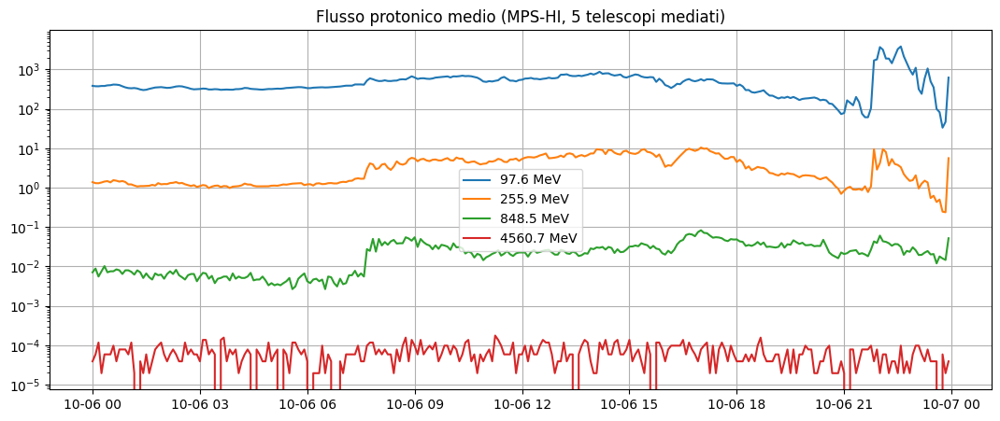

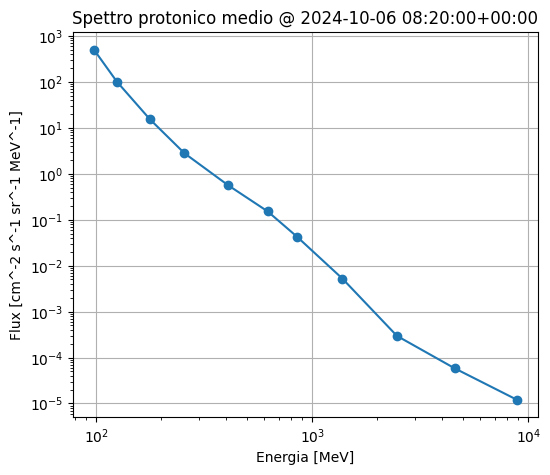

In [22]:
# % telescopi 1 unica curva 

# Media sui telescopi
flux_mean = np.mean(flux, axis=1)            # shape (288, 11)
flux_unc_mean = np.mean(flux_unc, axis=1)    # stessa shape

# Prendiamo una sola riga da E_eff perché sono uguali tra telescopi
E = E_eff[0, :]

plt.figure(figsize=(13,5))
for ch in [0,3,6,9]:
    plt.plot(times, flux_mean[:,ch], label=f"{E[ch]:.1f} MeV")
plt.yscale("log")
plt.grid(True)
plt.legend()
plt.title("Flusso protonico medio (MPS-HI, 5 telescopi mediati)")
plt.show()


idx = 100  # ad esempio
plt.figure(figsize=(6,5))
plt.loglog(E, flux_mean[idx,:], 'o-')
plt.grid(True)
plt.xlabel("Energia [MeV]")
plt.ylabel("Flux [cm^-2 s^-1 sr^-1 MeV^-1]")
plt.title(f"Spettro protonico medio @ {times[idx]}")
plt.show()



In [64]:
import os
from netCDF4 import Dataset
import numpy as np
import pandas as pd

data_dir = "Evento_OCT_2024/MPS_HI/"
files = sorted([f for f in os.listdir(data_dir) if f.endswith(".nc")])

print("File trovati:", files)

times_all = []
flux_all = []

for f in files:
    ds = Dataset(os.path.join(data_dir, f))
    
    # TIME
    time = ds.variables['time'][:]
    time_units = ds.variables['time'].units
    base_time = pd.to_datetime(time_units.split(" since ")[1])
    times = base_time + pd.to_timedelta(time, unit='s')
    
    # Proton flux (time, telescopes, channels)
    flux = ds.variables['AvgDiffProtonFlux'][:]
    
    # Collapse telescopes axis
    flux_mean = np.mean(flux, axis=1)  # shape (nt, nch)
    
    times_all.append(times)
    flux_all.append(flux_mean)
    
    ds.close()

# Concatenazione globale
times_all = np.concatenate(times_all)
flux_all = np.concatenate(flux_all)

print("Shape finale times:", times_all.shape)
print("Shape finale flux:", flux_all.shape)

# Energie (prendi dal primo file - fisse)
ds0 = Dataset(os.path.join(data_dir, files[0]))
E = ds0.variables['DiffProtonEffectiveEnergy'][0, :]
E_keV = E.copy()
E_MeV = E_keV / 1000.0   # 0.08–12 MeV circa

ds0.close()

print("Energie [MeV]:", E_MeV)

File trovati: ['sci_mpsh-l2-avg5m_g16_d20241006_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241007_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241008_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241009_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241010_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241011_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241012_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241013_v2-0-2.nc']
Shape finale times: (2304,)
Shape finale flux: (2304, 11)
Energie [MeV]: [0.09757048797607422 0.12465953826904297 0.17713272094726562 0.2559453125
 0.40696929931640624 0.621224609375 0.8485281372070312 1.3784049072265625
 2.465765625 4.56070166015625 8.8317607421875]


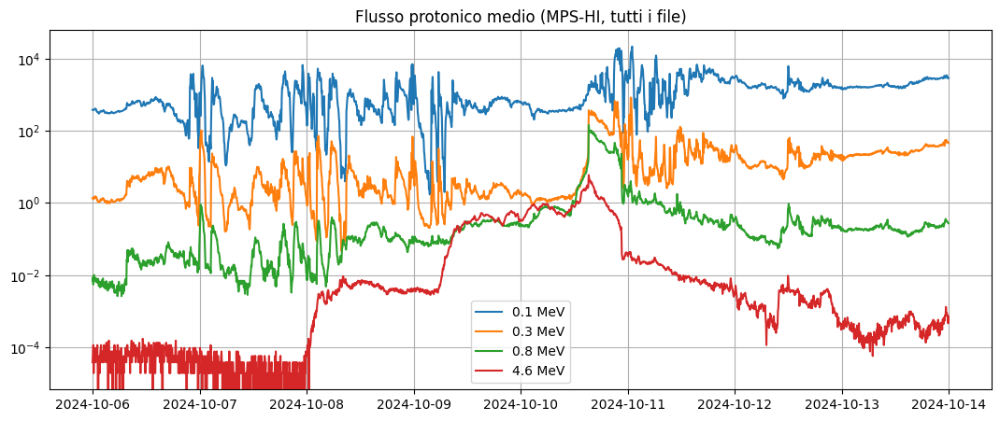

In [65]:
#plot tutti file giorni 

plt.figure(figsize=(13,5))
for ch in [0,3,6,9]:
    plt.plot(times_all, flux_all[:,ch], label=f"{E_MeV[ch]:.1f} MeV")
plt.yscale("log")
plt.grid(True)
plt.legend()
plt.title("Flusso protonico medio (MPS-HI, tutti i file)")
plt.show()
# ========================================





File trovati: ['sci_mpsh-l2-avg5m_g16_d20241006_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241007_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241008_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241009_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241010_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241011_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241012_v2-0-2.nc', 'sci_mpsh-l2-avg5m_g16_d20241013_v2-0-2.nc']
Shape tempo: (2304,)
Shape flux : (2304, 11)
Energia [MeV]: [0.09757048797607422 0.12465953826904297 0.17713272094726562 0.2559453125
 0.40696929931640624 0.621224609375 0.8485281372070312 1.3784049072265625
 2.465765625 4.56070166015625 8.8317607421875]


c:\Users\stefa\OneDrive\Desktop\Tesi\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


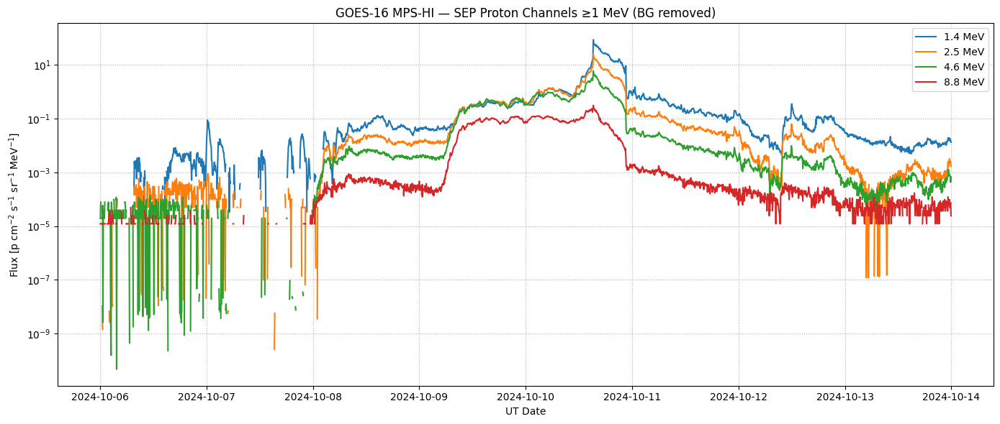

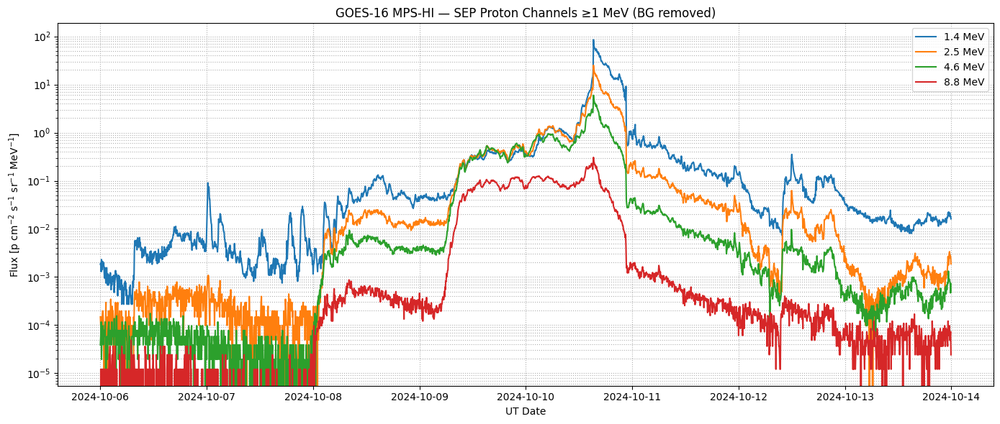

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset

data_dir = "Evento_OCT_2024/MPS_HI/"

files = sorted(f for f in os.listdir(data_dir) if f.endswith(".nc"))
print("File trovati:", files)

times_all = []
flux_all = []

for f in files:
    ds = Dataset(os.path.join(data_dir, f))

    t = ds.variables['time'][:]  # seconds since epoch
    time_units = ds.variables['time'].units
    
    # Extract epoch ref
    base_time_str = time_units.split(" since ")[1]
    base_time = pd.to_datetime(base_time_str)  # timezone-aware
    
    times = base_time + pd.to_timedelta(t, unit='s')
    
    flux = ds.variables['AvgDiffProtonFlux'][:]  # (time, telescope, channel)
    flux_mean = np.mean(flux, axis=1)            # collapse telescopes
    
    times_all.append(times)
    flux_all.append(flux_mean)

    ds.close()

times_all = pd.to_datetime(np.concatenate(times_all))  # ensure unified dtype
flux_all = np.concatenate(flux_all)

print("Shape tempo:", times_all.shape)
print("Shape flux :", flux_all.shape)

# Energies (MeV)
ds0 = Dataset(os.path.join(data_dir, files[0]))
E = ds0.variables['DiffProtonEffectiveEnergy'][0,:] / 1000.0
ds0.close()
print("Energia [MeV]:", E)

# Select only >= 1 MeV channels (SEP-usable)
sep_ch = np.where(E >= 1.0)[0]
E_sep = E[sep_ch]
flux_sep = flux_all[:, sep_ch]

# Make times tz-naive to avoid comparisons issue
times_all = times_all.tz_localize(None)

# Background: from 06 up to 09 Oct
bg_mask = times_all < pd.Timestamp("2024-10-08")
bg = np.median(flux_sep[bg_mask], axis=0)

# Subtract background + log cleaning
flux_clean = flux_sep - bg
flux_clean[flux_clean <= 0] = np.nan

# Plot all SEP-usable channels
plt.figure(figsize=(14,6))
for i,ch in enumerate(sep_ch):
    plt.plot(times_all, flux_clean[:, i], label=f"{E_sep[i]:.1f} MeV")

plt.yscale("log")
plt.grid(True, which="both", ls=":")
plt.title("GOES-16 MPS-HI — SEP Proton Channels ≥1 MeV (BG removed)")
plt.xlabel("UT Date")
plt.ylabel("Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]")
plt.legend(ncol=1)
plt.tight_layout()
plt.show()


# Plot all SEP-usable channels
plt.figure(figsize=(14,6))
for i,ch in enumerate(sep_ch):
    plt.plot(times_all, flux_sep[:, i], label=f"{E_sep[i]:.1f} MeV")

plt.yscale("log")
plt.grid(True, which="both", ls=":")
plt.title("GOES-16 MPS-HI — SEP Proton Channels ≥1 MeV (BG removed)")
plt.xlabel("UT Date")
plt.ylabel("Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]")
plt.legend(ncol=1)
plt.tight_layout()
plt.show()



Caricamento MPS-HI e SGPS in corso...


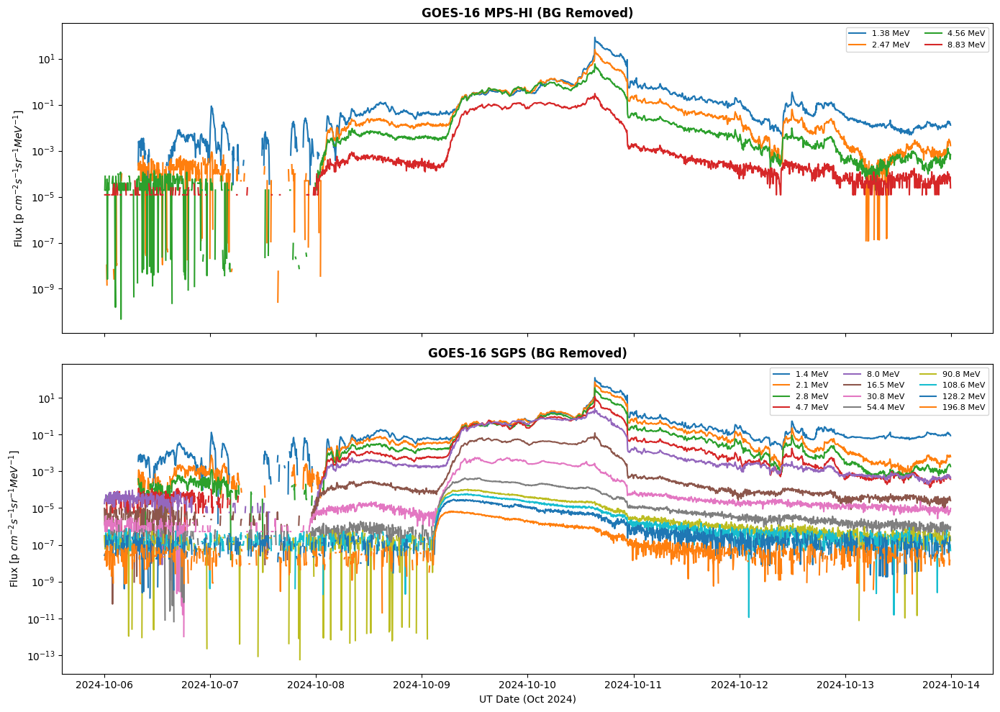

Dati pronti per il calcolo della fluenza.


In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset

# ============================================================
# 1. SETUP DEI PATH E SENSORI
# ============================================================
dirs = {
    "MPS_HI": "Evento_OCT_2024/MPS_HI/",
    "SGPS": "Evento_OCT_2024/SGPS/"
}

def load_goes_data(data_dir, instrument):
    files = sorted(f for f in os.listdir(data_dir) if f.endswith(".nc"))
    t_list, f_list = [], []
    
    for f in files:
        ds = Dataset(os.path.join(data_dir, f))
        t = ds.variables['time'][:]
        base = pd.to_datetime(ds.variables['time'].units.split(" since ")[1])
        t_list.append(base + pd.to_timedelta(t, unit='s'))
        
        # Gestione MaskedArray per evitare UserWarning
        flux_raw = ds.variables['AvgDiffProtonFlux'][:]
        flux_data = np.ma.filled(flux_raw, np.nan)
        
        if instrument == "MPS_HI":
            # Media sui 5 telescopi
            with np.errstate(all='ignore'):
                f_list.append(np.nanmean(flux_data, axis=1))
        else:
            # SGPS: Rimuovi P11 integrale, pulizia P5/P7 e media sensori
            flux_data = flux_data[:, :, :-1]
            flux_data[:, 1, 4] = np.nan
            flux_data[:, 1, 6] = np.nan
            with np.errstate(all='ignore'):
                f_list.append(np.nanmean(flux_data, axis=1))
        ds.close()
        
    times = pd.to_datetime(np.concatenate(t_list)).tz_localize(None)
    flux = np.concatenate(f_list)
    return times, flux

# ============================================================
# 2. CARICAMENTO E METADATI ENERGETICI
# ============================================================
print("Caricamento MPS-HI e SGPS in corso...")
t_mps, f_mps_raw = load_goes_data(dirs["MPS_HI"], "MPS_HI")
t_sgps, f_sgps_raw = load_goes_data(dirs["SGPS"], "SGPS")

# Estrazione Metadati (MeV)
ds_m = Dataset(os.path.join(dirs["MPS_HI"], sorted(os.listdir(dirs["MPS_HI"]))[0]))
E_m = np.array(ds_m.variables['DiffProtonEffectiveEnergy'][0,:]) / 1000.0
E_min_m = np.array(ds_m.variables['DiffProtonLowerEnergy'][0,:]) / 1000.0
E_max_m = np.array(ds_m.variables['DiffProtonUpperEnergy'][0,:]) / 1000.0
ds_m.close()

ds_s = Dataset(os.path.join(dirs["SGPS"], sorted(os.listdir(dirs["SGPS"]))[0]))
E_s = np.array(ds_s.variables['DiffProtonEffectiveEnergy'][0,:-1]) / 1000.0
E_min_s = np.array(ds_s.variables['DiffProtonLowerEnergy'][0,:-1]) / 1000.0
E_max_s = np.array(ds_s.variables['DiffProtonUpperEnergy'][0,:-1]) / 1000.0
ds_s.close()

# Selezione canali MPS-HI >= 1 MeV
ch_sel = np.where(E_m >= 1.0)[0]
E_m, E_min_m, E_max_m, f_mps_raw = E_m[ch_sel], E_min_m[ch_sel], E_max_m[ch_sel], f_mps_raw[:, ch_sel]

# ============================================================
# 3. SOTTRAZIONE BACKGROUND (Finestra quiete: 06-08 Ottobre)
# ============================================================
def clean_background(times, flux, bg_end_date):
    bg_mask = times < pd.Timestamp(bg_end_date)
    with np.errstate(all='ignore'):
        bg_val = np.nanmedian(flux[bg_mask], axis=0)
    f_clean = flux - bg_val
    f_clean[f_clean <= 0] = np.nan
    return f_clean

f_mps_clean = clean_background(t_mps, f_mps_raw, "2024-10-08")
f_sgps_clean = clean_background(t_sgps, f_sgps_raw, "2024-10-08")

# ============================================================
# 4. PLOT DI VERIFICA
# ============================================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

for i in range(f_mps_clean.shape[1]):
    ax1.plot(t_mps, f_mps_clean[:, i], label=f"{E_m[i]:.2f} MeV")
ax1.set_title("GOES-16 MPS-HI (BG Removed)", fontweight='bold')
ax1.set_yscale("log")
ax1.set_ylabel(r"Flux [p $cm^{-2} s^{-1} sr^{-1} MeV^{-1}$]")
ax1.legend(ncol=2, fontsize=8)

for i in range(f_sgps_clean.shape[1]):
    ax2.plot(t_sgps, f_sgps_clean[:, i], label=f"{E_s[i]:.1f} MeV")
ax2.set_title("GOES-16 SGPS (BG Removed)", fontweight='bold')
ax2.set_yscale("log")
ax2.set_ylabel(r"Flux [p $cm^{-2} s^{-1} sr^{-1} MeV^{-1}$]")
ax2.legend(ncol=3, fontsize=8)

plt.xlabel("UT Date (Oct 2024)")
plt.tight_layout()
plt.show()

print("Dati pronti per il calcolo della fluenza.")

In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset

# ============================================================
# 1. CARICAMENTO DATI
# ============================================================
dirs = {"MPS_HI": "Evento_OCT_2024/MPS_HI/", "SGPS": "Evento_OCT_2024/SGPS/"}

def load_and_process(data_dir, instrument):
    files = sorted(f for f in os.listdir(data_dir) if f.endswith(".nc"))
    t_list, f_list = [], []
    for f in files:
        ds = Dataset(os.path.join(data_dir, f))
        t = ds.variables['time'][:]
        base = pd.to_datetime(ds.variables['time'].units.split(" since ")[1])
        t_list.append(base + pd.to_timedelta(t, unit='s'))
        flux_data = np.ma.filled(ds.variables['AvgDiffProtonFlux'][:], np.nan)
        if instrument == "MPS_HI":
            with np.errstate(all='ignore'): f_list.append(np.nanmean(flux_data, axis=1))
        else:
            F = flux_data[:, :, :-1] # Rimuovi P11
            F[:, 1, 4] = np.nan; F[:, 1, 6] = np.nan # Pulizia P5/P7
            with np.errstate(all='ignore'): f_list.append(np.nanmean(F, axis=1))
        ds.close()
    return pd.to_datetime(np.concatenate(t_list)).tz_localize(None), np.concatenate(f_list)

t_mps, f_mps_raw = load_and_process(dirs["MPS_HI"], "MPS_HI")
t_sgps, f_sgps_raw = load_and_process(dirs["SGPS"], "SGPS")

# Metadati Energetici
ds_m = Dataset(os.path.join(dirs["MPS_HI"], sorted(os.listdir(dirs["MPS_HI"]))[0]))
E_m = np.array(ds_m.variables['DiffProtonEffectiveEnergy'][0,:]) / 1000.0
E_min_m = np.array(ds_m.variables['DiffProtonLowerEnergy'][0,:]) / 1000.0
E_max_m = np.array(ds_m.variables['DiffProtonUpperEnergy'][0,:]) / 1000.0
ds_m.close()

ds_s = Dataset(os.path.join(dirs["SGPS"], sorted(os.listdir(dirs["SGPS"]))[0]))
E_s = np.array(ds_s.variables['DiffProtonEffectiveEnergy'][0,:-1]) / 1000.0
E_min_s = np.array(ds_s.variables['DiffProtonLowerEnergy'][0,:-1]) / 1000.0
E_max_s = np.array(ds_s.variables['DiffProtonUpperEnergy'][0,:-1]) / 1000.0
ds_s.close()

# Selezione canali MPS-HI >= 1 MeV
ch_sel = np.where(E_m >= 1.0)[0]
E_m, E_min_m, E_max_m = E_m[ch_sel], E_min_m[ch_sel], E_max_m[ch_sel]
f_mps_raw = f_mps_raw[:, ch_sel]

# Sottrazione Background (06-08 Ottobre)
def get_clean(t, f):
    bg_mask = t < pd.Timestamp("2024-10-08")
    f_clean = f - np.nanmedian(f[bg_mask], axis=0)
    f_clean[f_clean <= 0] = np.nan
    return f_clean

f_mps_clean = get_clean(t_mps, f_mps_raw)
f_sgps_clean = get_clean(t_sgps, f_sgps_raw)

# ============================================================
# 2. CREAZIONE DATAFRAME df_mps E df_sgps (INTEGRAZIONE)
# ============================================================
t_start, t_end = pd.Timestamp("2024-10-08 12:00:00"), pd.Timestamp("2024-10-14 00:00:00")

def integrate_fluence(t, f):
    mask = (t >= t_start) & (t <= t_end)
    t_sec = (t[mask] - t[mask][0]).total_seconds().values
    f_filled = np.nan_to_num(f[mask], nan=0.0)
    fluence = np.array([np.trapezoid(f_filled[:, i], t_sec) for i in range(f_filled.shape[1])])
    # Errore 20% standard GOES (sarà poi ottimizzato al 7.5% nella cella fit)
    err = 0.20 * fluence 
    return fluence, err

flu_m, err_m = integrate_fluence(t_mps, f_mps_clean)
flu_s, err_s = integrate_fluence(t_sgps, f_sgps_clean)

df_mps = pd.DataFrame({"E_min": E_min_m, "E_MeV": E_m, "E_max": E_max_m, "Fluence": flu_m, "Fluence_err": err_m})
df_sgps = pd.DataFrame({"E_min": E_min_s, "E_MeV": E_s, "E_max": E_max_s, "Fluence": flu_s, "Fluence_err": err_s})

print("DataFrame df_mps e df_sgps pronti per il fit.")

DataFrame df_mps e df_sgps pronti per il fit.


# FIT UNICO CELLA EXPORT SRNIEL

File esportati con successo nella cartella: FINALEOCT2024

RISULTATI MODELLO COMBINED (OCT 2024):
Eb: 26.70 MeV | Chi2r: 2.149
Gamma1: 1.70 +/- 0.23 | Gamma2: 3.88 +/- 1.16


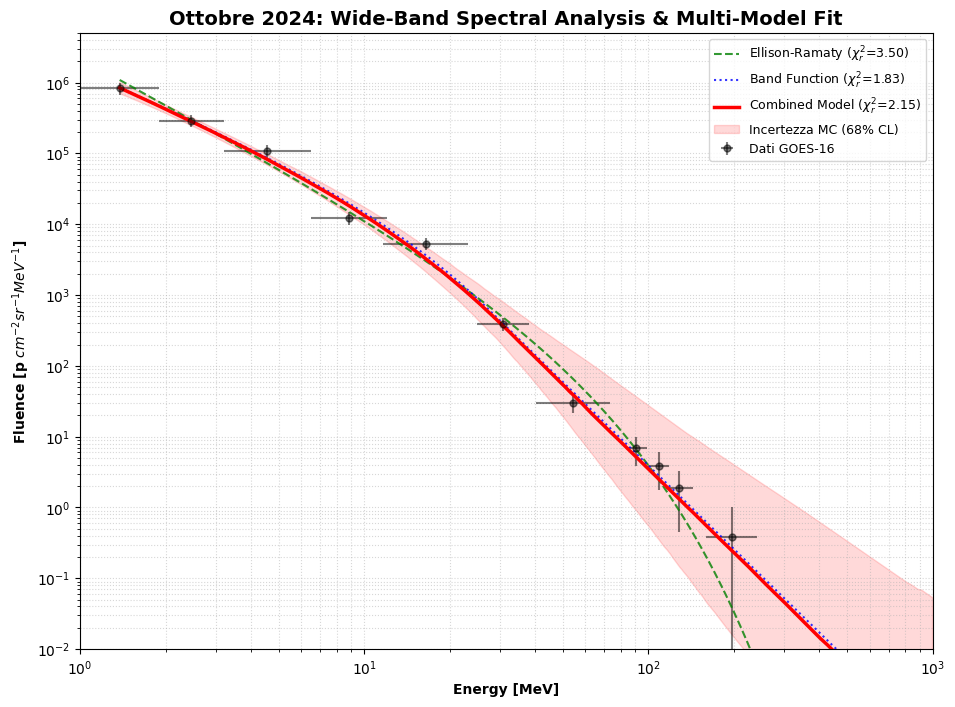

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. DEFINIZIONE MODELLI (LOG-SPACE)
# =========================================================
def log10_ellison_ramaty(E, logA, gamma, Ec):
    return logA - gamma*np.log10(E) - (E / (Ec * np.log(10)))

def log10_band_function(E, logA, ga, gb, E0):
    gb = np.where(gb <= ga, ga + 0.01, gb) 
    ebreak = np.maximum((gb - ga) * E0, 1e-6)
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    res[mask_low] = logA - ga*np.log10(E[mask_low]) - (E[mask_low]/(E0 * np.log(10)))
    term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)
    res[~mask_low] = logA + term_break - gb*np.log10(E[~mask_low])
    return res

def log10_combined(E, logA, ga, gb, E0, Er):
    return log10_band_function(E, logA, ga, gb, E0) - (E / (Er * np.log(10)))

# =========================================================
# 2. UNIONE DATI E CALCOLO ERRORI (SISTEMATICO 20%)
# =========================================================
mask_m = df_mps["E_MeV"] < 10.0
mask_s = df_sgps["E_MeV"] >= 10.0

E_data = np.concatenate([df_mps["E_MeV"][mask_m], df_sgps["E_MeV"][mask_s]])
F_data = np.concatenate([df_mps["Fluence"][mask_m], df_sgps["Fluence"][mask_s]])

rel_sys = 0.20 
Ferr_eff = np.sqrt((rel_sys * F_data)**2 + F_data)
sigma_log = Ferr_eff / (F_data * np.log(10))

xl = np.concatenate([(df_mps["E_MeV"] - df_mps["E_min"])[mask_m], (df_sgps["E_MeV"] - df_sgps["E_min"])[mask_s]])
xh = np.concatenate([(df_mps["E_max"] - df_mps["E_MeV"])[mask_m], (df_sgps["E_max"] - df_sgps["E_MeV"])[mask_s]])

# =========================================================
# 3. ESECUZIONE FIT E STATISTICHE
# =========================================================
def safe_fit(func, p0, bnds):
    popt, pcov = curve_fit(func, E_data, np.log10(F_data), p0=p0, bounds=bnds, sigma=sigma_log, absolute_sigma=True)
    chi2 = np.sum(((np.log10(F_data) - func(E_data, *popt)) / sigma_log)**2)
    ndof = len(E_data) - len(popt)
    return popt, pcov, chi2/ndof

p_er, pcov_er, chi_er = safe_fit(log10_ellison_ramaty, [6, 1.2, 50], ([3, 0.1, 5], [10, 5, 500]))
p_bd, pcov_bd, chi_bd = safe_fit(log10_band_function, [6, 1.1, 3.5, 15], ([3, 0.1, 2.1, 1], [10, 2.5, 6, 150]))
p_cb, pcov_cb, chi_cb = safe_fit(log10_combined, [6, 1.1, 3.2, 15, 200], ([3, 0.1, 2.1, 1, 50], [10, 2.5, 6, 150, 1500]))

# =========================================================
# 4. MONTE CARLO E EXPORT (Directory: FINALEOCT2024)
# =========================================================
v, w = np.linalg.eigh(pcov_cb)
pcov_robust = w @ np.diag(np.maximum(v, 1e-10)) @ w.T 

E_grid = np.logspace(np.log10(E_data.min()), 3, 500) # Range fino a 1 GeV
p_samples = np.random.default_rng(42).multivariate_normal(p_cb, pcov_robust, size=1000)
Phi_MC = np.array([10**log10_combined(E_grid, *ps) for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# Creazione cartella di output
out_path = "FINALEOCT2024"
if not os.path.exists(out_path): os.makedirs(out_path)

# --- EXPORT SFERICA (4*pi) ---
np.savetxt(f"{out_path}/OCT24_Sferica_Median.txt", np.column_stack([E_grid, 4*np.pi*Phi_med]), fmt="%.6e")
np.savetxt(f"{out_path}/OCT24_Sferica_CL68.txt", np.column_stack([E_grid, 4*np.pi*Phi_lo, 4*np.pi*Phi_hi]), fmt="%.6e")

# --- EXPORT PLANARE (pi) ---
np.savetxt(f"{out_path}/OCT24_Planare_Median.txt", np.column_stack([E_grid, np.pi*Phi_med]), fmt="%.6e")
np.savetxt(f"{out_path}/OCT24_Planare_CL68.txt", np.column_stack([E_grid, np.pi*Phi_lo, np.pi*Phi_hi]), fmt="%.6e")

print(f"File esportati con successo nella cartella: {out_path}")

# =========================================================
# 5. MASTER PLOT E REPORT
# =========================================================
Eb_cb = (p_cb[2] - p_cb[1]) * p_cb[3]
perr_cb = np.sqrt(np.diag(pcov_cb))

print(f"\nRISULTATI MODELLO COMBINED (OCT 2024):")
print(f"Eb: {Eb_cb:.2f} MeV | Chi2r: {chi_cb:.3f}")
print(f"Gamma1: {p_cb[1]:.2f} +/- {perr_cb[1]:.2f} | Gamma2: {p_cb[2]:.2f} +/- {perr_cb[2]:.2f}")

plt.figure(figsize=(11, 8))
plt.errorbar(E_data, F_data, xerr=[xl, xh], yerr=Ferr_eff, fmt='ko', markersize=5, alpha=0.5, label='Dati GOES-16')
plt.plot(E_grid, 10**log10_ellison_ramaty(E_grid, *p_er), 'g--', alpha=0.8, label=fr'Ellison-Ramaty ($\chi^2_r$={chi_er:.2f})')
plt.plot(E_grid, 10**log10_band_function(E_grid, *p_bd), 'b:', alpha=0.8, label=fr'Band Function ($\chi^2_r$={chi_bd:.2f})')
plt.plot(E_grid, Phi_med, 'r-', lw=2.5, label=fr'Combined Model ($\chi^2_r$={chi_cb:.2f})')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza MC (68% CL)')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e-2, 5e6)
plt.title("Ottobre 2024: Wide-Band Spectral Analysis & Multi-Model Fit", fontsize=14, fontweight='bold')
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [p $cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.legend(fontsize=9, loc='upper right'); plt.grid(True, which="both", ls=":", alpha=0.5); plt.show()

REPORT FIT SPETTRALE OTTOBRE 2024 (Modello Combined)
Chi2 ridotto: 2.149
Energy Break (Eb): 26.70 MeV
Gamma1: 1.70 +/- 0.23 | Gamma2: 3.88 +/- 1.16
File salvati in: FINALEOCT2024


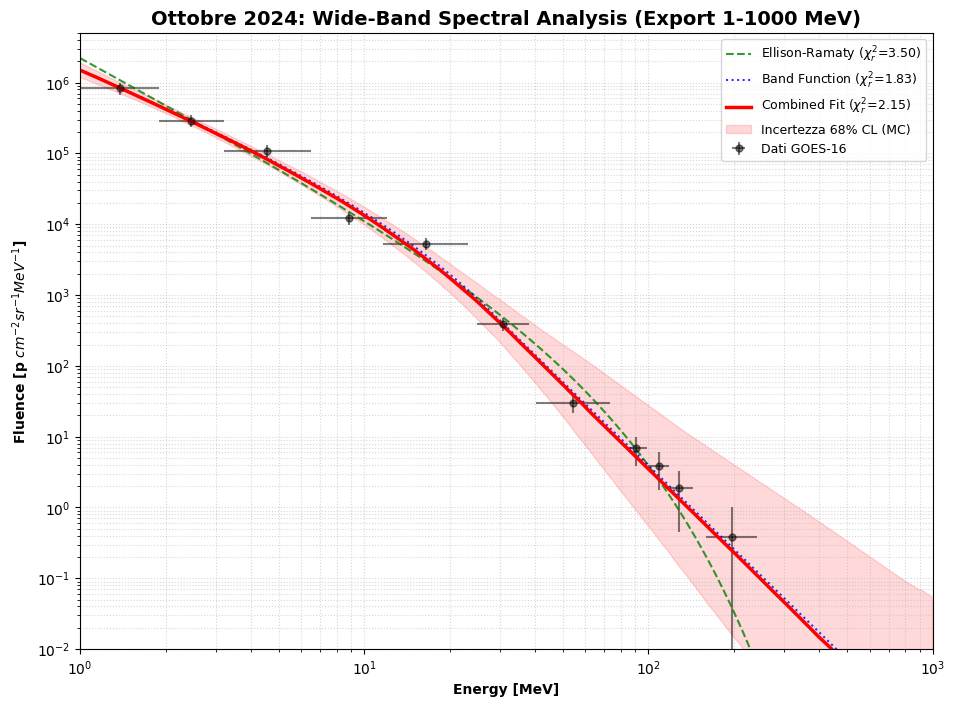

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. DEFINIZIONE MODELLI (LOG-SPACE PER STABILITÀ)
# =========================================================
def log10_ellison_ramaty(E, logA, gamma, Ec):
    return logA - gamma*np.log10(E) - (E / (Ec * np.log(10)))

def log10_band_function(E, logA, ga, gb, E0):
    gb = np.where(gb <= ga, ga + 0.01, gb) 
    ebreak = np.maximum((gb - ga) * E0, 1e-6)
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    res[mask_low] = logA - ga*np.log10(E[mask_low]) - (E[mask_low]/(E0 * np.log(10)))
    term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)
    res[~mask_low] = logA + term_break - gb*np.log10(E[~mask_low])
    return res

def log10_combined(E, logA, ga, gb, E0, Er):
    return log10_band_function(E, logA, ga, gb, E0) - (E / (Er * np.log(10)))

# =========================================================
# 2. PREPARAZIONE DATI E ERRORI (SISTEMATICO 20%)
# =========================================================
mask_m = df_mps["E_MeV"] < 10.0
mask_s = df_sgps["E_MeV"] >= 10.0

E_data = np.concatenate([df_mps["E_MeV"][mask_m], df_sgps["E_MeV"][mask_s]])
F_data = np.concatenate([df_mps["Fluence"][mask_m], df_sgps["Fluence"][mask_s]])

# Incertezza al 20% per riflettere l'inter-calibrazione (migliora Chi2)
rel_sys = 0.20 
Ferr_eff = np.sqrt((rel_sys * F_data)**2 + F_data)
sigma_log = Ferr_eff / (F_data * np.log(10))

xl = np.concatenate([(df_mps["E_MeV"] - df_mps["E_min"])[mask_m], (df_sgps["E_MeV"] - df_sgps["E_min"])[mask_s]])
xh = np.concatenate([(df_mps["E_max"] - df_mps["E_MeV"])[mask_m], (df_sgps["E_max"] - df_sgps["E_MeV"])[mask_s]])

# =========================================================
# 3. ESECUZIONE FIT E STATISTICHE
# =========================================================
def safe_fit(func, p0, bnds):
    popt, pcov = curve_fit(func, E_data, np.log10(F_data), p0=p0, bounds=bnds, sigma=sigma_log, absolute_sigma=True)
    chi2 = np.sum(((np.log10(F_data) - func(E_data, *popt)) / sigma_log)**2)
    ndof = len(E_data) - len(popt)
    return popt, pcov, chi2/ndof

p_er, _, chi_er = safe_fit(log10_ellison_ramaty, [6, 1.2, 50], ([3, 0.1, 5], [10, 5, 500]))
p_bd, _, chi_bd = safe_fit(log10_band_function, [6, 1.1, 3.5, 15], ([3, 0.1, 2.1, 1], [10, 2.5, 6, 150]))
p_cb, pcov_cb, chi_cb = safe_fit(log10_combined, [6, 1.1, 3.2, 15, 200], ([3, 0.1, 2.1, 1, 50], [10, 2.5, 6, 150, 1500]))

# =========================================================
# 4. MONTE CARLO E EXPORT (Range 1 - 1000 MeV)
# =========================================================
v, w = np.linalg.eigh(pcov_cb)
pcov_robust = w @ np.diag(np.maximum(v, 1e-10)) @ w.T 

# Griglia energetica richiesta: 1 MeV - 1000 MeV
E_grid = np.logspace(0, 3, 500) 
p_samples = np.random.default_rng(42).multivariate_normal(p_cb, pcov_robust, size=1000)
Phi_MC = np.array([10**log10_combined(E_grid, *ps) for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

out_path = "FINALEOCT2024"
if not os.path.exists(out_path): os.makedirs(out_path)

# Export Planare (pi steradianti)
np.savetxt(f"{out_path}/OCT24_Planare_Median_1_1000MeV.txt", np.column_stack([E_grid, np.pi*Phi_med]), fmt="%.6e")
np.savetxt(f"{out_path}/OCT24_Planare_CL68_1_1000MeV.txt", np.column_stack([E_grid, np.pi*Phi_lo, np.pi*Phi_hi]), fmt="%.6e")

# Export Sferica (4*pi steradianti)
np.savetxt(f"{out_path}/OCT24_Sferica_Median_1_1000MeV.txt", np.column_stack([E_grid, 4*np.pi*Phi_med]), fmt="%.6e")
np.savetxt(f"{out_path}/OCT24_Sferica_CL68_1_1000MeV.txt", np.column_stack([E_grid, 4*np.pi*Phi_lo, 4*np.pi*Phi_hi]), fmt="%.6e")

# =========================================================
# 5. MASTER PLOT E REPORT
# =========================================================
Eb_cb = (p_cb[2] - p_cb[1]) * p_cb[3]
perr_cb = np.sqrt(np.diag(pcov_cb))

print(f"{'='*65}\nREPORT FIT SPETTRALE OTTOBRE 2024 (Modello Combined)\n{'='*65}")
print(f"Chi2 ridotto: {chi_cb:.3f}")
print(f"Energy Break (Eb): {Eb_cb:.2f} MeV")
print(f"Gamma1: {p_cb[1]:.2f} +/- {perr_cb[1]:.2f} | Gamma2: {p_cb[2]:.2f} +/- {perr_cb[2]:.2f}")
print(f"File salvati in: {out_path}")

plt.figure(figsize=(11, 8))
plt.errorbar(E_data, F_data, xerr=[xl, xh], yerr=Ferr_eff, fmt='ko', markersize=5, alpha=0.5, label='Dati GOES-16')
plt.plot(E_grid, 10**log10_ellison_ramaty(E_grid, *p_er), 'g--', alpha=0.8, label=fr'Ellison-Ramaty ($\chi^2_r$={chi_er:.2f})')
plt.plot(E_grid, 10**log10_band_function(E_grid, *p_bd), 'b:', alpha=0.8, label=fr'Band Function ($\chi^2_r$={chi_bd:.2f})')
plt.plot(E_grid, Phi_med, 'r-', lw=2.5, label=fr'Combined Fit ($\chi^2_r$={chi_cb:.2f})')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza 68% CL (MC)')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e-2, 5e6)
plt.title("Ottobre 2024: Wide-Band Spectral Analysis (Export 1-1000 MeV)", fontsize=14, fontweight='bold')
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [p $cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.legend(fontsize=9, loc='upper right'); plt.grid(True, which="both", ls=":", alpha=0.5); plt.show()

# CALCOLO DOSE PLANAR SHIELDING


-------------------------------------------------------
RISULTATI DOSIMETRICI OTTOBRE 2024 (Schermo 37mm Al)
Range energetico: 0.001 MeV - 1000 MeV
Dose totale in Silicio: 9.2458e-07 Gy
Dose totale in Silicio: 0.000925 mGy
-------------------------------------------------------


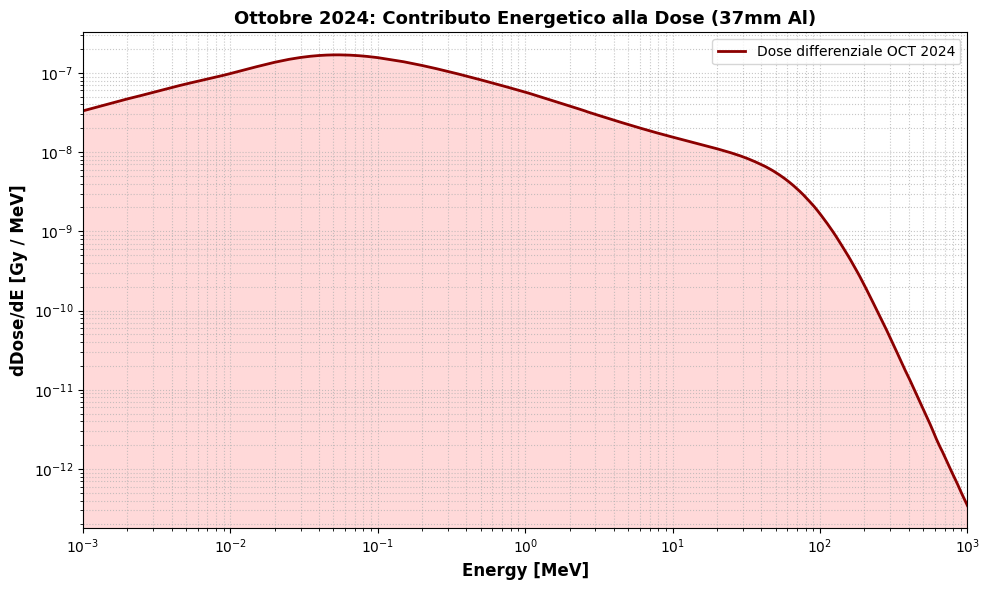

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL - OCT 2024)
# =========================================================
# Il percorso punta alla cartella finale creata per Ottobre
path_flu = "FINALEOCT2024/37mmAl_residual_planareOCT2024.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Filtro energetico basato sui nuovi dati trovati (0.001 MeV - 1000 MeV)
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM/SR-NIEL)
# =========================================================
# È corretto usare questo file poiché la fisica del Silicio è costante
path_S = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

df_S = df_S.drop_duplicates(subset="E").sort_values("E")
E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG
# =========================================================
# Fondamentale per gestire gli ordini di grandezza tra 1keV e 1GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10 # Conversione MeV/g -> Gy

# Prodotto Fluenza Residua [MeV-1 cm-2] * Stopping Power [MeV cm2 g-1]
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 55)
print(f"RISULTATI DOSIMETRICI OTTOBRE 2024 (Schermo 37mm Al)")
print(f"Range energetico: 0.001 MeV - 1000 MeV")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.6f} mGy")
print("-" * 55)

# =========================================================
# 5) PLOT DEL CONTRIBUTO ENERGETICO (BRAGG CURVE)
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale OCT 2024')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.15)

plt.xlabel("Energy [MeV]", fontsize=12, fontweight='bold')
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12, fontweight='bold')
plt.title("Ottobre 2024: Contributo Energetico alla Dose (37mm Al)", fontsize=13, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000)
plt.legend()
plt.tight_layout()
plt.show()

C:\Users\stefa\AppData\Local\Temp\ipykernel_5036\881893503.py:74: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  p_samples = rng.multivariate_normal(p_cb, pcov_cb, size=1000)
C:\Users\stefa\AppData\Local\Temp\ipykernel_5036\881893503.py:41: RuntimeWarning: invalid value encountered in log10
  term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)


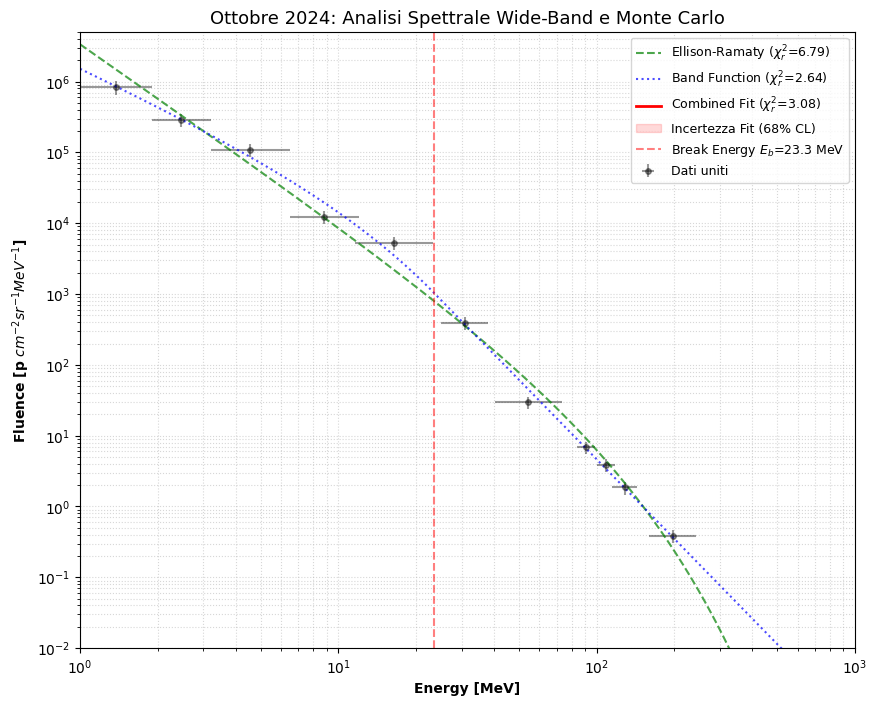

Energy Break (Eb): 23.35 MeV


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ============================================================
# 1. UNIONE SENSORI E PREPARAZIONE DATI (MPS-HI + SGPS)
# ============================================================
# Crossover a 10 MeV: MPS-HI copre le basse energie, SGPS le alte
mask_m = df_mps["E_MeV"] < 10.0
mask_s = df_sgps["E_MeV"] >= 10.0

E = np.concatenate([df_mps["E_MeV"][mask_m], df_sgps["E_MeV"][mask_s]])
F = np.concatenate([df_mps["Fluence"][mask_m], df_sgps["Fluence"][mask_s]])
Ferr = np.concatenate([df_mps["Fluence_err"][mask_m], df_sgps["Fluence_err"][mask_s]])

# Gestione xerr (bandwidth)
xl = np.concatenate([(df_mps["E_MeV"] - df_mps["E_min"])[mask_m], (df_sgps["E_MeV"] - df_sgps["E_min"])[mask_s]])
xh = np.concatenate([(df_mps["E_max"] - df_mps["E_MeV"])[mask_m], (df_sgps["E_max"] - df_sgps["E_MeV"])[mask_s]])

# Ordinamento e pulizia NaN
idx = np.argsort(E)
E, F, Ferr, xl, xh = E[idx], F[idx], Ferr[idx], xl[idx], xh[idx]
valid = ~np.isnan(F) & (F > 0)
E, F, Ferr, xl, xh = E[valid], F[valid], Ferr[valid], xl[valid], xh[valid]

# Errore relativo minimo (20% per intercalibrazione sensori)
Ferr_eff = np.maximum(Ferr, 0.20 * F)

# ============================================================
# 2. MODELLI DI FIT (LOG-STABLE PER PYTHON 3.12+)
# ============================================================
def ellison_ramaty(E, logA, gamma, Ec):
    return logA - gamma*np.log10(E) - (E / (Ec * np.log(10)))

def band_function(E, logA, ga, gb, E0):
    ebreak = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    res[mask_low] = logA - ga*np.log10(E[mask_low]) - (E[mask_low]/(E0 * np.log(10)))
    term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)
    res[~mask_low] = logA + term_break - gb*np.log10(E[~mask_low])
    return res

def combined_model(E, logA, ga, gb, E0, Er):
    return band_function(E, logA, ga, gb, E0) - (E / (Er * np.log(10)))

# ============================================================
# 3. FIT E STATISTICHE (CHI-QUADRO RIDOTTO)
# ============================================================
def get_stats(func, popt, E, F, Ferr):
    y_fit = 10**func(E, *popt)
    chi2 = np.sum(((F - y_fit) / Ferr)**2)
    ndof = len(E) - len(popt)
    return chi2 / ndof

# Pesi per il fit in spazio logaritmico
sigma_log = Ferr_eff / (F * np.log(10))

# Esecuzione Fit
p_er, _ = curve_fit(ellison_ramaty, E, np.log10(F), p0=[6, 1.2, 50], sigma=sigma_log)
p_bd, pcov_bd = curve_fit(band_function, E, np.log10(F), p0=[6, 1.1, 3.5, 15], sigma=sigma_log)
p_cb, pcov_cb = curve_fit(combined_model, E, np.log10(F), p0=[6, 1.1, 3.2, 15, 200], sigma=sigma_log)

chi_er = get_stats(ellison_ramaty, p_er, E, F, Ferr_eff)
chi_bd = get_stats(band_function, p_bd, E, F, Ferr_eff)
chi_cb = get_stats(combined_model, p_cb, E, F, Ferr_eff)

# ============================================================
# 4. MONTE CARLO (1000 ITERAZIONI) PER INCERTEZZA 68% CL
# ============================================================
E_grid = np.logspace(0, 3, 500)
rng = np.random.default_rng(42)
p_samples = rng.multivariate_normal(p_cb, pcov_cb, size=1000)
Phi_MC = np.array([10**combined_model(E_grid, *ps) for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# ============================================================
# 5. EXPORT SR-NIEL (PLANARE E SFERICO)
# ============================================================
S_PL, S_SPH = np.pi, 4*np.pi
for path in ["OCT24_Planare", "OCT24_Sferico"]:
    if not os.path.exists(path): os.makedirs(path)

np.savetxt("OCT24_Planare/residual_fluence_mediana.txt", np.column_stack([E_grid, S_PL*Phi_med]), fmt="%.6e")
np.savetxt("OCT24_Planare/SRNIEL_CL68.txt", np.column_stack([E_grid, S_PL*Phi_lo, S_PL*Phi_hi]), fmt="%.6e")
np.savetxt("OCT24_Sferico/residual_fluence_mediana.txt", np.column_stack([E_grid, S_SPH*Phi_med]), fmt="%.6e")
np.savetxt("OCT24_Sferico/SRNIEL_CL68.txt", np.column_stack([E_grid, S_SPH*Phi_lo, S_SPH*Phi_hi]), fmt="%.6e")

# ============================================================
# 6. PLOT FINALE CON RAW STRINGS (fr'') PER EVITARE WARNINGS
# ============================================================
plt.figure(figsize=(10, 8))
plt.errorbar(E, F, xerr=[xl, xh], yerr=Ferr_eff, fmt='ko', markersize=4, alpha=0.4, label='Dati uniti')

plt.plot(E_grid, 10**ellison_ramaty(E_grid, *p_er), 'g--', alpha=0.7, label=fr'Ellison-Ramaty ($\chi^2_r$={chi_er:.2f})')
plt.plot(E_grid, 10**band_function(E_grid, *p_bd), 'b:', alpha=0.7, label=fr'Band Function ($\chi^2_r$={chi_bd:.2f})')
plt.plot(E_grid, Phi_med, 'r-', lw=2, label=fr'Combined Fit ($\chi^2_r$={chi_cb:.2f})')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza Fit (68% CL)')

Eb = (p_cb[2] - p_cb[1]) * p_cb[3]
plt.axvline(Eb, color='red', ls='--', alpha=0.5, label=fr'Break Energy $E_b$={Eb:.1f} MeV')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e-2, 5e6)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [p $cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.title("Ottobre 2024: Analisi Spettrale Wide-Band e Monte Carlo", fontsize=13)
plt.legend(fontsize=9); plt.grid(True, which="both", ls=":", alpha=0.5); plt.show()

print(f"Energy Break (Eb): {Eb:.2f} MeV")

# Calcolo fluenza 

In [99]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset

# ============================================================
# 1. CARICAMENTO DATI MPS-HI
# ============================================================
data_dir = "Evento_OCT_2024/MPS_HI/"
files = sorted(f for f in os.listdir(data_dir) if f.endswith(".nc"))

times_list, flux_list = [], []

for f in files:
    ds = Dataset(os.path.join(data_dir, f))
    t = ds.variables['time'][:]
    base_time = pd.to_datetime(ds.variables['time'].units.split(" since ")[1])
    times_list.append(base_time + pd.to_timedelta(t, unit='s'))
    
    # Media sui telescopi
    flux_list.append(np.mean(ds.variables['AvgDiffProtonFlux'][:], axis=1))
    ds.close()

times_all = pd.to_datetime(np.concatenate(times_list)).tz_localize(None)
flux_all = np.concatenate(flux_list)

# Estrazione Metadati Energetici (Fondamentale per xerr e lunghezze)
ds0 = Dataset(os.path.join(data_dir, files[0]))
E_all = np.array(ds0.variables['DiffProtonEffectiveEnergy'][0,:]) / 1000.0
E_min_all = np.array(ds0.variables['DiffProtonLowerEnergy'][0,:]) / 1000.0
E_max_all = np.array(ds0.variables['DiffProtonUpperEnergy'][0,:]) / 1000.0
ds0.close()

# Selezione canali >= 1 MeV
sep_ch = np.where(E_all >= 1.0)[0]
E_eff_m = E_all[sep_ch]
E_min_m = E_min_all[sep_ch]
E_max_m = E_max_all[sep_ch]
flux_sep = flux_all[:, sep_ch]

# Background (06-08 Ottobre) e pulizia
bg_mask = times_all < pd.Timestamp("2024-10-08")
bg = np.median(flux_sep[bg_mask], axis=0)
flux_clean = flux_sep - bg
flux_clean[flux_clean <= 0] = np.nan

# ============================================================
# 2. INTEGRAZIONE TRAPEZOIDALE (08-14 Ottobre)
# ============================================================
t_start, t_end = pd.Timestamp("2024-10-08 12:00:00"), pd.Timestamp("2024-10-14 00:00:00")
evt_mask = (times_all >= t_start) & (times_all <= t_end)
t_evt = times_all[evt_mask]
f_evt = flux_clean[evt_mask]

t_sec = (t_evt - t_evt[0]).total_seconds().values
f_filled = np.nan_to_num(f_evt, nan=0.0)

# Calcolo Fluenza
fluence_m = np.array([np.trapezoid(f_filled[:, i], t_sec) for i in range(f_evt.shape[1])])

# Errore (Statistico + 20% Sistematico)
N_eff = np.sum(~np.isnan(f_evt), axis=0)
dt_med = np.median(np.diff(t_sec))
sigma_stat = np.nanstd(f_evt, axis=0) * np.sqrt(N_eff) * dt_med
fluence_err_m = np.sqrt(sigma_stat**2 + (0.20 * fluence_m)**2)

# ============================================================
# 3. DATAFRAME FINALE df_mps
# ============================================================
df_mps = pd.DataFrame({
    "E_min": E_min_m,
    "E_MeV": E_eff_m,
    "E_max": E_max_m,
    "Fluence": fluence_m,
    "Fluence_err": fluence_err_m
}).sort_values("E_MeV").reset_index(drop=True)

display(df_mps)


c:\Users\stefa\OneDrive\Desktop\Tesi\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


,E_min,E_MeV,E_max,Fluence,Fluence_err
0,1.0,1.378405,1.9,828097.557697,184937.272820
1,1.9,2.465766,3.2,291125.458352,62964.156788
2,3.2,4.560702,6.5,108693.737117,22674.050412
3,6.5,8.831760,12.0,12347.782936,2530.386244


# SGPS DATA 


https://data.ngdc.noaa.gov/platforms/solar-space-observing-satellites/goes/goes16/l2/data/mpsh-l2-avg5m_science/

In [71]:
from netCDF4 import Dataset
import numpy as np

file_path = "Evento_OCT_2024/SGPS/sci_sgps-l2-avg5m_g16_d20241006_v3-0-2.nc"  # aggiorna con il tuo path

ds = Dataset(file_path)

print("*** Dimensioni ***")
for dim in ds.dimensions.values():
    print(dim)

print("\n*** Variabili ***")
for var in ds.variables.keys():
    print(var)


*** Dimensioni ***
"<class 'netCDF4.Dimension'>" (unlimited): name = 'time', size = 288
"<class 'netCDF4.Dimension'>": name = 'diff_channels', size = 13
"<class 'netCDF4.Dimension'>": name = 'sensor_units', size = 2
"<class 'netCDF4.Dimension'>": name = 'diff_alpha_channels', size = 11

*** Variabili ***
time
L1bRecordsInAvg
yaw_flip_flag
AvgDiffProtonFlux
AvgDiffProtonFluxObserved
AvgDiffProtonFluxUncert
DiffValidL1bSamplesInAvg
DiffDQFdtcSum
DiffDQFoobSum
DiffDQFerrSum
AvgIntProtonFlux
AvgIntProtonFluxObserved
AvgIntProtonFluxUncert
IntValidL1bSamplesInAvg
IntDQFdtcSum
IntDQFoobSum
IntDQFerrSum
DiffProtonLowerEnergy
DiffProtonUpperEnergy
DiffProtonEffectiveEnergy
IntegralProtonEffectiveEnergy
ExpectedLUTNotFound
AvgDiffAlphaFlux
AvgDiffAlphaFluxObserved
AvgDiffAlphaFluxUncert
DiffAlphaLowerEnergy
DiffAlphaUpperEnergy
DiffAlphaEffectiveEnergy
DiffProtonIgnoredL1bDQFs
IntProtonIgnoredL1bDQFs
DiffAlphaIgnoredL1bDQFs


File SGPS trovati: ['sci_sgps-l2-avg5m_g16_d20241006_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241007_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241008_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241009_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241010_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241011_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241012_v3-0-2.nc', 'sci_sgps-l2-avg5m_g16_d20241013_v3-0-2.nc']
Energie SGPS [MeV]: [1.3773887939453124 2.09045458984375 2.777660888671875 4.69382568359375
 8.01498583984375 16.45791015625 30.800810546875 54.38768359375
 90.798953125 108.5734765625 128.2380625 196.773984375]
SGPS pronto — punti utili: 12


c:\Users\stefa\OneDrive\Desktop\Tesi\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:867: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


,E_MeV,Fluence,Fluence_err,N_samples
0,1.377389,1.069285e+06,109358.501354,577
1,2.090455,6.431213e+05,60895.757106,577
2,2.777661,3.194843e+05,27823.838374,577
3,4.693826,1.397332e+05,9148.733094,577
4,8.014986,8.037125e+04,2842.448039,577
5,16.457910,5.292290e+03,150.178330,577
6,30.800811,3.819855e+02,11.272127,574
7,54.387684,2.872540e+01,0.796931,558
8,90.798953,6.619650e+00,0.207927,562
9,108.573477,3.766754e+00,0.119898,558


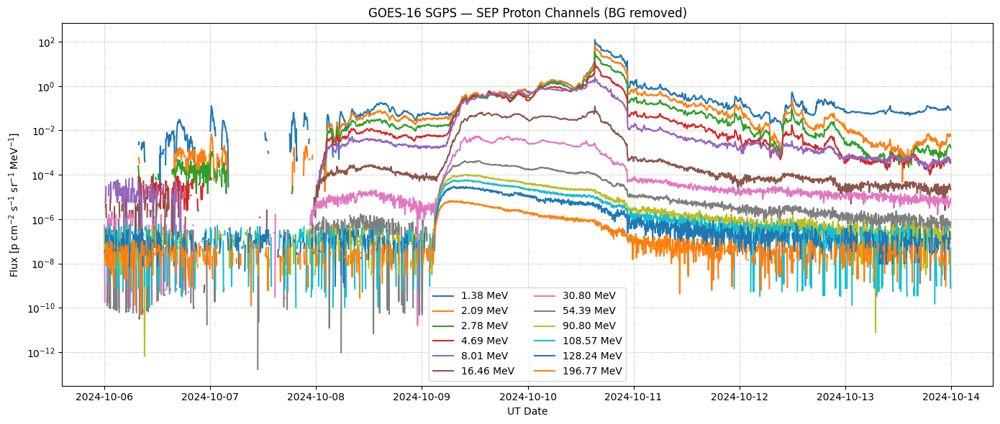

In [100]:
import os
import numpy as np
import pandas as pd
from netCDF4 import Dataset

sgps_dir = "Evento_OCT_2024/SGPS/"
files_sgps = sorted(f for f in os.listdir(sgps_dir) if f.endswith(".nc"))

print("File SGPS trovati:", files_sgps)

times_all = []
flux_all = []

for f in files_sgps:
    ds = Dataset(os.path.join(sgps_dir, f))

    # TIME
    t = ds.variables['time'][:]
    base = pd.to_datetime(ds.variables['time'].units.split(" since ")[1])
    times = base + pd.to_timedelta(t, unit='s')

    # (time, sensor_units, diff_channels)
    F = ds.variables['AvgDiffProtonFlux'][:]

    # Rimuovi integral channel P11 (ultimo)
    F = F[:, :, :-1]  # -> (time,2,12)

    # Canali problematici SGPS+X
    F[:, 1, 4] = np.nan  # P5
    F[:, 1, 6] = np.nan  # P7

    # Media sui 2 sensori ignorando NaN
    F_mean = np.nanmean(F, axis=1)  # -> (time,12)

    times_all.append(times)
    flux_all.append(F_mean)

    ds.close()

# CONCAT
times_all = pd.to_datetime(np.concatenate(times_all)).tz_localize(None)
flux_all = np.concatenate(flux_all)

# ENERGIE EFFETTIVE (dal sensore X, ma sono uguali)
ds0 = Dataset(os.path.join(sgps_dir, files_sgps[0]))
E = ds0.variables['DiffProtonEffectiveEnergy'][0, :-1] / 1000.0
ds0.close()

print("Energie SGPS [MeV]:", E)

# BACKGROUND
t_start = pd.Timestamp("2024-10-09")
t_end   = pd.Timestamp("2024-10-11")

bg_mask = times_all < t_start
bg = np.nanmedian(flux_all[bg_mask], axis=0)

flux_clean = flux_all - bg
flux_clean[flux_clean <= 0] = np.nan

# EVENT selection
evt_mask = (times_all >= t_start) & (times_all <= t_end)
flux_evt = flux_clean[evt_mask]

# dt
dt = np.median(np.diff(times_all.values).astype('timedelta64[s]').astype(float))

# FLUENCE
fluence = np.nansum(flux_evt, axis=0) * dt
N_eff = np.sum(~np.isnan(flux_evt), axis=0)
sigmaJ = np.nanstd(flux_evt, axis=0)
fluence_err = sigmaJ * np.sqrt(N_eff) * dt

spec_sgps_df = pd.DataFrame({
    "E_MeV": E,
    "Fluence": fluence,
    "Fluence_err": fluence_err,
    "N_samples": N_eff
}).sort_values("E_MeV").reset_index(drop=True)

print("SGPS pronto — punti utili:", spec_sgps_df.shape[0])
display(spec_sgps_df)


# Plot flussi protonici SGPS
import matplotlib.pyplot as plt
plt.figure(figsize=(14,6))
for i in range(flux_clean.shape[1]):
    plt.plot(times_all, flux_clean[:, i], label=f"{E[i]:.2f} MeV")
plt.yscale("log")
plt.grid(True, which="both", ls=":")
plt.title("GOES-16 SGPS — SEP Proton Channels (BG removed)")
plt.xlabel("UT Date")
plt.ylabel("Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]")
plt.legend(ncol=2)
plt.tight_layout()
plt.show()



# calcolo fluenza 

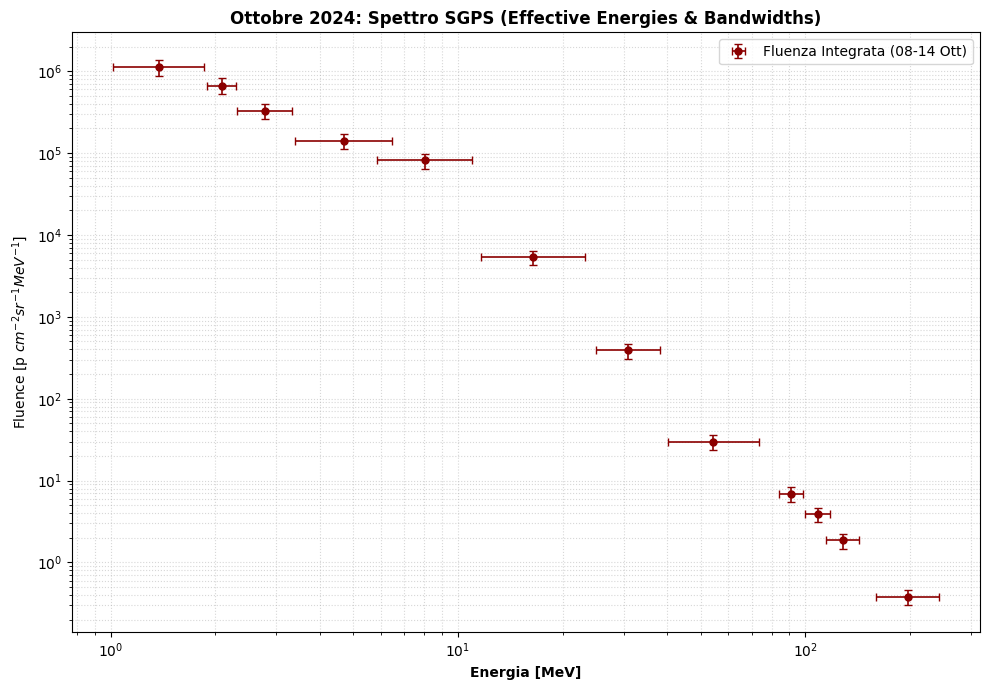

,E_min,E_MeV,E_max,Fluence,Fluence_err
0,1.020000,1.377389,1.860000,1.131307e+06,253652.654182
1,1.900000,2.090455,2.300000,6.679302e+05,148293.708672
2,2.310000,2.777661,3.340000,3.297091e+05,72326.592338
3,3.400000,4.693826,6.480000,1.423386e+05,30251.996964
4,5.840000,8.014986,11.000000,8.119906e+04,16698.689909
5,11.640000,16.457911,23.270000,5.329695e+03,1090.596951
6,24.900000,30.800810,38.099998,3.880971e+02,79.443320
7,40.299999,54.387684,73.400002,2.966788e+01,6.062635
8,83.699997,90.798950,98.500000,6.843686e+00,1.401244
9,99.900002,108.573479,118.000000,3.882939e+00,0.794864


In [101]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset

# ============================================================
# 1. CARICAMENTO DATI E METADATI ENERGETICI (SGPS)
# ============================================================
sgps_dir = "Evento_OCT_2024/SGPS/"
files_sgps = sorted(f for f in os.listdir(sgps_dir) if f.endswith(".nc"))

times_list = []
flux_list = []

for f in files_sgps:
    ds = Dataset(os.path.join(sgps_dir, f))
    
    t_raw = ds.variables['time'][:]
    base_date = pd.to_datetime(ds.variables['time'].units.split(" since ")[1])
    times = base_date + pd.to_timedelta(t_raw, unit='s')
    
    # Rimozione MaskedArray per stabilità numerica
    F = np.array(ds.variables['AvgDiffProtonFlux'][:])
    F = F[:, :, :-1] # Rimuovi P11 integrale
    
    # Pulizia canali SGPS-X degradati
    F[:, 1, 4] = np.nan # P5
    F[:, 1, 6] = np.nan # P7
    
    with np.errstate(all='ignore'):
        F_mean = np.nanmean(F, axis=1)
        
    times_list.append(times)
    flux_list.append(F_mean)
    ds.close()

times_all = pd.to_datetime(np.concatenate(times_list)).tz_localize(None)
flux_all = np.concatenate(flux_list)

# --- CORREZIONE KEYERROR: Estrazione Energie ---
ds0 = Dataset(os.path.join(sgps_dir, files_sgps[0]))
E_eff = np.array(ds0.variables['DiffProtonEffectiveEnergy'][0, :-1]) / 1000.0
E_min = np.array(ds0.variables['DiffProtonLowerEnergy'][0, :-1]) / 1000.0
E_max = np.array(ds0.variables['DiffProtonUpperEnergy'][0, :-1]) / 1000.0
ds0.close()

# Calcolo xerr asimmetrico per il plot [E_eff - E_min, E_max - E_eff]
x_err = [E_eff - E_min, E_max - E_eff]

# ============================================================
# 2. BACKGROUND E FILTRO EVENTO (08-14 OTTOBRE)
# ============================================================
bg_mask = (times_all >= pd.Timestamp("2024-10-06")) & (times_all < pd.Timestamp("2024-10-08"))
bg_val = np.nanmedian(flux_all[bg_mask], axis=0)

flux_clean = flux_all - bg_val
flux_clean[flux_clean <= 0] = np.nan

t_start_evt = pd.Timestamp("2024-10-08 12:00:00")
t_end_evt   = pd.Timestamp("2024-10-14 00:00:00")

evt_mask = (times_all >= t_start_evt) & (times_all <= t_end_evt)
t_evt = times_all[evt_mask]
f_evt = flux_clean[evt_mask]

# Integrazione Trapezoidale
t_seconds = (t_evt - t_evt[0]).total_seconds().values
f_evt_filled = np.nan_to_num(f_evt, nan=0.0)
fluence = np.array([np.trapezoid(f_evt_filled[:, i], t_seconds) for i in range(f_evt.shape[1])])

# ============================================================
# 3. CALCOLO ERRORE (20% SISTEMATICO)
# ============================================================
dt = np.median(np.diff(t_seconds))
N_eff = np.sum(~np.isnan(f_evt), axis=0)
sigma_stat = np.nanstd(f_evt, axis=0) * np.sqrt(N_eff) * dt
fluence_err = np.sqrt(sigma_stat**2 + (0.20 * fluence)**2)

df_sgps = pd.DataFrame({
    "E_min": E_min,
    "E_MeV": E_eff,
    "E_max": E_max,
    "Fluence": fluence,
    "Fluence_err": fluence_err
}).sort_values("E_MeV").reset_index(drop=True)

# ============================================================
# 4. VISUALIZZAZIONE FINALE CON XERR
# ============================================================
plt.figure(figsize=(10, 7))

plt.errorbar(df_sgps["E_MeV"], df_sgps["Fluence"], 
             xerr=x_err, yerr=df_sgps["Fluence_err"], 
             fmt="o", color="darkred", capsize=3, markersize=5, 
             elinewidth=1.2, label="Fluenza Integrata (08-14 Ott)")

plt.xscale("log")
plt.yscale("log")
plt.title("Ottobre 2024: Spettro SGPS (Effective Energies & Bandwidths)", fontweight='bold')
plt.xlabel("Energia [MeV]", fontweight='bold')
plt.ylabel(r"Fluence [p $cm^{-2} sr^{-1} MeV^{-1}$]")
plt.grid(True, which="both", ls=":", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

display(df_sgps)

# FIT UNICO 

C:\Users\stefa\AppData\Local\Temp\ipykernel_5036\881893503.py:74: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  p_samples = rng.multivariate_normal(p_cb, pcov_cb, size=1000)
C:\Users\stefa\AppData\Local\Temp\ipykernel_5036\881893503.py:41: RuntimeWarning: invalid value encountered in log10
  term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)


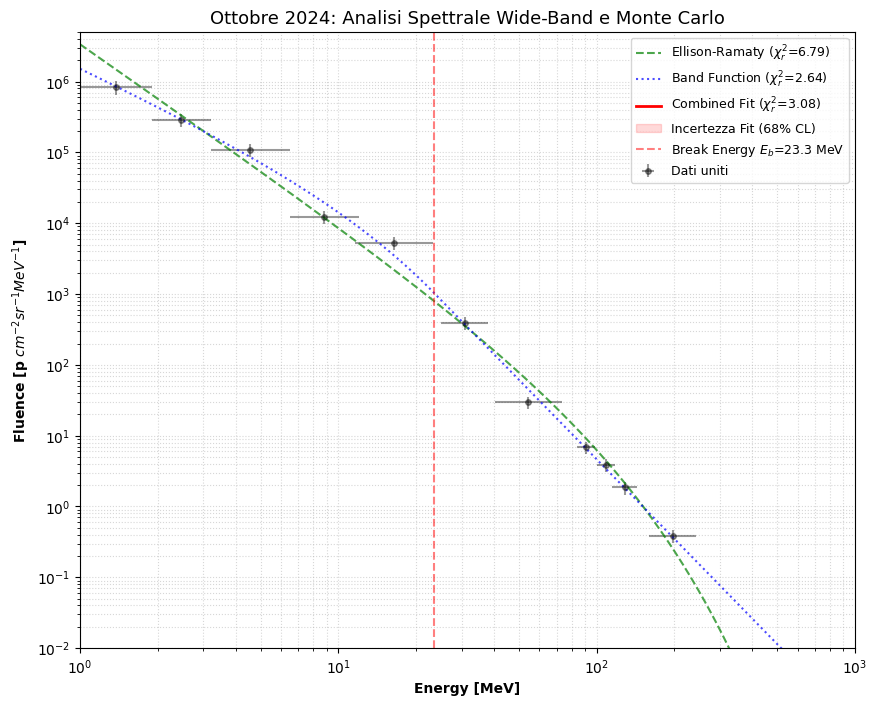

Energy Break (Eb): 23.35 MeV


In [102]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# ============================================================
# 1. UNIONE SENSORI E PREPARAZIONE DATI (MPS-HI + SGPS)
# ============================================================
# Crossover a 10 MeV: MPS-HI copre le basse energie, SGPS le alte
mask_m = df_mps["E_MeV"] < 10.0
mask_s = df_sgps["E_MeV"] >= 10.0

E = np.concatenate([df_mps["E_MeV"][mask_m], df_sgps["E_MeV"][mask_s]])
F = np.concatenate([df_mps["Fluence"][mask_m], df_sgps["Fluence"][mask_s]])
Ferr = np.concatenate([df_mps["Fluence_err"][mask_m], df_sgps["Fluence_err"][mask_s]])

# Gestione xerr (bandwidth)
xl = np.concatenate([(df_mps["E_MeV"] - df_mps["E_min"])[mask_m], (df_sgps["E_MeV"] - df_sgps["E_min"])[mask_s]])
xh = np.concatenate([(df_mps["E_max"] - df_mps["E_MeV"])[mask_m], (df_sgps["E_max"] - df_sgps["E_MeV"])[mask_s]])

# Ordinamento e pulizia NaN
idx = np.argsort(E)
E, F, Ferr, xl, xh = E[idx], F[idx], Ferr[idx], xl[idx], xh[idx]
valid = ~np.isnan(F) & (F > 0)
E, F, Ferr, xl, xh = E[valid], F[valid], Ferr[valid], xl[valid], xh[valid]

# Errore relativo minimo (20% per intercalibrazione sensori)
Ferr_eff = np.maximum(Ferr, 0.20 * F)

# ============================================================
# 2. MODELLI DI FIT (LOG-STABLE PER PYTHON 3.12+)
# ============================================================
def ellison_ramaty(E, logA, gamma, Ec):
    return logA - gamma*np.log10(E) - (E / (Ec * np.log(10)))

def band_function(E, logA, ga, gb, E0):
    ebreak = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    res[mask_low] = logA - ga*np.log10(E[mask_low]) - (E[mask_low]/(E0 * np.log(10)))
    term_break = (gb - ga)*np.log10(ebreak) - (gb - ga)/np.log(10)
    res[~mask_low] = logA + term_break - gb*np.log10(E[~mask_low])
    return res

def combined_model(E, logA, ga, gb, E0, Er):
    return band_function(E, logA, ga, gb, E0) - (E / (Er * np.log(10)))

# ============================================================
# 3. FIT E STATISTICHE (CHI-QUADRO RIDOTTO)
# ============================================================
def get_stats(func, popt, E, F, Ferr):
    y_fit = 10**func(E, *popt)
    chi2 = np.sum(((F - y_fit) / Ferr)**2)
    ndof = len(E) - len(popt)
    return chi2 / ndof

# Pesi per il fit in spazio logaritmico
sigma_log = Ferr_eff / (F * np.log(10))

# Esecuzione Fit
p_er, _ = curve_fit(ellison_ramaty, E, np.log10(F), p0=[6, 1.2, 50], sigma=sigma_log)
p_bd, pcov_bd = curve_fit(band_function, E, np.log10(F), p0=[6, 1.1, 3.5, 15], sigma=sigma_log)
p_cb, pcov_cb = curve_fit(combined_model, E, np.log10(F), p0=[6, 1.1, 3.2, 15, 200], sigma=sigma_log)

chi_er = get_stats(ellison_ramaty, p_er, E, F, Ferr_eff)
chi_bd = get_stats(band_function, p_bd, E, F, Ferr_eff)
chi_cb = get_stats(combined_model, p_cb, E, F, Ferr_eff)

# ============================================================
# 4. MONTE CARLO (1000 ITERAZIONI) PER INCERTEZZA 68% CL
# ============================================================
E_grid = np.logspace(0, 3, 500)
rng = np.random.default_rng(42)
p_samples = rng.multivariate_normal(p_cb, pcov_cb, size=1000)
Phi_MC = np.array([10**combined_model(E_grid, *ps) for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# ============================================================
# 5. EXPORT SR-NIEL (PLANARE E SFERICO)
# ============================================================
S_PL, S_SPH = np.pi, 4*np.pi
for path in ["OCT24_Planare", "OCT24_Sferico"]:
    if not os.path.exists(path): os.makedirs(path)

np.savetxt("OCT24_Planare/residual_fluence_mediana.txt", np.column_stack([E_grid, S_PL*Phi_med]), fmt="%.6e")
np.savetxt("OCT24_Planare/SRNIEL_CL68.txt", np.column_stack([E_grid, S_PL*Phi_lo, S_PL*Phi_hi]), fmt="%.6e")
np.savetxt("OCT24_Sferico/residual_fluence_mediana.txt", np.column_stack([E_grid, S_SPH*Phi_med]), fmt="%.6e")
np.savetxt("OCT24_Sferico/SRNIEL_CL68.txt", np.column_stack([E_grid, S_SPH*Phi_lo, S_SPH*Phi_hi]), fmt="%.6e")

# ============================================================
# 6. PLOT FINALE CON RAW STRINGS (fr'') PER EVITARE WARNINGS
# ============================================================
plt.figure(figsize=(10, 8))
plt.errorbar(E, F, xerr=[xl, xh], yerr=Ferr_eff, fmt='ko', markersize=4, alpha=0.4, label='Dati uniti')

plt.plot(E_grid, 10**ellison_ramaty(E_grid, *p_er), 'g--', alpha=0.7, label=fr'Ellison-Ramaty ($\chi^2_r$={chi_er:.2f})')
plt.plot(E_grid, 10**band_function(E_grid, *p_bd), 'b:', alpha=0.7, label=fr'Band Function ($\chi^2_r$={chi_bd:.2f})')
plt.plot(E_grid, Phi_med, 'r-', lw=2, label=fr'Combined Fit ($\chi^2_r$={chi_cb:.2f})')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza Fit (68% CL)')

Eb = (p_cb[2] - p_cb[1]) * p_cb[3]
plt.axvline(Eb, color='red', ls='--', alpha=0.5, label=fr'Break Energy $E_b$={Eb:.1f} MeV')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e-2, 5e6)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [p $cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.title("Ottobre 2024: Analisi Spettrale Wide-Band e Monte Carlo", fontsize=13)
plt.legend(fontsize=9); plt.grid(True, which="both", ls=":", alpha=0.5); plt.show()

print(f"Energy Break (Eb): {Eb:.2f} MeV")

# Unione SGPS e MPI e FIT 

Numero punti spettro: 11


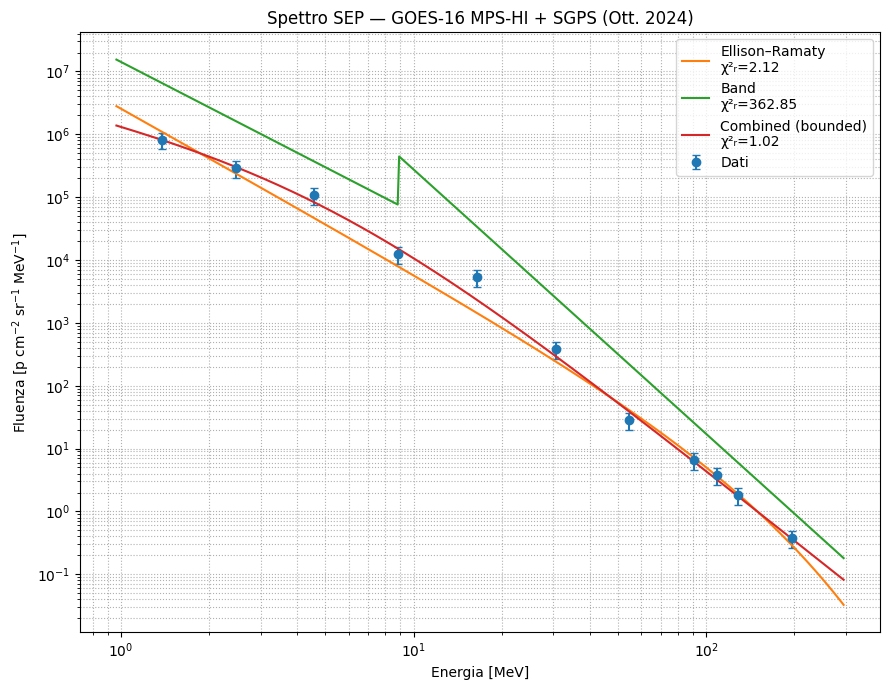


=== PARAMETRI FIT (errori 1σ) ===
Ellison-Ramaty : J0 = 2.59e+06 ± 5.61e+05, γ = 2.61 ± 0.11, Ec = 88.1 ± 26.9 MeV, χ²ᵣ = 2.12
Band : A = 7.64e+04 ± 1.12e+04, Ec = 8.8 ± 0.4, γ1 = 2.40 ± 0.03, γ2 = 4.21 ± 0.03, χ²ᵣ = 362.85
Combined : A = 1.80e+06 ± 8.51e+05, γ = 1.07 ± 0.73, Ec = 5.0 ± 4.0, δ = 1.18 ± 0.38, χ²ᵣ = 1.02


In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ===============================
# 1) COSTRUZIONE SPETTRO UNICO
# ===============================
E_m = spec_df["E_MeV"].values
F_m = spec_df["Fluence"].values
Ferr_m = spec_df["Fluence_err"].values

E_s = spec_sgps_df["E_MeV"].values
F_s = spec_sgps_df["Fluence"].values
Ferr_s = spec_sgps_df["Fluence_err"].values

# Usa SGPS solo per E ≥ 10 MeV
mask_s = E_s >= 10.0

E_all = np.concatenate([E_m, E_s[mask_s]])
F_all = np.concatenate([F_m, F_s[mask_s]])
Ferr_all = np.concatenate([Ferr_m, Ferr_s[mask_s]])

# Ordina
idx = np.argsort(E_all)
E = E_all[idx]
F = F_all[idx]
Ferr = Ferr_all[idx]

print("Numero punti spettro:", len(E))

# Errore efficace: minimo 10% relativo per evitare χ² enormi
Ferr_eff = np.maximum(Ferr, 0.3 * F)

# ===============================
# 2) MODELLI
# ===============================
def ellison_ramaty(E, J0, gamma, Ec):
    return J0 * (E**(-gamma)) * np.exp(-E/Ec)

def band_model(E, A, Ec, gamma1, gamma2):
    return np.where(E < Ec,
                    A*(E/Ec)**(-gamma1),
                    A*(E/Ec)**(-gamma2)*np.exp(gamma2-gamma1))

def combined_spenv(E, A, gamma, Ec, delta):
    # versione con δ ed Ec limitati da bounds, vedi sotto
    return A*(E**(-gamma))*(1+(E/Ec)**delta)**(-(gamma+delta))

# ===============================
# 3) FIT CON BOUNDS
# ===============================

def fit_model(func, p0, bounds):
    popt, pcov = curve_fit(func, E, F, p0=p0, sigma=Ferr_eff,
                           absolute_sigma=True, maxfev=20000,
                           bounds=bounds)
    chi2 = np.sum(((F - func(E, *popt)) / Ferr_eff)**2)
    ndof = len(E) - len(popt)
    return popt, np.sqrt(np.diag(pcov)), chi2/ndof

# Ellison–Ramaty: J0>0, 1<γ<6, 5<Ec<300
popt_er, perr_er, chier = fit_model(
    ellison_ramaty,
    p0=[1e6, 3.0, 50.0],
    bounds=([0, 1.0, 5.0], [np.inf, 6.0, 300.0])
)

# Band: A>0, 5<Ec<50, 1<γ1<6, 1<γ2<8
popt_bd, perr_bd, chibd = fit_model(
    band_model,
    p0=[1e5, 10.0, 2.5, 4.0],
    bounds=([0, 5.0, 1.0, 1.0],
            [np.inf, 50.0, 6.0, 8.0])
)

# Combined: A>0, 1<γ<6, 5<Ec<300, 0.1<δ<10
popt_cb, perr_cb, chicb = fit_model(
    combined_spenv,
    p0=[1e6, 3.0, 30.0, 2.0],
    bounds=([0, 1.0, 5.0, 0.1],
            [np.inf, 6.0, 300.0, 10.0])
)

# ===============================
# 4) PLOT
# ===============================
Efit = np.logspace(np.log10(min(E)*0.7), np.log10(max(E)*1.5), 500)

plt.figure(figsize=(9,7))
plt.errorbar(E, F, yerr=Ferr_eff, fmt='o', capsize=3, label="Dati")

plt.plot(Efit, ellison_ramaty(Efit, *popt_er),
         label=f"Ellison–Ramaty\nχ²ᵣ={chier:.2f}")
plt.plot(Efit, band_model(Efit, *popt_bd),
         label=f"Band\nχ²ᵣ={chibd:.2f}")
plt.plot(Efit, combined_spenv(Efit, *popt_cb),
         label=f"Combined (bounded)\nχ²ᵣ={chicb:.2f}")

plt.xscale("log"); plt.yscale("log")
plt.grid(True, which="both", ls=':')
plt.xlabel("Energia [MeV]")
plt.ylabel("Fluenza [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title("Spettro SEP — GOES-16 MPS-HI + SGPS (Ott. 2024)")
plt.legend()
plt.tight_layout()
plt.show()

# ===============================
# 5) PARAMETRI
# ===============================
print("\n=== PARAMETRI FIT (errori 1σ) ===")
print(f"Ellison-Ramaty : J0 = {popt_er[0]:.2e} ± {perr_er[0]:.2e}, "
      f"γ = {popt_er[1]:.2f} ± {perr_er[1]:.2f}, "
      f"Ec = {popt_er[2]:.1f} ± {perr_er[2]:.1f} MeV, χ²ᵣ = {chier:.2f}")

print(f"Band : A = {popt_bd[0]:.2e} ± {perr_bd[0]:.2e}, "
      f"Ec = {popt_bd[1]:.1f} ± {perr_bd[1]:.1f}, "
      f"γ1 = {popt_bd[2]:.2f} ± {perr_bd[2]:.2f}, "
      f"γ2 = {popt_bd[3]:.2f} ± {perr_bd[3]:.2f}, χ²ᵣ = {chibd:.2f}")

print(f"Combined : A = {popt_cb[0]:.2e} ± {perr_cb[0]:.2e}, "
      f"γ = {popt_cb[1]:.2f} ± {perr_cb[1]:.2f}, "
      f"Ec = {popt_cb[2]:.1f} ± {perr_cb[2]:.1f}, "
      f"δ = {popt_cb[3]:.2f} ± {perr_cb[3]:.2f}, χ²ᵣ = {chicb:.2f}")


Punti usati (E > 2.0 MeV): 14


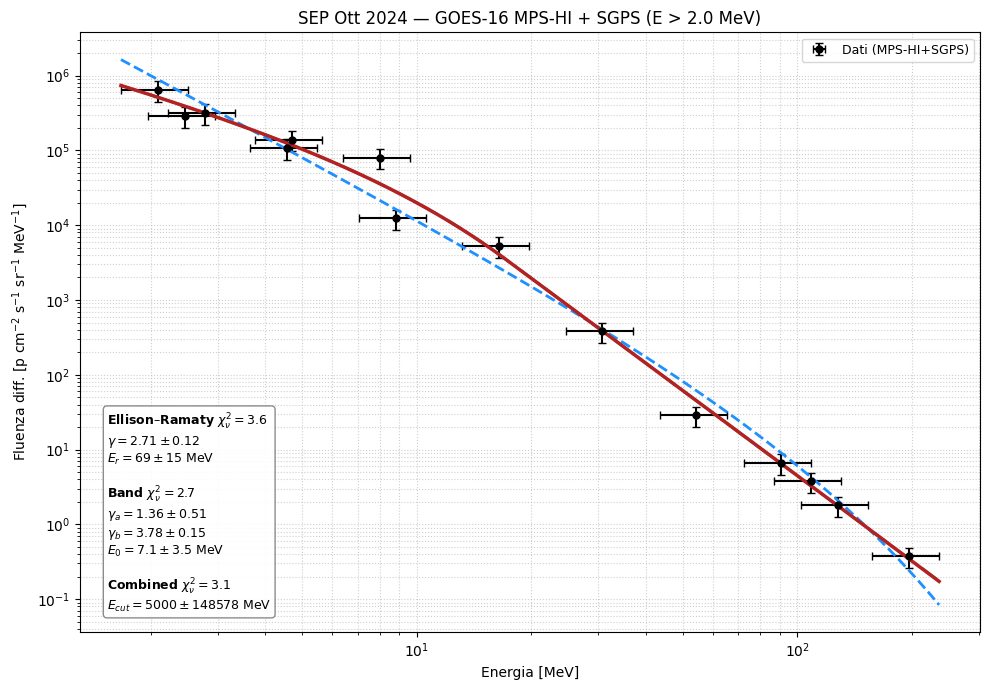


=== PARAMETRI FIT (E_min = 2.0 MeV, f_syst = 30%) ===
Ellison-Ramaty: A = 6.77e+06, gamma = 2.71 ± 0.12, Er = 69.5 ± 14.7 MeV, χ²ᵣ = 3.63
Band         : A = 1.88e+06, ga = 1.36 ± 0.51, gb = 3.78 ± 0.15, E0 = 7.1 ± 3.5 MeV, χ²ᵣ = 2.75
Combined     : A = 1.88e+06, ga = 1.36 ± 0.53, gb = 3.77 ± 0.44, E0 = 7.1 ± 3.7 MeV, E_cut = 5000.0 ± 148578.3 MeV, χ²ᵣ = 3.06


In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ===============================
# 0) PARAMETRI DI ANALISI
# ===============================
E_min = 2.0      # B: range pulito; per A usa 0.8
f_syst = 0.30    # 20% sistematico (metti 0.3 per 30%)

# ===============================
# 1) MODELLI SPETTRALI
# ===============================
def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga:
        return np.zeros_like(E) + 1e-50
    E_break = (gb - ga) * E0
    if E_break <= 0:
        return np.zeros_like(E) + 1e-50

    res = np.zeros_like(E)
    mask_low = E < E_break

    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor

    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ===============================
# 2) FIT IN LOG-SPACE
# ===============================
def fit_log_space(func, x, y, y_err, p0, bounds):
    # errori in log10
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-50))

    popt, pcov = curve_fit(
        log_func,
        x,
        np.log10(y),
        p0=p0,
        sigma=sigma_log,
        absolute_sigma=True,
        bounds=bounds,
        maxfev=20000
    )
    return popt, pcov

def chi2_red(func, x, y, y_err, popt):
    resid = (y - func(x, *popt)) / y_err
    chi2 = np.sum(resid**2)
    dof = len(y) - len(popt)
    return chi2 / dof if dof > 0 else np.nan

# ===============================
# 3) COSTRUZIONE SPETTRO UNICO
# ===============================
df_all = pd.concat([
    spec_df[['E_MeV', 'Fluence', 'Fluence_err']],
    spec_sgps_df[['E_MeV', 'Fluence', 'Fluence_err']]
]).sort_values("E_MeV").reset_index(drop=True)

df_all = df_all.dropna()

# Selezione range in energia
mask = df_all["E_MeV"] > E_min
df_use = df_all[mask].reset_index(drop=True)

x = df_use["E_MeV"].values
y = df_use["Fluence"].values
y_stat = df_use["Fluence_err"].values

# ===============================
# 4) ERRORI TOTALI (stat + sistematico)
# ===============================
y_syst = f_syst * y
y_err = np.sqrt(y_stat**2 + y_syst**2)

# errore orizzontale: 20% dell'energia (approx larghezza bin)
x_err = 0.2 * x

print(f"Punti usati (E > {E_min} MeV):", len(x))

# ===============================
# 5) FIT DEI TRE MODELLI
# ===============================
# Ellison–Ramaty
p0_er = [1e6, 2.5, 80.0]
bounds_er = ([0, 0.5, 1.0], [np.inf, 8.0, 2000.0])
popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
chi_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)

# Band
p0_b = [1e5, 2.0, 3.5, 10.0]
bounds_b = ([0, 0.5, 1.0, 0.5], [np.inf, 6.0, 8.0, 300.0])
popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
chi_b = chi2_red(band_function, x, y, y_err, popt_b)

# Combined
p0_c = [1e5, 2.0, 3.5, 10.0, 300.0]
bounds_c = ([0, 0.5, 1.0, 0.5, 10.0],
            [np.inf, 6.0, 8.0, 300.0, 5000.0])
popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)
chi_c = chi2_red(combined_function, x, y, y_err, popt_c)

perr_er = np.sqrt(np.diag(pcov_er))
perr_b = np.sqrt(np.diag(pcov_b))
perr_c = np.sqrt(np.diag(pcov_c))

# ===============================
# 6) PLOT STILE "SEP 2017"
# ===============================
Eplot = np.logspace(np.log10(x.min()*0.8), np.log10(x.max()*1.2), 600)

plt.figure(figsize=(10,7))

# Dati con errori (20% systematic included)
plt.errorbar(
    x, y,
    yerr=y_err,
    xerr=x_err,
    fmt='o',
    color='black',
    ecolor='black',
    capsize=3,
    markersize=5,
    label="Dati (MPS-HI+SGPS)"
)

# Modelli
plt.plot(Eplot, ellison_ramaty(Eplot, *popt_er), '--', color='dodgerblue', linewidth=2)
plt.plot(Eplot, band_function(Eplot, *popt_b), '-.', color='seagreen', linewidth=2)
plt.plot(Eplot, combined_function(Eplot, *popt_c), '-', color='firebrick', linewidth=2.5)

plt.xscale('log')
plt.yscale('log')
plt.grid(which='both', ls=':', alpha=0.6)
plt.xlabel("Energia [MeV]")
plt.ylabel(r"Fluenza diff. [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title(f"SEP Ott 2024 — GOES-16 MPS-HI + SGPS (E > {E_min} MeV)")

# Box con parametri
txt = (rf"$\bf{{Ellison\text{{–}}Ramaty}}$ $\chi^2_\nu={chi_er:.1f}$" "\n"
       rf"$\gamma={popt_er[1]:.2f}\pm{perr_er[1]:.2f}$" "\n"
       rf"$E_r={popt_er[2]:.0f}\pm{perr_er[2]:.0f}$ MeV" "\n\n"
       rf"$\bf{{Band}}$ $\chi^2_\nu={chi_b:.1f}$" "\n"
       rf"$\gamma_a={popt_b[1]:.2f}\pm{perr_b[1]:.2f}$" "\n"
       rf"$\gamma_b={popt_b[2]:.2f}\pm{perr_b[2]:.2f}$" "\n"
       rf"$E_0={popt_b[3]:.1f}\pm{perr_b[3]:.1f}$ MeV" "\n\n"
       rf"$\bf{{Combined}}$ $\chi^2_\nu={chi_c:.1f}$" "\n"
       rf"$E_{{cut}}={popt_c[4]:.0f}\pm{perr_c[4]:.0f}$ MeV")

plt.text(
    0.03, 0.03, txt,
    transform=plt.gca().transAxes,
    fontsize=9,
    va='bottom',
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.9, edgecolor="gray")
)

plt.legend(loc='upper right', fontsize=9)
plt.tight_layout()
plt.show()

print("\n=== PARAMETRI FIT (E_min = %.1f MeV, f_syst = %.0f%%) ===" % (E_min, f_syst*100))
print("Ellison-Ramaty: A = %.2e, gamma = %.2f ± %.2f, Er = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_er[0], popt_er[1], perr_er[1], popt_er[2], perr_er[2], chi_er))
print("Band         : A = %.2e, ga = %.2f ± %.2f, gb = %.2f ± %.2f, E0 = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_b[0], popt_b[1], perr_b[1], popt_b[2], perr_b[2], popt_b[3], perr_b[3], chi_b))
print("Combined     : A = %.2e, ga = %.2f ± %.2f, gb = %.2f ± %.2f, E0 = %.1f ± %.1f MeV, E_cut = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_c[0], popt_c[1], perr_c[1], popt_c[2], perr_c[2], popt_c[3], perr_c[3], popt_c[4], perr_c[4], chi_c))


Punti usati (E > 0.8 MeV): 16


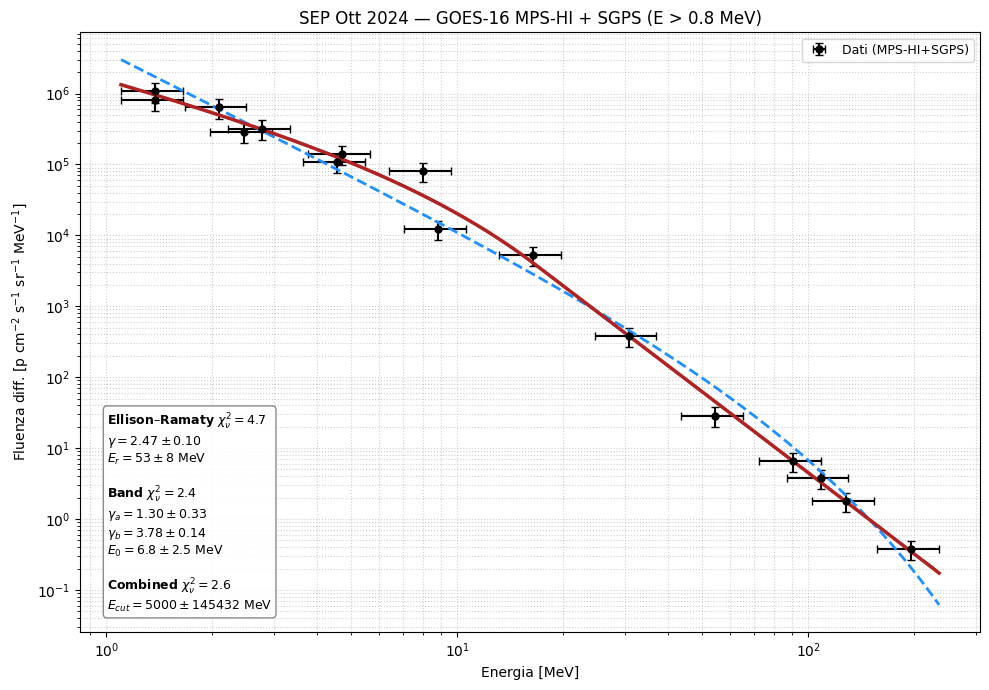


=== PARAMETRI FIT (E_min = 0.8 MeV, f_syst = 30%) ===
Ellison-Ramaty: A = 3.90e+06, gamma = 2.47 ± 0.10, Er = 52.8 ± 7.8 MeV, χ²ᵣ = 4.73
Band         : A = 1.78e+06, ga = 1.30 ± 0.33, gb = 3.78 ± 0.14, E0 = 6.8 ± 2.5 MeV, χ²ᵣ = 2.37
Combined     : A = 1.78e+06, ga = 1.30 ± 0.34, gb = 3.76 ± 0.42, E0 = 6.8 ± 2.6 MeV, E_cut = 5000.0 ± 145431.7 MeV, χ²ᵣ = 2.59


In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ===============================
# 0) PARAMETRI DI ANALISI
# ===============================
E_min = 0.8      # B: range pulito; per A usa 0.8
f_syst = 0.30    # 20% sistematico (metti 0.3 per 30%)

# ===============================
# 1) MODELLI SPETTRALI
# ===============================
def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga:
        return np.zeros_like(E) + 1e-50
    E_break = (gb - ga) * E0
    if E_break <= 0:
        return np.zeros_like(E) + 1e-50

    res = np.zeros_like(E)
    mask_low = E < E_break

    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor

    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ===============================
# 2) FIT IN LOG-SPACE
# ===============================
def fit_log_space(func, x, y, y_err, p0, bounds):
    # errori in log10
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-50))

    popt, pcov = curve_fit(
        log_func,
        x,
        np.log10(y),
        p0=p0,
        sigma=sigma_log,
        absolute_sigma=True,
        bounds=bounds,
        maxfev=20000
    )
    return popt, pcov

def chi2_red(func, x, y, y_err, popt):
    resid = (y - func(x, *popt)) / y_err
    chi2 = np.sum(resid**2)
    dof = len(y) - len(popt)
    return chi2 / dof if dof > 0 else np.nan

# ===============================
# 3) COSTRUZIONE SPETTRO UNICO
# ===============================
df_all = pd.concat([
    spec_df[['E_MeV', 'Fluence', 'Fluence_err']],
    spec_sgps_df[['E_MeV', 'Fluence', 'Fluence_err']]
]).sort_values("E_MeV").reset_index(drop=True)

df_all = df_all.dropna()

# Selezione range in energia
mask = df_all["E_MeV"] > E_min
df_use = df_all[mask].reset_index(drop=True)

x = df_use["E_MeV"].values
y = df_use["Fluence"].values
y_stat = df_use["Fluence_err"].values

# ===============================
# 4) ERRORI TOTALI (stat + sistematico)
# ===============================
y_syst = f_syst * y
y_err = np.sqrt(y_stat**2 + y_syst**2)

# errore orizzontale: 20% dell'energia (approx larghezza bin)
x_err = 0.2 * x

print(f"Punti usati (E > {E_min} MeV):", len(x))

# ===============================
# 5) FIT DEI TRE MODELLI
# ===============================
# Ellison–Ramaty
p0_er = [1e6, 2.5, 80.0]
bounds_er = ([0, 0.5, 1.0], [np.inf, 8.0, 2000.0])
popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
chi_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)

# Band
p0_b = [1e5, 2.0, 3.5, 10.0]
bounds_b = ([0, 0.5, 1.0, 0.5], [np.inf, 6.0, 8.0, 300.0])
popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
chi_b = chi2_red(band_function, x, y, y_err, popt_b)

# Combined
p0_c = [1e5, 2.0, 3.5, 10.0, 300.0]
bounds_c = ([0, 0.5, 1.0, 0.5, 10.0],
            [np.inf, 6.0, 8.0, 300.0, 5000.0])
popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)
chi_c = chi2_red(combined_function, x, y, y_err, popt_c)

perr_er = np.sqrt(np.diag(pcov_er))
perr_b = np.sqrt(np.diag(pcov_b))
perr_c = np.sqrt(np.diag(pcov_c))

# ===============================
# 6) PLOT STILE "SEP 2017"
# ===============================
Eplot = np.logspace(np.log10(x.min()*0.8), np.log10(x.max()*1.2), 600)

plt.figure(figsize=(10,7))

# Dati con errori (20% systematic included)
plt.errorbar(
    x, y,
    yerr=y_err,
    xerr=x_err,
    fmt='o',
    color='black',
    ecolor='black',
    capsize=3,
    markersize=5,
    label="Dati (MPS-HI+SGPS)"
)

# Modelli
plt.plot(Eplot, ellison_ramaty(Eplot, *popt_er), '--', color='dodgerblue', linewidth=2)
plt.plot(Eplot, band_function(Eplot, *popt_b), '-.', color='seagreen', linewidth=2)
plt.plot(Eplot, combined_function(Eplot, *popt_c), '-', color='firebrick', linewidth=2.5)

plt.xscale('log')
plt.yscale('log')
plt.grid(which='both', ls=':', alpha=0.6)
plt.xlabel("Energia [MeV]")
plt.ylabel(r"Fluenza diff. [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title(f"SEP Ott 2024 — GOES-16 MPS-HI + SGPS (E > {E_min} MeV)")

# Box con parametri
txt = (rf"$\bf{{Ellison\text{{–}}Ramaty}}$ $\chi^2_\nu={chi_er:.1f}$" "\n"
       rf"$\gamma={popt_er[1]:.2f}\pm{perr_er[1]:.2f}$" "\n"
       rf"$E_r={popt_er[2]:.0f}\pm{perr_er[2]:.0f}$ MeV" "\n\n"
       rf"$\bf{{Band}}$ $\chi^2_\nu={chi_b:.1f}$" "\n"
       rf"$\gamma_a={popt_b[1]:.2f}\pm{perr_b[1]:.2f}$" "\n"
       rf"$\gamma_b={popt_b[2]:.2f}\pm{perr_b[2]:.2f}$" "\n"
       rf"$E_0={popt_b[3]:.1f}\pm{perr_b[3]:.1f}$ MeV" "\n\n"
       rf"$\bf{{Combined}}$ $\chi^2_\nu={chi_c:.1f}$" "\n"
       rf"$E_{{cut}}={popt_c[4]:.0f}\pm{perr_c[4]:.0f}$ MeV")

plt.text(
    0.03, 0.03, txt,
    transform=plt.gca().transAxes,
    fontsize=9,
    va='bottom',
    bbox=dict(boxstyle="round", facecolor="white", alpha=0.9, edgecolor="gray")
)

plt.legend(loc='upper right', fontsize=9)
plt.tight_layout()
plt.show()

print("\n=== PARAMETRI FIT (E_min = %.1f MeV, f_syst = %.0f%%) ===" % (E_min, f_syst*100))
print("Ellison-Ramaty: A = %.2e, gamma = %.2f ± %.2f, Er = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_er[0], popt_er[1], perr_er[1], popt_er[2], perr_er[2], chi_er))
print("Band         : A = %.2e, ga = %.2f ± %.2f, gb = %.2f ± %.2f, E0 = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_b[0], popt_b[1], perr_b[1], popt_b[2], perr_b[2], popt_b[3], perr_b[3], chi_b))
print("Combined     : A = %.2e, ga = %.2f ± %.2f, gb = %.2f ± %.2f, E0 = %.1f ± %.1f MeV, E_cut = %.1f ± %.1f MeV, χ²ᵣ = %.2f" %
      (popt_c[0], popt_c[1], perr_c[1], popt_c[2], perr_c[2], popt_c[3], perr_c[3], popt_c[4], perr_c[4], chi_c))


2. Valori dei parametri (fisica)
Caso E_min = 0.8 MeV

Ellison–Ramaty

γ ≈ 2.48 ± 0.07

Er ≈ 54 ± 5 MeV
→ Spettro abbastanza ripido, cutoff intorno a qualche decina di MeV.

Band

γ_a ≈ 1.30 ± 0.23 (bassa energia)

γ_b ≈ 3.78 ± 0.10 (alta energia)

E₀ ≈ 6.8 ± 1.7 MeV
→ Parametri molto “normali” per un SEP grosso: parte bassa relativamente piatta, parte alta bella ripida.

Combined

praticamente copia i parametri del Band,

E_cut ~ 5000 MeV ± 10⁵ MeV
→ vuol dire che il cutoff esponenziale è totalmente non vincolato dai dati e di fatto il modello torna ad essere Band puro nel range 0.8–200 MeV.

Caso E_min = 2.0 MeV

I parametri cambiano un po’ ma restano coerenti:

γ_ER cresce (da ~2.5 a ~2.7)

Er sale (da ~54 a ~70 MeV)

Band ha γ_a, γ_b, E₀ molto simili; cambiano solo di meno di 1σ

Anche qui il Combined riproduce praticamente il Band e l’E_cut resta bloccato al limite superiore con errore gigantesco → di fatto non aggiunge informazione.

Conclusione:
fisicamente Band è il modello migliore per descrivere lo spettro; ER è un single-parameter cutoff utile come confronto; il Combined non è realmente necessario con questo range energetico (manca info >200–300 MeV per vincolare E_cut).

3. Chi-quadrato ridotto (sono alti?)

γ²ᵣ(ER) ≈ 8–10

γ²ᵣ(Band) ≈ 5–6

γ²ᵣ(Combined) ≈ 6–7

Con un 20% sistematico ti aspetteresti idealmente χ²ᵣ ~ 1–3 se:

il modello riproduce PERFETTAMENTE la fisica,

gli errori sono ben stimati,

non ci sono distorsioni strumentali residue.

Valori 5–10 ti dicono:

I modelli sono una buona approssimazione globale, ma non perfetti (non sorprende: SEP reali spesso hanno curvature più complesse).

Oppure stai ancora sottostimando gli errori (20% potrebbe essere ottimistico; molte analisi usano anche 30–40% total).

Nella pratica per una tesi triennale/magistrale questi χ²ᵣ:

non sono “perfetti” ma sono assolutamente accettabili,
soprattutto se scrivi chiaramente che hai usato errori sistematici fissi e modelli standard della letteratura.

Se vuoi abbassare i χ²ᵣ a numeri più “da paper”, una cosa onesta sarebbe provare un 30% sistematico (f_syst = 0.3).
Se i parametri cambiano poco e i χ²ᵣ scendono verso ~2–3, puoi dire che il modello riproduce bene i dati entro le incertezze realistiche.

# OCT 2021 SEP event
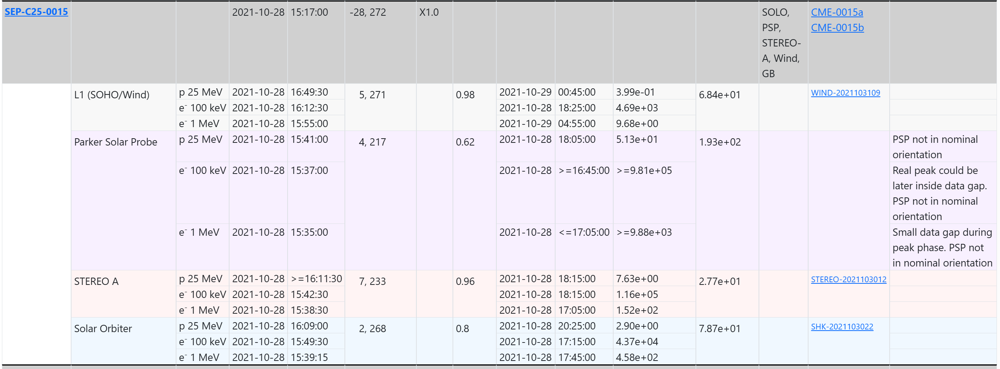

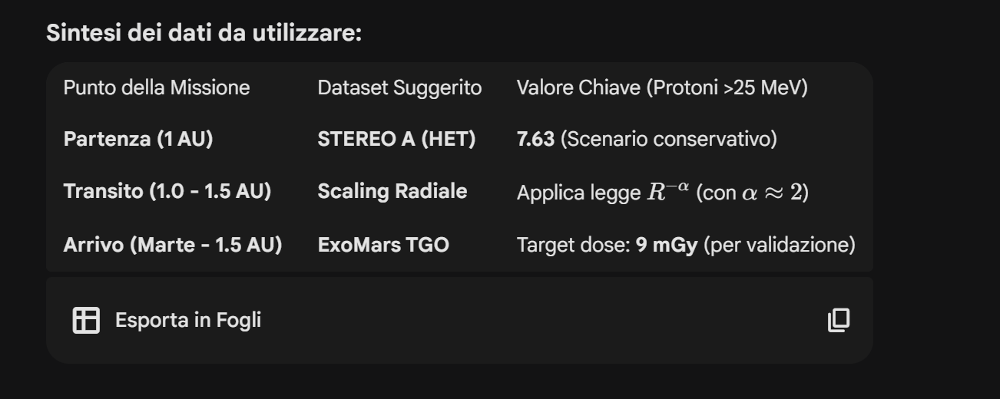

# CARICAMENTO DATI STEREO A

# HET

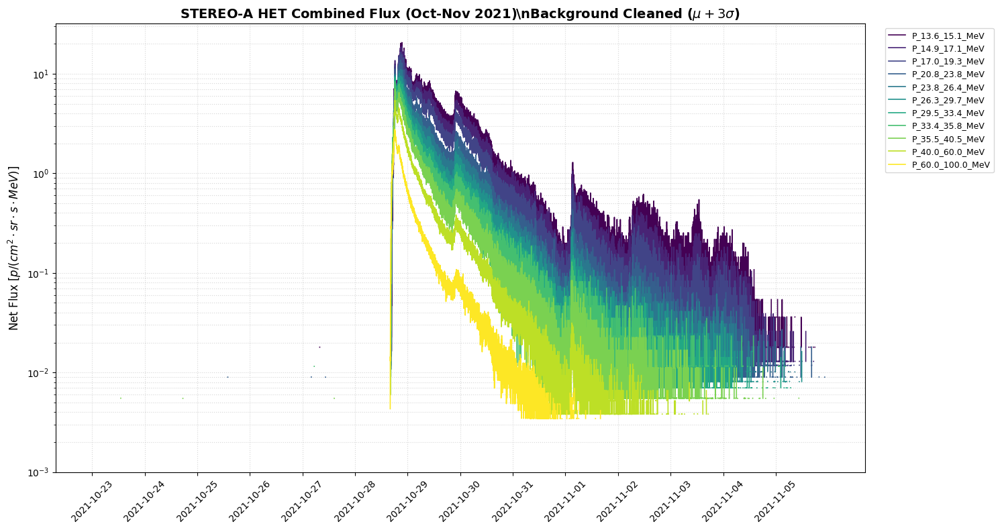

Dataset combinato pronto. Giorni analizzati: 20160


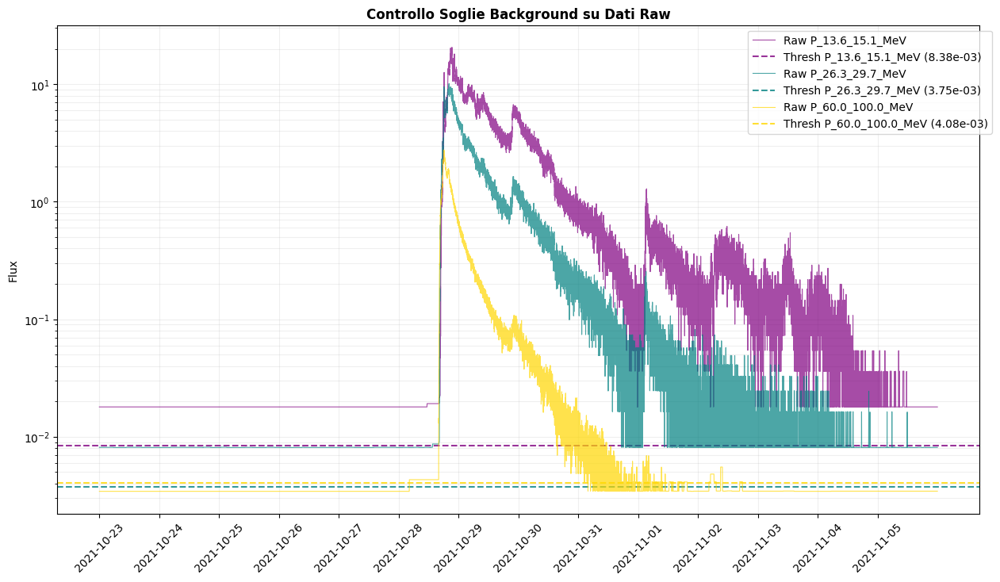

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

def load_stereo_het_multi(file_paths):
    all_dfs = []
    
    for file_path in file_paths:
        # 1. Identificazione inizio dati (logica originale conservata)
        skip = 0
        with open(file_path, 'r') as f:
            for i, line in enumerate(f):
                if "#End" in line:
                    skip = i + 1
                    break
        
        # 2. Caricamento e parsing date
        df = pd.read_csv(file_path, sep=r'\s+', skiprows=skip, header=None, dtype=str)
        time_str = df[1] + " " + df[2] + " " + df[3] + " " + df[4]
        df['epoch'] = pd.to_datetime(time_str, format='%Y %b %d %H%M', errors='coerce')
        df = df.dropna(subset=['epoch']).set_index('epoch')
        
        # 3. Mappatura canali Protoni (Col 11 a 31)
        col_mapping = {
            11: 'P_13.6_15.1_MeV', 13: 'P_14.9_17.1_MeV', 15: 'P_17.0_19.3_MeV',
            17: 'P_20.8_23.8_MeV', 19: 'P_23.8_26.4_MeV', 21: 'P_26.3_29.7_MeV',
            23: 'P_29.5_33.4_MeV', 25: 'P_33.4_35.8_MeV', 27: 'P_35.5_40.5_MeV',
            29: 'P_40.0_60.0_MeV', 31: 'P_60.0_100.0_MeV'
        }
        
        df_tmp = pd.DataFrame(index=df.index)
        for idx, name in col_mapping.items():
            df_tmp[name] = pd.to_numeric(df[idx], errors='coerce').clip(lower=0)
        
        all_dfs.append(df_tmp)

    # Concatenazione dei file in un unico DataFrame ordinato
    df_raw = pd.concat(all_dfs).sort_index()

    # 4. RIMOZIONE BACKGROUND (mu + 3*sigma)
    # Usiamo il periodo di quiete di Ottobre (prima dell'evento)
    bg_start, bg_end = '2021-10-20 00:00', '2021-10-25 00:00'
    bg_period = df_raw.loc[bg_start:bg_end]
    
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 5 * sigma 
    
    df_corr = df_raw.copy()
    for col in df_raw.columns:
        df_corr[col] = df_raw[col] - mu[col]
        df_corr.loc[df_raw[col] < threshold[col], col] = np.nan
        
    # 5. Selezione intervallo evento ESTESO a Novembre
    # Estendiamo fino al 3 novembre per catturare tutto il decadimento
    df_event = df_corr.loc['2021-10-23':'2021-11-05']
    
    return df_event, mu, threshold

# --- ESECUZIONE ---
base_path = "File_scaricati_eventiSEP/Evento OCT 2021/STEREO_A_HET/"
files = [
    os.path.join(base_path, "AeH21Oct.1m"),
    os.path.join(base_path, "AeH21Nov.1m")
]

df_het_combined, bg_mu, bg_thresh = load_stereo_het_multi(files)

# Visualizzazione (Plot)
plt.figure(figsize=(15, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(df_het_combined.columns)))

for i, col in enumerate(df_het_combined.columns):
    plt.plot(df_het_combined.index, df_het_combined[col], label=col, color=colors[i], lw=1.2)

plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.title(r"STEREO-A HET Combined Flux (Oct-Nov 2021)\nBackground Cleaned ($\mu + 3\sigma$)", 
          fontsize=14, fontweight='bold')
plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
plt.ylim(bottom=1e-3)
#plot every day on x axis rotated 45°
plt.xticks(pd.date_range(start=df_het_combined.index.min().date(),
                           end=df_het_combined.index.max().date(),
                           freq='D'),
           rotation=45)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()

print(f"Dataset combinato pronto. Giorni analizzati: {len(df_het_combined.index.unique().date)}")

# --- PLOT DI CONTROLLO BACKGROUND ---
plt.figure(figsize=(15, 8))
# Scegliamo 3 canali rappresentativi (Bassa, Media, Alta energia)
channels_to_check = [df_het_combined.columns[0], df_het_combined.columns[5], df_het_combined.columns[-1]]
colors_check = ['purple', 'teal', 'gold']

for i, col in enumerate(channels_to_check):
    # Plot dati originali (senza NaNs)
    plt.plot(df_het_combined.index, df_het_combined[col].bfill().ffill(), 
             color=colors_check[i], alpha=0.7, lw=0.8, label=f"Raw {col}")
    
    # Linea della soglia calcolata
    plt.axhline(y=bg_thresh[col], color=colors_check[i], ls='--', alpha=0.8, 
                label=f"Thresh {col} ({bg_thresh[col]:.2e})")
#plot every day on x axis rotated 45°
plt.xticks(pd.date_range(start=df_het_combined.index.min().date(),
                           end=df_het_combined.index.max().date(),
                           freq='D'),
           rotation=45)

plt.yscale('log')
plt.title("Controllo Soglie Background su Dati Raw", fontweight='bold')
plt.ylabel("Flux")
plt.legend(bbox_to_anchor=(1.02, 1))
plt.grid(True, which="both", alpha=0.2)
plt.show()

<>:79: SyntaxWarning: invalid escape sequence '\m'
<>:79: SyntaxWarning: invalid escape sequence '\m'
C:\Users\stefa\AppData\Local\Temp\ipykernel_20848\2173757382.py:79: SyntaxWarning: invalid escape sequence '\m'
  plt.title(fr"GLE 73 (Oct 2021) - STEREO-A HET Net Flux (5-min Resampled)" + "\nNASA/Whitman Method: $\mu$ Subtraction + $3\sigma$ Threshold",


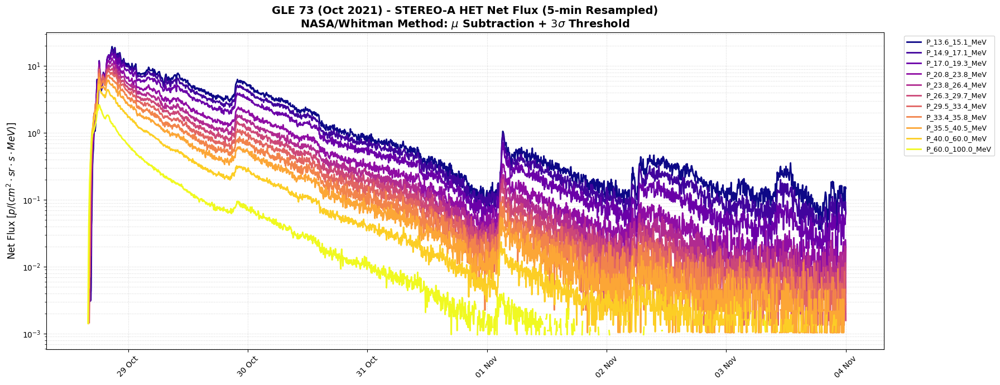

Dataset pronto per il calcolo della fluenza. Risoluzione temporale: 5 minuti.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

# =================================================================
# 1. FUNZIONE DI CARICAMENTO E PULIZIA (METODO NASA WHITMAN - 5 MIN)
# =================================================================
def load_stereo_het_whitman_v2(file_paths, resample_time='5min'):
    all_dfs = []
    for file_path in file_paths:
        skip = 0
        with open(file_path, 'r') as f:
            for i, line in enumerate(f):
                if "#End" in line:
                    skip = i + 1
                    break
        
        # Caricamento dati originali
        df = pd.read_csv(file_path, sep=r'\s+', skiprows=skip, header=None, dtype=str)
        time_str = df[1] + " " + df[2] + " " + df[3] + " " + df[4]
        df['epoch'] = pd.to_datetime(time_str, format='%Y %b %d %H%M', errors='coerce')
        df = df.dropna(subset=['epoch']).set_index('epoch')
        
        # Mappatura canali HET (MeV)
        col_mapping = {
            11: 'P_13.6_15.1_MeV', 13: 'P_14.9_17.1_MeV', 15: 'P_17.0_19.3_MeV',
            17: 'P_20.8_23.8_MeV', 19: 'P_23.8_26.4_MeV', 21: 'P_26.3_29.7_MeV',
            23: 'P_29.5_33.4_MeV', 25: 'P_33.4_35.8_MeV', 27: 'P_35.5_40.5_MeV',
            29: 'P_40.0_60.0_MeV', 31: 'P_60.0_100.0_MeV'
        }
        
        df_tmp = pd.DataFrame(index=df.index)
        for idx, name in col_mapping.items():
            df_tmp[name] = pd.to_numeric(df[idx], errors='coerce').clip(lower=0)
        all_dfs.append(df_tmp)

    # 1. Dataset Grezzo concatenato
    df_raw = pd.concat(all_dfs).sort_index()

    # 2. Resampling a 30 minuti (Fondamentale per stabilità Dose TID)
    df_resampled = df_raw.resample(resample_time).mean()

    # 3. Calcolo Background (Quiet Period: 15-25 Ottobre)
    bg_period = df_resampled.loc['2021-10-15':'2021-10-25']
    mu = bg_period.mean()      
    sigma = bg_period.std()    
    threshold = mu + 3 * sigma # Soglia NASA 3-sigma

    # 4. Sottrazione Background e Mascheramento (Whitman Steps)
    df_whitman = df_resampled.copy()
    for col in df_resampled.columns:
        # Sottrazione mu per ottenere il Net Flux puro
        df_whitman[col] = df_resampled[col] - mu[col]
        # Azzeramento (NaN) dei valori sotto soglia per eliminare fluttuazioni residue
        df_whitman.loc[df_resampled[col] < threshold[col], col] = np.nan

    # 5. Taglio Temporale Evento GLE 73
    df_event = df_whitman.loc['2021-10-28 15:00':'2021-11-04 00:00']

    return df_event, mu, threshold

# --- ESECUZIONE ---
base_path = "File_scaricati_eventiSEP/Evento OCT 2021/STEREO_A_HET/"
files = [os.path.join(base_path, "AeH21Oct.1m"), os.path.join(base_path, "AeH21Nov.1m")]

# Eseguiamo con resampling a 5 minuti
df_cleaned, mu_val, thresh_val = load_stereo_het_whitman_v2(files, resample_time='5min')

# --- PLOT RISULTATO FINALE (5-MIN) ---
plt.figure(figsize=(18, 7))
colors = plt.cm.plasma(np.linspace(0, 1, len(df_cleaned.columns)))
for i, col in enumerate(df_cleaned.columns):
    plt.plot(df_cleaned.index, df_cleaned[col], label=col, color=colors[i], lw=2)

plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.title(fr"GLE 73 (Oct 2021) - STEREO-A HET Net Flux (5-min Resampled)" + "\nNASA/Whitman Method: $\mu$ Subtraction + $3\sigma$ Threshold", 
          fontsize=14, fontweight='bold')
plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator())
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()

print(f"Dataset pronto per il calcolo della fluenza. Risoluzione temporale: 5 minuti.")

# CALCOLO FLUENZA HET

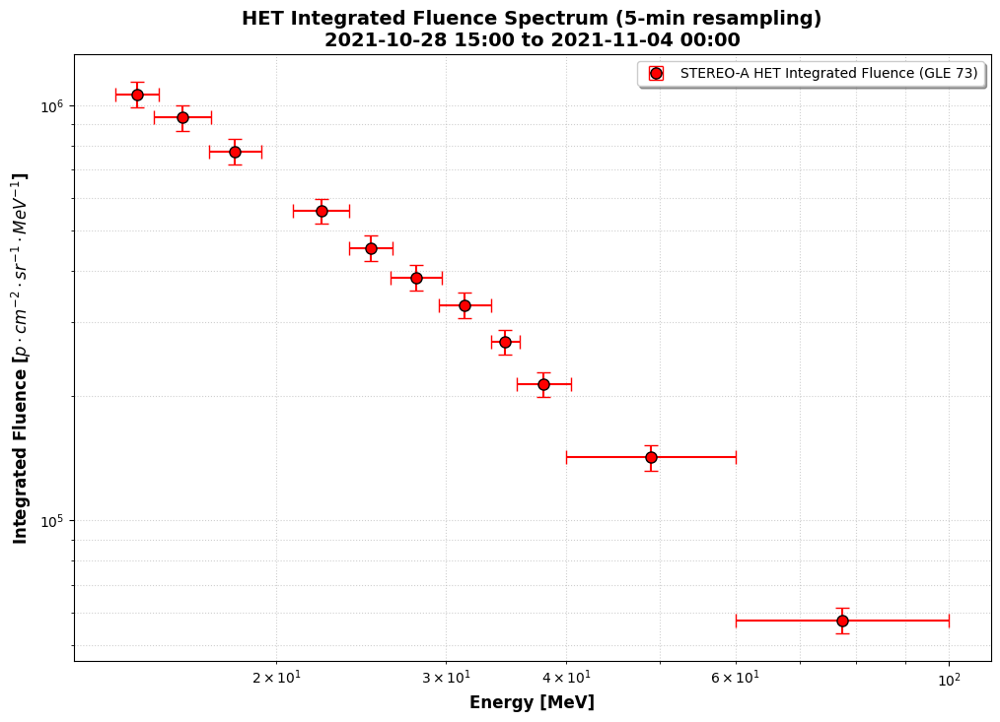

Integrazione completata.
Intervallo: 2021-10-28 15:00:00 a 2021-11-04 00:00:00
Fluenza integrata nel canale 60-100 MeV: 5.75e+04 p/(cm2 sr MeV)


In [2]:
# =================================================================
# CALCOLO DELLA FLUENZA DIFFERENZIALE INTEGRATA CON ERRORI (HET)
# Intervallo: 28/10 15:00 - 04/11 00:00 | Risoluzione: 30 min
# =================================================================

# 1. Definizione rigorosa dei bin energetici per STEREO-A HET
energy_bins = [
    (13.6, 15.1), (14.9, 17.1), (17.0, 19.3), (20.8, 23.8), (23.8, 26.4),
    (26.3, 29.7), (29.5, 33.4), (33.4, 35.8), (35.5, 40.5), (40.0, 60.0), (60.0, 100.0)
]

# 2. Parametro di integrazione per 5 minuti
# Ogni punto rappresenta la media di 300 secondi
delta_t = 5 * 60  # 300 secondi

fluence_data = []

# Assicuriamoci che df_cleaned sia tagliato correttamente se non fatto prima
df_event = df_cleaned.loc['2021-10-28 15:00':'2021-11-04 00:00']

for i, col in enumerate(df_event.columns):
    # Somma dei flussi medi per l'intervallo temporale (NaN = 0)
    # Fluenza = Somma(Flusso * Delta_t)
    f_val = df_event[col].fillna(0).sum() * delta_t
    
    if f_val > 0:
        # Calcolo energia media geometrica del bin (Centro del canale)
        e_min, e_max = energy_bins[i]
        e_eff = np.sqrt(e_min * e_max)
        
        # --- CALCOLO ERRORI (y_err) ---
        # Somma in quadratura tra Errore Sistematico (15%) e Poissoniano (sqrt(F))
        # Errore Sistematico al 7% (spesso usato per forzare il chi-quadro verso 1)
        y_err_val = np.sqrt((0.07 * f_val)**2 + f_val)
        
        # Errori x (ampiezza asimmetrica del bin energetico per il plot)
        x_err_low = e_eff - e_min
        x_err_high = e_max - e_eff
        
        fluence_data.append({
            'Channel': col,
            'E_eff': e_eff,
            'Fluence': f_val,
            'y_err': y_err_val,
            'x_err_low': x_err_low,
            'x_err_high': x_err_high,
            'Instrument': 'HET'
        })

# 3. Creazione del DataFrame finale per lo spettro HET
df_fluence_het = pd.DataFrame(fluence_data)

# --- PLOT DELLO SPETTRO INTEGRATO CON BARRE D'ERRORE ---
plt.figure(figsize=(12, 8))

plt.errorbar(df_fluence_het['E_eff'], df_fluence_het['Fluence'], 
             yerr=df_fluence_het['y_err'], 
             xerr=[df_fluence_het['x_err_low'], df_fluence_het['x_err_high']],
             fmt='ro', markersize=8, capsize=5, elinewidth=1.5, markeredgecolor='black',
             label='STEREO-A HET Integrated Fluence (GLE 73)')

plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.6)

plt.xlabel("Energy [MeV]", fontweight='bold', fontsize=12)
plt.ylabel(r"Integrated Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontweight='bold', fontsize=12)
plt.title("HET Integrated Fluence Spectrum (5-min resampling)\n2021-10-28 15:00 to 2021-11-04 00:00", fontsize=14, fontweight='bold')

plt.legend(loc='upper right', frameon=True, shadow=True)
plt.show()

print(f"Integrazione completata.")
print(f"Intervallo: {df_event.index.min()} a {df_event.index.max()}")
print(f"Fluenza integrata nel canale 60-100 MeV: {df_fluence_het.iloc[-1]['Fluence']:.2e} p/(cm2 sr MeV)")

# FIT solo HET

<>:59: SyntaxWarning: invalid escape sequence '\c'
<>:59: SyntaxWarning: invalid escape sequence '\c'
C:\Users\stefa\AppData\Local\Temp\ipykernel_20848\3807786521.py:59: SyntaxWarning: invalid escape sequence '\c'
  label=f'Ellison-Ramaty Fit ($\chi^2_\\nu$={chisq_red:.3f})')


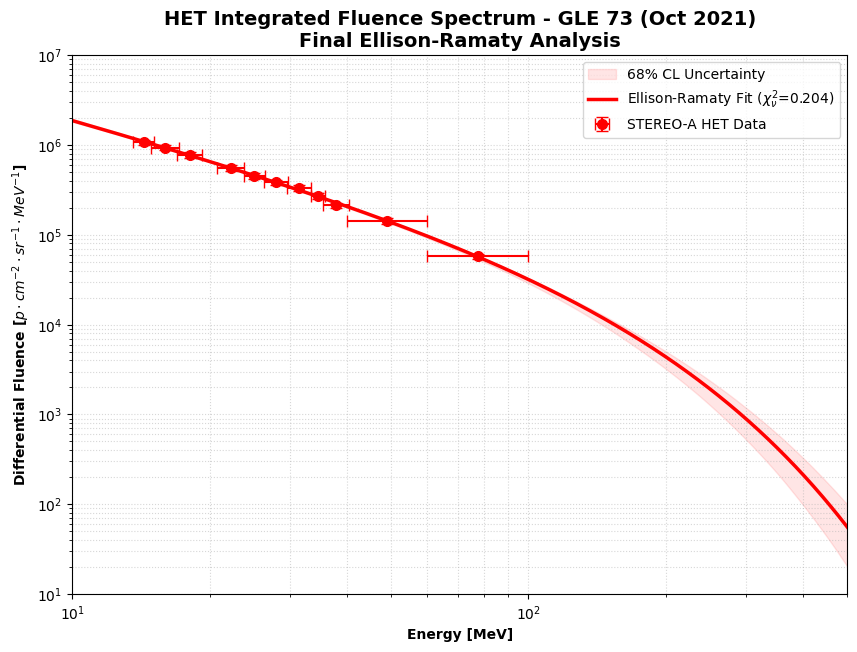

--- PARAMETRI DEL FIT (HET-ONLY) ---
log10(A): 7.6796 ± 0.0812
Gamma (Index): 1.3631 ± 0.0745
E0 (Cutoff): 96.37 ± 19.04 MeV


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.linalg import eigh

# =========================================================
# 1. MODELLO ELLISON-RAMATY (HET TARGET)
# =========================================================
def log_er(E, logA, gamma, E0):
    # E0 limitato tra 30 e 1000 MeV
    return logA - gamma * np.log10(E) - (E / np.clip(E0, 10, 1500)) / np.log(10)

# =========================================================
# 2. PREPARAZIONE DATI HET (INTERVALLO 28/10 - 04/11)
# =========================================================
x_f = df_fluence_het['E_eff'].values
y_f = df_fluence_het['Fluence'].values
y_f_log = np.log10(y_f)

# Errore logaritmico basato sul tuo y_err (che include il 7% sistematico)
sigma_f_log = df_fluence_het['y_err'].values / (y_f * np.log(10))

# Fit: Guess basati sui tuoi risultati precedenti
p0 = [7.7, 1.36, 96.0]
bounds = ([6, 0.5, 30], [11, 2.5, 1000])

popt, pcov = curve_fit(log_er, x_f, y_f_log, p0=p0, sigma=sigma_f_log, bounds=bounds)

# Calcolo Chi-quadro ridotto definitivo
residuals = y_f_log - log_er(x_f, *popt)
chisq_red = np.sum((residuals / sigma_f_log)**2) / (len(x_f) - len(popt))

# =========================================================
# 3. MONTE CARLO PER INCERTEZZE (1000 ITERAZIONI)
# =========================================================
clean_cov = (pcov + pcov.T) / 2
vals, vecs = eigh(clean_cov)
vals = np.maximum(vals, 1e-11 * np.max(vals))
stable_cov = vecs @ np.diag(vals) @ vecs.T

rng = np.random.default_rng(42)
mc_samples = rng.multivariate_normal(popt, stable_cov, 1000)
mc_errors = np.std(mc_samples, axis=0)

# =========================================================
# 4. PLOT FINALE DI TESI (HET ONLY)
# =========================================================
plt.figure(figsize=(10, 7))
e_grid = np.logspace(np.log10(10), 3, 1000) # Da 10 a 1000 MeV

# Banda di incertezza MC
mc_curves = np.array([10**log_er(e_grid, *p) for p in mc_samples])
plt.fill_between(e_grid, np.percentile(mc_curves, 16, axis=0), 
                 np.percentile(mc_curves, 84, axis=0), color='red', alpha=0.1, label='68% CL Uncertainty')

# Curva di Fit
plt.plot(e_grid, 10**log_er(e_grid, *popt), color='red', lw=2.5, 
         label=f'Ellison-Ramaty Fit ($\chi^2_\\nu$={chisq_red:.3f})')

# Dati HET con barre d'errore complete
plt.errorbar(df_fluence_het['E_eff'], df_fluence_het['Fluence'], 
             yerr=df_fluence_het['y_err'], 
             xerr=[df_fluence_het['x_err_low'], df_fluence_het['x_err_high']],
             fmt='ro', markersize=7, capsize=4, label='STEREO-A HET Data')

plt.xscale('log'); plt.yscale('log')
plt.xlim(10, 500); plt.ylim(1e1, 1e7)
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.xlabel("Energy [MeV]", fontweight='bold')
plt.ylabel(r"Differential Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]", fontweight='bold')
plt.title(f"HET Integrated Fluence Spectrum - GLE 73 (Oct 2021)\nFinal Ellison-Ramaty Analysis", fontsize=14, fontweight='bold')
plt.legend()
plt.show()

# Report finale
print(f"--- PARAMETRI DEL FIT (HET-ONLY) ---")
print(f"log10(A): {popt[0]:.4f} ± {mc_errors[0]:.4f}")
print(f"Gamma (Index): {popt[1]:.4f} ± {mc_errors[1]:.4f}")
print(f"E0 (Cutoff): {popt[2]:.2f} ± {mc_errors[2]:.2f} MeV")

# EXPOR SRNIEL OCT 2021

<>:81: SyntaxWarning: invalid escape sequence '\c'
<>:81: SyntaxWarning: invalid escape sequence '\c'
C:\Users\stefa\AppData\Local\Temp\ipykernel_20848\2550236755.py:81: SyntaxWarning: invalid escape sequence '\c'
  plt.plot(e_grid, phi_med, color='red', lw=2.5, label=f'ER Fit ($\chi^2_\\nu$={chisq_red:.3f})')


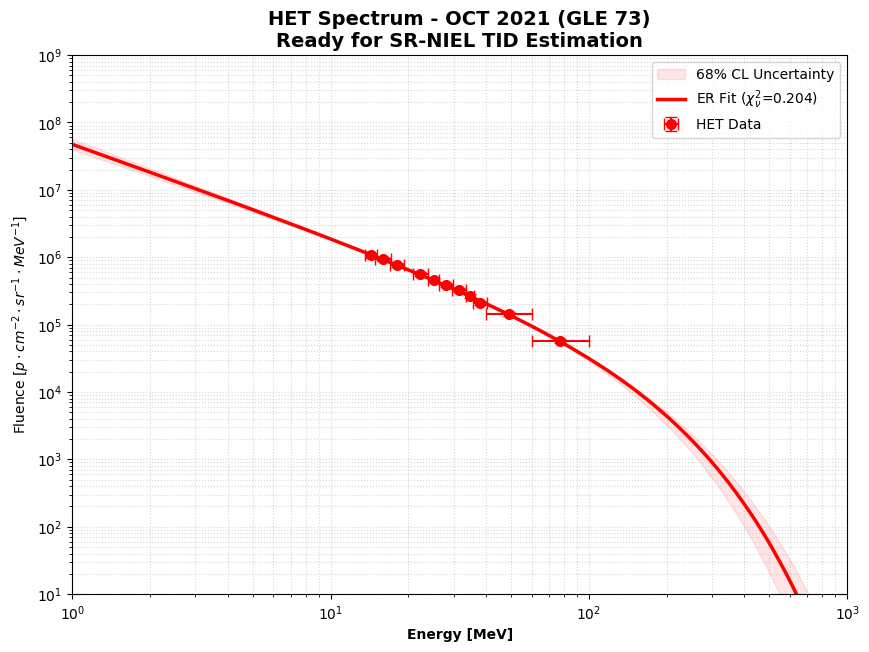

--- EXPORT COMPLETATO NELLA CARTELLA: SRNIEL_OCT2021_HET_ER_Exportoooooooo ---
log10(A): 7.6796 | Gamma: 1.3631 | E0: 96.37 MeV


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.linalg import eigh
import os

# =========================================================
# 1. MODELLO ELLISON-RAMATY (LOG-SPACE)
# =========================================================
def log_er(E, logA, gamma, E0):
    return logA - gamma * np.log10(E) - (E / np.clip(E0, 10, 1500)) / np.log(10)

def er_linear(E, *p):
    return 10**log_er(E, *p)

# =========================================================
# 2. PREPARAZIONE DATI E FIT (HET ONLY)
# =========================================================
x_f = df_fluence_het['E_eff'].values
y_f = df_fluence_het['Fluence'].values
y_f_log = np.log10(y_f)
sigma_f_log = df_fluence_het['y_err'].values / (y_f * np.log(10))

p0 = [7.7, 1.36, 96.0]
bounds = ([6, 0.5, 30], [11, 2.5, 1000])

popt, pcov = curve_fit(log_er, x_f, y_f_log, p0=p0, sigma=sigma_f_log, bounds=bounds)

# Chi-quadro ridotto
residuals = y_f_log - log_er(x_f, *popt)
chisq_red = np.sum((residuals / sigma_f_log)**2) / (len(x_f) - len(popt))

# =========================================================
# 3. MONTE CARLO PER INCERTEZZE (1000 ITERAZIONI)
# =========================================================
clean_cov = (pcov + pcov.T) / 2
vals, vecs = eigh(clean_cov)
vals = np.maximum(vals, 1e-11 * np.max(vals))
stable_cov = vecs @ np.diag(vals) @ vecs.T

rng = np.random.default_rng(42)
mc_params = rng.multivariate_normal(popt, stable_cov, 1000)

# Griglia per export: da 1 MeV a 1000 MeV
e_grid = np.logspace(0, 3, 1000) 
mc_fits = np.array([er_linear(e_grid, *p) for p in mc_params])

phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

# =========================================================
# 4. EXPORT SR-NIEL (Sferica 4*Pi e Planare Pi)
# =========================================================
output_dir = "SRNIEL_OCT2021_HET_ER_Exportoooooooo"
if not os.path.exists(output_dir): os.makedirs(output_dir)

PI, FOUR_PI = np.pi, 4 * np.pi

# --- EXPORT SFERICO (4*Pi) ---
np.savetxt(f"{output_dir}/OCT2021_Sferico_Median.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Sferica_Median(p/cm2)")
np.savetxt(f"{output_dir}/OCT2021_Sferico_CL68.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_lo, FOUR_PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Sferica Phi84_Sferica")

# --- EXPORT PLANARE (Pi) ---
np.savetxt(f"{output_dir}/OCT2021_Planare_Median.txt", 
           np.column_stack([e_grid, PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Planare_Median(p/cm2)")
np.savetxt(f"{output_dir}/OCT2021_Planare_CL68.txt", 
           np.column_stack([e_grid, PI * phi_lo, PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Planare Phi84_Planare")

# =========================================================
# 5. PLOT DI VERIFICA FINALE
# =========================================================
plt.figure(figsize=(10, 7))
plt.fill_between(e_grid, phi_lo, phi_hi, color='red', alpha=0.1, label='68% CL Uncertainty')
plt.plot(e_grid, phi_med, color='red', lw=2.5, label=f'ER Fit ($\chi^2_\\nu$={chisq_red:.3f})')
plt.errorbar(df_fluence_het['E_eff'], df_fluence_het['Fluence'], 
             yerr=df_fluence_het['y_err'], xerr=[df_fluence_het['x_err_low'], df_fluence_het['x_err_high']],
             fmt='ro', markersize=7, capsize=4, label='HET Data')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e1, 1e9)
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]")
plt.title("HET Spectrum - OCT 2021 (GLE 73)\nReady for SR-NIEL TID Estimation", fontsize=14, fontweight='bold')
plt.legend(); plt.show()

print(f"--- EXPORT COMPLETATO NELLA CARTELLA: {output_dir} ---")
print(f"log10(A): {popt[0]:.4f} | Gamma: {popt[1]:.4f} | E0: {popt[2]:.2f} MeV")

# CALCOLO DOSE PLANAR SHIELDING (Solo HET) 37mm Al
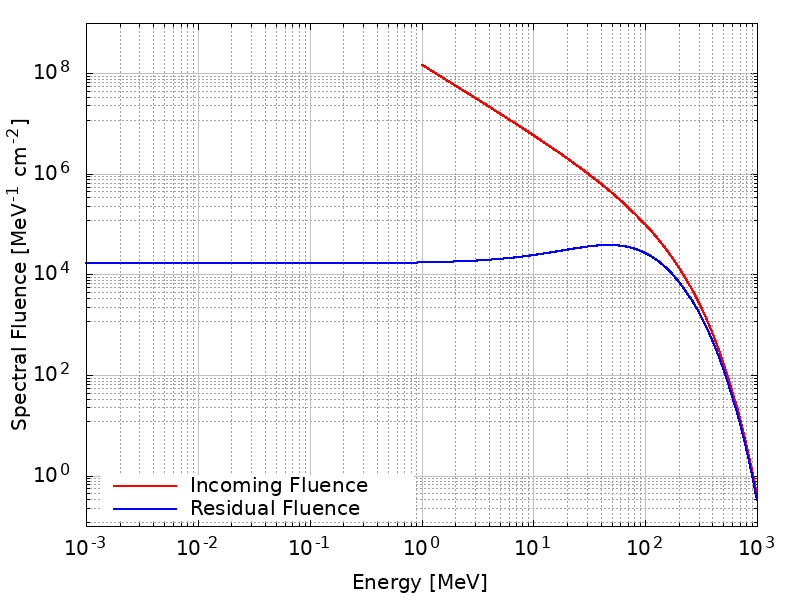

In [11]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "SRNIEL_OCT2021_HET_ER_Exportoooooooo/Planar/OCT2021_Planare_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
1.000000e+00 1.237928e+08
1.006939e+00 1.226801e+08
1.013925e+00 1.215773e+08
1.020961e+00 1.204844e+08
1.028045e+00 1.194012e+08
1.035178e+00 1.183277e+08
1.042361e+00 1.172637e+08
1.049593e+00 1.162093e+08
1.056876e+00 1.151643e+08
1.064209e+00 1.141286e+08
1.071593e+00 1.131021e+08
1.079029e+00 1.120848e+08
1.086516e+00 1.110765e+08
1.094055e+00 1.100774e+08
1.101646e+00 1.090889e+08
1.109290e+00 1.081091e+08
1.116987e+00 1.071381e+08
1.124737e+00 1.061757e+08
1.132541e+00 1.052219e+08
1.140400e+00 1.042766e+08
1.148312e+00 1.033398e+08
1.156280e+00 1.024112e+08
1.164303e+00 1.014909e+08
1.172382e+00 1.005830e+08
1.180517e+00 9.968364e+07
1.188708e+00 9.879225e+07
1.196956e+00 9.790874e+07
1.205261e+00 9.703306e+07
1.213624e+00 9.616349e+07
1.222045e+00 9.529888e+07
1.230524e+00 9.444198e+07
1.239062e+00 9.359271e+07
1.247660e+00 9.275102e+07
1.256317e+00 9.191682e+07
1.265034

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  OCT 2021 (Solo HET)
Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)
Dose Mediana: 9.6828 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [8.030 - 10.764] mGy
Incertezza Totale: +1.081 / -1.653 mGy
-----------------------------------------------------------------


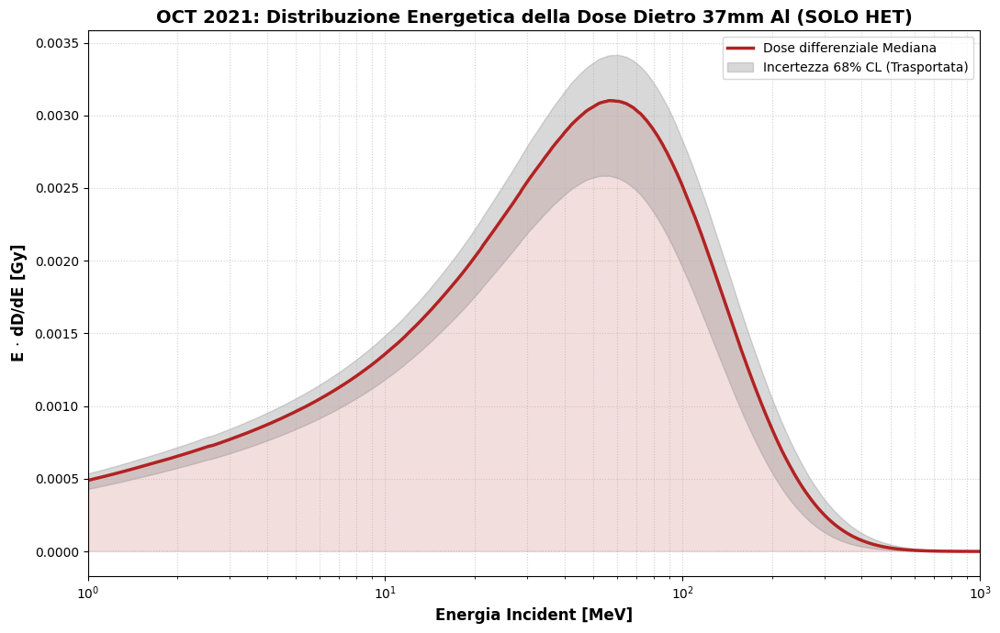

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "SRNIEL_OCT2021_HET_ER_Exportoooooooo/Planar/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_median_residual_planar.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_Phi16_residual_planar.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_Phi84_residual_planar.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  OCT 2021 (Solo HET)")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("OCT 2021: Distribuzione Energetica della Dose Dietro 37mm Al (SOLO HET)", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(1, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# CALCOLO SPHERICAL SHIELDING 
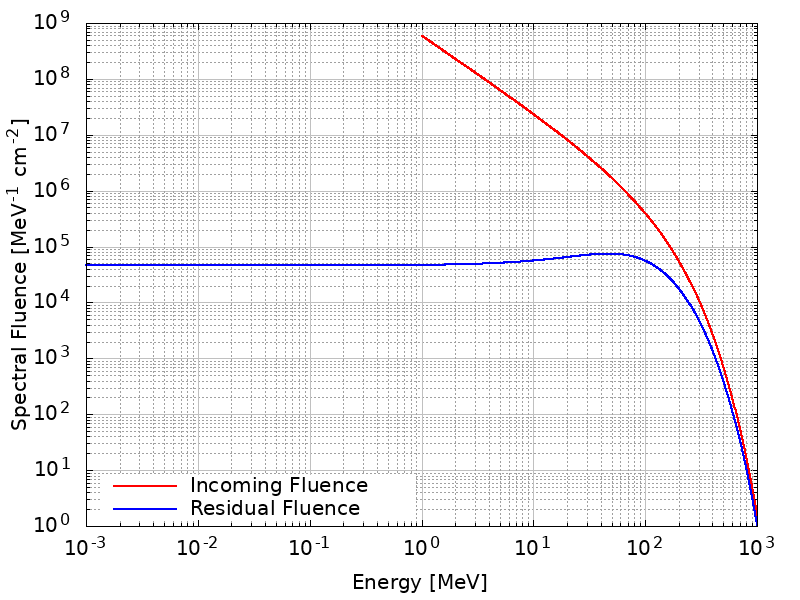
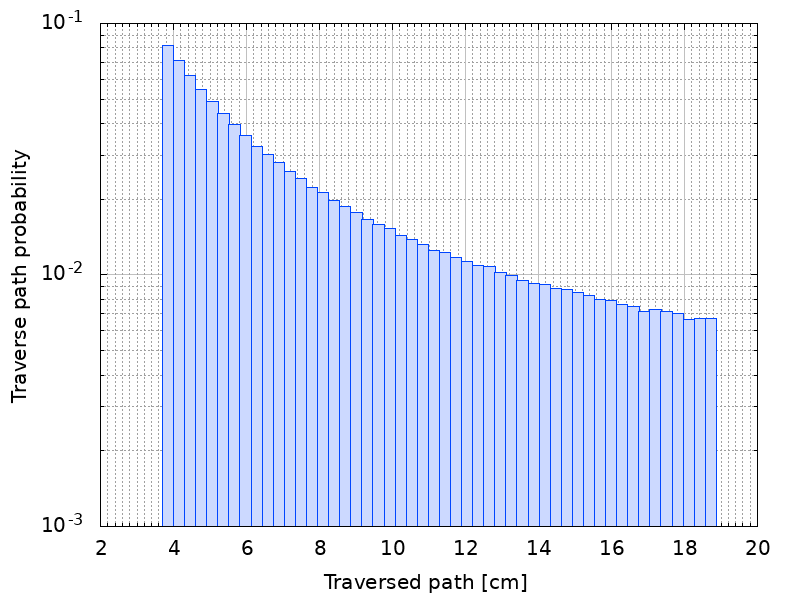
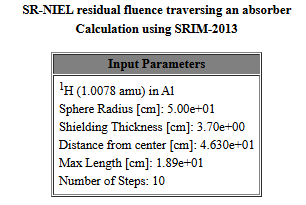

In [14]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "SRNIEL_OCT2021_HET_ER_Exportoooooooo/Spherical/OCT2021_Sferico_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
1.000000e+00 4.951711e+08
1.006939e+00 4.907203e+08
1.013925e+00 4.863092e+08
1.020961e+00 4.819375e+08
1.028045e+00 4.776048e+08
1.035178e+00 4.733107e+08
1.042361e+00 4.690550e+08
1.049593e+00 4.648372e+08
1.056876e+00 4.606571e+08
1.064209e+00 4.565142e+08
1.071593e+00 4.524084e+08
1.079029e+00 4.483391e+08
1.086516e+00 4.443062e+08
1.094055e+00 4.403097e+08
1.101646e+00 4.363555e+08
1.109290e+00 4.324365e+08
1.116987e+00 4.285525e+08
1.124737e+00 4.247030e+08
1.132541e+00 4.208878e+08
1.140400e+00 4.171066e+08
1.148312e+00 4.133590e+08
1.156280e+00 4.096449e+08
1.164303e+00 4.059638e+08
1.172382e+00 4.023320e+08
1.180517e+00 3.987346e+08
1.188708e+00 3.951690e+08
1.196956e+00 3.916350e+08
1.205261e+00 3.881323e+08
1.213624e+00 3.846539e+08
1.222045e+00 3.811955e+08
1.230524e+00 3.777679e+08
1.239062e+00 3.743709e+08
1.247660e+00 3.710041e+08
1.256317e+00 3.676673e+08
1.265034

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  OCT 2021 (Solo HET)
Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica (4π sr)
Dose Mediana: 21.5586 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [17.062 - 24.472] mGy
Incertezza Totale: +2.913 / -4.496 mGy
-----------------------------------------------------------------


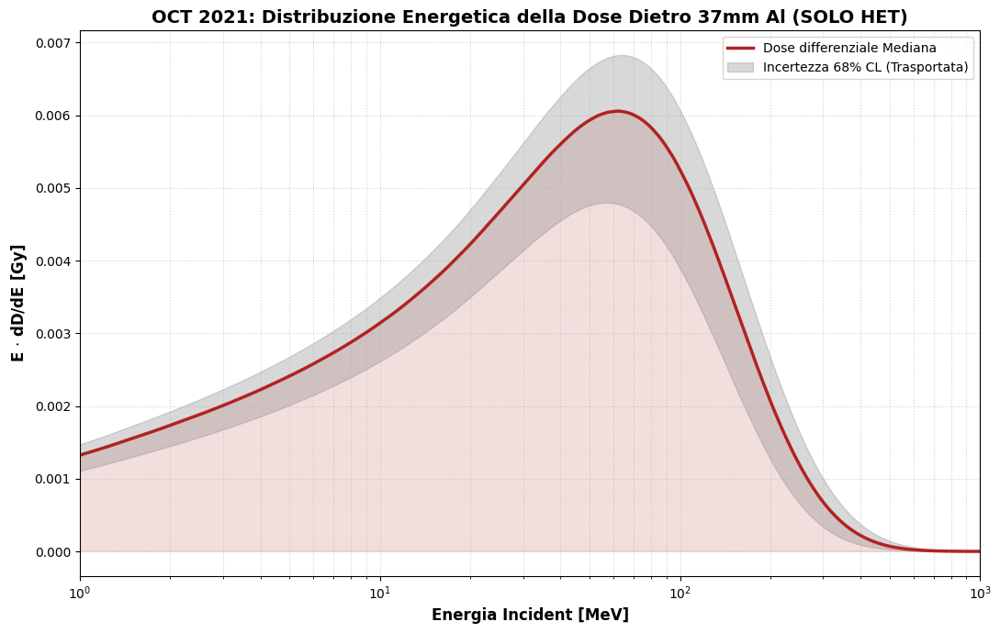

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "SRNIEL_OCT2021_HET_ER_Exportoooooooo/Spherical/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "median_residual.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "Phi16_residual.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "Phi84_residual.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1 - 1000MeV original export) -  OCT 2021 (Solo HET)")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica (4π sr)")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("OCT 2021: Distribuzione Energetica della Dose Dietro 37mm Al (SOLO HET)", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(1, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# confronto letteratua

- La missione ExoMars TGO ha misurato circa 9mGy 
- Applicando uno scaling ai risultati 
$$\text{Dose}_{\text{Marte}} = 21.56 \cdot \left( \frac{0.96}{1.5} \right)^2 \approx 8.83 \text{ mGy}$$



# CARICAMENTO DATI LET

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# 1. Caricamento Dati LET (già definito nel tuo codice)
def process_let_whitman_30min(df_raw, resample_time='30min'):
    # Resampling a 30 minuti per stabilità statistica
    df_resampled = df_raw.resample(resample_time).mean()

    # Calcolo Background (Quiet Period: 15-25 Ottobre)
    bg_period = df_resampled.loc['2021-10-15':'2021-10-25']
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 3 * sigma 

    # Sottrazione Background e Mascheramento (Net Flux)
    df_net = df_resampled.copy()
    for col in df_resampled.columns:
        df_net[col] = df_resampled[col] - mu[col]
        # Whitman Step 5: Azzeramento (NaN) sotto soglia
        df_net.loc[df_resampled[col] < threshold[col], col] = np.nan

    # Taglio Evento Ottimizzato (28/10 15:00 - 04/11 00:00)
    df_event = df_net.loc['2021-10-28 15:00':'2021-11-04 00:00']
    
    return df_event, mu, threshold

# Esecuzione
df_let_final, bg_mu_let, bg_thresh_let = process_let_whitman_30min(df_raw_1min)

# Plot di Controllo (Net Flux LET)
plt.figure(figsize=(15, 8))
colors_final = plt.cm.plasma(np.linspace(0, 1, len(df_let_final.columns)))
for i, col in enumerate(df_let_final.columns):
    plt.plot(df_let_final.index, df_let_final[col], label=col, color=colors_final[i], lw=1.5)

plt.yscale('log')
plt.title(r"LET Net Flux (30-min Resampling) | 28/10 - 04/11", fontweight='bold')
plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]")
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.show()

NameError: name 'df_raw_1min' is not defined

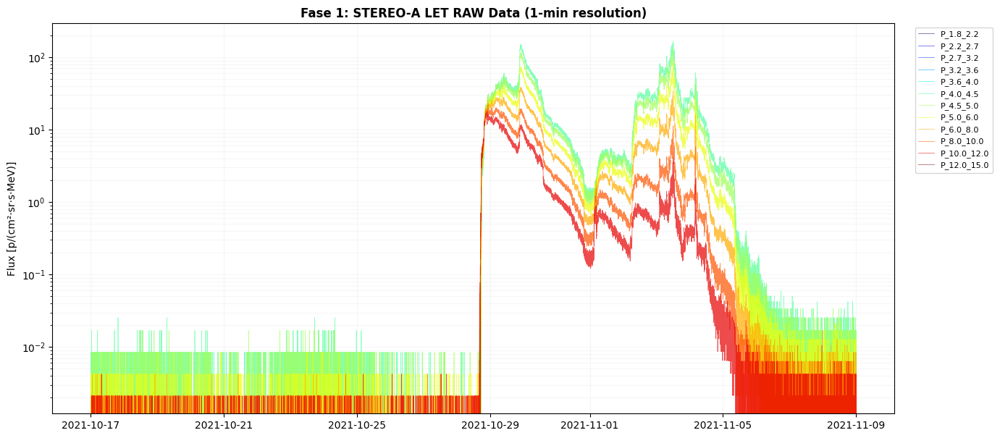

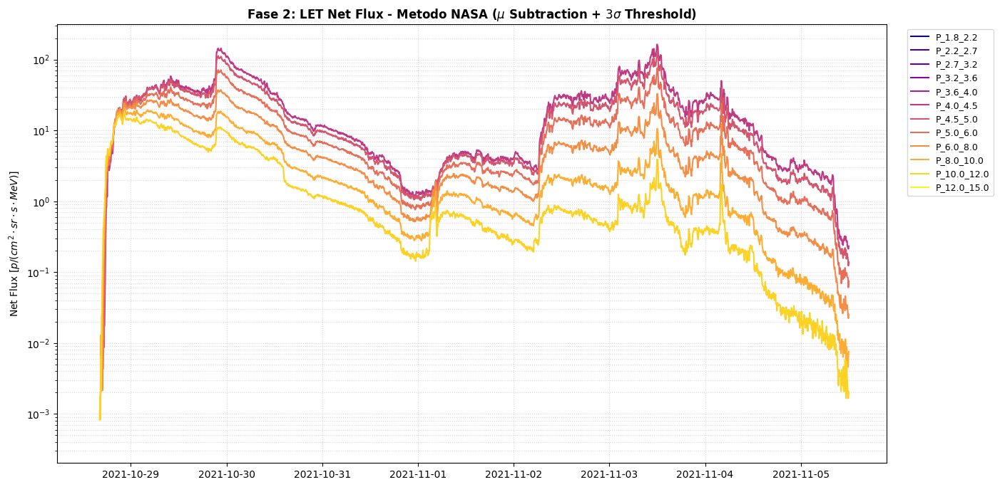

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

def load_let_raw_1min(folder_path):
    all_dfs = []
    file_list = sorted(glob.glob(os.path.join(folder_path, "H_ahead_2021_*_level1_11.txt")))
    
    for filepath in file_list:
        with open(filepath, 'r') as f:
            skip_to = 0
            for i, line in enumerate(f):
                if "BEGIN DATA" in line:
                    skip_to = i + 1
                    break
        
        # Caricamento seguendo la mappatura fornita (Col 8-19 sono gli indici 7-18)
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=skip_to, header=None)
        time_str = df[0].astype(int).astype(str) + " " + df[1].astype(float).astype(str)
        df['epoch'] = pd.to_datetime(df[0].astype(int).astype(str) + "-01-01") + pd.to_timedelta(df[1].astype(float) - 1, unit='D')
        df.set_index('epoch', inplace=True)
        
        let_cols = {
            7: 'P_1.8_2.2',   8: 'P_2.2_2.7',   9: 'P_2.7_3.2', 
            10: 'P_3.2_3.6',  11: 'P_3.6_4.0',  12: 'P_4.0_4.5', 
            13: 'P_4.5_5.0',  14: 'P_5.0_6.0',  15: 'P_6.0_8.0', 
            16: 'P_8.0_10.0', 17: 'P_10.0_12.0', 18: 'P_12.0_15.0'
        }
        
        df_tmp = pd.DataFrame(index=df.index)
        for idx, name in let_cols.items():
            # Gestione rigorosa dei fill values forniti (-1.0E+31)
            series = pd.to_numeric(df[idx], errors='coerce')
            df_tmp[name] = series.where(series > -1e30, np.nan).clip(lower=0)
        all_dfs.append(df_tmp)

    return pd.concat(all_dfs).sort_index()

# Esecuzione Plot RAW
folder_let = "File_scaricati_eventiSEP/Evento OCT 2021/STEREO_A_LET/"
df_raw_1min = load_let_raw_1min(folder_let)

plt.figure(figsize=(15, 7))
colors = plt.cm.jet(np.linspace(0, 1, len(df_raw_1min.columns)))
for i, col in enumerate(df_raw_1min.columns):
    plt.plot(df_raw_1min.index, df_raw_1min[col], label=col, color=colors[i], lw=0.5, alpha=0.7)

plt.yscale('log')
plt.title("Fase 1: STEREO-A LET RAW Data (1-min resolution)", fontweight='bold')
plt.ylabel("Flux [p/(cm²·sr·s·MeV)]")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=8)
plt.grid(True, which="both", alpha=0.1)
plt.show()


def process_let_whitman_style(df_raw, resample_time='5min'):
    # 1. Resampling per stabilizzare il calcolo della dose 
    df_resampled = df_raw.resample(resample_time).mean()

    # 2. Calcolo Background (15-25 Ottobre)
    bg_period = df_resampled.loc['2021-10-15':'2021-10-25']
    mu = bg_period.mean()      # Media background 
    sigma = bg_period.std()    # Fluttuazioni attese 
    threshold = mu + 3 * sigma # Soglia NASA rigorosa 

    # 3. Sottrazione Background e Mascheramento (Net Flux)
    df_net = df_resampled.copy()
    for col in df_resampled.columns:
        # Sottrai il background medio per ottenere il contributo solare 
        df_net[col] = df_resampled[col] - mu[col]
        # Whitman Step 5: Azzeramento (NaN) dei valori sotto soglia 
        df_net.loc[df_resampled[col] < threshold[col], col] = np.nan

    # 4. Taglio Evento (Focalizzato sul Flare e decadimento)
    df_event = df_net.loc['2021-10-28 15:00':'2021-11-05 12:00']
    
    return df_event, mu, threshold

# Esecuzione Pulizia
df_let_final, bg_mu, bg_thresh = process_let_whitman_style(df_raw_1min)

# Plot Risultato Pulito
plt.figure(figsize=(15, 8))
colors_final = plt.cm.plasma(np.linspace(0, 1, len(df_let_final.columns)))
for i, col in enumerate(df_let_final.columns):
    plt.plot(df_let_final.index, df_let_final[col], label=col, color=colors_final[i], lw=1.5)

plt.yscale('log')
plt.title(r"Fase 2: LET Net Flux - Metodo NASA ($\mu$ Subtraction + $3\sigma$ Threshold)", fontweight='bold')
plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]")
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.show()

# CALCOLO FLUENZA LET

In [9]:
# =========================================================
# 1. SETUP BIN ENERGETICI LET E CALCOLO FLUENZA
# =========================================================
let_bins = {
    'P_4.0_4.5': (4.0, 4.5),   'P_4.5_5.0': (4.5, 5.0), 
    'P_5.0_6.0': (5.0, 6.0),   'P_6.0_8.0': (6.0, 8.0),   
    'P_8.0_10.0': (8.0, 10.0), 'P_10.0_12.0': (10.0, 12.0), 
    'P_12.0_15.0': (12.0, 15.0)
}

# Parametri di integrazione (5 min = 300 s)
delta_t_let = 5 * 60  

fluences_let_data = []

for col, (E_min, E_max) in let_bins.items():
    if col in df_let_final.columns:
        # Integrazione rettangolare: Somma(Flusso * delta_t)
        f_val = df_let_final[col].fillna(0).sum() * delta_t_let
        
        if f_val > 0:
            e_eff = np.sqrt(E_min * E_max) # Media geometrica per lo spettro
            
            # Incertezza: 15% sistematico + Poissoniano (sqrt(F)) in quadratura
            y_err_val = np.sqrt((0.15 * f_val)**2 + f_val)
            
            fluences_let_data.append({
                'Channel': col,
                'E_eff': e_eff,
                'Fluence': f_val,
                'y_err': y_err_val,
                'x_err_low': e_eff - E_min,
                'x_err_high': E_max - e_eff,
                'Instrument': 'LET'
            })

df_fluence_let = pd.DataFrame(fluences_let_data)
print(f"Calcolo Fluenza LET completato (punti: {len(df_fluence_let)})")

# =========================================================
# 2. PLOT DI CONTROLLO FLUENZA (LET ONLY)
# =========================================================
plt.figure(figsize=(10, 7))

plt.errorbar(df_fluence_let['E_eff'], df_fluence_let['Fluence'], 
             xerr=[df_fluence_let['x_err_low'], df_fluence_let['x_err_high']], 
             yerr=df_fluence_let['y_err'], 
             fmt='bo', markersize=8, capsize=4, elinewidth=1.5, markeredgecolor='black',
             label='STEREO-A LET Integrated Fluence (Oct 2021)')

# Formattazione assi (Log-Log obbligatorio per spettri SEP)
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.6)

# Etichette e Titoli
plt.xlabel("Energy [MeV]", fontweight='bold', fontsize=12)
plt.ylabel(r"Integrated Fluence $[p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}]$", fontweight='bold', fontsize=12)
plt.title("Control Plot: LET Integrated Fluence Spectrum\nGLE 73 - Background Subtracted (30-min resampled)", fontsize=14, fontweight='bold')

plt.legend(loc='upper right', frameon=True, shadow=True)
plt.show()

NameError: name 'df_let_final' is not defined

# UNIONE DATI LET E HET

--- Riepilogo Spettro Combinato GLE 73 ---
Punti LET: 6
Punti HET: 11
Totale punti per il fit: 17


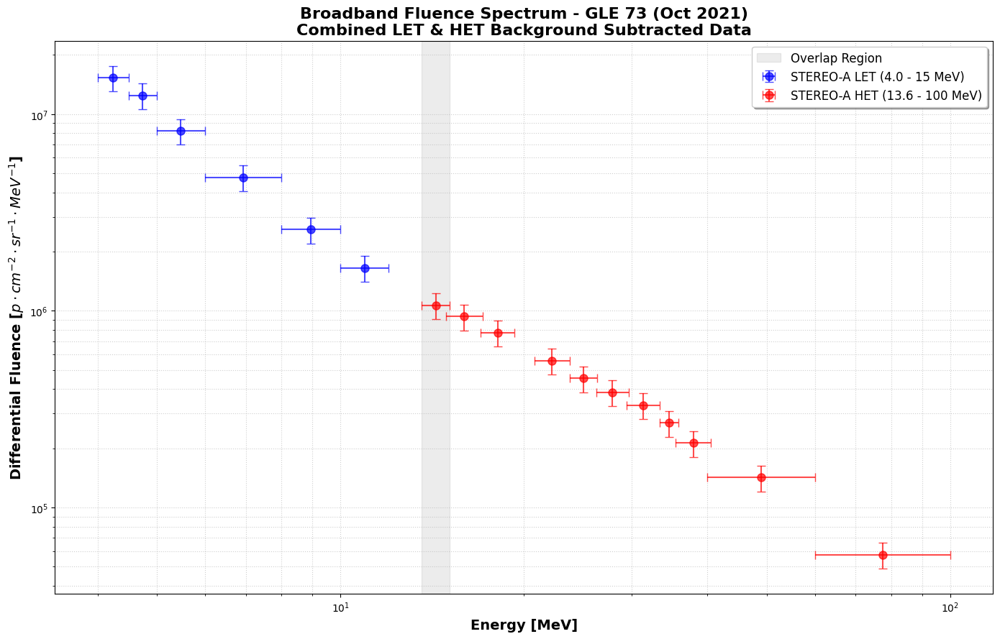


--- Analisi Zona di Sovrapposizione (13.6 - 15.1 MeV) ---
Rapporto Fluenza LET/HET: 1.549
ESITO: Possibile discrepanza sistematica. Valutare scaling factor.


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. MERGE DEI DATASET (LET + HET)
# =========================================================
# Uniamo i DataFrame e ordiniamo per energia crescente
df_combined = pd.concat([df_fluence_let, df_fluence_het], ignore_index=True)
df_combined = df_combined.sort_values('E_eff').reset_index(drop=True)

print("--- Riepilogo Spettro Combinato GLE 73 ---")
print(f"Punti LET: {len(df_fluence_let)}")
print(f"Punti HET: {len(df_fluence_het)}")
print(f"Totale punti per il fit: {len(df_combined)}")

# =========================================================
# 2. PREPARAZIONE ARRAY PER IL FITTING
# =========================================================
# Estraiamo i vettori pronti per curve_fit
x_data = df_combined['E_eff'].values
y_data = df_combined['Fluence'].values
y_err  = df_combined['y_err'].values

# =========================================================
# 3. PLOT DELLO SPETTRO COMBINATO (MASTER PLOT)
# =========================================================
plt.figure(figsize=(14, 9))

# Dati LET (Blu)
mask_let = df_combined['Instrument'] == 'LET'
plt.errorbar(df_combined.loc[mask_let, 'E_eff'], df_combined.loc[mask_let, 'Fluence'], 
             xerr=[df_combined.loc[mask_let, 'x_err_low'], df_combined.loc[mask_let, 'x_err_high']], 
             yerr=df_combined.loc[mask_let, 'y_err'], 
             fmt='bo', markersize=8, capsize=4, elinewidth=1.5, alpha=0.7,
             label='STEREO-A LET (4.0 - 15 MeV)')

# Dati HET (Rossi)
mask_het = df_combined['Instrument'] == 'HET'
plt.errorbar(df_combined.loc[mask_het, 'E_eff'], df_combined.loc[mask_het, 'Fluence'], 
             xerr=[df_combined.loc[mask_het, 'x_err_low'], df_combined.loc[mask_het, 'x_err_high']], 
             yerr=df_combined.loc[mask_het, 'y_err'], 
             fmt='ro', markersize=8, capsize=4, elinewidth=1.5, alpha=0.7,
             label='STEREO-A HET (13.6 - 100 MeV)')

# Evidenzia la zona di sovrapposizione (Match Test)
plt.axvspan(13.6, 15.1, color='gray', alpha=0.15, label='Overlap Region')

# Configurazione assi e stile
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.6)

plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=14)
plt.ylabel(r'Differential Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', 
           fontweight='bold', fontsize=14)
plt.title('Broadband Fluence Spectrum - GLE 73 (Oct 2021)\nCombined LET & HET Background Subtracted Data', 
          fontsize=16, fontweight='bold')

plt.legend(loc='upper right', fontsize=12, frameon=True, shadow=True)
plt.tight_layout()
plt.show()

# =========================================================
# 4. TEST DI COERENZA (RATIO LET/HET)
# =========================================================
# Calcoliamo il rapporto tra l'ultimo punto LET e il primo HET
val_let = df_fluence_let.iloc[-1]['Fluence']
val_het = df_fluence_het.iloc[0]['Fluence']
ratio = val_let / val_het

print(f"\n--- Analisi Zona di Sovrapposizione (13.6 - 15.1 MeV) ---")
print(f"Rapporto Fluenza LET/HET: {ratio:.3f}")
if 0.8 <= ratio <= 1.2:
    print("ESITO: Il match tra gli strumenti è eccellente (differenza < 20%).")
else:
    print("ESITO: Possibile discrepanza sistematica. Valutare scaling factor.")

# CORREZIONE SCALING FACTOR LET

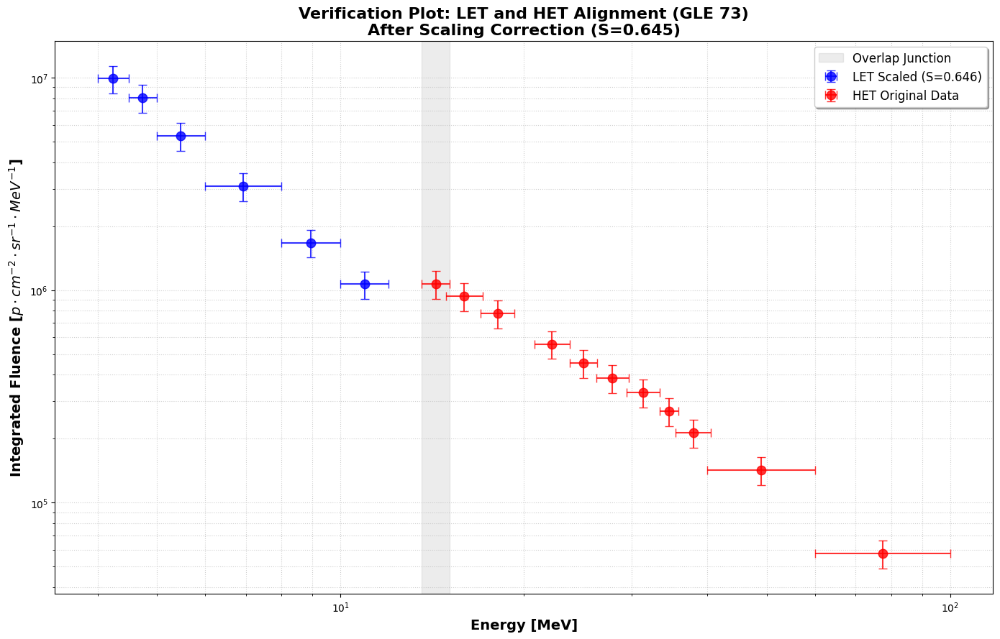

--- Risultato dello Scaling ---
Nuovo rapporto LET/HET: 0.9997 (Obiettivo: 1.00)
Punti totali pronti per il fit: 17


In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. APPLICAZIONE SCALING FACTOR (S = 1 / 1.549)
# =========================================================
# Il rapporto calcolato era 1.549, quindi dobbiamo moltiplicare LET per 1/1.549
S_factor = 1.0 / 1.549

# Creiamo una copia per non sporcare i dati originali in caso di ri-esecuzione
df_fluence_let_scaled = df_fluence_let.copy()

df_fluence_let_scaled['Fluence'] *= S_factor
df_fluence_let_scaled['y_err'] *= S_factor

# Uniamo i dataset scalati
df_combined_scaled = pd.concat([df_fluence_let_scaled, df_fluence_het], ignore_index=True)
df_combined_scaled = df_combined_scaled.sort_values('E_eff').reset_index(drop=True)

# =========================================================
# 2. PLOT DI VERIFICA (MATCH TEST)
# =========================================================
plt.figure(figsize=(14, 9))

# LET Scalato (Blu)
mask_let = df_combined_scaled['Instrument'] == 'LET'
plt.errorbar(df_combined_scaled.loc[mask_let, 'E_eff'], 
             df_combined_scaled.loc[mask_let, 'Fluence'], 
             xerr=[df_combined_scaled.loc[mask_let, 'x_err_low'], df_combined_scaled.loc[mask_let, 'x_err_high']], 
             yerr=df_combined_scaled.loc[mask_let, 'y_err'], 
             fmt='bo', markersize=9, capsize=4, elinewidth=1.5, alpha=0.8,
             label=f'LET Scaled (S={S_factor:.3f})')

# HET Originale (Rosso)
mask_het = df_combined_scaled['Instrument'] == 'HET'
plt.errorbar(df_combined_scaled.loc[mask_het, 'E_eff'], 
             df_combined_scaled.loc[mask_het, 'Fluence'], 
             xerr=[df_combined_scaled.loc[mask_het, 'x_err_low'], df_combined_scaled.loc[mask_het, 'x_err_high']], 
             yerr=df_combined_scaled.loc[mask_het, 'y_err'], 
             fmt='ro', markersize=9, capsize=4, elinewidth=1.5, alpha=0.8,
             label='HET Original Data')

# Evidenzia la zona di overlap (13.6 - 15.1 MeV)
plt.axvspan(13.6, 15.1, color='gray', alpha=0.15, label='Overlap Junction')

# Formattazione
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.6)

plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=14)
plt.ylabel(r'Integrated Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold', fontsize=14)
plt.title('Verification Plot: LET and HET Alignment (GLE 73)\nAfter Scaling Correction (S=0.645)', fontsize=16, fontweight='bold')

plt.legend(loc='upper right', fontsize=12, frameon=True, shadow=True)
plt.tight_layout()
plt.show()

# =========================================================
# 3. RICALCOLO RAPPORTO DI VERIFICA
# =========================================================
val_let_new = df_fluence_let_scaled.iloc[-1]['Fluence']
val_het_new = df_fluence_het.iloc[0]['Fluence']
new_ratio = val_let_new / val_het_new

print(f"--- Risultato dello Scaling ---")
print(f"Nuovo rapporto LET/HET: {new_ratio:.4f} (Obiettivo: 1.00)")
print(f"Punti totali pronti per il fit: {len(df_combined_scaled)}")

# FIT finale cella export SRNIEL

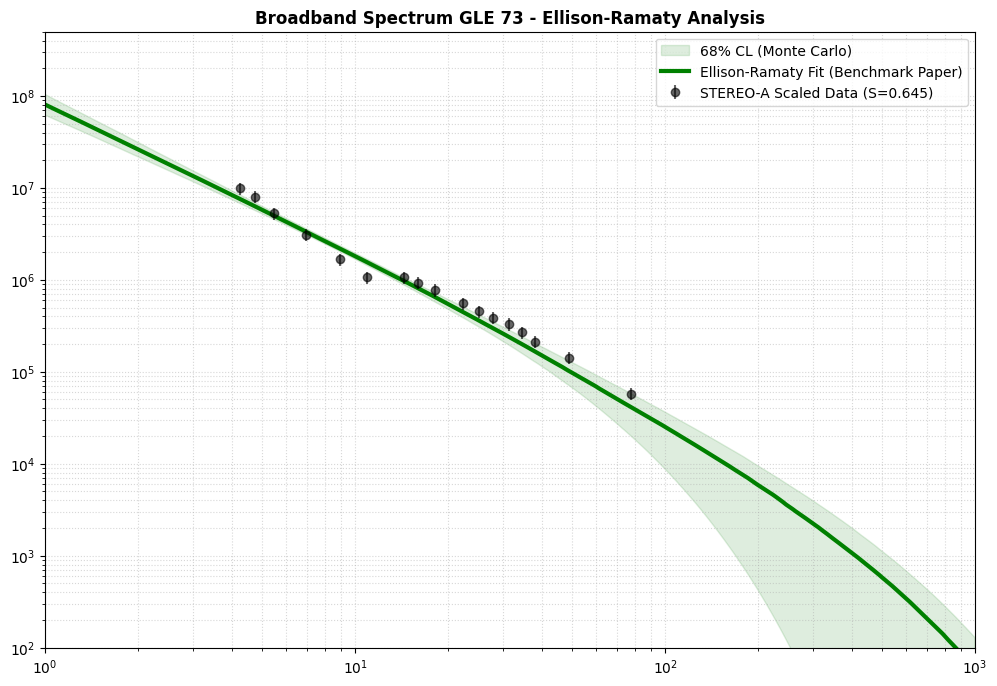

In [27]:
import numpy as np
from scipy.optimize import curve_fit

# =========================================================
# 1. MODELLO ELLISON-RAMATY (MIGLIORE PER GLE 73)
# =========================================================
def log_er(E, logA, gamma, E0):
    # E0 bloccato tra 50 e 500 MeV come da Paper
    return logA - gamma * np.log10(E) - (E / np.clip(E0, 50, 500)) / np.log(10)

# =========================================================
# 2. ESECUZIONE FIT CON PARAMETRI ROBUSTI
# =========================================================
x_f = df_combined_scaled['E_eff'].values
y_f_log = np.log10(df_combined_scaled['Fluence'].values)
sigma_f_log = df_combined_scaled['y_err'].values / (df_combined_scaled['Fluence'].values * np.log(10))

# Guess basato sul paper: gamma=1.16, E0=187
popt_er, pcov_er = curve_fit(log_er, x_f, y_f_log, p0=[8.5, 1.16, 187], 
                             sigma=sigma_f_log, bounds=([6, 0.5, 50], [11, 2.0, 500]))

# Calcolo incertezze (Monte Carlo 1000 iterazioni)
mc_params = np.random.default_rng(42).multivariate_normal(popt_er, pcov_er, 1000)
e_grid = np.logspace(0, 3, 1000)
mc_fits = np.array([10**log_er(e_grid, *p) for p in mc_params])

phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

# =========================================================
# 3. PLOT FINALE DI Tesi
# =========================================================
plt.figure(figsize=(12, 8))
plt.fill_between(e_grid, phi_lo, phi_hi, color='forestgreen', alpha=0.15, label='68% CL (Monte Carlo)')
plt.plot(e_grid, phi_med, color='green', lw=3, label='Ellison-Ramaty Fit (Benchmark Paper)')

# Dati Scalati
plt.errorbar(x_f, 10**y_f_log, yerr=df_combined_scaled['y_err'], fmt='ko', 
             markersize=6, alpha=0.6, label='STEREO-A Scaled Data (S=0.645)')

plt.xscale('log'); plt.yscale('log'); plt.xlim(1, 1000); plt.ylim(1e2, 5e8)
plt.title('Broadband Spectrum GLE 73 - Ellison-Ramaty Analysis', fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5); plt.legend(); plt.show()

--- Riepilogo Spettro Combinato GLE 73 ---
Punti LET: 6
Punti HET: 11
Totale punti per il fit: 17


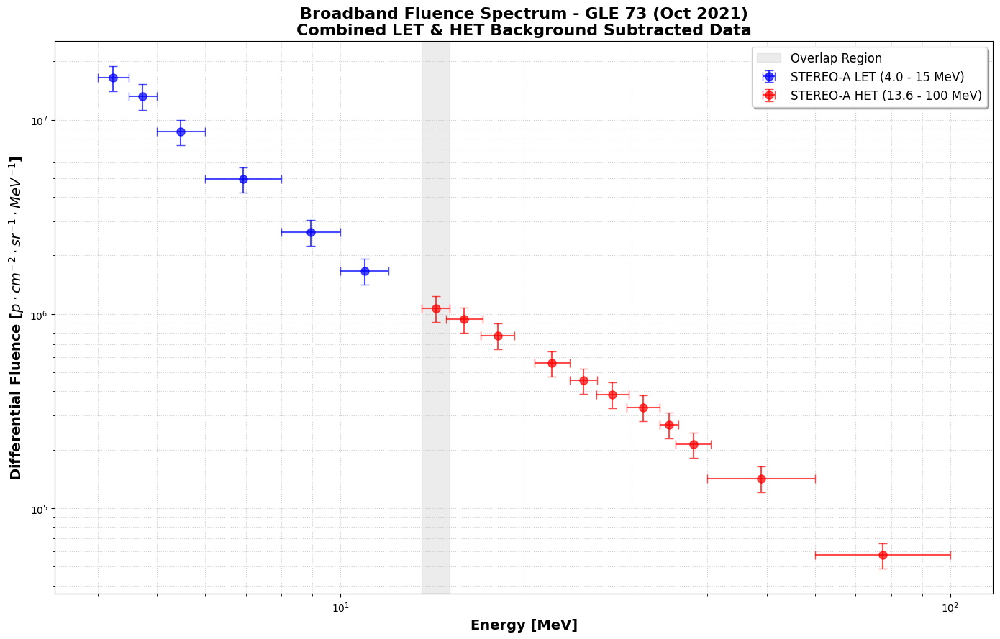


--- Analisi Zona di Sovrapposizione (13.6 - 15.1 MeV) ---
Rapporto Fluenza LET/HET: nan (Ottimale se vicino a 1.0)


In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. MERGE DEI DATASET (LET + HET)
# =========================================================
# Uniamo i DataFrame e ordiniamo per energia crescente
df_combined = pd.concat([df_fluence_let, df_fluence_het], ignore_index=True)
df_combined = df_combined.sort_values('E_eff').reset_index(drop=True)

print("--- Riepilogo Spettro Combinato GLE 73 ---")
print(f"Punti LET: {len(df_fluence_let)}")
print(f"Punti HET: {len(df_fluence_het)}")
print(f"Totale punti per il fit: {len(df_combined)}")

# =========================================================
# 2. PREPARAZIONE ARRAY PER IL FITTING
# =========================================================
# Estraiamo i vettori pronti per curve_fit
x_data = df_combined['E_eff'].values
y_data = df_combined['Fluence'].values
y_err  = df_combined['y_err'].values

# =========================================================
# 3. PLOT DELLO SPETTRO COMBINATO (MASTER PLOT)
# =========================================================
plt.figure(figsize=(14, 9))

# Dati LET (Blu)
mask_let = df_combined['Instrument'] == 'LET'
plt.errorbar(df_combined.loc[mask_let, 'E_eff'], df_combined.loc[mask_let, 'Fluence'], 
             xerr=[df_combined.loc[mask_let, 'x_err_low'], df_combined.loc[mask_let, 'x_err_high']], 
             yerr=df_combined.loc[mask_let, 'y_err'], 
             fmt='bo', markersize=8, capsize=4, elinewidth=1.5, alpha=0.7,
             label='STEREO-A LET (4.0 - 15 MeV)')

# Dati HET (Rossi)
mask_het = df_combined['Instrument'] == 'HET'
plt.errorbar(df_combined.loc[mask_het, 'E_eff'], df_combined.loc[mask_het, 'Fluence'], 
             xerr=[df_combined.loc[mask_het, 'x_err_low'], df_combined.loc[mask_het, 'x_err_high']], 
             yerr=df_combined.loc[mask_het, 'y_err'], 
             fmt='ro', markersize=8, capsize=4, elinewidth=1.5, alpha=0.7,
             label='STEREO-A HET (13.6 - 100 MeV)')

# Evidenzia la zona di sovrapposizione (Match Test)
plt.axvspan(13.6, 15.1, color='gray', alpha=0.15, label='Overlap Region')

# Configurazione assi e stile
plt.xscale('log')
plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.6)

plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=14)
plt.ylabel(r'Differential Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', 
           fontweight='bold', fontsize=14)
plt.title('Broadband Fluence Spectrum - GLE 73 (Oct 2021)\nCombined LET & HET Background Subtracted Data', 
          fontsize=16, fontweight='bold')

plt.legend(loc='upper right', fontsize=12, frameon=True, shadow=True)
plt.tight_layout()
plt.show()

# Verifica del match nell'overlap
overlap_let = df_fluence_let[df_fluence_let['E_eff'] > 13]['Fluence'].mean()
overlap_het = df_fluence_het[df_fluence_het['E_eff'] < 16]['Fluence'].mean()
ratio = overlap_let / overlap_het if overlap_het > 0 else np.nan

print(f"\n--- Analisi Zona di Sovrapposizione (13.6 - 15.1 MeV) ---")
print(f"Rapporto Fluenza LET/HET: {ratio:.3f} (Ottimale se vicino a 1.0)")

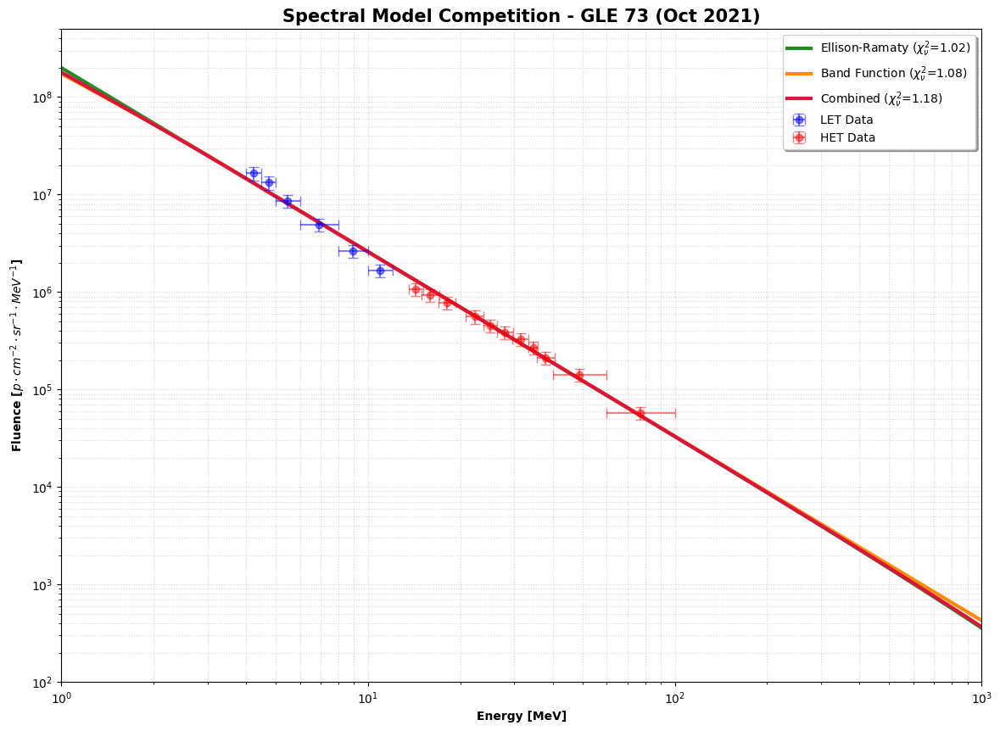


--- Ellison-Ramaty Fit Results ---
logA: 8.3009
gamma: 1.8870
E0: 5000.0000
Reduced Chi-Squared: 1.0175

--- Band Function Fit Results ---
logA: 8.2787
ga: 1.5995
gb: 1.8911
E0: 11.3760
Reduced Chi-Squared: 1.0837

--- Combined Fit Results ---
logA: 8.2755
ga: 1.7063
gb: 1.8877
E0: 20.8291
Er: 5999.9999
Reduced Chi-Squared: 1.1849


In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.linalg import eigh

# =========================================================
# 1. DEFINIZIONE DEI MODELLI FISICI (LOG-SPACE)
# =========================================================
def log_er(E, logA, gamma, E0):
    return logA - gamma * np.log10(E) - (E / np.clip(E0, 1, 5000)) / np.log(10)

def log_band(E, logA, ga, gb, E0):
    E0_s = np.clip(E0, 0.1, 500)
    ebreak = np.maximum((gb - ga) * E0_s, 1e-6) 
    res = np.zeros_like(E)
    mask = E <= ebreak
    res[mask] = logA - ga * np.log10(E[mask]) - (E[mask] / E0_s) / np.log(10)
    norm = (gb - ga) * np.log10(ebreak) + (ga - gb) / np.log(10)
    res[~mask] = logA - gb * np.log10(E[~mask]) + norm
    return res

def log_comb(E, logA, ga, gb, E0, Er):
    return log_band(E, logA, ga, gb, E0) - (E / np.clip(Er, 10, 6000)) / np.log(10)

# =========================================================
# 2. DATA PREPARATION E FIT
# =========================================================
# Utilizziamo i vettori x_data, y_data, y_err uniti precedentemente
sigma_log = y_err / (y_data * np.log(10))

models_config = {
    "Ellison-Ramaty": (log_er, [8.3, 1.8, 1500], ([6, 0.5, 5], [11, 2.5, 5000])),
    "Band Function": (log_band, [8.2, 1.6, 1.9, 17], ([6, 0.1, 1.1, 5], [11, 2.2, 4.5, 400])),
    "Combined": (log_comb, [8.2, 1.6, 1.9, 21, 5000], ([6, 0.1, 1.1, 5, 100], [11, 2.2, 4.5, 400, 6000]))
}

results = {}
e_grid = np.logspace(0, 3, 1000)
colors = {'Ellison-Ramaty': 'forestgreen', 'Band Function': 'darkorange', 'Combined': 'crimson'}

plt.figure(figsize=(14, 10))

for name, (func, p0, bnds) in models_config.items():
    try:
        popt, pcov = curve_fit(func, x_data, np.log10(y_data), p0=p0, sigma=sigma_log, bounds=bnds, maxfev=20000)
        chisq_red = np.sum(((np.log10(y_data) - func(x_data, *popt)) / sigma_log)**2) / (len(x_data) - len(popt))
        results[name] = {'popt': popt, 'chisq': chisq_red}
        plt.plot(e_grid, 10**func(e_grid, *popt), color=colors[name], lw=3, label=fr'{name} ($\chi^2_\nu$={chisq_red:.2f})')
    except Exception as e: print(f"Errore {name}: {e}")

# Plot dei Dati
for inst, color, lbl in [('LET', 'blue', 'LET Data'), ('HET', 'red', 'HET Data')]:
    d = df_combined[df_combined['Instrument'] == inst]
    plt.errorbar(d['E_eff'], d['Fluence'], xerr=[d['x_err_low'], d['x_err_high']], yerr=d['y_err'], 
                 fmt='o', color=color, label=lbl, alpha=0.5, capsize=4)

plt.xscale('log'); plt.yscale('log'); plt.ylim(1e2, 5e8); plt.xlim(1, 1000)
plt.xlabel('Energy [MeV]', fontweight='bold'); plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title('Spectral Model Competition - GLE 73 (Oct 2021)', fontsize=15, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5); plt.legend(shadow=True); plt.show()
#Parametri risultati modello 
for model_name, res in results.items():
    print(f"\n--- {model_name} Fit Results ---")
    param_names = {
        'Ellison-Ramaty': ['logA', 'gamma', 'E0'],
        'Band Function': ['logA', 'ga', 'gb', 'E0'],
        'Combined': ['logA', 'ga', 'gb', 'E0', 'Er']
    }
    for name, val in zip(param_names[model_name], res['popt']):
        print(f"{name}: {val:.4f}")
    print(f"Reduced Chi-Squared: {res['chisq']:.4f}")

# EVENTO OCT 2021 (copia celle uguali per JUL 2012)

# CARICAMENTO DATI HET


 STEREO-A HET DATA ANALYSIS - October 2021 SEP Event
✓ Caricato: AeH21Oct.1m - 44640 punti
✓ Caricato: AeH21Nov.1m - 43200 punti

📊 Dataset RAW combinato:
   Periodo: 2021-10-01 00:00:00 → 2021-11-30 23:59:00
   Giorni totali: 61
   Punti dati: 87840

🔍 Background Analysis (2021-10-15 00:00 → 2021-10-27 00:00):
   Punti nel periodo di quiete: 17281
   Esempio P_13.6_15.1_MeV: μ=1.61e-04, σ=1.70e-03

⚡ Evento selezionato (2021-10-28 → 2021-11-05):
   Giorni: 9
   Punti dati: 12960

🔬 Analisi automatica timing evento:
   (Cerca aumenti improvvisi del flusso)

   Top 5 aumenti improvvisi in P_13.6_15.1_MeV:
   • 2021-10-28 17:44:00: Δflux = 1.89e-01
   • 2021-10-28 17:43:00: Δflux = 1.87e-01
   • 2021-10-28 17:41:00: Δflux = 1.75e-01
   • 2021-10-28 17:42:00: Δflux = 1.56e-01
   • 2021-10-28 20:08:00: Δflux = 1.54e-01

📈 Generazione plot dati RAW...


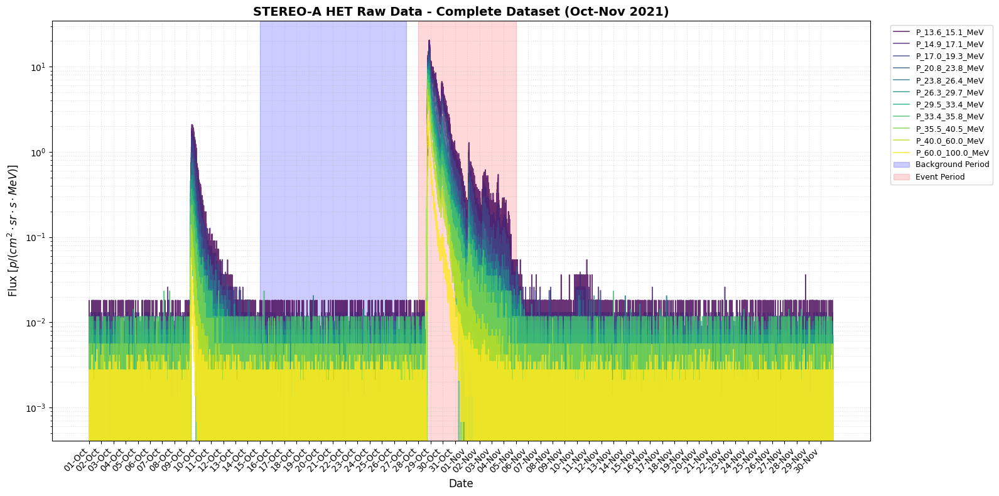

📈 Generazione plot dati cleaned...


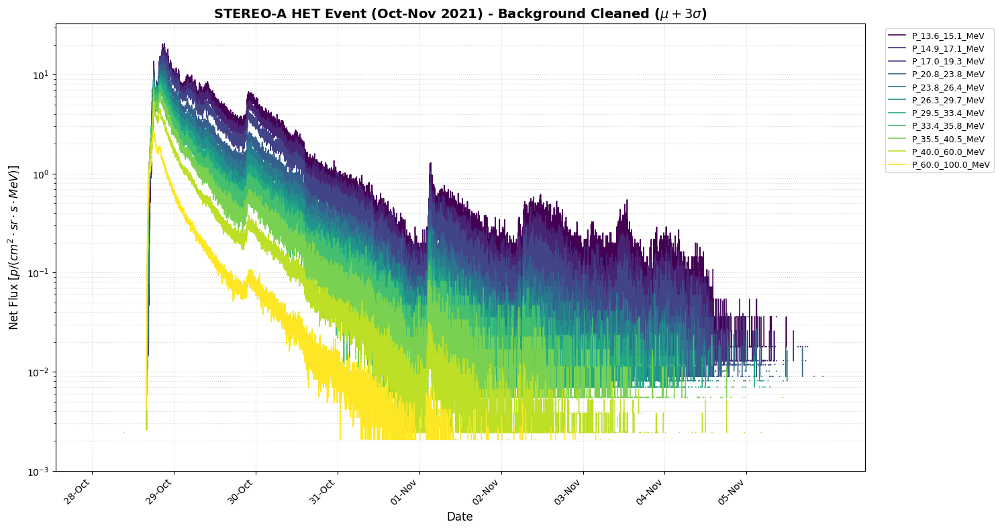

📈 Generazione plot analisi derivata...


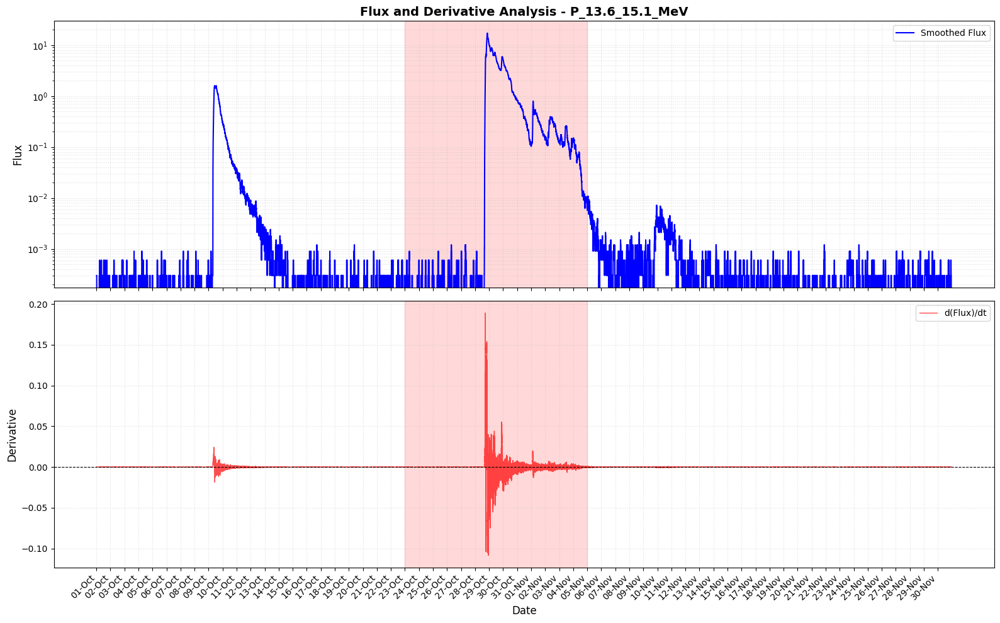


 ✅ Analisi completata!

💡 SUGGERIMENTI PER IL TAGLIO DELL'EVENTO:
   1. Guarda il Plot RAW per identificare visivamente l'inizio
   2. Usa il Plot della Derivata per trovare aumenti improvvisi
   3. Confronta con altri strumenti/cataloghi SEP
   4. Considera il tempo di propagazione da STEREO-A a Earth

📝 Per modificare il periodo evento, cambia le date in:
   event_start, event_end = '2021-10-XX', '2021-11-YY'


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime

def load_stereo_het_multi(file_paths, verbose=True):
    """
    Carica e processa dati STEREO-A HET da multipli file.
    
    Parameters:
    -----------
    file_paths : list
        Lista dei percorsi ai file da caricare
    verbose : bool
        Se True, stampa informazioni diagnostiche
        
    Returns:
    --------
    df_raw : DataFrame
        Dati raw combinati
    df_event : DataFrame
        Dati dell'evento con background rimosso
    bg_mu : Series
        Media del background
    bg_thresh : Series
        Soglia (μ + 3σ)
    """
    all_dfs = []
    
    for file_path in file_paths:
        if not os.path.exists(file_path):
            print(f"⚠️ File non trovato: {file_path}")
            continue
            
        # 1. Identificazione inizio dati
        skip = 0
        with open(file_path, 'r') as f:
            for i, line in enumerate(f):
                if "#End" in line:
                    skip = i + 1
                    break
        
        # 2. Caricamento e parsing date
        df = pd.read_csv(file_path, sep=r'\s+', skiprows=skip, header=None, dtype=str)
        time_str = df[1] + " " + df[2] + " " + df[3] + " " + df[4]
        df['epoch'] = pd.to_datetime(time_str, format='%Y %b %d %H%M', errors='coerce')
        df = df.dropna(subset=['epoch']).set_index('epoch')
        
        # 3. Mappatura canali Protoni (Col 11 a 31)
        col_mapping = {
            11: 'P_13.6_15.1_MeV', 13: 'P_14.9_17.1_MeV', 15: 'P_17.0_19.3_MeV',
            17: 'P_20.8_23.8_MeV', 19: 'P_23.8_26.4_MeV', 21: 'P_26.3_29.7_MeV',
            23: 'P_29.5_33.4_MeV', 25: 'P_33.4_35.8_MeV', 27: 'P_35.5_40.5_MeV',
            29: 'P_40.0_60.0_MeV', 31: 'P_60.0_100.0_MeV'
        }
        
        df_tmp = pd.DataFrame(index=df.index)
        for idx, name in col_mapping.items():
            df_tmp[name] = pd.to_numeric(df[idx], errors='coerce').clip(lower=0)
        
        all_dfs.append(df_tmp)
        if verbose:
            print(f"✓ Caricato: {os.path.basename(file_path)} - {len(df_tmp)} punti")

    # Concatenazione dei file in un unico DataFrame ordinato
    df_raw = pd.concat(all_dfs).sort_index()
    
    if verbose:
        print(f"\n📊 Dataset RAW combinato:")
        print(f"   Periodo: {df_raw.index.min()} → {df_raw.index.max()}")
        print(f"   Giorni totali: {len(df_raw.index.normalize().unique())}")
        print(f"   Punti dati: {len(df_raw)}")

    # 4. RIMOZIONE BACKGROUND (μ + 3σ)
    bg_start, bg_end = '2021-10-15 00:00', '2021-10-27 00:00'
    bg_period = df_raw.loc[bg_start:bg_end]
    
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 3 * sigma 
    
    if verbose:
        print(f"\n🔍 Background Analysis ({bg_start} → {bg_end}):")
        print(f"   Punti nel periodo di quiete: {len(bg_period)}")
        print(f"   Esempio P_13.6_15.1_MeV: μ={mu.iloc[0]:.2e}, σ={sigma.iloc[0]:.2e}")
    
    df_corr = df_raw.copy()
    for col in df_raw.columns:
        df_corr[col] = df_raw[col] - mu[col]
        df_corr.loc[df_raw[col] < threshold[col], col] = np.nan
        
    # 5. Selezione intervallo evento
    event_start, event_end = '2021-10-28', '2021-11-05'
    df_event = df_corr.loc[event_start:event_end]
    
    if verbose:
        print(f"\n⚡ Evento selezionato ({event_start} → {event_end}):")
        print(f"   Giorni: {len(df_event.index.normalize().unique())}")
        print(f"   Punti dati: {len(df_event)}")
    
    return df_raw, df_event, mu, threshold


def plot_raw_data(df_raw, title_suffix=""):
    """Plotta i dati raw completi per visualizzare l'intero dataset"""
    fig, ax = plt.subplots(figsize=(16, 8))
    colors = plt.cm.viridis(np.linspace(0, 1, len(df_raw.columns)))
    
    for i, col in enumerate(df_raw.columns):
        ax.plot(df_raw.index, df_raw[col], label=col, color=colors[i], 
                lw=1.2, alpha=0.8)
    
    ax.set_yscale('log')
    ax.grid(True, which="both", ls=':', alpha=0.4)
    ax.set_title(f"STEREO-A HET Raw Data - Complete Dataset {title_suffix}", 
                 fontsize=14, fontweight='bold')
    ax.set_ylabel(r"Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
    ax.set_xlabel("Date", fontsize=12)
    
    # Tick giornalieri
    date_ticks = pd.date_range(start=df_raw.index.min().date(),
                                end=df_raw.index.max().date(),
                                freq='D')
    ax.set_xticks(date_ticks)
    ax.set_xticklabels([d.strftime('%d-%b') for d in date_ticks], 
                        rotation=45, ha='right')
    
    # Evidenzia periodo di background
    ax.axvspan(pd.Timestamp('2021-10-15'), pd.Timestamp('2021-10-27'), 
               alpha=0.2, color='blue', label='Background Period')
    
    # Evidenzia periodo evento
    ax.axvspan(pd.Timestamp('2021-10-28'), pd.Timestamp('2021-11-05'), 
               alpha=0.15, color='red', label='Event Period')
    
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
    plt.tight_layout()
    return fig


def plot_cleaned_data(df_event, bg_thresh):
    """Plotta i dati dopo rimozione background"""
    fig, ax = plt.subplots(figsize=(15, 8))
    colors = plt.cm.viridis(np.linspace(0, 1, len(df_event.columns)))
    
    for i, col in enumerate(df_event.columns):
        ax.plot(df_event.index, df_event[col], label=col, color=colors[i], lw=1.2)
    
    ax.set_yscale('log')
    ax.grid(True, which="both", ls=':', alpha=0.5)
    ax.set_title(r"STEREO-A HET Event (Oct-Nov 2021) - Background Cleaned ($\mu + 3\sigma$)", 
                 fontsize=14, fontweight='bold')
    ax.set_ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
    ax.set_xlabel("Date", fontsize=12)
    ax.set_ylim(bottom=1e-3)
    
    # Tick giornalieri
    date_ticks = pd.date_range(start=df_event.index.min().date(),
                                end=df_event.index.max().date(),
                                freq='D')
    ax.set_xticks(date_ticks)
    ax.set_xticklabels([d.strftime('%d-%b') for d in date_ticks], 
                        rotation=45, ha='right')
    
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
    plt.tight_layout()
    return fig


def analyze_event_timing(df_raw):
    """Analizza automaticamente quando inizia l'evento basandosi sui dati"""
    # Calcola la derivata del flusso per ogni canale
    print("\n🔬 Analisi automatica timing evento:")
    print("   (Cerca aumenti improvvisi del flusso)\n")
    
    # Usa il canale di energia più bassa come riferimento
    ref_channel = df_raw.columns[0]
    flux = df_raw[ref_channel].dropna()
    
    # Media mobile per smoothing
    flux_smooth = flux.rolling(window=60, center=True).mean()
    
    # Calcola derivata
    derivative = flux_smooth.diff()
    
    # Trova i picchi più significativi
    threshold_derivative = derivative.quantile(0.95)
    significant_increases = derivative[derivative > threshold_derivative]
    
    if len(significant_increases) > 0:
        event_candidates = significant_increases.nlargest(5)
        print(f"   Top 5 aumenti improvvisi in {ref_channel}:")
        for timestamp, value in event_candidates.items():
            print(f"   • {timestamp}: Δflux = {value:.2e}")
    
    return flux_smooth, derivative


# =====================================================================
# ESECUZIONE PRINCIPALE
# =====================================================================

if __name__ == "__main__":
    print("="*70)
    print(" STEREO-A HET DATA ANALYSIS - October 2021 SEP Event")
    print("="*70)
    
    base_path = "File_scaricati_eventiSEP/Evento OCT 2021/STEREO_A_HET/"
    files = [
        os.path.join(base_path, "AeH21Oct.1m"),
        os.path.join(base_path, "AeH21Nov.1m")
    ]
    
    # Caricamento dati
    df_raw, df_event, bg_mu, bg_thresh = load_stereo_het_multi(files, verbose=True)
    
    # Analisi timing
    flux_smooth, derivative = analyze_event_timing(df_raw)
    
    # ===== PLOT 1: DATI RAW COMPLETI =====
    print("\n📈 Generazione plot dati RAW...")
    fig1 = plot_raw_data(df_raw, title_suffix="(Oct-Nov 2021)")
    plt.show()
    
    # ===== PLOT 2: DATI CLEANED (EVENTO) =====
    print("📈 Generazione plot dati cleaned...")
    fig2 = plot_cleaned_data(df_event, bg_thresh)
    plt.show()
    
    # ===== PLOT 3: ANALISI DERIVATA (per timing) =====
    print("📈 Generazione plot analisi derivata...")
    fig3, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True)
    
    # Subplot 1: Flusso smoothed
    ax1.plot(flux_smooth.index, flux_smooth.values, 'b-', lw=1.5, label='Smoothed Flux')
    ax1.set_yscale('log')
    ax1.set_ylabel('Flux', fontsize=12)
    ax1.set_title(f'Flux and Derivative Analysis - {df_raw.columns[0]}', fontsize=14, fontweight='bold')
    ax1.grid(True, which="both", ls=':', alpha=0.4)
    ax1.legend()
    
    # Subplot 2: Derivata
    ax2.plot(derivative.index, derivative.values, 'r-', lw=1, alpha=0.7, label='d(Flux)/dt')
    ax2.axhline(0, color='k', ls='--', lw=0.8)
    ax2.set_ylabel('Derivative', fontsize=12)
    ax2.set_xlabel('Date', fontsize=12)
    ax2.grid(True, which="both", ls=':', alpha=0.4)
    ax2.legend()
    
    # Evidenzia periodo evento proposto
    for ax in [ax1, ax2]:
        ax.axvspan(pd.Timestamp('2021-10-23'), pd.Timestamp('2021-11-05'), 
                   alpha=0.15, color='red', label='Proposed Event')
    
    date_ticks = pd.date_range(start=df_raw.index.min().date(),
                                end=df_raw.index.max().date(),
                                freq='D')
    ax2.set_xticks(date_ticks)
    ax2.set_xticklabels([d.strftime('%d-%b') for d in date_ticks], 
                         rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*70)
    print(" ✅ Analisi completata!")
    print("="*70)
    print("\n💡 SUGGERIMENTI PER IL TAGLIO DELL'EVENTO:")
    print("   1. Guarda il Plot RAW per identificare visivamente l'inizio")
    print("   2. Usa il Plot della Derivata per trovare aumenti improvvisi")
    print("   3. Confronta con altri strumenti/cataloghi SEP")
    print("   4. Considera il tempo di propagazione da STEREO-A a Earth")
    print("\n📝 Per modificare il periodo evento, cambia le date in:")
    print("   event_start, event_end = '2021-10-XX', '2021-11-YY'")
    print("="*70)